In [1]:
!pip install scikit-optimize

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

import statsmodels.stats.api as sms
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 

In [3]:
import warnings
warnings.filterwarnings("ignore")

# Functions

In [4]:
from sklearn import metrics

def mae(y_gt, Y_pr):
    return metrics.mean_absolute_error(y_gt, Y_pr)

def mse(y_gt, Y_pr):
    return metrics.mean_squared_error(y_gt, Y_pr)

def rmse(y_gt, Y_pr):
    my_mse = mse(y_gt, Y_pr)
    return np.sqrt(my_mse)

def medae(y_gt, Y_pr):
    return metrics.median_absolute_error(y_gt, Y_pr)

def R2(y_gt, Y_pr):
    return metrics.r2_score(y_gt, Y_pr)

def calc_metrics(true, pred):

    mse1 = mse(true, pred)

    rmse1 = rmse(true, pred)

    mae1 = mae(true, pred)

    medae1 = medae(true, pred)

    R21 = R2(true, pred)

    print('*** VAL **: ')
    print("MSE:   {}\nRMSE:  {}\nR2:    {}\nMAE:   {}\nMedAE: {}".format(mse1, rmse1, R21, mae1, medae1))
    print('-'*30)

In [5]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [6]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [7]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [8]:
def get_feature_imp(model, X_train):
    imp = model.get_feature_importance(data=X_train)
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    axes.barh(width=imp, y=model.feature_names_)
    axes.set_title('Finetuned Catboost feature importance')
    plt.show()

# Unhashing

In [9]:
genre_mapping = {'0ef0aa70-f86c-4141-8054-8b39af97867d': 'Biography',
                '287a1485-7a88-4c2f-bc94-ca418b6c47a1': 'Cartoons',
                '66fad8c3-d84f-458d-a8bf-5b4f154969e0': 'Show',
                '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Theater',
                '9fa28b61-a257-4a3e-945b-a9ef76a146d6': 'Fantasy',
                'b0836a1d-635f-4d89-bcc5-25d10ba56642': 'Anime',
                'd7214feb-8c11-4aea-aabb-ac98a8d56fd5': 'History',
                'dc65dbc8-34ba-4df1-b32c-4f895e10bff8': 'Shorts',
                'eb001d27-5be3-4d42-9d88-90d593f2627d': 'War_movies',
                '364fdc2e-bdfe-40be-b2c5-d30f43ec432e': 'Crime',
                '1f22ccf1-288a-4e6e-b39a-7502799e7125': 'Лекции',
                '6d640e04-be3a-4c8c-852e-4e9b12449d5d': 'Концерты',
                '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Театр',
                '2f7908cc-e2fd-43cf-b626-ec1aef436160': 'Курсы'}

In [10]:
import pickle

with open('./NEW_OKKO_KINOP_parsed_ratings_df.pkl', 'rb') as f:
    df = pickle.load(f, encoding='utf-8')

In [11]:
df.shape

(10731, 27)

In [12]:
all_genres = []

for item_genres in df['genre']:
    all_genres.extend(item_genres)

In [13]:
all_unique_genres = set(all_genres)

In [14]:
len(all_unique_genres)

33

In [15]:
all_unique_genres

{'0ef0aa70-f86c-4141-8054-8b39af97867d',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 '287a1485-7a88-4c2f-bc94-ca418b6c47a1',
 '364fdc2e-bdfe-40be-b2c5-d30f43ec432e',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 '5743ecbe-a141-47d6-a7d7-e800f41cb6f5',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 '66fad8c3-d84f-458d-a8bf-5b4f154969e0',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 '7b7c97f6-1adb-4b43-bfe8-9455812fac0b',
 '9fa28b61-a257-4a3e-945b-a9ef76a146d6',
 'Action',
 'Adventure',
 'ArtHouse',
 'Comedy',
 'Detective',
 'Documentary',
 'Drama',
 'Family',
 'ForKids',
 'Horror',
 'Humor',
 'Melodrama',
 'Music',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'Travel',
 'b0836a1d-635f-4d89-bcc5-25d10ba56642',
 'd7214feb-8c11-4aea-aabb-ac98a8d56fd5',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'dc65dbc8-34ba-4df1-b32c-4f895e10bff8',
 'eb001d27-5be3-4d42-9d88-90d593f2627d'}

In [16]:
decoded_genres = [genre_mapping.get(genre, genre) for genre in all_unique_genres]

In [17]:
decoded_genres

['Anime',
 'Crime',
 'Cartoons',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'Концерты',
 'Fantasy',
 'Лекции',
 'History',
 'Biography',
 'Humor',
 'Horror',
 'ArtHouse',
 'Thriller',
 'Melodrama',
 'ForKids',
 'Show',
 'Detective',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 '5743ecbe-a141-47d6-a7d7-e800f41cb6f5',
 'Shorts',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 'Sci-Fi',
 'Action',
 'Adventure',
 'Sport',
 'Comedy',
 'Drama',
 'Music',
 'Театр',
 'Documentary',
 'War_movies',
 'Family',
 'Travel']

# Preprocessing

In [18]:
prep_df = df.copy(deep=True)

In [19]:
prep_df.shape

(10731, 27)

In [20]:
prep_df.head(1).T

,0
age_access_type,12
name,Звёздный путь 5: Последний рубеж
director,[cff3362f-ad91-498d-80b3-ea3ab8ec65cf]
genre,"[Sci-Fi, Action, Thriller, Adventure]"
average_rating,6.21
type,MOVIE
country,[usa]
release_type,RELEASE
release_year,1989
duration,6420000.0


### filter by year

In [21]:
prep_df = prep_df[prep_df['release_year'] >= 2000]

### ohe

In [23]:
prep_df.dropna(subset=['ACTOR', 'COMPOSER',
                 'DESIGN', 'DIRECTOR', 
                 'EDITOR', 'OPERATOR', 
                 'PRODUCER', 'WRITER'], inplace=True)

prep_df.shape

(5579, 27)

In [22]:
def add_topN_feature(df, col, n: int):
    items = []
    
    for i in df[col]:
        items.extend(i)

    topN = [x[0] for x in Counter(items).most_common()][:n]
    df[f'top{n}{col}'] = df[col].apply(lambda x: [int(item in x) for item in topN])
    df.drop(col, axis=1, inplace=True)
    return topN, f'top{n}{col}'

def ohe_topN_features(df, topN, cat):
    for i in range(len(topN)):
        df[f'{topN[i]}'] = [item[i] for item in df[cat]]
    df.drop(cat, axis=1, inplace=True)
    return df

In [24]:
top10genres, name = add_topN_feature(prep_df, 'genre', 10)
prep_df = ohe_topN_features(prep_df, top10genres, name)

top5countries, name = add_topN_feature(prep_df, 'country', 5)
prep_df = ohe_topN_features(prep_df, top5countries, name)

top10actors, name = add_topN_feature(prep_df, 'ACTOR', 10)
prep_df = ohe_topN_features(prep_df, top10actors, name)

top3directors, name = add_topN_feature(prep_df, 'COMPOSER', 3)
prep_df = ohe_topN_features(prep_df, top3directors, name)

top2DESIGN, name = add_topN_feature(prep_df, 'DESIGN', 2)
prep_df = ohe_topN_features(prep_df, top2DESIGN, name)

top2DIRECTOR, name = add_topN_feature(prep_df, 'DIRECTOR', 2)
prep_df = ohe_topN_features(prep_df, top2DIRECTOR, name)

top2EDITOR, name = add_topN_feature(prep_df, 'EDITOR', 2)
prep_df = ohe_topN_features(prep_df, top2EDITOR, name)

top2OPERATOR, name = add_topN_feature(prep_df, 'OPERATOR', 2)
prep_df = ohe_topN_features(prep_df, top2OPERATOR, name)

top3PRODUCER, name = add_topN_feature(prep_df, 'PRODUCER', 3)
prep_df = ohe_topN_features(prep_df, top3PRODUCER, name)

top2WRITER, name = add_topN_feature(prep_df, 'WRITER', 2)
prep_df = ohe_topN_features(prep_df, top2WRITER, name)

In [25]:
prep_df.columns

Index(['age_access_type', 'name', 'director', 'average_rating', 'type',
       'release_type', 'release_year', 'duration', 'actor', 'element_uid',
       'BUDGET', 'MARKETING', 'RUS', 'USA', 'WORLD', 'element_id', 'rating',
       'Drama', 'Comedy', 'Thriller', 'Action',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Adventure', 'Melodrama',
       'Sci-Fi', 'Horror', '9fa28b61-a257-4a3e-945b-a9ef76a146d6', 'usa',
       'great-britain', 'russia', 'france', 'germany', 'Бернард Коллако',
       'Роджер Бреннер', 'Марк Фальво', 'Крис Уилсон', 'Джимми Стар',
       'Ласко Аткинс', 'Розмари Ховард', 'Кадролша Она Кароле', 'Ричард Прайс',
       'Дж.К. Симмонс', 'Марко Белтрами', 'Джон Дебни', 'Кристоф Бек',
       'Оливье Берио', 'Рави Бансал', 'Дэниэл Эттиэс', 'Адам Дэвидсон',
       'Крис Гилл', 'Майкл Кан', 'Джим Дено', 'Дариуш Вольски',
       'Харви Вайнштейн', 'Боб Вайнштейн', 'Адриан Политовски', 'Стэн Ли',
       'Люк Бессон'],
      dtype='object')

In [26]:
cols = ['age_access_type', 'name', 'type',
        'release_year', 'duration', 'element_uid',
       'BUDGET', 'MARKETING', 'RUS', 'USA', 'WORLD', 'element_id', 'rating',
       'Drama', 'Comedy', 'Thriller', 'Action',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Adventure', 'Melodrama',
       'Sci-Fi', 'Horror', '9fa28b61-a257-4a3e-945b-a9ef76a146d6', 'usa',
       'great-britain', 'russia', 'france', 'germany', 'Бернард Коллако',
       'Роджер Бреннер', 'Марк Фальво', 'Крис Уилсон', 'Джимми Стар',
       'Ласко Аткинс', 'Розмари Ховард', 'Кадролша Она Кароле', 'Ричард Прайс',
       'Дж.К. Симмонс', 'Марко Белтрами', 'Джон Дебни', 'Кристоф Бек',
       'Оливье Берио', 'Рави Бансал', 'Дэниэл Эттиэс', 'Адам Дэвидсон',
       'Крис Гилл', 'Майкл Кан', 'Джим Дено', 'Дариуш Вольски',
       'Харви Вайнштейн', 'Боб Вайнштейн', 'Адриан Политовски', 'Стэн Ли',
       'Люк Бессон']

In [27]:
prep_df = prep_df[cols]

In [28]:

skewed_num_features = ['duration', 'BUDGET', 'MARKETING', 'RUS', 'USA', 'WORLD',] 

In [29]:
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from sklearn.model_selection import train_test_split
# from spacy.tokenizer import Tokenizer
# from spacy.lang.en import English
# nlp = English()
import pandas as pd

class Preprocesser:
    def __init__(self, 
#                 mulpiple_cat_features: list,
                skewed_num_features: list,
               # text_features: list,
               # release_year_feature: str,
#                 mltpl_cat_n_top: dict
                ):
#         self.mulpiple_cat_features = mulpiple_cat_features
        self.skewed_num_features = skewed_num_features
        #self.text_features = text_features
#         self.mltpl_cat_n_top = mltpl_cat_n_top
       # self.release_year_feature = release_year_feature
        # self.tokenizer = Tokenizer(nlp.vocab)
        
    def __get_top_n_mltpl_cat_features(self, df_pr, col):
        all_cats = []
        for element_values in df_pr[col]:
            all_cats.extend(element_values)
        return Counter(all_cats).most_common(self.mltpl_cat_n_top[col])
            
    def __preprocess_mulpiple_cat_features(self, df_pr):
        for col in self.mulpiple_cat_features:
            feature_number = self.mltpl_cat_n_top[col]
            df_pr[[f'{col}_{i}' for i in range(feature_number)]] = pd.DataFrame(np.full((len(df), feature_number), np.nan))
            for i in df_pr.index:
                names = df_pr.loc[i, col]
                for k, name in enumerate(names[:int(feature_number)]):
                    df_pr.loc[i, f'{col}_{k}'] = name
            df_pr.drop(col, axis=1, inplace=True)

        return df_pr
    
    def __preprocess_skewed_num_features(self, df_pr):
        for col in self.skewed_num_features:
            df_pr[col] = df_pr[col].apply(lambda x: np.log1p(x))
        return df_pr
    
    def __preprocess_text_features(self, df_pr):
        for col in self.text_features:
            df_pr[col] = df_pr[col].apply(lambda x: self.tokenizer(x))
        return df_pr
            
    def preprocess(self,
                   df: pd.DataFrame):
        df_pr = df.copy()
#         df_pr = self.__preprocess_mulpiple_cat_features(df_pr)
        df_pr = self.__preprocess_skewed_num_features(df_pr)
        # df_pr = self.__preprocess_text_features(df_pr)
        
        return df_pr
        

In [30]:
preprocesser = Preprocesser(
#     mltpl_cat_features,
            skewed_num_features,
            #text_features,
#             mltpl_cat_n_top
)

In [31]:
df_pr = preprocesser.preprocess(prep_df)

In [32]:
df_pr.head().T

,5,6,12,14,17
age_access_type,6,16,16,6,16
name,Пламенное сердце,Роман с кукушкой,Звездный путь,Пес-самурай и город кошек,Стартрек: Бесконечность
type,MOVIE,MOVIE,MOVIE,MOVIE,MOVIE
release_year,2022,2021,2009,2022,2016
duration,15.523889,15.479437,15.846287,15.5347,15.789592
element_uid,ba6bec1a-3aa9-48c7-aa65-908c21627a12,a367ca50-ef7d-4a4c-b89a-c8692defa697,1ff9b60d-ffe3-4eb7-bd7a-eb697255b4fa,537ece24-2358-4108-a419-85cfd5952607,cfd40246-97f2-4b74-85e4-a46c3f9e6655
BUDGET,NaN,NaN,18.826146,NaN,19.035866
MARKETING,NaN,NaN,NaN,NaN,NaN
RUS,14.405929,NaN,15.231987,NaN,15.689514
USA,NaN,NaN,19.367423,NaN,18.88346


In [33]:
df_pr.isnull().sum()

age_access_type                            0
name                                       0
type                                       0
release_year                               0
duration                                   0
element_uid                                0
BUDGET                                  3363
MARKETING                               5365
RUS                                     2805
USA                                     3091
WORLD                                   1915
element_id                                 0
rating                                     0
Drama                                      0
Comedy                                     0
Thriller                                   0
Action                                     0
364fdc2e-bdfe-40be-b2c5-d30f43ec432e       0
Adventure                                  0
Melodrama                                  0
Sci-Fi                                     0
Horror                                     0
9fa28b61-a

In [34]:
df_pr['rating'] = df_pr['rating'].astype(float)

## Split

In [35]:
df_pr.columns

Index(['age_access_type', 'name', 'type', 'release_year', 'duration',
       'element_uid', 'BUDGET', 'MARKETING', 'RUS', 'USA', 'WORLD',
       'element_id', 'rating', 'Drama', 'Comedy', 'Thriller', 'Action',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Adventure', 'Melodrama',
       'Sci-Fi', 'Horror', '9fa28b61-a257-4a3e-945b-a9ef76a146d6', 'usa',
       'great-britain', 'russia', 'france', 'germany', 'Бернард Коллако',
       'Роджер Бреннер', 'Марк Фальво', 'Крис Уилсон', 'Джимми Стар',
       'Ласко Аткинс', 'Розмари Ховард', 'Кадролша Она Кароле', 'Ричард Прайс',
       'Дж.К. Симмонс', 'Марко Белтрами', 'Джон Дебни', 'Кристоф Бек',
       'Оливье Берио', 'Рави Бансал', 'Дэниэл Эттиэс', 'Адам Дэвидсон',
       'Крис Гилл', 'Майкл Кан', 'Джим Дено', 'Дариуш Вольски',
       'Харви Вайнштейн', 'Боб Вайнштейн', 'Адриан Политовски', 'Стэн Ли',
       'Люк Бессон'],
      dtype='object')

In [36]:
from sklearn.model_selection import train_test_split

sorted_df = df_pr.sort_values('release_year')

test = sorted_df[sorted_df['release_year'] == 2022]
train = sorted_df[sorted_df['release_year'] != 2022]

# for looking at samples
test_df = test.copy(deep=True)
train_df = train.copy(deep=True)

test.drop(['release_year', 'element_uid', 'element_id', 'name'], axis=1, inplace=True)
train.drop(['release_year', 'element_uid', 'element_id', 'name'], axis=1, inplace=True)

X_test, y_test = test.drop('rating', axis=1), test['rating']
X, y = train.drop('rating', axis=1), train['rating']
X_train, X_val, y_train, y_val = train_test_split(X, y,
                                                  test_size=0.1, 
                                                  shuffle=False)
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape


((4942, 49), (550, 49), (87, 49), (4942,), (550,), (87,))

### OHE

In [37]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(dtype='int8', handle_unknown='ignore')

enc_train = enc.fit_transform(X_train[['age_access_type', 'type']])

In [38]:
enc_train = pd.DataFrame(enc_train.toarray())

enc_train.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_train.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_train = X_train.merge(enc_train, on=X_train.index, how='left', sort=False)

In [39]:
enc_test = enc.transform(X_test[['age_access_type', 'type']])

enc_test = pd.DataFrame(enc_test.toarray())

enc_test.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_test.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_test = X_test.merge(enc_test, on=X_test.index, how='left', sort=False)

In [40]:
enc_val = enc.transform(X_val[['age_access_type', 'type']])

enc_val = pd.DataFrame(enc_val.toarray())

enc_val.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_val.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_val = X_val.merge(enc_val, on=X_val.index, how='left', sort=False)

### Model

In [41]:
import catboost as cat
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from scipy.stats import uniform, randint

In [42]:
X_train.head(1)

,key_0,duration,BUDGET,MARKETING,RUS,USA,WORLD,Drama,Comedy,Thriller,...,Стэн Ли,Люк Бессон,age_access_type_0,age_access_type_6,age_access_type_12,age_access_type_16,age_access_type_18,type_MOVIE,type_MP_MOVIE,type_SERIAL
0,505,15.646491,18.627695,17.511862,NaN,19.376365,19.659465,0,1,0,...,0,0,0,0,1,0,0,1,0,0


In [43]:
X_train.drop('key_0', inplace=True, axis=1)
X_test.drop('key_0', inplace=True, axis=1)
X_val.drop('key_0', inplace=True, axis=1)

In [44]:
train_dataset = cat.Pool(data=X_train,
                        label=y_train,
#                          cat_features=cat_features
                        )

test_dataset = cat.Pool(data=X_test, 
                        label=y_test,
#                          cat_features=cat_features
                       )

val_dataset = cat.Pool(X_val, y_val,
#                        cat_features=cat_features
                      )

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
#     'cat_features': cat_features
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=500,
    verbose=100,
    plot=False
)

Learning rate set to 0.065439
0:	learn: 0.9245469	test: 1.0846985	best: 1.0846985 (0)	total: 49.8ms	remaining: 49.7s
100:	learn: 0.6639879	test: 0.8896344	best: 0.8896344 (100)	total: 225ms	remaining: 2.01s
200:	learn: 0.6360626	test: 0.8802670	best: 0.8802670 (200)	total: 389ms	remaining: 1.55s
300:	learn: 0.6154480	test: 0.8811609	best: 0.8802371 (217)	total: 563ms	remaining: 1.31s
400:	learn: 0.5976426	test: 0.8803391	best: 0.8801795 (396)	total: 726ms	remaining: 1.08s
500:	learn: 0.5821565	test: 0.8800869	best: 0.8799166 (479)	total: 887ms	remaining: 884ms
600:	learn: 0.5680676	test: 0.8820985	best: 0.8799166 (479)	total: 1.05s	remaining: 701ms
700:	learn: 0.5552493	test: 0.8828710	best: 0.8799166 (479)	total: 1.22s	remaining: 519ms
800:	learn: 0.5422259	test: 0.8851623	best: 0.8799166 (479)	total: 1.38s	remaining: 343ms
900:	learn: 0.5307345	test: 0.8856175	best: 0.8799166 (479)	total: 1.54s	remaining: 169ms
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.8799

In [45]:
y_pred = cat_model.predict(test_dataset)

In [46]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   1.1829702753211198
RMSE:  1.0876443698751534
R2:    0.4789424960712413
MAE:   0.8270083866042384
MedAE: 0.68378780810386
------------------------------


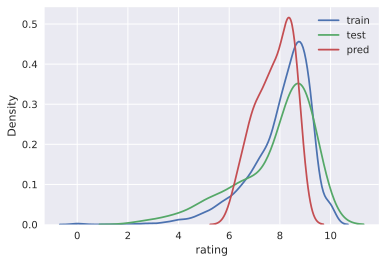

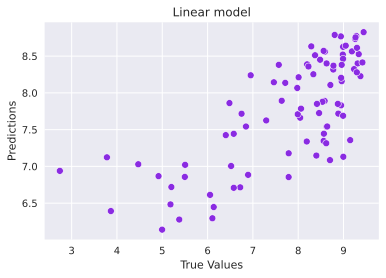

In [47]:
target_distr_linear(y_train, y_test, y_pred)   

In [48]:
cat_model.save_model('cat_reg_okko_ratings_ohe')

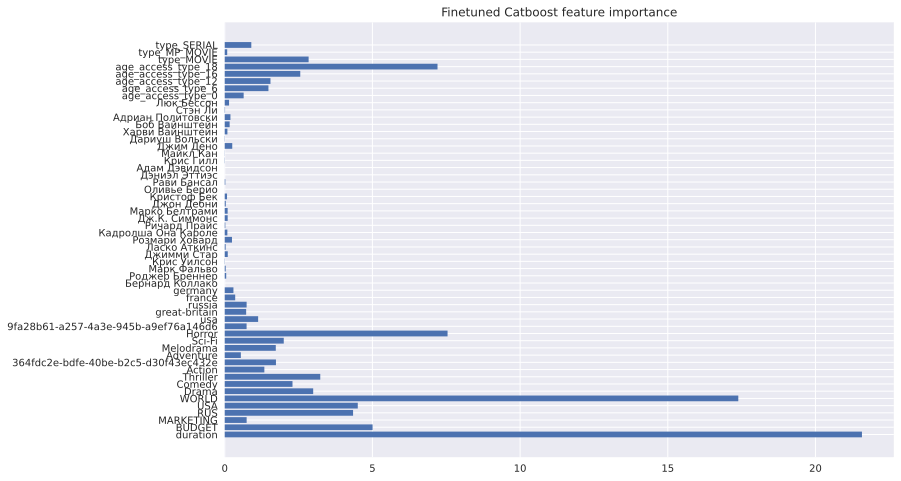

In [49]:
get_feature_imp(cat_model, train_dataset)

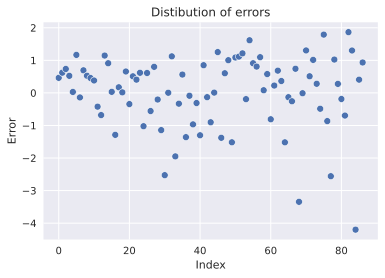

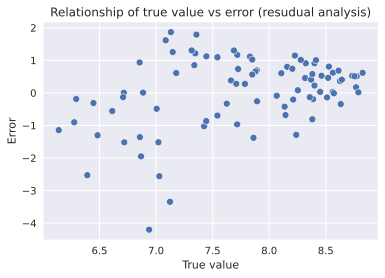

In [50]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

In [51]:
test_df['PREDS'] = y_pred.tolist()
test_df['TARGET'] = y_test.tolist()
test_df

,age_access_type,name,type,release_year,duration,element_uid,BUDGET,MARKETING,RUS,USA,...,Майкл Кан,Джим Дено,Дариуш Вольски,Харви Вайнштейн,Боб Вайнштейн,Адриан Политовски,Стэн Ли,Люк Бессон,PREDS,TARGET
10691,18,Милые обманщицы: Первородный грех,SERIAL,2022,17.184185,673a98a8-5d12-4a3d-9c50-d1d196a8fd96,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,8.521007,8.984211
10574,18,Время побеждать: Расцвет династии Лейкерс,SERIAL,2022,17.302886,ecde577f-39c1-49da-bce1-dc6eb6960130,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,8.563952,9.185185
10676,18,Хроники пышки,SERIAL,2022,16.558928,17f245d4-d2d2-46de-a974-d7cd427ad1b6,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,7.725283,8.460784
10641,18,Не оставляй меня,SERIAL,2022,17.044733,00de4f79-d52d-4d2c-871c-e6e8432cc3df,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,8.733555,9.258333
10675,18,Мы владеем этим городом,SERIAL,2022,16.831046,1bdf11b5-b9c1-4db6-bd70-c9f370fe2147,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,8.560697,8.589928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5651,16,Многоэтажка,MOVIE,2022,15.597220,19a61cc3-65ff-46ce-bf43-29c24a1cc9b6,NaN,NaN,5.793014,NaN,...,0,0,0,0,0,0,0,0,7.130801,8.996094
5612,18,Невидимый убийца,MOVIE,2022,15.684231,0d14e4b4-71ed-4409-9ebb-54a130e913c8,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,7.688398,8.990476
5518,16,Другое имя,MOVIE,2022,15.576811,69021740-65f7-430c-9c00-f2d6d9e9c702,NaN,NaN,10.364072,NaN,...,0,0,0,0,0,0,0,0,6.938951,2.739953
5269,16,RRR: Рядом ревет революция,MOVIE,2022,16.200597,1dbd646f-1c33-4584-b411-efc9da56c702,18.049617,NaN,10.485982,16.446375,...,0,0,0,0,0,0,0,0,8.642133,9.048994


# Tuning

In [52]:
train_dataset = cat.Pool(X_train, 
                         y_train,
#                          cat_features=cat_features
                        )

test_dataset = cat.Pool(X_test, 
                        y_test,
#                         cat_features=cat_features
                       )

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
#     'cat_features': cat_features
}

In [53]:
parameters_distr = {'depth': randint(3, 7),
              'learning_rate': uniform(0.01, 0.1),
              'iterations': [100, 1000, 5000]
             }

cat_model = cat.CatBoostRegressor(**cat_params)
grid = RandomizedSearchCV(estimator=cat_model, param_distributions=parameters_distr, 
                            cv=5, 
#                           n_jobs=-1,
                          verbose=3)

grid.fit(X_train, y_train)

import pickle
with open('bestimator_ratings_okko_tune', 'wb') as f:
    pickle.dump(grid.best_estimator_, f)
grid.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0:	learn: 0.9719709	total: 1.65ms	remaining: 164ms
1:	learn: 0.9621533	total: 3.25ms	remaining: 159ms
2:	learn: 0.9525605	total: 4.26ms	remaining: 138ms
3:	learn: 0.9431292	total: 5.23ms	remaining: 126ms
4:	learn: 0.9340933	total: 6.59ms	remaining: 125ms
5:	learn: 0.9258651	total: 8.02ms	remaining: 126ms
6:	learn: 0.9178390	total: 8.82ms	remaining: 117ms
7:	learn: 0.9106812	total: 9.61ms	remaining: 111ms
8:	learn: 0.9017520	total: 10.4ms	remaining: 105ms
9:	learn: 0.8952589	total: 11.2ms	remaining: 100ms
10:	learn: 0.8891841	total: 11.9ms	remaining: 96.4ms
11:	learn: 0.8837557	total: 13.4ms	remaining: 98.5ms
12:	learn: 0.8764160	total: 14.3ms	remaining: 95.7ms
13:	learn: 0.8701732	total: 15.1ms	remaining: 92.9ms
14:	learn: 0.8635028	total: 15.9ms	remaining: 90.3ms
15:	learn: 0.8588385	total: 16.7ms	remaining: 87.8ms
16:	learn: 0.8530048	total: 17.5ms	remaining: 85.3ms
17:	learn: 0.8482280	total: 18.2ms	remaining: 83ms
18:	lea

69:	learn: 0.7200163	total: 60.1ms	remaining: 25.8ms
70:	learn: 0.7192622	total: 60.9ms	remaining: 24.9ms
71:	learn: 0.7185432	total: 61.6ms	remaining: 24ms
72:	learn: 0.7176586	total: 62.4ms	remaining: 23.1ms
73:	learn: 0.7169913	total: 63.2ms	remaining: 22.2ms
74:	learn: 0.7161835	total: 64ms	remaining: 21.3ms
75:	learn: 0.7156890	total: 64.7ms	remaining: 20.4ms
76:	learn: 0.7150137	total: 65.5ms	remaining: 19.6ms
77:	learn: 0.7142491	total: 66.2ms	remaining: 18.7ms
78:	learn: 0.7137517	total: 67ms	remaining: 17.8ms
79:	learn: 0.7131962	total: 67.8ms	remaining: 16.9ms
80:	learn: 0.7128032	total: 68.5ms	remaining: 16.1ms
81:	learn: 0.7120102	total: 69.3ms	remaining: 15.2ms
82:	learn: 0.7114233	total: 70ms	remaining: 14.3ms
83:	learn: 0.7111401	total: 70.8ms	remaining: 13.5ms
84:	learn: 0.7105802	total: 71.6ms	remaining: 12.6ms
85:	learn: 0.7098916	total: 72.3ms	remaining: 11.8ms
86:	learn: 0.7093632	total: 72.9ms	remaining: 10.9ms
87:	learn: 0.7089403	total: 73.7ms	remaining: 10ms
88:

44:	learn: 0.7406109	total: 45ms	remaining: 55.1ms
45:	learn: 0.7389530	total: 45.8ms	remaining: 53.8ms
46:	learn: 0.7374958	total: 46.5ms	remaining: 52.5ms
47:	learn: 0.7363846	total: 47.3ms	remaining: 51.3ms
48:	learn: 0.7351986	total: 48.1ms	remaining: 50.1ms
49:	learn: 0.7338983	total: 48.8ms	remaining: 48.8ms
50:	learn: 0.7328215	total: 50.5ms	remaining: 48.5ms
51:	learn: 0.7316250	total: 51.2ms	remaining: 47.3ms
52:	learn: 0.7306143	total: 52.1ms	remaining: 46.2ms
53:	learn: 0.7293477	total: 52.9ms	remaining: 45.1ms
54:	learn: 0.7279848	total: 53.7ms	remaining: 44ms
55:	learn: 0.7270863	total: 54.5ms	remaining: 42.8ms
56:	learn: 0.7260954	total: 55.3ms	remaining: 41.7ms
57:	learn: 0.7247831	total: 56.2ms	remaining: 40.7ms
58:	learn: 0.7240624	total: 57ms	remaining: 39.6ms
59:	learn: 0.7232788	total: 57.7ms	remaining: 38.5ms
60:	learn: 0.7226694	total: 58.5ms	remaining: 37.4ms
61:	learn: 0.7219401	total: 59.3ms	remaining: 36.3ms
62:	learn: 0.7210701	total: 60ms	remaining: 35.3ms
6

13:	learn: 0.8119042	total: 26.1ms	remaining: 1.84s
14:	learn: 0.8063313	total: 27.8ms	remaining: 1.83s
15:	learn: 0.7995411	total: 29.3ms	remaining: 1.8s
16:	learn: 0.7947610	total: 30.9ms	remaining: 1.79s
17:	learn: 0.7892224	total: 32.5ms	remaining: 1.77s
18:	learn: 0.7854558	total: 34.1ms	remaining: 1.76s
19:	learn: 0.7806905	total: 35.5ms	remaining: 1.74s
20:	learn: 0.7763888	total: 37ms	remaining: 1.72s
21:	learn: 0.7717335	total: 38.8ms	remaining: 1.72s
22:	learn: 0.7682004	total: 40.9ms	remaining: 1.74s
23:	learn: 0.7644408	total: 42.4ms	remaining: 1.73s
24:	learn: 0.7601829	total: 43.9ms	remaining: 1.71s
25:	learn: 0.7565625	total: 45.3ms	remaining: 1.7s
26:	learn: 0.7532792	total: 47.1ms	remaining: 1.7s
27:	learn: 0.7508874	total: 49.3ms	remaining: 1.71s
28:	learn: 0.7480452	total: 50.8ms	remaining: 1.7s
29:	learn: 0.7451665	total: 52.4ms	remaining: 1.69s
30:	learn: 0.7421033	total: 54.2ms	remaining: 1.7s
31:	learn: 0.7396964	total: 55.9ms	remaining: 1.69s
32:	learn: 0.737534

271:	learn: 0.6335441	total: 420ms	remaining: 1.13s
272:	learn: 0.6333568	total: 422ms	remaining: 1.12s
273:	learn: 0.6331089	total: 424ms	remaining: 1.12s
274:	learn: 0.6328947	total: 427ms	remaining: 1.13s
275:	learn: 0.6328274	total: 429ms	remaining: 1.13s
276:	learn: 0.6323721	total: 431ms	remaining: 1.12s
277:	learn: 0.6322731	total: 432ms	remaining: 1.12s
278:	learn: 0.6321158	total: 434ms	remaining: 1.12s
279:	learn: 0.6318937	total: 435ms	remaining: 1.12s
280:	learn: 0.6316519	total: 437ms	remaining: 1.12s
281:	learn: 0.6314730	total: 438ms	remaining: 1.11s
282:	learn: 0.6313645	total: 440ms	remaining: 1.11s
283:	learn: 0.6310699	total: 441ms	remaining: 1.11s
284:	learn: 0.6308749	total: 443ms	remaining: 1.11s
285:	learn: 0.6307207	total: 444ms	remaining: 1.11s
286:	learn: 0.6305036	total: 446ms	remaining: 1.11s
287:	learn: 0.6299689	total: 448ms	remaining: 1.11s
288:	learn: 0.6299125	total: 449ms	remaining: 1.1s
289:	learn: 0.6296783	total: 451ms	remaining: 1.1s
290:	learn: 0.

505:	learn: 0.5904261	total: 814ms	remaining: 795ms
506:	learn: 0.5902806	total: 816ms	remaining: 794ms
507:	learn: 0.5900732	total: 818ms	remaining: 792ms
508:	learn: 0.5898842	total: 820ms	remaining: 791ms
509:	learn: 0.5898421	total: 822ms	remaining: 789ms
510:	learn: 0.5896924	total: 823ms	remaining: 788ms
511:	learn: 0.5893636	total: 825ms	remaining: 787ms
512:	learn: 0.5891819	total: 827ms	remaining: 785ms
513:	learn: 0.5889553	total: 829ms	remaining: 784ms
514:	learn: 0.5887998	total: 831ms	remaining: 782ms
515:	learn: 0.5886432	total: 832ms	remaining: 781ms
516:	learn: 0.5885190	total: 836ms	remaining: 781ms
517:	learn: 0.5883390	total: 838ms	remaining: 779ms
518:	learn: 0.5882320	total: 839ms	remaining: 778ms
519:	learn: 0.5881308	total: 841ms	remaining: 776ms
520:	learn: 0.5879627	total: 842ms	remaining: 774ms
521:	learn: 0.5878728	total: 844ms	remaining: 773ms
522:	learn: 0.5877104	total: 845ms	remaining: 771ms
523:	learn: 0.5873745	total: 847ms	remaining: 769ms
524:	learn: 

764:	learn: 0.5577726	total: 1.21s	remaining: 371ms
765:	learn: 0.5576785	total: 1.21s	remaining: 369ms
766:	learn: 0.5576332	total: 1.21s	remaining: 367ms
767:	learn: 0.5574426	total: 1.21s	remaining: 366ms
768:	learn: 0.5574067	total: 1.21s	remaining: 364ms
769:	learn: 0.5572180	total: 1.21s	remaining: 363ms
770:	learn: 0.5571721	total: 1.22s	remaining: 361ms
771:	learn: 0.5571542	total: 1.22s	remaining: 359ms
772:	learn: 0.5569765	total: 1.22s	remaining: 358ms
773:	learn: 0.5568382	total: 1.22s	remaining: 356ms
774:	learn: 0.5567100	total: 1.22s	remaining: 354ms
775:	learn: 0.5565946	total: 1.22s	remaining: 353ms
776:	learn: 0.5565819	total: 1.22s	remaining: 351ms
777:	learn: 0.5563566	total: 1.23s	remaining: 350ms
778:	learn: 0.5562462	total: 1.23s	remaining: 348ms
779:	learn: 0.5560322	total: 1.23s	remaining: 346ms
780:	learn: 0.5558832	total: 1.23s	remaining: 345ms
781:	learn: 0.5557570	total: 1.23s	remaining: 343ms
782:	learn: 0.5554769	total: 1.23s	remaining: 342ms
783:	learn: 

3:	learn: 0.8886155	total: 14.1ms	remaining: 3.51s
4:	learn: 0.8739937	total: 15.8ms	remaining: 3.15s
5:	learn: 0.8601807	total: 17.7ms	remaining: 2.93s
6:	learn: 0.8493622	total: 19.4ms	remaining: 2.76s
7:	learn: 0.8392069	total: 21.3ms	remaining: 2.64s
8:	learn: 0.8291439	total: 22.9ms	remaining: 2.52s
9:	learn: 0.8197516	total: 24.6ms	remaining: 2.44s
10:	learn: 0.8115396	total: 26.2ms	remaining: 2.35s
11:	learn: 0.8044568	total: 27.8ms	remaining: 2.28s
12:	learn: 0.7968352	total: 29.4ms	remaining: 2.23s
13:	learn: 0.7893433	total: 31.1ms	remaining: 2.19s
14:	learn: 0.7820719	total: 32.7ms	remaining: 2.15s
15:	learn: 0.7762772	total: 34.4ms	remaining: 2.12s
16:	learn: 0.7704351	total: 36.1ms	remaining: 2.09s
17:	learn: 0.7647563	total: 37.8ms	remaining: 2.06s
18:	learn: 0.7608803	total: 39.4ms	remaining: 2.03s
19:	learn: 0.7560812	total: 41ms	remaining: 2.01s
20:	learn: 0.7511601	total: 42.7ms	remaining: 1.99s
21:	learn: 0.7472274	total: 44.2ms	remaining: 1.96s
22:	learn: 0.7428762	

265:	learn: 0.6178105	total: 406ms	remaining: 1.12s
266:	learn: 0.6171857	total: 408ms	remaining: 1.12s
267:	learn: 0.6169808	total: 410ms	remaining: 1.12s
268:	learn: 0.6169065	total: 411ms	remaining: 1.12s
269:	learn: 0.6167015	total: 413ms	remaining: 1.11s
270:	learn: 0.6165528	total: 414ms	remaining: 1.11s
271:	learn: 0.6162563	total: 416ms	remaining: 1.11s
272:	learn: 0.6161511	total: 417ms	remaining: 1.11s
273:	learn: 0.6158917	total: 419ms	remaining: 1.11s
274:	learn: 0.6157998	total: 420ms	remaining: 1.11s
275:	learn: 0.6157367	total: 422ms	remaining: 1.11s
276:	learn: 0.6155958	total: 423ms	remaining: 1.1s
277:	learn: 0.6152284	total: 425ms	remaining: 1.1s
278:	learn: 0.6149943	total: 426ms	remaining: 1.1s
279:	learn: 0.6149361	total: 428ms	remaining: 1.1s
280:	learn: 0.6144148	total: 429ms	remaining: 1.1s
281:	learn: 0.6141728	total: 431ms	remaining: 1.1s
282:	learn: 0.6140948	total: 432ms	remaining: 1.09s
283:	learn: 0.6137267	total: 434ms	remaining: 1.09s
284:	learn: 0.6135

526:	learn: 0.5714381	total: 800ms	remaining: 718ms
527:	learn: 0.5713823	total: 801ms	remaining: 716ms
528:	learn: 0.5713115	total: 803ms	remaining: 715ms
529:	learn: 0.5711319	total: 804ms	remaining: 713ms
530:	learn: 0.5710070	total: 806ms	remaining: 712ms
531:	learn: 0.5708090	total: 807ms	remaining: 710ms
532:	learn: 0.5707468	total: 809ms	remaining: 709ms
533:	learn: 0.5706805	total: 810ms	remaining: 707ms
534:	learn: 0.5704794	total: 812ms	remaining: 706ms
535:	learn: 0.5701565	total: 814ms	remaining: 704ms
536:	learn: 0.5699961	total: 815ms	remaining: 703ms
537:	learn: 0.5699063	total: 817ms	remaining: 701ms
538:	learn: 0.5695280	total: 818ms	remaining: 700ms
539:	learn: 0.5693846	total: 820ms	remaining: 698ms
540:	learn: 0.5693367	total: 821ms	remaining: 697ms
541:	learn: 0.5691417	total: 823ms	remaining: 695ms
542:	learn: 0.5690206	total: 824ms	remaining: 694ms
543:	learn: 0.5689725	total: 826ms	remaining: 692ms
544:	learn: 0.5687989	total: 827ms	remaining: 691ms
545:	learn: 

793:	learn: 0.5328848	total: 1.19s	remaining: 309ms
794:	learn: 0.5328138	total: 1.19s	remaining: 308ms
795:	learn: 0.5327211	total: 1.2s	remaining: 306ms
796:	learn: 0.5325324	total: 1.2s	remaining: 305ms
797:	learn: 0.5324248	total: 1.2s	remaining: 303ms
798:	learn: 0.5324081	total: 1.2s	remaining: 302ms
799:	learn: 0.5323907	total: 1.2s	remaining: 300ms
800:	learn: 0.5321448	total: 1.2s	remaining: 299ms
801:	learn: 0.5317952	total: 1.2s	remaining: 297ms
802:	learn: 0.5315179	total: 1.21s	remaining: 296ms
803:	learn: 0.5313912	total: 1.21s	remaining: 294ms
804:	learn: 0.5312778	total: 1.21s	remaining: 293ms
805:	learn: 0.5312008	total: 1.21s	remaining: 291ms
806:	learn: 0.5311763	total: 1.21s	remaining: 290ms
807:	learn: 0.5310860	total: 1.21s	remaining: 288ms
808:	learn: 0.5310555	total: 1.21s	remaining: 287ms
809:	learn: 0.5310209	total: 1.22s	remaining: 285ms
810:	learn: 0.5307093	total: 1.22s	remaining: 284ms
811:	learn: 0.5305068	total: 1.22s	remaining: 282ms
812:	learn: 0.53043

33:	learn: 0.7204650	total: 55.6ms	remaining: 1.58s
34:	learn: 0.7191182	total: 57.4ms	remaining: 1.58s
35:	learn: 0.7169954	total: 58.9ms	remaining: 1.58s
36:	learn: 0.7149154	total: 60.3ms	remaining: 1.57s
37:	learn: 0.7134416	total: 62ms	remaining: 1.57s
38:	learn: 0.7115940	total: 63.6ms	remaining: 1.57s
39:	learn: 0.7102001	total: 65.1ms	remaining: 1.56s
40:	learn: 0.7086403	total: 66.6ms	remaining: 1.56s
41:	learn: 0.7073246	total: 68.3ms	remaining: 1.56s
42:	learn: 0.7058949	total: 69.9ms	remaining: 1.56s
43:	learn: 0.7049565	total: 71.4ms	remaining: 1.55s
44:	learn: 0.7035893	total: 72.9ms	remaining: 1.55s
45:	learn: 0.7024875	total: 74.9ms	remaining: 1.55s
46:	learn: 0.7013937	total: 76.3ms	remaining: 1.55s
47:	learn: 0.7001126	total: 77.9ms	remaining: 1.54s
48:	learn: 0.6990206	total: 79.5ms	remaining: 1.54s
49:	learn: 0.6979346	total: 81ms	remaining: 1.54s
50:	learn: 0.6971272	total: 82.5ms	remaining: 1.53s
51:	learn: 0.6963146	total: 83.9ms	remaining: 1.53s
52:	learn: 0.695

287:	learn: 0.6180394	total: 448ms	remaining: 1.11s
288:	learn: 0.6179267	total: 450ms	remaining: 1.11s
289:	learn: 0.6176179	total: 451ms	remaining: 1.1s
290:	learn: 0.6174569	total: 453ms	remaining: 1.1s
291:	learn: 0.6171829	total: 454ms	remaining: 1.1s
292:	learn: 0.6170693	total: 456ms	remaining: 1.1s
293:	learn: 0.6168843	total: 457ms	remaining: 1.1s
294:	learn: 0.6166142	total: 459ms	remaining: 1.1s
295:	learn: 0.6164430	total: 460ms	remaining: 1.09s
296:	learn: 0.6160653	total: 462ms	remaining: 1.09s
297:	learn: 0.6157253	total: 463ms	remaining: 1.09s
298:	learn: 0.6155626	total: 465ms	remaining: 1.09s
299:	learn: 0.6151521	total: 467ms	remaining: 1.09s
300:	learn: 0.6150190	total: 468ms	remaining: 1.09s
301:	learn: 0.6147614	total: 470ms	remaining: 1.08s
302:	learn: 0.6146737	total: 471ms	remaining: 1.08s
303:	learn: 0.6141098	total: 472ms	remaining: 1.08s
304:	learn: 0.6140044	total: 474ms	remaining: 1.08s
305:	learn: 0.6137313	total: 475ms	remaining: 1.08s
306:	learn: 0.6135

545:	learn: 0.5750499	total: 840ms	remaining: 699ms
546:	learn: 0.5749420	total: 842ms	remaining: 697ms
547:	learn: 0.5748653	total: 843ms	remaining: 695ms
548:	learn: 0.5747928	total: 844ms	remaining: 694ms
549:	learn: 0.5745983	total: 846ms	remaining: 692ms
550:	learn: 0.5744481	total: 847ms	remaining: 690ms
551:	learn: 0.5741012	total: 849ms	remaining: 689ms
552:	learn: 0.5740314	total: 850ms	remaining: 687ms
553:	learn: 0.5739414	total: 852ms	remaining: 686ms
554:	learn: 0.5737428	total: 853ms	remaining: 684ms
555:	learn: 0.5735698	total: 854ms	remaining: 682ms
556:	learn: 0.5734638	total: 856ms	remaining: 681ms
557:	learn: 0.5733300	total: 857ms	remaining: 679ms
558:	learn: 0.5732518	total: 859ms	remaining: 677ms
559:	learn: 0.5728910	total: 860ms	remaining: 676ms
560:	learn: 0.5725513	total: 861ms	remaining: 674ms
561:	learn: 0.5724439	total: 863ms	remaining: 673ms
562:	learn: 0.5722506	total: 865ms	remaining: 671ms
563:	learn: 0.5721864	total: 866ms	remaining: 669ms
564:	learn: 

810:	learn: 0.5393071	total: 1.23s	remaining: 287ms
811:	learn: 0.5391627	total: 1.23s	remaining: 286ms
812:	learn: 0.5390667	total: 1.24s	remaining: 284ms
813:	learn: 0.5388383	total: 1.24s	remaining: 283ms
814:	learn: 0.5387448	total: 1.24s	remaining: 281ms
815:	learn: 0.5386285	total: 1.24s	remaining: 280ms
816:	learn: 0.5383738	total: 1.24s	remaining: 278ms
817:	learn: 0.5383012	total: 1.24s	remaining: 277ms
818:	learn: 0.5381812	total: 1.24s	remaining: 275ms
819:	learn: 0.5379420	total: 1.25s	remaining: 274ms
820:	learn: 0.5379295	total: 1.25s	remaining: 272ms
821:	learn: 0.5376893	total: 1.25s	remaining: 270ms
822:	learn: 0.5376377	total: 1.25s	remaining: 269ms
823:	learn: 0.5374605	total: 1.25s	remaining: 267ms
824:	learn: 0.5373933	total: 1.25s	remaining: 266ms
825:	learn: 0.5373088	total: 1.25s	remaining: 264ms
826:	learn: 0.5372183	total: 1.26s	remaining: 263ms
827:	learn: 0.5371941	total: 1.26s	remaining: 261ms
828:	learn: 0.5370425	total: 1.26s	remaining: 260ms
829:	learn: 

48:	learn: 0.6904180	total: 74.8ms	remaining: 1.45s
49:	learn: 0.6895453	total: 76.2ms	remaining: 1.45s
50:	learn: 0.6885102	total: 77.8ms	remaining: 1.45s
51:	learn: 0.6875874	total: 79.3ms	remaining: 1.45s
52:	learn: 0.6870238	total: 81.1ms	remaining: 1.45s
53:	learn: 0.6863304	total: 82.8ms	remaining: 1.45s
54:	learn: 0.6853665	total: 84.6ms	remaining: 1.45s
55:	learn: 0.6846744	total: 86.1ms	remaining: 1.45s
56:	learn: 0.6838290	total: 87.6ms	remaining: 1.45s
57:	learn: 0.6828768	total: 89.2ms	remaining: 1.45s
58:	learn: 0.6822650	total: 90.7ms	remaining: 1.45s
59:	learn: 0.6819314	total: 92.2ms	remaining: 1.45s
60:	learn: 0.6812128	total: 93.7ms	remaining: 1.44s
61:	learn: 0.6805265	total: 95.2ms	remaining: 1.44s
62:	learn: 0.6801942	total: 96.7ms	remaining: 1.44s
63:	learn: 0.6798792	total: 98ms	remaining: 1.43s
64:	learn: 0.6792286	total: 99.7ms	remaining: 1.43s
65:	learn: 0.6786337	total: 101ms	remaining: 1.43s
66:	learn: 0.6781802	total: 103ms	remaining: 1.43s
67:	learn: 0.677

313:	learn: 0.6131942	total: 466ms	remaining: 1.02s
314:	learn: 0.6130163	total: 468ms	remaining: 1.02s
315:	learn: 0.6127442	total: 470ms	remaining: 1.02s
316:	learn: 0.6126666	total: 471ms	remaining: 1.01s
317:	learn: 0.6124577	total: 473ms	remaining: 1.01s
318:	learn: 0.6122789	total: 474ms	remaining: 1.01s
319:	learn: 0.6121492	total: 476ms	remaining: 1.01s
320:	learn: 0.6117917	total: 477ms	remaining: 1.01s
321:	learn: 0.6114898	total: 479ms	remaining: 1.01s
322:	learn: 0.6112736	total: 480ms	remaining: 1.01s
323:	learn: 0.6110308	total: 482ms	remaining: 1s
324:	learn: 0.6108410	total: 483ms	remaining: 1s
325:	learn: 0.6106248	total: 485ms	remaining: 1s
326:	learn: 0.6105682	total: 487ms	remaining: 1s
327:	learn: 0.6104879	total: 488ms	remaining: 1000ms
328:	learn: 0.6102729	total: 490ms	remaining: 998ms
329:	learn: 0.6100345	total: 491ms	remaining: 997ms
330:	learn: 0.6098685	total: 492ms	remaining: 995ms
331:	learn: 0.6097419	total: 494ms	remaining: 994ms
332:	learn: 0.6093976	t

572:	learn: 0.5681787	total: 859ms	remaining: 640ms
573:	learn: 0.5680788	total: 860ms	remaining: 639ms
574:	learn: 0.5679194	total: 862ms	remaining: 637ms
575:	learn: 0.5677934	total: 863ms	remaining: 636ms
576:	learn: 0.5676188	total: 865ms	remaining: 634ms
577:	learn: 0.5674008	total: 866ms	remaining: 633ms
578:	learn: 0.5672412	total: 868ms	remaining: 631ms
579:	learn: 0.5671973	total: 869ms	remaining: 629ms
580:	learn: 0.5671182	total: 871ms	remaining: 628ms
581:	learn: 0.5669013	total: 872ms	remaining: 626ms
582:	learn: 0.5668557	total: 874ms	remaining: 625ms
583:	learn: 0.5666882	total: 875ms	remaining: 623ms
584:	learn: 0.5665814	total: 877ms	remaining: 622ms
585:	learn: 0.5664882	total: 878ms	remaining: 620ms
586:	learn: 0.5664253	total: 880ms	remaining: 619ms
587:	learn: 0.5660963	total: 881ms	remaining: 618ms
588:	learn: 0.5658982	total: 883ms	remaining: 616ms
589:	learn: 0.5657718	total: 885ms	remaining: 615ms
590:	learn: 0.5657249	total: 886ms	remaining: 613ms
591:	learn: 

834:	learn: 0.5345285	total: 1.25s	remaining: 247ms
835:	learn: 0.5343482	total: 1.25s	remaining: 246ms
836:	learn: 0.5343047	total: 1.25s	remaining: 244ms
837:	learn: 0.5342508	total: 1.25s	remaining: 243ms
838:	learn: 0.5341036	total: 1.26s	remaining: 241ms
839:	learn: 0.5340873	total: 1.26s	remaining: 240ms
840:	learn: 0.5339564	total: 1.26s	remaining: 238ms
841:	learn: 0.5338745	total: 1.26s	remaining: 237ms
842:	learn: 0.5337391	total: 1.26s	remaining: 235ms
843:	learn: 0.5336295	total: 1.26s	remaining: 234ms
844:	learn: 0.5335058	total: 1.27s	remaining: 232ms
845:	learn: 0.5334210	total: 1.27s	remaining: 231ms
846:	learn: 0.5331310	total: 1.27s	remaining: 229ms
847:	learn: 0.5330147	total: 1.27s	remaining: 228ms
848:	learn: 0.5329083	total: 1.27s	remaining: 226ms
849:	learn: 0.5328132	total: 1.27s	remaining: 225ms
850:	learn: 0.5325862	total: 1.27s	remaining: 223ms
851:	learn: 0.5324785	total: 1.28s	remaining: 222ms
852:	learn: 0.5324357	total: 1.28s	remaining: 220ms
853:	learn: 

73:	learn: 0.6459484	total: 118ms	remaining: 1.48s
74:	learn: 0.6447988	total: 120ms	remaining: 1.48s
75:	learn: 0.6443364	total: 122ms	remaining: 1.48s
76:	learn: 0.6439098	total: 123ms	remaining: 1.47s
77:	learn: 0.6435916	total: 124ms	remaining: 1.47s
78:	learn: 0.6428055	total: 126ms	remaining: 1.47s
79:	learn: 0.6422407	total: 127ms	remaining: 1.46s
80:	learn: 0.6416583	total: 129ms	remaining: 1.47s
81:	learn: 0.6409768	total: 131ms	remaining: 1.46s
82:	learn: 0.6407468	total: 132ms	remaining: 1.46s
83:	learn: 0.6404856	total: 134ms	remaining: 1.46s
84:	learn: 0.6400874	total: 135ms	remaining: 1.45s
85:	learn: 0.6394071	total: 136ms	remaining: 1.45s
86:	learn: 0.6388865	total: 138ms	remaining: 1.45s
87:	learn: 0.6382336	total: 139ms	remaining: 1.44s
88:	learn: 0.6375945	total: 141ms	remaining: 1.44s
89:	learn: 0.6373128	total: 142ms	remaining: 1.44s
90:	learn: 0.6366714	total: 144ms	remaining: 1.43s
91:	learn: 0.6360930	total: 145ms	remaining: 1.43s
92:	learn: 0.6357189	total: 146

342:	learn: 0.5713226	total: 512ms	remaining: 981ms
343:	learn: 0.5712589	total: 514ms	remaining: 980ms
344:	learn: 0.5711324	total: 516ms	remaining: 979ms
345:	learn: 0.5709310	total: 517ms	remaining: 978ms
346:	learn: 0.5708816	total: 519ms	remaining: 976ms
347:	learn: 0.5706152	total: 520ms	remaining: 974ms
348:	learn: 0.5704716	total: 521ms	remaining: 973ms
349:	learn: 0.5702415	total: 523ms	remaining: 971ms
350:	learn: 0.5700647	total: 524ms	remaining: 970ms
351:	learn: 0.5697694	total: 526ms	remaining: 968ms
352:	learn: 0.5695928	total: 527ms	remaining: 967ms
353:	learn: 0.5694389	total: 529ms	remaining: 965ms
354:	learn: 0.5691693	total: 530ms	remaining: 963ms
355:	learn: 0.5686406	total: 532ms	remaining: 962ms
356:	learn: 0.5684444	total: 533ms	remaining: 960ms
357:	learn: 0.5681427	total: 535ms	remaining: 959ms
358:	learn: 0.5679863	total: 536ms	remaining: 957ms
359:	learn: 0.5677679	total: 537ms	remaining: 956ms
360:	learn: 0.5674519	total: 539ms	remaining: 954ms
361:	learn: 

607:	learn: 0.5306541	total: 905ms	remaining: 584ms
608:	learn: 0.5304756	total: 907ms	remaining: 582ms
609:	learn: 0.5304171	total: 908ms	remaining: 581ms
610:	learn: 0.5302044	total: 910ms	remaining: 579ms
611:	learn: 0.5299032	total: 911ms	remaining: 578ms
612:	learn: 0.5297799	total: 912ms	remaining: 576ms
613:	learn: 0.5297226	total: 914ms	remaining: 575ms
614:	learn: 0.5296011	total: 915ms	remaining: 573ms
615:	learn: 0.5294839	total: 917ms	remaining: 571ms
616:	learn: 0.5292956	total: 918ms	remaining: 570ms
617:	learn: 0.5292520	total: 919ms	remaining: 568ms
618:	learn: 0.5290924	total: 921ms	remaining: 567ms
619:	learn: 0.5289848	total: 922ms	remaining: 565ms
620:	learn: 0.5287904	total: 924ms	remaining: 564ms
621:	learn: 0.5286832	total: 925ms	remaining: 562ms
622:	learn: 0.5285470	total: 927ms	remaining: 561ms
623:	learn: 0.5283096	total: 928ms	remaining: 559ms
624:	learn: 0.5282626	total: 929ms	remaining: 558ms
625:	learn: 0.5280636	total: 931ms	remaining: 556ms
626:	learn: 

877:	learn: 0.4973396	total: 1.3s	remaining: 180ms
878:	learn: 0.4971950	total: 1.3s	remaining: 179ms
879:	learn: 0.4970566	total: 1.3s	remaining: 177ms
880:	learn: 0.4969413	total: 1.3s	remaining: 176ms
881:	learn: 0.4968972	total: 1.3s	remaining: 174ms
882:	learn: 0.4966965	total: 1.3s	remaining: 173ms
883:	learn: 0.4966125	total: 1.31s	remaining: 172ms
884:	learn: 0.4965906	total: 1.31s	remaining: 170ms
885:	learn: 0.4964379	total: 1.31s	remaining: 169ms
886:	learn: 0.4962441	total: 1.31s	remaining: 167ms
887:	learn: 0.4962183	total: 1.31s	remaining: 166ms
888:	learn: 0.4961544	total: 1.31s	remaining: 164ms
889:	learn: 0.4960607	total: 1.31s	remaining: 163ms
890:	learn: 0.4958652	total: 1.32s	remaining: 161ms
891:	learn: 0.4958116	total: 1.32s	remaining: 160ms
892:	learn: 0.4957040	total: 1.32s	remaining: 158ms
893:	learn: 0.4956407	total: 1.32s	remaining: 157ms
894:	learn: 0.4955995	total: 1.32s	remaining: 155ms
895:	learn: 0.4955688	total: 1.32s	remaining: 154ms
896:	learn: 0.4954

240:	learn: 0.6916471	total: 195ms	remaining: 3.86s
241:	learn: 0.6914571	total: 196ms	remaining: 3.86s
242:	learn: 0.6913658	total: 197ms	remaining: 3.86s
243:	learn: 0.6912949	total: 198ms	remaining: 3.85s
244:	learn: 0.6911352	total: 199ms	remaining: 3.85s
245:	learn: 0.6910764	total: 199ms	remaining: 3.85s
246:	learn: 0.6909545	total: 200ms	remaining: 3.85s
247:	learn: 0.6909020	total: 201ms	remaining: 3.85s
248:	learn: 0.6908579	total: 201ms	remaining: 3.84s
249:	learn: 0.6908152	total: 202ms	remaining: 3.84s
250:	learn: 0.6906366	total: 203ms	remaining: 3.84s
251:	learn: 0.6904627	total: 204ms	remaining: 3.84s
252:	learn: 0.6902488	total: 205ms	remaining: 3.84s
253:	learn: 0.6900504	total: 205ms	remaining: 3.84s
254:	learn: 0.6899191	total: 206ms	remaining: 3.83s
255:	learn: 0.6897344	total: 207ms	remaining: 3.83s
256:	learn: 0.6897155	total: 207ms	remaining: 3.83s
257:	learn: 0.6896271	total: 208ms	remaining: 3.83s
258:	learn: 0.6894314	total: 209ms	remaining: 3.83s
259:	learn: 

490:	learn: 0.6685910	total: 389ms	remaining: 3.58s
491:	learn: 0.6684434	total: 390ms	remaining: 3.58s
492:	learn: 0.6683939	total: 391ms	remaining: 3.58s
493:	learn: 0.6683139	total: 392ms	remaining: 3.58s
494:	learn: 0.6682976	total: 393ms	remaining: 3.57s
495:	learn: 0.6682092	total: 394ms	remaining: 3.57s
496:	learn: 0.6681689	total: 394ms	remaining: 3.57s
497:	learn: 0.6681113	total: 395ms	remaining: 3.57s
498:	learn: 0.6680832	total: 396ms	remaining: 3.57s
499:	learn: 0.6679501	total: 397ms	remaining: 3.57s
500:	learn: 0.6679182	total: 397ms	remaining: 3.57s
501:	learn: 0.6678847	total: 398ms	remaining: 3.57s
502:	learn: 0.6678335	total: 399ms	remaining: 3.57s
503:	learn: 0.6677588	total: 400ms	remaining: 3.57s
504:	learn: 0.6676955	total: 401ms	remaining: 3.57s
505:	learn: 0.6676031	total: 401ms	remaining: 3.56s
506:	learn: 0.6675013	total: 402ms	remaining: 3.56s
507:	learn: 0.6674605	total: 403ms	remaining: 3.56s
508:	learn: 0.6674477	total: 404ms	remaining: 3.56s
509:	learn: 

732:	learn: 0.6549682	total: 584ms	remaining: 3.4s
733:	learn: 0.6549226	total: 585ms	remaining: 3.4s
734:	learn: 0.6548730	total: 586ms	remaining: 3.4s
735:	learn: 0.6548457	total: 586ms	remaining: 3.4s
736:	learn: 0.6548267	total: 587ms	remaining: 3.4s
737:	learn: 0.6547568	total: 588ms	remaining: 3.39s
738:	learn: 0.6547427	total: 589ms	remaining: 3.39s
739:	learn: 0.6546609	total: 589ms	remaining: 3.39s
740:	learn: 0.6546291	total: 590ms	remaining: 3.39s
741:	learn: 0.6545748	total: 591ms	remaining: 3.39s
742:	learn: 0.6545160	total: 592ms	remaining: 3.39s
743:	learn: 0.6545013	total: 592ms	remaining: 3.39s
744:	learn: 0.6544337	total: 593ms	remaining: 3.39s
745:	learn: 0.6543970	total: 594ms	remaining: 3.39s
746:	learn: 0.6543640	total: 595ms	remaining: 3.39s
747:	learn: 0.6543150	total: 596ms	remaining: 3.38s
748:	learn: 0.6542764	total: 596ms	remaining: 3.38s
749:	learn: 0.6542389	total: 597ms	remaining: 3.38s
750:	learn: 0.6541515	total: 598ms	remaining: 3.38s
751:	learn: 0.654

975:	learn: 0.6443727	total: 777ms	remaining: 3.2s
976:	learn: 0.6443387	total: 778ms	remaining: 3.21s
977:	learn: 0.6442892	total: 779ms	remaining: 3.2s
978:	learn: 0.6442606	total: 780ms	remaining: 3.2s
979:	learn: 0.6442115	total: 781ms	remaining: 3.2s
980:	learn: 0.6441343	total: 782ms	remaining: 3.2s
981:	learn: 0.6441141	total: 783ms	remaining: 3.2s
982:	learn: 0.6440256	total: 783ms	remaining: 3.2s
983:	learn: 0.6439524	total: 784ms	remaining: 3.2s
984:	learn: 0.6439383	total: 785ms	remaining: 3.2s
985:	learn: 0.6439016	total: 786ms	remaining: 3.2s
986:	learn: 0.6438890	total: 787ms	remaining: 3.2s
987:	learn: 0.6438309	total: 787ms	remaining: 3.2s
988:	learn: 0.6438049	total: 788ms	remaining: 3.2s
989:	learn: 0.6437902	total: 789ms	remaining: 3.19s
990:	learn: 0.6437482	total: 790ms	remaining: 3.19s
991:	learn: 0.6437366	total: 790ms	remaining: 3.19s
992:	learn: 0.6437161	total: 791ms	remaining: 3.19s
993:	learn: 0.6436790	total: 792ms	remaining: 3.19s
994:	learn: 0.6436587	tot

1222:	learn: 0.6359148	total: 972ms	remaining: 3s
1223:	learn: 0.6359029	total: 973ms	remaining: 3s
1224:	learn: 0.6358956	total: 973ms	remaining: 3s
1225:	learn: 0.6358794	total: 974ms	remaining: 3s
1226:	learn: 0.6358703	total: 975ms	remaining: 3s
1227:	learn: 0.6358308	total: 976ms	remaining: 3s
1228:	learn: 0.6358109	total: 977ms	remaining: 3s
1229:	learn: 0.6358052	total: 977ms	remaining: 3s
1230:	learn: 0.6358098	total: 978ms	remaining: 2.99s
1231:	learn: 0.6357963	total: 979ms	remaining: 2.99s
1232:	learn: 0.6356877	total: 980ms	remaining: 2.99s
1233:	learn: 0.6356891	total: 980ms	remaining: 2.99s
1234:	learn: 0.6356879	total: 981ms	remaining: 2.99s
1235:	learn: 0.6356578	total: 982ms	remaining: 2.99s
1236:	learn: 0.6356485	total: 983ms	remaining: 2.99s
1237:	learn: 0.6355727	total: 984ms	remaining: 2.99s
1238:	learn: 0.6355379	total: 984ms	remaining: 2.99s
1239:	learn: 0.6355259	total: 985ms	remaining: 2.99s
1240:	learn: 0.6355104	total: 986ms	remaining: 2.99s
1241:	learn: 0.63

1461:	learn: 0.6280417	total: 1.17s	remaining: 2.82s
1462:	learn: 0.6280398	total: 1.17s	remaining: 2.82s
1463:	learn: 0.6279806	total: 1.17s	remaining: 2.82s
1464:	learn: 0.6279208	total: 1.17s	remaining: 2.82s
1465:	learn: 0.6278590	total: 1.17s	remaining: 2.82s
1466:	learn: 0.6278129	total: 1.17s	remaining: 2.82s
1467:	learn: 0.6277763	total: 1.17s	remaining: 2.82s
1468:	learn: 0.6277703	total: 1.17s	remaining: 2.82s
1469:	learn: 0.6277307	total: 1.17s	remaining: 2.82s
1470:	learn: 0.6277232	total: 1.17s	remaining: 2.81s
1471:	learn: 0.6276975	total: 1.17s	remaining: 2.81s
1472:	learn: 0.6276659	total: 1.18s	remaining: 2.81s
1473:	learn: 0.6276256	total: 1.18s	remaining: 2.81s
1474:	learn: 0.6275431	total: 1.18s	remaining: 2.81s
1475:	learn: 0.6274731	total: 1.18s	remaining: 2.81s
1476:	learn: 0.6274160	total: 1.18s	remaining: 2.81s
1477:	learn: 0.6273908	total: 1.18s	remaining: 2.81s
1478:	learn: 0.6273778	total: 1.18s	remaining: 2.81s
1479:	learn: 0.6273551	total: 1.18s	remaining:

1709:	learn: 0.6203652	total: 1.36s	remaining: 2.62s
1710:	learn: 0.6203311	total: 1.36s	remaining: 2.62s
1711:	learn: 0.6203251	total: 1.36s	remaining: 2.62s
1712:	learn: 0.6202630	total: 1.36s	remaining: 2.61s
1713:	learn: 0.6202040	total: 1.36s	remaining: 2.61s
1714:	learn: 0.6201964	total: 1.36s	remaining: 2.61s
1715:	learn: 0.6201810	total: 1.36s	remaining: 2.61s
1716:	learn: 0.6201117	total: 1.36s	remaining: 2.61s
1717:	learn: 0.6200725	total: 1.37s	remaining: 2.61s
1718:	learn: 0.6200932	total: 1.37s	remaining: 2.61s
1719:	learn: 0.6200746	total: 1.37s	remaining: 2.61s
1720:	learn: 0.6200691	total: 1.37s	remaining: 2.61s
1721:	learn: 0.6200087	total: 1.37s	remaining: 2.61s
1722:	learn: 0.6199443	total: 1.37s	remaining: 2.61s
1723:	learn: 0.6198975	total: 1.37s	remaining: 2.6s
1724:	learn: 0.6198840	total: 1.37s	remaining: 2.6s
1725:	learn: 0.6198666	total: 1.37s	remaining: 2.6s
1726:	learn: 0.6198381	total: 1.37s	remaining: 2.6s
1727:	learn: 0.6198477	total: 1.37s	remaining: 2.6

1950:	learn: 0.6134608	total: 1.55s	remaining: 2.43s
1951:	learn: 0.6133980	total: 1.55s	remaining: 2.43s
1952:	learn: 0.6133579	total: 1.55s	remaining: 2.43s
1953:	learn: 0.6133484	total: 1.56s	remaining: 2.43s
1954:	learn: 0.6133324	total: 1.56s	remaining: 2.43s
1955:	learn: 0.6133101	total: 1.56s	remaining: 2.43s
1956:	learn: 0.6133027	total: 1.56s	remaining: 2.42s
1957:	learn: 0.6132612	total: 1.56s	remaining: 2.42s
1958:	learn: 0.6132457	total: 1.56s	remaining: 2.42s
1959:	learn: 0.6132305	total: 1.56s	remaining: 2.42s
1960:	learn: 0.6132066	total: 1.56s	remaining: 2.42s
1961:	learn: 0.6131712	total: 1.56s	remaining: 2.42s
1962:	learn: 0.6131674	total: 1.56s	remaining: 2.42s
1963:	learn: 0.6131478	total: 1.56s	remaining: 2.42s
1964:	learn: 0.6131258	total: 1.57s	remaining: 2.42s
1965:	learn: 0.6130812	total: 1.57s	remaining: 2.42s
1966:	learn: 0.6130612	total: 1.57s	remaining: 2.42s
1967:	learn: 0.6130417	total: 1.57s	remaining: 2.42s
1968:	learn: 0.6130248	total: 1.57s	remaining:

2190:	learn: 0.6079588	total: 1.75s	remaining: 2.24s
2191:	learn: 0.6078997	total: 1.75s	remaining: 2.24s
2192:	learn: 0.6078801	total: 1.75s	remaining: 2.24s
2193:	learn: 0.6078389	total: 1.75s	remaining: 2.24s
2194:	learn: 0.6078109	total: 1.75s	remaining: 2.24s
2195:	learn: 0.6077884	total: 1.75s	remaining: 2.24s
2196:	learn: 0.6077651	total: 1.75s	remaining: 2.24s
2197:	learn: 0.6077669	total: 1.75s	remaining: 2.23s
2198:	learn: 0.6077002	total: 1.75s	remaining: 2.23s
2199:	learn: 0.6076593	total: 1.75s	remaining: 2.23s
2200:	learn: 0.6076213	total: 1.76s	remaining: 2.23s
2201:	learn: 0.6076170	total: 1.76s	remaining: 2.23s
2202:	learn: 0.6075949	total: 1.76s	remaining: 2.23s
2203:	learn: 0.6075982	total: 1.76s	remaining: 2.23s
2204:	learn: 0.6075942	total: 1.76s	remaining: 2.23s
2205:	learn: 0.6075382	total: 1.76s	remaining: 2.23s
2206:	learn: 0.6075022	total: 1.76s	remaining: 2.23s
2207:	learn: 0.6074549	total: 1.76s	remaining: 2.23s
2208:	learn: 0.6074302	total: 1.76s	remaining:

2428:	learn: 0.6020945	total: 1.94s	remaining: 2.06s
2429:	learn: 0.6020887	total: 1.94s	remaining: 2.06s
2430:	learn: 0.6020775	total: 1.94s	remaining: 2.05s
2431:	learn: 0.6020220	total: 1.95s	remaining: 2.05s
2432:	learn: 0.6019841	total: 1.95s	remaining: 2.05s
2433:	learn: 0.6019504	total: 1.95s	remaining: 2.05s
2434:	learn: 0.6018694	total: 1.95s	remaining: 2.05s
2435:	learn: 0.6018732	total: 1.95s	remaining: 2.05s
2436:	learn: 0.6018711	total: 1.95s	remaining: 2.05s
2437:	learn: 0.6018372	total: 1.95s	remaining: 2.05s
2438:	learn: 0.6018203	total: 1.95s	remaining: 2.05s
2439:	learn: 0.6017834	total: 1.95s	remaining: 2.05s
2440:	learn: 0.6017723	total: 1.95s	remaining: 2.05s
2441:	learn: 0.6017613	total: 1.95s	remaining: 2.05s
2442:	learn: 0.6017590	total: 1.95s	remaining: 2.04s
2443:	learn: 0.6017503	total: 1.96s	remaining: 2.04s
2444:	learn: 0.6016889	total: 1.96s	remaining: 2.04s
2445:	learn: 0.6016691	total: 1.96s	remaining: 2.04s
2446:	learn: 0.6016533	total: 1.96s	remaining:

2681:	learn: 0.5966681	total: 2.14s	remaining: 1.85s
2682:	learn: 0.5966523	total: 2.14s	remaining: 1.85s
2683:	learn: 0.5966055	total: 2.14s	remaining: 1.84s
2684:	learn: 0.5965662	total: 2.14s	remaining: 1.84s
2685:	learn: 0.5965572	total: 2.14s	remaining: 1.84s
2686:	learn: 0.5965451	total: 2.14s	remaining: 1.84s
2687:	learn: 0.5965273	total: 2.14s	remaining: 1.84s
2688:	learn: 0.5965255	total: 2.14s	remaining: 1.84s
2689:	learn: 0.5965254	total: 2.14s	remaining: 1.84s
2690:	learn: 0.5965001	total: 2.14s	remaining: 1.84s
2691:	learn: 0.5964823	total: 2.15s	remaining: 1.84s
2692:	learn: 0.5964310	total: 2.15s	remaining: 1.84s
2693:	learn: 0.5963920	total: 2.15s	remaining: 1.84s
2694:	learn: 0.5963694	total: 2.15s	remaining: 1.84s
2695:	learn: 0.5963261	total: 2.15s	remaining: 1.84s
2696:	learn: 0.5963236	total: 2.15s	remaining: 1.83s
2697:	learn: 0.5962786	total: 2.15s	remaining: 1.83s
2698:	learn: 0.5962480	total: 2.15s	remaining: 1.83s
2699:	learn: 0.5962550	total: 2.15s	remaining:

2921:	learn: 0.5919663	total: 2.33s	remaining: 1.66s
2922:	learn: 0.5919451	total: 2.33s	remaining: 1.66s
2923:	learn: 0.5919409	total: 2.33s	remaining: 1.66s
2924:	learn: 0.5919211	total: 2.33s	remaining: 1.66s
2925:	learn: 0.5919115	total: 2.33s	remaining: 1.65s
2926:	learn: 0.5918926	total: 2.33s	remaining: 1.65s
2927:	learn: 0.5918690	total: 2.34s	remaining: 1.65s
2928:	learn: 0.5918374	total: 2.34s	remaining: 1.65s
2929:	learn: 0.5918379	total: 2.34s	remaining: 1.65s
2930:	learn: 0.5918162	total: 2.34s	remaining: 1.65s
2931:	learn: 0.5917732	total: 2.34s	remaining: 1.65s
2932:	learn: 0.5917614	total: 2.34s	remaining: 1.65s
2933:	learn: 0.5917440	total: 2.34s	remaining: 1.65s
2934:	learn: 0.5917163	total: 2.34s	remaining: 1.65s
2935:	learn: 0.5917159	total: 2.34s	remaining: 1.65s
2936:	learn: 0.5917128	total: 2.34s	remaining: 1.65s
2937:	learn: 0.5916846	total: 2.34s	remaining: 1.65s
2938:	learn: 0.5916456	total: 2.34s	remaining: 1.64s
2939:	learn: 0.5916155	total: 2.35s	remaining:

3162:	learn: 0.5868748	total: 2.53s	remaining: 1.47s
3163:	learn: 0.5868725	total: 2.53s	remaining: 1.47s
3164:	learn: 0.5868701	total: 2.53s	remaining: 1.47s
3165:	learn: 0.5867960	total: 2.53s	remaining: 1.46s
3166:	learn: 0.5867830	total: 2.53s	remaining: 1.46s
3167:	learn: 0.5867835	total: 2.53s	remaining: 1.46s
3168:	learn: 0.5867832	total: 2.53s	remaining: 1.46s
3169:	learn: 0.5867660	total: 2.53s	remaining: 1.46s
3170:	learn: 0.5867600	total: 2.53s	remaining: 1.46s
3171:	learn: 0.5867195	total: 2.53s	remaining: 1.46s
3172:	learn: 0.5867059	total: 2.53s	remaining: 1.46s
3173:	learn: 0.5866823	total: 2.53s	remaining: 1.46s
3174:	learn: 0.5866370	total: 2.54s	remaining: 1.46s
3175:	learn: 0.5866200	total: 2.54s	remaining: 1.46s
3176:	learn: 0.5866163	total: 2.54s	remaining: 1.46s
3177:	learn: 0.5865989	total: 2.54s	remaining: 1.46s
3178:	learn: 0.5865659	total: 2.54s	remaining: 1.45s
3179:	learn: 0.5865293	total: 2.54s	remaining: 1.45s
3180:	learn: 0.5865107	total: 2.54s	remaining:

3399:	learn: 0.5817310	total: 2.72s	remaining: 1.28s
3400:	learn: 0.5817182	total: 2.72s	remaining: 1.28s
3401:	learn: 0.5816868	total: 2.72s	remaining: 1.28s
3402:	learn: 0.5816565	total: 2.72s	remaining: 1.28s
3403:	learn: 0.5815723	total: 2.72s	remaining: 1.28s
3404:	learn: 0.5815651	total: 2.72s	remaining: 1.27s
3405:	learn: 0.5815541	total: 2.72s	remaining: 1.27s
3406:	learn: 0.5815294	total: 2.73s	remaining: 1.27s
3407:	learn: 0.5815243	total: 2.73s	remaining: 1.27s
3408:	learn: 0.5815110	total: 2.73s	remaining: 1.27s
3409:	learn: 0.5814991	total: 2.73s	remaining: 1.27s
3410:	learn: 0.5814636	total: 2.73s	remaining: 1.27s
3411:	learn: 0.5814469	total: 2.73s	remaining: 1.27s
3412:	learn: 0.5814358	total: 2.73s	remaining: 1.27s
3413:	learn: 0.5814138	total: 2.73s	remaining: 1.27s
3414:	learn: 0.5813917	total: 2.73s	remaining: 1.27s
3415:	learn: 0.5813714	total: 2.73s	remaining: 1.27s
3416:	learn: 0.5813712	total: 2.73s	remaining: 1.27s
3417:	learn: 0.5813592	total: 2.73s	remaining:

3646:	learn: 0.5769121	total: 2.91s	remaining: 1.08s
3647:	learn: 0.5768857	total: 2.92s	remaining: 1.08s
3648:	learn: 0.5768559	total: 2.92s	remaining: 1.08s
3649:	learn: 0.5768429	total: 2.92s	remaining: 1.08s
3650:	learn: 0.5768363	total: 2.92s	remaining: 1.08s
3651:	learn: 0.5768048	total: 2.92s	remaining: 1.08s
3652:	learn: 0.5768090	total: 2.92s	remaining: 1.08s
3653:	learn: 0.5767805	total: 2.92s	remaining: 1.07s
3654:	learn: 0.5767173	total: 2.92s	remaining: 1.07s
3655:	learn: 0.5766830	total: 2.92s	remaining: 1.07s
3656:	learn: 0.5766570	total: 2.92s	remaining: 1.07s
3657:	learn: 0.5766431	total: 2.92s	remaining: 1.07s
3658:	learn: 0.5766368	total: 2.92s	remaining: 1.07s
3659:	learn: 0.5766347	total: 2.92s	remaining: 1.07s
3660:	learn: 0.5766192	total: 2.92s	remaining: 1.07s
3661:	learn: 0.5766011	total: 2.93s	remaining: 1.07s
3662:	learn: 0.5765880	total: 2.93s	remaining: 1.07s
3663:	learn: 0.5765656	total: 2.93s	remaining: 1.07s
3664:	learn: 0.5765575	total: 2.93s	remaining:

3898:	learn: 0.5727305	total: 3.11s	remaining: 878ms
3899:	learn: 0.5727188	total: 3.11s	remaining: 877ms
3900:	learn: 0.5726787	total: 3.11s	remaining: 876ms
3901:	learn: 0.5726734	total: 3.11s	remaining: 875ms
3902:	learn: 0.5726663	total: 3.11s	remaining: 875ms
3903:	learn: 0.5726289	total: 3.11s	remaining: 874ms
3904:	learn: 0.5726194	total: 3.11s	remaining: 873ms
3905:	learn: 0.5726084	total: 3.11s	remaining: 872ms
3906:	learn: 0.5726010	total: 3.11s	remaining: 871ms
3907:	learn: 0.5725731	total: 3.12s	remaining: 871ms
3908:	learn: 0.5725284	total: 3.12s	remaining: 870ms
3909:	learn: 0.5724951	total: 3.12s	remaining: 869ms
3910:	learn: 0.5724839	total: 3.12s	remaining: 868ms
3911:	learn: 0.5724694	total: 3.12s	remaining: 867ms
3912:	learn: 0.5724564	total: 3.12s	remaining: 866ms
3913:	learn: 0.5724499	total: 3.12s	remaining: 866ms
3914:	learn: 0.5724558	total: 3.12s	remaining: 865ms
3915:	learn: 0.5724420	total: 3.12s	remaining: 864ms
3916:	learn: 0.5724327	total: 3.12s	remaining:

4147:	learn: 0.5686387	total: 3.3s	remaining: 678ms
4148:	learn: 0.5686383	total: 3.3s	remaining: 677ms
4149:	learn: 0.5686321	total: 3.3s	remaining: 677ms
4150:	learn: 0.5686267	total: 3.3s	remaining: 676ms
4151:	learn: 0.5686283	total: 3.31s	remaining: 675ms
4152:	learn: 0.5686233	total: 3.31s	remaining: 674ms
4153:	learn: 0.5685939	total: 3.31s	remaining: 674ms
4154:	learn: 0.5685774	total: 3.31s	remaining: 673ms
4155:	learn: 0.5685396	total: 3.31s	remaining: 672ms
4156:	learn: 0.5685355	total: 3.31s	remaining: 671ms
4157:	learn: 0.5685273	total: 3.31s	remaining: 670ms
4158:	learn: 0.5684599	total: 3.31s	remaining: 670ms
4159:	learn: 0.5684554	total: 3.31s	remaining: 669ms
4160:	learn: 0.5684339	total: 3.31s	remaining: 668ms
4161:	learn: 0.5684232	total: 3.31s	remaining: 667ms
4162:	learn: 0.5684235	total: 3.31s	remaining: 667ms
4163:	learn: 0.5684038	total: 3.31s	remaining: 666ms
4164:	learn: 0.5684025	total: 3.32s	remaining: 665ms
4165:	learn: 0.5683954	total: 3.32s	remaining: 664

4393:	learn: 0.5650192	total: 3.5s	remaining: 482ms
4394:	learn: 0.5649828	total: 3.5s	remaining: 481ms
4395:	learn: 0.5649814	total: 3.5s	remaining: 481ms
4396:	learn: 0.5649648	total: 3.5s	remaining: 480ms
4397:	learn: 0.5649327	total: 3.5s	remaining: 479ms
4398:	learn: 0.5649090	total: 3.5s	remaining: 478ms
4399:	learn: 0.5649004	total: 3.5s	remaining: 477ms
4400:	learn: 0.5648824	total: 3.5s	remaining: 477ms
4401:	learn: 0.5648753	total: 3.5s	remaining: 476ms
4402:	learn: 0.5648523	total: 3.5s	remaining: 475ms
4403:	learn: 0.5648500	total: 3.5s	remaining: 474ms
4404:	learn: 0.5648175	total: 3.5s	remaining: 473ms
4405:	learn: 0.5648056	total: 3.51s	remaining: 473ms
4406:	learn: 0.5648019	total: 3.51s	remaining: 472ms
4407:	learn: 0.5648020	total: 3.51s	remaining: 471ms
4408:	learn: 0.5647827	total: 3.51s	remaining: 470ms
4409:	learn: 0.5647653	total: 3.51s	remaining: 470ms
4410:	learn: 0.5647348	total: 3.51s	remaining: 469ms
4411:	learn: 0.5647267	total: 3.51s	remaining: 468ms
4412:

4643:	learn: 0.5605759	total: 3.69s	remaining: 283ms
4644:	learn: 0.5605491	total: 3.69s	remaining: 282ms
4645:	learn: 0.5605580	total: 3.69s	remaining: 281ms
4646:	learn: 0.5605438	total: 3.69s	remaining: 281ms
4647:	learn: 0.5605351	total: 3.69s	remaining: 280ms
4648:	learn: 0.5604950	total: 3.69s	remaining: 279ms
4649:	learn: 0.5604610	total: 3.69s	remaining: 278ms
4650:	learn: 0.5604357	total: 3.7s	remaining: 277ms
4651:	learn: 0.5604329	total: 3.7s	remaining: 277ms
4652:	learn: 0.5603652	total: 3.7s	remaining: 276ms
4653:	learn: 0.5603454	total: 3.7s	remaining: 275ms
4654:	learn: 0.5603290	total: 3.7s	remaining: 274ms
4655:	learn: 0.5603203	total: 3.7s	remaining: 273ms
4656:	learn: 0.5603126	total: 3.7s	remaining: 273ms
4657:	learn: 0.5603116	total: 3.7s	remaining: 272ms
4658:	learn: 0.5602877	total: 3.7s	remaining: 271ms
4659:	learn: 0.5602740	total: 3.7s	remaining: 270ms
4660:	learn: 0.5602613	total: 3.7s	remaining: 269ms
4661:	learn: 0.5602508	total: 3.71s	remaining: 269ms
4662

4894:	learn: 0.5560387	total: 3.88s	remaining: 83.3ms
4895:	learn: 0.5560340	total: 3.89s	remaining: 82.5ms
4896:	learn: 0.5560306	total: 3.89s	remaining: 81.8ms
4897:	learn: 0.5560151	total: 3.89s	remaining: 81ms
4898:	learn: 0.5560006	total: 3.89s	remaining: 80.2ms
4899:	learn: 0.5559941	total: 3.89s	remaining: 79.4ms
4900:	learn: 0.5559888	total: 3.89s	remaining: 78.6ms
4901:	learn: 0.5559794	total: 3.89s	remaining: 77.8ms
4902:	learn: 0.5559748	total: 3.89s	remaining: 77ms
4903:	learn: 0.5559583	total: 3.89s	remaining: 76.2ms
4904:	learn: 0.5559377	total: 3.89s	remaining: 75.4ms
4905:	learn: 0.5559348	total: 3.89s	remaining: 74.6ms
4906:	learn: 0.5559198	total: 3.89s	remaining: 73.8ms
4907:	learn: 0.5559210	total: 3.9s	remaining: 73ms
4908:	learn: 0.5558860	total: 3.9s	remaining: 72.2ms
4909:	learn: 0.5558932	total: 3.9s	remaining: 71.4ms
4910:	learn: 0.5558929	total: 3.9s	remaining: 70.6ms
4911:	learn: 0.5558851	total: 3.9s	remaining: 69.8ms
4912:	learn: 0.5558632	total: 3.9s	rema

72:	learn: 0.7093952	total: 68.7ms	remaining: 4.63s
73:	learn: 0.7087565	total: 69.5ms	remaining: 4.63s
74:	learn: 0.7080484	total: 70.3ms	remaining: 4.62s
75:	learn: 0.7075112	total: 71.1ms	remaining: 4.61s
76:	learn: 0.7073181	total: 71.8ms	remaining: 4.59s
77:	learn: 0.7069000	total: 72.5ms	remaining: 4.58s
78:	learn: 0.7064203	total: 73.3ms	remaining: 4.56s
79:	learn: 0.7059765	total: 74.1ms	remaining: 4.55s
80:	learn: 0.7055893	total: 74.8ms	remaining: 4.54s
81:	learn: 0.7048616	total: 75.5ms	remaining: 4.53s
82:	learn: 0.7041677	total: 76.3ms	remaining: 4.52s
83:	learn: 0.7038679	total: 77.1ms	remaining: 4.51s
84:	learn: 0.7033528	total: 77.8ms	remaining: 4.5s
85:	learn: 0.7027220	total: 78.5ms	remaining: 4.49s
86:	learn: 0.7022264	total: 79.2ms	remaining: 4.47s
87:	learn: 0.7018976	total: 80ms	remaining: 4.46s
88:	learn: 0.7016154	total: 80.7ms	remaining: 4.46s
89:	learn: 0.7013159	total: 81.5ms	remaining: 4.45s
90:	learn: 0.7008299	total: 82.3ms	remaining: 4.44s
91:	learn: 0.70

318:	learn: 0.6645769	total: 263ms	remaining: 3.86s
319:	learn: 0.6644571	total: 264ms	remaining: 3.86s
320:	learn: 0.6644146	total: 265ms	remaining: 3.86s
321:	learn: 0.6643014	total: 266ms	remaining: 3.86s
322:	learn: 0.6642350	total: 266ms	remaining: 3.86s
323:	learn: 0.6640780	total: 267ms	remaining: 3.85s
324:	learn: 0.6640233	total: 268ms	remaining: 3.85s
325:	learn: 0.6639138	total: 269ms	remaining: 3.85s
326:	learn: 0.6638859	total: 270ms	remaining: 3.85s
327:	learn: 0.6637720	total: 271ms	remaining: 3.85s
328:	learn: 0.6637176	total: 271ms	remaining: 3.85s
329:	learn: 0.6635762	total: 272ms	remaining: 3.85s
330:	learn: 0.6634411	total: 273ms	remaining: 3.85s
331:	learn: 0.6633035	total: 273ms	remaining: 3.84s
332:	learn: 0.6631662	total: 274ms	remaining: 3.84s
333:	learn: 0.6631000	total: 275ms	remaining: 3.84s
334:	learn: 0.6630327	total: 276ms	remaining: 3.84s
335:	learn: 0.6629372	total: 276ms	remaining: 3.84s
336:	learn: 0.6627516	total: 277ms	remaining: 3.84s
337:	learn: 

568:	learn: 0.6453993	total: 458ms	remaining: 3.56s
569:	learn: 0.6453549	total: 459ms	remaining: 3.56s
570:	learn: 0.6452764	total: 459ms	remaining: 3.56s
571:	learn: 0.6451960	total: 460ms	remaining: 3.56s
572:	learn: 0.6451305	total: 461ms	remaining: 3.56s
573:	learn: 0.6450329	total: 462ms	remaining: 3.56s
574:	learn: 0.6450230	total: 463ms	remaining: 3.56s
575:	learn: 0.6449493	total: 463ms	remaining: 3.56s
576:	learn: 0.6448980	total: 464ms	remaining: 3.56s
577:	learn: 0.6448150	total: 465ms	remaining: 3.56s
578:	learn: 0.6447683	total: 466ms	remaining: 3.56s
579:	learn: 0.6447447	total: 467ms	remaining: 3.56s
580:	learn: 0.6446657	total: 467ms	remaining: 3.55s
581:	learn: 0.6445865	total: 468ms	remaining: 3.55s
582:	learn: 0.6445479	total: 469ms	remaining: 3.55s
583:	learn: 0.6444852	total: 470ms	remaining: 3.55s
584:	learn: 0.6443906	total: 471ms	remaining: 3.55s
585:	learn: 0.6443234	total: 471ms	remaining: 3.55s
586:	learn: 0.6442903	total: 472ms	remaining: 3.55s
587:	learn: 

803:	learn: 0.6315078	total: 652ms	remaining: 3.4s
804:	learn: 0.6315252	total: 653ms	remaining: 3.4s
805:	learn: 0.6314909	total: 654ms	remaining: 3.4s
806:	learn: 0.6314635	total: 655ms	remaining: 3.4s
807:	learn: 0.6314314	total: 655ms	remaining: 3.4s
808:	learn: 0.6313613	total: 656ms	remaining: 3.4s
809:	learn: 0.6313362	total: 657ms	remaining: 3.4s
810:	learn: 0.6312351	total: 658ms	remaining: 3.4s
811:	learn: 0.6311627	total: 659ms	remaining: 3.4s
812:	learn: 0.6311189	total: 660ms	remaining: 3.4s
813:	learn: 0.6310614	total: 660ms	remaining: 3.4s
814:	learn: 0.6310056	total: 661ms	remaining: 3.4s
815:	learn: 0.6309178	total: 662ms	remaining: 3.4s
816:	learn: 0.6309040	total: 663ms	remaining: 3.39s
817:	learn: 0.6308704	total: 664ms	remaining: 3.39s
818:	learn: 0.6308490	total: 665ms	remaining: 3.39s
819:	learn: 0.6307515	total: 665ms	remaining: 3.39s
820:	learn: 0.6307324	total: 666ms	remaining: 3.39s
821:	learn: 0.6306648	total: 667ms	remaining: 3.39s
822:	learn: 0.6306146	tot

1055:	learn: 0.6204137	total: 845ms	remaining: 3.16s
1056:	learn: 0.6203856	total: 846ms	remaining: 3.16s
1057:	learn: 0.6203550	total: 847ms	remaining: 3.15s
1058:	learn: 0.6203251	total: 847ms	remaining: 3.15s
1059:	learn: 0.6202914	total: 848ms	remaining: 3.15s
1060:	learn: 0.6202428	total: 849ms	remaining: 3.15s
1061:	learn: 0.6202144	total: 850ms	remaining: 3.15s
1062:	learn: 0.6201916	total: 850ms	remaining: 3.15s
1063:	learn: 0.6201162	total: 851ms	remaining: 3.15s
1064:	learn: 0.6200863	total: 852ms	remaining: 3.15s
1065:	learn: 0.6200149	total: 853ms	remaining: 3.15s
1066:	learn: 0.6199826	total: 854ms	remaining: 3.15s
1067:	learn: 0.6199384	total: 854ms	remaining: 3.15s
1068:	learn: 0.6198889	total: 855ms	remaining: 3.14s
1069:	learn: 0.6198319	total: 856ms	remaining: 3.14s
1070:	learn: 0.6198111	total: 857ms	remaining: 3.14s
1071:	learn: 0.6197953	total: 857ms	remaining: 3.14s
1072:	learn: 0.6197050	total: 858ms	remaining: 3.14s
1073:	learn: 0.6196794	total: 859ms	remaining:

1305:	learn: 0.6109568	total: 1.04s	remaining: 2.94s
1306:	learn: 0.6109089	total: 1.04s	remaining: 2.94s
1307:	learn: 0.6108623	total: 1.04s	remaining: 2.94s
1308:	learn: 0.6108200	total: 1.04s	remaining: 2.94s
1309:	learn: 0.6107462	total: 1.04s	remaining: 2.94s
1310:	learn: 0.6107258	total: 1.04s	remaining: 2.94s
1311:	learn: 0.6107145	total: 1.04s	remaining: 2.94s
1312:	learn: 0.6106769	total: 1.05s	remaining: 2.94s
1313:	learn: 0.6106658	total: 1.05s	remaining: 2.94s
1314:	learn: 0.6106475	total: 1.05s	remaining: 2.94s
1315:	learn: 0.6106396	total: 1.05s	remaining: 2.94s
1316:	learn: 0.6106311	total: 1.05s	remaining: 2.94s
1317:	learn: 0.6106008	total: 1.05s	remaining: 2.93s
1318:	learn: 0.6105508	total: 1.05s	remaining: 2.93s
1319:	learn: 0.6105111	total: 1.05s	remaining: 2.93s
1320:	learn: 0.6104828	total: 1.05s	remaining: 2.93s
1321:	learn: 0.6104691	total: 1.05s	remaining: 2.93s
1322:	learn: 0.6104640	total: 1.05s	remaining: 2.93s
1323:	learn: 0.6104141	total: 1.05s	remaining:

1558:	learn: 0.6021593	total: 1.23s	remaining: 2.72s
1559:	learn: 0.6021579	total: 1.23s	remaining: 2.72s
1560:	learn: 0.6021172	total: 1.24s	remaining: 2.72s
1561:	learn: 0.6021138	total: 1.24s	remaining: 2.72s
1562:	learn: 0.6020738	total: 1.24s	remaining: 2.72s
1563:	learn: 0.6020648	total: 1.24s	remaining: 2.72s
1564:	learn: 0.6020555	total: 1.24s	remaining: 2.72s
1565:	learn: 0.6020366	total: 1.24s	remaining: 2.72s
1566:	learn: 0.6020184	total: 1.24s	remaining: 2.72s
1567:	learn: 0.6020117	total: 1.24s	remaining: 2.72s
1568:	learn: 0.6020117	total: 1.24s	remaining: 2.72s
1569:	learn: 0.6019772	total: 1.24s	remaining: 2.71s
1570:	learn: 0.6019772	total: 1.24s	remaining: 2.71s
1571:	learn: 0.6019631	total: 1.24s	remaining: 2.71s
1572:	learn: 0.6019437	total: 1.25s	remaining: 2.71s
1573:	learn: 0.6019179	total: 1.25s	remaining: 2.71s
1574:	learn: 0.6018819	total: 1.25s	remaining: 2.71s
1575:	learn: 0.6018147	total: 1.25s	remaining: 2.71s
1576:	learn: 0.6017965	total: 1.25s	remaining:

1815:	learn: 0.5941556	total: 1.43s	remaining: 2.5s
1816:	learn: 0.5941411	total: 1.43s	remaining: 2.5s
1817:	learn: 0.5941204	total: 1.43s	remaining: 2.5s
1818:	learn: 0.5941126	total: 1.43s	remaining: 2.5s
1819:	learn: 0.5940574	total: 1.43s	remaining: 2.5s
1820:	learn: 0.5940476	total: 1.43s	remaining: 2.5s
1821:	learn: 0.5940061	total: 1.43s	remaining: 2.5s
1822:	learn: 0.5940262	total: 1.43s	remaining: 2.5s
1823:	learn: 0.5940103	total: 1.43s	remaining: 2.5s
1824:	learn: 0.5939220	total: 1.43s	remaining: 2.5s
1825:	learn: 0.5938974	total: 1.44s	remaining: 2.5s
1826:	learn: 0.5938469	total: 1.44s	remaining: 2.49s
1827:	learn: 0.5937924	total: 1.44s	remaining: 2.49s
1828:	learn: 0.5938067	total: 1.44s	remaining: 2.49s
1829:	learn: 0.5937753	total: 1.44s	remaining: 2.49s
1830:	learn: 0.5937693	total: 1.44s	remaining: 2.49s
1831:	learn: 0.5937279	total: 1.44s	remaining: 2.49s
1832:	learn: 0.5937076	total: 1.44s	remaining: 2.49s
1833:	learn: 0.5936891	total: 1.44s	remaining: 2.49s
1834

2073:	learn: 0.5866463	total: 1.62s	remaining: 2.29s
2074:	learn: 0.5866089	total: 1.62s	remaining: 2.29s
2075:	learn: 0.5865793	total: 1.62s	remaining: 2.29s
2076:	learn: 0.5865489	total: 1.62s	remaining: 2.29s
2077:	learn: 0.5865386	total: 1.63s	remaining: 2.29s
2078:	learn: 0.5865369	total: 1.63s	remaining: 2.29s
2079:	learn: 0.5865224	total: 1.63s	remaining: 2.28s
2080:	learn: 0.5864923	total: 1.63s	remaining: 2.28s
2081:	learn: 0.5864714	total: 1.63s	remaining: 2.28s
2082:	learn: 0.5864027	total: 1.63s	remaining: 2.28s
2083:	learn: 0.5863792	total: 1.63s	remaining: 2.28s
2084:	learn: 0.5863289	total: 1.63s	remaining: 2.28s
2085:	learn: 0.5863269	total: 1.63s	remaining: 2.28s
2086:	learn: 0.5863003	total: 1.63s	remaining: 2.28s
2087:	learn: 0.5862712	total: 1.63s	remaining: 2.28s
2088:	learn: 0.5862565	total: 1.63s	remaining: 2.28s
2089:	learn: 0.5862281	total: 1.64s	remaining: 2.28s
2090:	learn: 0.5862046	total: 1.64s	remaining: 2.28s
2091:	learn: 0.5861825	total: 1.64s	remaining:

2314:	learn: 0.5808228	total: 1.82s	remaining: 2.11s
2315:	learn: 0.5807977	total: 1.82s	remaining: 2.11s
2316:	learn: 0.5807787	total: 1.82s	remaining: 2.1s
2317:	learn: 0.5807311	total: 1.82s	remaining: 2.1s
2318:	learn: 0.5806985	total: 1.82s	remaining: 2.1s
2319:	learn: 0.5806802	total: 1.82s	remaining: 2.1s
2320:	learn: 0.5806494	total: 1.82s	remaining: 2.1s
2321:	learn: 0.5806282	total: 1.82s	remaining: 2.1s
2322:	learn: 0.5806098	total: 1.82s	remaining: 2.1s
2323:	learn: 0.5805622	total: 1.82s	remaining: 2.1s
2324:	learn: 0.5805537	total: 1.82s	remaining: 2.1s
2325:	learn: 0.5804930	total: 1.82s	remaining: 2.1s
2326:	learn: 0.5804716	total: 1.83s	remaining: 2.1s
2327:	learn: 0.5804407	total: 1.83s	remaining: 2.1s
2328:	learn: 0.5804174	total: 1.83s	remaining: 2.1s
2329:	learn: 0.5804104	total: 1.83s	remaining: 2.1s
2330:	learn: 0.5803892	total: 1.83s	remaining: 2.1s
2331:	learn: 0.5803229	total: 1.83s	remaining: 2.09s
2332:	learn: 0.5803038	total: 1.83s	remaining: 2.09s
2333:	le

2562:	learn: 0.5749937	total: 2.01s	remaining: 1.91s
2563:	learn: 0.5749636	total: 2.01s	remaining: 1.91s
2564:	learn: 0.5749564	total: 2.01s	remaining: 1.91s
2565:	learn: 0.5749520	total: 2.01s	remaining: 1.91s
2566:	learn: 0.5748882	total: 2.01s	remaining: 1.91s
2567:	learn: 0.5748289	total: 2.01s	remaining: 1.91s
2568:	learn: 0.5748121	total: 2.02s	remaining: 1.91s
2569:	learn: 0.5748070	total: 2.02s	remaining: 1.91s
2570:	learn: 0.5747805	total: 2.02s	remaining: 1.91s
2571:	learn: 0.5747215	total: 2.02s	remaining: 1.9s
2572:	learn: 0.5746966	total: 2.02s	remaining: 1.9s
2573:	learn: 0.5746743	total: 2.02s	remaining: 1.9s
2574:	learn: 0.5746650	total: 2.02s	remaining: 1.9s
2575:	learn: 0.5746623	total: 2.02s	remaining: 1.9s
2576:	learn: 0.5746494	total: 2.02s	remaining: 1.9s
2577:	learn: 0.5746219	total: 2.02s	remaining: 1.9s
2578:	learn: 0.5746172	total: 2.02s	remaining: 1.9s
2579:	learn: 0.5745490	total: 2.02s	remaining: 1.9s
2580:	learn: 0.5745430	total: 2.02s	remaining: 1.9s
258

2815:	learn: 0.5695193	total: 2.21s	remaining: 1.71s
2816:	learn: 0.5694559	total: 2.21s	remaining: 1.71s
2817:	learn: 0.5694523	total: 2.21s	remaining: 1.71s
2818:	learn: 0.5694491	total: 2.21s	remaining: 1.71s
2819:	learn: 0.5694390	total: 2.21s	remaining: 1.71s
2820:	learn: 0.5693998	total: 2.21s	remaining: 1.71s
2821:	learn: 0.5693741	total: 2.21s	remaining: 1.71s
2822:	learn: 0.5693587	total: 2.21s	remaining: 1.7s
2823:	learn: 0.5693603	total: 2.21s	remaining: 1.7s
2824:	learn: 0.5693604	total: 2.21s	remaining: 1.7s
2825:	learn: 0.5693413	total: 2.21s	remaining: 1.7s
2826:	learn: 0.5693228	total: 2.21s	remaining: 1.7s
2827:	learn: 0.5692909	total: 2.21s	remaining: 1.7s
2828:	learn: 0.5692886	total: 2.21s	remaining: 1.7s
2829:	learn: 0.5692832	total: 2.21s	remaining: 1.7s
2830:	learn: 0.5692826	total: 2.22s	remaining: 1.7s
2831:	learn: 0.5692505	total: 2.22s	remaining: 1.7s
2832:	learn: 0.5692420	total: 2.22s	remaining: 1.7s
2833:	learn: 0.5692278	total: 2.22s	remaining: 1.7s
2834:

3067:	learn: 0.5644877	total: 2.4s	remaining: 1.51s
3068:	learn: 0.5644735	total: 2.4s	remaining: 1.51s
3069:	learn: 0.5644528	total: 2.4s	remaining: 1.51s
3070:	learn: 0.5644404	total: 2.4s	remaining: 1.51s
3071:	learn: 0.5644128	total: 2.4s	remaining: 1.51s
3072:	learn: 0.5644082	total: 2.4s	remaining: 1.51s
3073:	learn: 0.5643762	total: 2.4s	remaining: 1.51s
3074:	learn: 0.5643477	total: 2.4s	remaining: 1.51s
3075:	learn: 0.5643229	total: 2.41s	remaining: 1.5s
3076:	learn: 0.5643216	total: 2.41s	remaining: 1.5s
3077:	learn: 0.5643127	total: 2.41s	remaining: 1.5s
3078:	learn: 0.5643109	total: 2.41s	remaining: 1.5s
3079:	learn: 0.5642983	total: 2.41s	remaining: 1.5s
3080:	learn: 0.5642659	total: 2.41s	remaining: 1.5s
3081:	learn: 0.5642587	total: 2.41s	remaining: 1.5s
3082:	learn: 0.5641850	total: 2.41s	remaining: 1.5s
3083:	learn: 0.5641838	total: 2.41s	remaining: 1.5s
3084:	learn: 0.5641868	total: 2.41s	remaining: 1.5s
3085:	learn: 0.5641447	total: 2.41s	remaining: 1.5s
3086:	learn:

3312:	learn: 0.5598412	total: 2.6s	remaining: 1.32s
3313:	learn: 0.5597895	total: 2.6s	remaining: 1.32s
3314:	learn: 0.5597709	total: 2.6s	remaining: 1.32s
3315:	learn: 0.5597558	total: 2.6s	remaining: 1.32s
3316:	learn: 0.5597346	total: 2.6s	remaining: 1.32s
3317:	learn: 0.5597067	total: 2.6s	remaining: 1.32s
3318:	learn: 0.5597069	total: 2.6s	remaining: 1.32s
3319:	learn: 0.5596858	total: 2.6s	remaining: 1.32s
3320:	learn: 0.5596586	total: 2.6s	remaining: 1.31s
3321:	learn: 0.5596559	total: 2.6s	remaining: 1.31s
3322:	learn: 0.5595875	total: 2.6s	remaining: 1.31s
3323:	learn: 0.5595823	total: 2.6s	remaining: 1.31s
3324:	learn: 0.5595674	total: 2.61s	remaining: 1.31s
3325:	learn: 0.5595454	total: 2.61s	remaining: 1.31s
3326:	learn: 0.5595563	total: 2.61s	remaining: 1.31s
3327:	learn: 0.5595442	total: 2.61s	remaining: 1.31s
3328:	learn: 0.5595420	total: 2.61s	remaining: 1.31s
3329:	learn: 0.5595174	total: 2.61s	remaining: 1.31s
3330:	learn: 0.5594516	total: 2.61s	remaining: 1.31s
3331:

3566:	learn: 0.5549380	total: 2.79s	remaining: 1.12s
3567:	learn: 0.5549230	total: 2.79s	remaining: 1.12s
3568:	learn: 0.5549086	total: 2.79s	remaining: 1.12s
3569:	learn: 0.5549061	total: 2.79s	remaining: 1.12s
3570:	learn: 0.5548995	total: 2.79s	remaining: 1.12s
3571:	learn: 0.5548923	total: 2.79s	remaining: 1.12s
3572:	learn: 0.5548722	total: 2.79s	remaining: 1.11s
3573:	learn: 0.5548745	total: 2.79s	remaining: 1.11s
3574:	learn: 0.5548127	total: 2.79s	remaining: 1.11s
3575:	learn: 0.5547920	total: 2.8s	remaining: 1.11s
3576:	learn: 0.5547755	total: 2.8s	remaining: 1.11s
3577:	learn: 0.5547647	total: 2.8s	remaining: 1.11s
3578:	learn: 0.5547551	total: 2.8s	remaining: 1.11s
3579:	learn: 0.5547333	total: 2.8s	remaining: 1.11s
3580:	learn: 0.5547327	total: 2.8s	remaining: 1.11s
3581:	learn: 0.5547175	total: 2.8s	remaining: 1.11s
3582:	learn: 0.5547087	total: 2.8s	remaining: 1.11s
3583:	learn: 0.5547015	total: 2.8s	remaining: 1.11s
3584:	learn: 0.5546740	total: 2.8s	remaining: 1.11s
358

3815:	learn: 0.5505106	total: 2.98s	remaining: 926ms
3816:	learn: 0.5504508	total: 2.98s	remaining: 925ms
3817:	learn: 0.5504431	total: 2.98s	remaining: 924ms
3818:	learn: 0.5503435	total: 2.98s	remaining: 923ms
3819:	learn: 0.5503369	total: 2.99s	remaining: 922ms
3820:	learn: 0.5503479	total: 2.99s	remaining: 922ms
3821:	learn: 0.5503424	total: 2.99s	remaining: 921ms
3822:	learn: 0.5503044	total: 2.99s	remaining: 920ms
3823:	learn: 0.5503030	total: 2.99s	remaining: 919ms
3824:	learn: 0.5502864	total: 2.99s	remaining: 919ms
3825:	learn: 0.5502581	total: 2.99s	remaining: 918ms
3826:	learn: 0.5502453	total: 2.99s	remaining: 917ms
3827:	learn: 0.5502300	total: 2.99s	remaining: 916ms
3828:	learn: 0.5502280	total: 2.99s	remaining: 915ms
3829:	learn: 0.5501836	total: 2.99s	remaining: 915ms
3830:	learn: 0.5501553	total: 2.99s	remaining: 914ms
3831:	learn: 0.5501441	total: 3s	remaining: 913ms
3832:	learn: 0.5501276	total: 3s	remaining: 912ms
3833:	learn: 0.5501249	total: 3s	remaining: 912ms
38

4057:	learn: 0.5463115	total: 3.18s	remaining: 738ms
4058:	learn: 0.5463023	total: 3.18s	remaining: 737ms
4059:	learn: 0.5462900	total: 3.18s	remaining: 736ms
4060:	learn: 0.5462882	total: 3.18s	remaining: 735ms
4061:	learn: 0.5462780	total: 3.18s	remaining: 735ms
4062:	learn: 0.5462440	total: 3.18s	remaining: 734ms
4063:	learn: 0.5462389	total: 3.18s	remaining: 733ms
4064:	learn: 0.5462230	total: 3.18s	remaining: 732ms
4065:	learn: 0.5462207	total: 3.18s	remaining: 731ms
4066:	learn: 0.5461992	total: 3.19s	remaining: 731ms
4067:	learn: 0.5461769	total: 3.19s	remaining: 730ms
4068:	learn: 0.5461624	total: 3.19s	remaining: 729ms
4069:	learn: 0.5461494	total: 3.19s	remaining: 728ms
4070:	learn: 0.5461256	total: 3.19s	remaining: 728ms
4071:	learn: 0.5461231	total: 3.19s	remaining: 727ms
4072:	learn: 0.5461188	total: 3.19s	remaining: 726ms
4073:	learn: 0.5461115	total: 3.19s	remaining: 725ms
4074:	learn: 0.5461027	total: 3.19s	remaining: 724ms
4075:	learn: 0.5460745	total: 3.19s	remaining:

4309:	learn: 0.5420315	total: 3.37s	remaining: 540ms
4310:	learn: 0.5419980	total: 3.37s	remaining: 539ms
4311:	learn: 0.5419920	total: 3.37s	remaining: 538ms
4312:	learn: 0.5419801	total: 3.38s	remaining: 538ms
4313:	learn: 0.5419758	total: 3.38s	remaining: 537ms
4314:	learn: 0.5419411	total: 3.38s	remaining: 536ms
4315:	learn: 0.5418739	total: 3.38s	remaining: 535ms
4316:	learn: 0.5418618	total: 3.38s	remaining: 534ms
4317:	learn: 0.5418444	total: 3.38s	remaining: 534ms
4318:	learn: 0.5418391	total: 3.38s	remaining: 533ms
4319:	learn: 0.5418397	total: 3.38s	remaining: 532ms
4320:	learn: 0.5418285	total: 3.38s	remaining: 531ms
4321:	learn: 0.5417988	total: 3.38s	remaining: 531ms
4322:	learn: 0.5417658	total: 3.38s	remaining: 530ms
4323:	learn: 0.5417264	total: 3.38s	remaining: 529ms
4324:	learn: 0.5416997	total: 3.38s	remaining: 528ms
4325:	learn: 0.5416448	total: 3.39s	remaining: 528ms
4326:	learn: 0.5416266	total: 3.39s	remaining: 527ms
4327:	learn: 0.5416244	total: 3.39s	remaining:

4560:	learn: 0.5377129	total: 3.57s	remaining: 343ms
4561:	learn: 0.5376707	total: 3.57s	remaining: 342ms
4562:	learn: 0.5376696	total: 3.57s	remaining: 342ms
4563:	learn: 0.5376375	total: 3.57s	remaining: 341ms
4564:	learn: 0.5376177	total: 3.57s	remaining: 340ms
4565:	learn: 0.5376152	total: 3.57s	remaining: 339ms
4566:	learn: 0.5376041	total: 3.57s	remaining: 339ms
4567:	learn: 0.5375616	total: 3.57s	remaining: 338ms
4568:	learn: 0.5375590	total: 3.57s	remaining: 337ms
4569:	learn: 0.5375572	total: 3.57s	remaining: 336ms
4570:	learn: 0.5375531	total: 3.57s	remaining: 335ms
4571:	learn: 0.5375321	total: 3.57s	remaining: 335ms
4572:	learn: 0.5375132	total: 3.58s	remaining: 334ms
4573:	learn: 0.5375016	total: 3.58s	remaining: 333ms
4574:	learn: 0.5374885	total: 3.58s	remaining: 332ms
4575:	learn: 0.5374753	total: 3.58s	remaining: 332ms
4576:	learn: 0.5374713	total: 3.58s	remaining: 331ms
4577:	learn: 0.5374721	total: 3.58s	remaining: 330ms
4578:	learn: 0.5374429	total: 3.58s	remaining:

4798:	learn: 0.5338747	total: 3.76s	remaining: 158ms
4799:	learn: 0.5338587	total: 3.76s	remaining: 157ms
4800:	learn: 0.5338497	total: 3.76s	remaining: 156ms
4801:	learn: 0.5338282	total: 3.76s	remaining: 155ms
4802:	learn: 0.5338230	total: 3.76s	remaining: 154ms
4803:	learn: 0.5337697	total: 3.76s	remaining: 154ms
4804:	learn: 0.5337471	total: 3.77s	remaining: 153ms
4805:	learn: 0.5337400	total: 3.77s	remaining: 152ms
4806:	learn: 0.5337401	total: 3.77s	remaining: 151ms
4807:	learn: 0.5337357	total: 3.77s	remaining: 150ms
4808:	learn: 0.5337089	total: 3.77s	remaining: 150ms
4809:	learn: 0.5336734	total: 3.77s	remaining: 149ms
4810:	learn: 0.5336533	total: 3.77s	remaining: 148ms
4811:	learn: 0.5336506	total: 3.77s	remaining: 147ms
4812:	learn: 0.5336461	total: 3.77s	remaining: 147ms
4813:	learn: 0.5336375	total: 3.77s	remaining: 146ms
4814:	learn: 0.5336276	total: 3.77s	remaining: 145ms
4815:	learn: 0.5336234	total: 3.77s	remaining: 144ms
4816:	learn: 0.5336051	total: 3.77s	remaining:

4:	learn: 0.8953720	total: 11.3ms	remaining: 11.3s
5:	learn: 0.8844196	total: 12.8ms	remaining: 10.6s
6:	learn: 0.8765568	total: 13.6ms	remaining: 9.68s
7:	learn: 0.8674498	total: 15.2ms	remaining: 9.51s
8:	learn: 0.8583462	total: 16.5ms	remaining: 9.13s
9:	learn: 0.8516011	total: 18ms	remaining: 8.96s
10:	learn: 0.8457095	total: 18.9ms	remaining: 8.57s
11:	learn: 0.8392260	total: 19.6ms	remaining: 8.17s
12:	learn: 0.8320527	total: 20.5ms	remaining: 7.85s
13:	learn: 0.8260159	total: 21.4ms	remaining: 7.6s
14:	learn: 0.8206781	total: 22.2ms	remaining: 7.37s
15:	learn: 0.8155371	total: 23ms	remaining: 7.17s
16:	learn: 0.8101907	total: 23.7ms	remaining: 6.95s
17:	learn: 0.8053150	total: 24.4ms	remaining: 6.76s
18:	learn: 0.8016903	total: 25.2ms	remaining: 6.6s
19:	learn: 0.7975214	total: 26ms	remaining: 6.48s
20:	learn: 0.7937774	total: 26.8ms	remaining: 6.35s
21:	learn: 0.7900497	total: 27.5ms	remaining: 6.23s
22:	learn: 0.7860617	total: 28.3ms	remaining: 6.13s
23:	learn: 0.7835408	total

251:	learn: 0.6736511	total: 206ms	remaining: 3.87s
252:	learn: 0.6735286	total: 206ms	remaining: 3.87s
253:	learn: 0.6734423	total: 207ms	remaining: 3.87s
254:	learn: 0.6732690	total: 208ms	remaining: 3.87s
255:	learn: 0.6732360	total: 209ms	remaining: 3.87s
256:	learn: 0.6731080	total: 210ms	remaining: 3.87s
257:	learn: 0.6730715	total: 210ms	remaining: 3.86s
258:	learn: 0.6729811	total: 211ms	remaining: 3.86s
259:	learn: 0.6729059	total: 212ms	remaining: 3.86s
260:	learn: 0.6727759	total: 213ms	remaining: 3.86s
261:	learn: 0.6726820	total: 213ms	remaining: 3.86s
262:	learn: 0.6726029	total: 214ms	remaining: 3.85s
263:	learn: 0.6724887	total: 215ms	remaining: 3.85s
264:	learn: 0.6724064	total: 215ms	remaining: 3.85s
265:	learn: 0.6723295	total: 216ms	remaining: 3.85s
266:	learn: 0.6721128	total: 217ms	remaining: 3.85s
267:	learn: 0.6720017	total: 218ms	remaining: 3.84s
268:	learn: 0.6719242	total: 218ms	remaining: 3.84s
269:	learn: 0.6718903	total: 219ms	remaining: 3.84s
270:	learn: 

505:	learn: 0.6541373	total: 400ms	remaining: 3.55s
506:	learn: 0.6540818	total: 401ms	remaining: 3.55s
507:	learn: 0.6540093	total: 402ms	remaining: 3.55s
508:	learn: 0.6539685	total: 402ms	remaining: 3.55s
509:	learn: 0.6538896	total: 403ms	remaining: 3.55s
510:	learn: 0.6538210	total: 404ms	remaining: 3.55s
511:	learn: 0.6537365	total: 405ms	remaining: 3.55s
512:	learn: 0.6537197	total: 405ms	remaining: 3.55s
513:	learn: 0.6536614	total: 406ms	remaining: 3.54s
514:	learn: 0.6536315	total: 407ms	remaining: 3.54s
515:	learn: 0.6535815	total: 408ms	remaining: 3.54s
516:	learn: 0.6535280	total: 408ms	remaining: 3.54s
517:	learn: 0.6534708	total: 409ms	remaining: 3.54s
518:	learn: 0.6532964	total: 410ms	remaining: 3.54s
519:	learn: 0.6531977	total: 410ms	remaining: 3.54s
520:	learn: 0.6531177	total: 411ms	remaining: 3.54s
521:	learn: 0.6530923	total: 412ms	remaining: 3.53s
522:	learn: 0.6530033	total: 413ms	remaining: 3.53s
523:	learn: 0.6529936	total: 413ms	remaining: 3.53s
524:	learn: 

749:	learn: 0.6413070	total: 595ms	remaining: 3.37s
750:	learn: 0.6412860	total: 595ms	remaining: 3.37s
751:	learn: 0.6412768	total: 596ms	remaining: 3.37s
752:	learn: 0.6412539	total: 597ms	remaining: 3.37s
753:	learn: 0.6411186	total: 598ms	remaining: 3.37s
754:	learn: 0.6410727	total: 599ms	remaining: 3.37s
755:	learn: 0.6410188	total: 600ms	remaining: 3.37s
756:	learn: 0.6409604	total: 601ms	remaining: 3.37s
757:	learn: 0.6409176	total: 601ms	remaining: 3.37s
758:	learn: 0.6408973	total: 602ms	remaining: 3.37s
759:	learn: 0.6408867	total: 603ms	remaining: 3.36s
760:	learn: 0.6408298	total: 604ms	remaining: 3.36s
761:	learn: 0.6407772	total: 605ms	remaining: 3.36s
762:	learn: 0.6406458	total: 605ms	remaining: 3.36s
763:	learn: 0.6406027	total: 606ms	remaining: 3.36s
764:	learn: 0.6405576	total: 607ms	remaining: 3.36s
765:	learn: 0.6405041	total: 608ms	remaining: 3.36s
766:	learn: 0.6404716	total: 608ms	remaining: 3.36s
767:	learn: 0.6404497	total: 609ms	remaining: 3.36s
768:	learn: 

991:	learn: 0.6308995	total: 789ms	remaining: 3.19s
992:	learn: 0.6308758	total: 790ms	remaining: 3.19s
993:	learn: 0.6308031	total: 791ms	remaining: 3.19s
994:	learn: 0.6307587	total: 792ms	remaining: 3.19s
995:	learn: 0.6306668	total: 793ms	remaining: 3.19s
996:	learn: 0.6306644	total: 793ms	remaining: 3.19s
997:	learn: 0.6305810	total: 794ms	remaining: 3.18s
998:	learn: 0.6305650	total: 795ms	remaining: 3.18s
999:	learn: 0.6305521	total: 796ms	remaining: 3.18s
1000:	learn: 0.6304587	total: 797ms	remaining: 3.18s
1001:	learn: 0.6304396	total: 798ms	remaining: 3.18s
1002:	learn: 0.6304119	total: 798ms	remaining: 3.18s
1003:	learn: 0.6303556	total: 799ms	remaining: 3.18s
1004:	learn: 0.6302892	total: 800ms	remaining: 3.18s
1005:	learn: 0.6302665	total: 801ms	remaining: 3.18s
1006:	learn: 0.6302048	total: 802ms	remaining: 3.18s
1007:	learn: 0.6301803	total: 802ms	remaining: 3.18s
1008:	learn: 0.6300587	total: 803ms	remaining: 3.18s
1009:	learn: 0.6300357	total: 804ms	remaining: 3.18s
10

1234:	learn: 0.6205192	total: 983ms	remaining: 3s
1235:	learn: 0.6204830	total: 984ms	remaining: 3s
1236:	learn: 0.6204575	total: 985ms	remaining: 3s
1237:	learn: 0.6204473	total: 986ms	remaining: 3s
1238:	learn: 0.6204338	total: 986ms	remaining: 2.99s
1239:	learn: 0.6203631	total: 987ms	remaining: 2.99s
1240:	learn: 0.6203390	total: 988ms	remaining: 2.99s
1241:	learn: 0.6203003	total: 990ms	remaining: 3s
1242:	learn: 0.6202711	total: 991ms	remaining: 2.99s
1243:	learn: 0.6202528	total: 991ms	remaining: 2.99s
1244:	learn: 0.6202322	total: 992ms	remaining: 2.99s
1245:	learn: 0.6202275	total: 993ms	remaining: 2.99s
1246:	learn: 0.6202214	total: 994ms	remaining: 2.99s
1247:	learn: 0.6201948	total: 994ms	remaining: 2.99s
1248:	learn: 0.6201692	total: 995ms	remaining: 2.99s
1249:	learn: 0.6201395	total: 996ms	remaining: 2.99s
1250:	learn: 0.6200482	total: 997ms	remaining: 2.99s
1251:	learn: 0.6199864	total: 998ms	remaining: 2.99s
1252:	learn: 0.6199555	total: 998ms	remaining: 2.98s
1253:	le

1484:	learn: 0.6122228	total: 1.18s	remaining: 2.79s
1485:	learn: 0.6122048	total: 1.18s	remaining: 2.79s
1486:	learn: 0.6121576	total: 1.18s	remaining: 2.79s
1487:	learn: 0.6121462	total: 1.18s	remaining: 2.79s
1488:	learn: 0.6121195	total: 1.18s	remaining: 2.79s
1489:	learn: 0.6120690	total: 1.18s	remaining: 2.78s
1490:	learn: 0.6120300	total: 1.18s	remaining: 2.78s
1491:	learn: 0.6120237	total: 1.18s	remaining: 2.78s
1492:	learn: 0.6120295	total: 1.18s	remaining: 2.78s
1493:	learn: 0.6119732	total: 1.19s	remaining: 2.78s
1494:	learn: 0.6119661	total: 1.19s	remaining: 2.78s
1495:	learn: 0.6119440	total: 1.19s	remaining: 2.78s
1496:	learn: 0.6119301	total: 1.19s	remaining: 2.78s
1497:	learn: 0.6118892	total: 1.19s	remaining: 2.78s
1498:	learn: 0.6118823	total: 1.19s	remaining: 2.78s
1499:	learn: 0.6117717	total: 1.19s	remaining: 2.78s
1500:	learn: 0.6117415	total: 1.19s	remaining: 2.78s
1501:	learn: 0.6116917	total: 1.19s	remaining: 2.77s
1502:	learn: 0.6116656	total: 1.19s	remaining:

1734:	learn: 0.6042050	total: 1.37s	remaining: 2.58s
1735:	learn: 0.6041850	total: 1.37s	remaining: 2.58s
1736:	learn: 0.6041591	total: 1.37s	remaining: 2.58s
1737:	learn: 0.6041161	total: 1.38s	remaining: 2.58s
1738:	learn: 0.6040916	total: 1.38s	remaining: 2.58s
1739:	learn: 0.6040818	total: 1.38s	remaining: 2.58s
1740:	learn: 0.6040704	total: 1.38s	remaining: 2.58s
1741:	learn: 0.6040511	total: 1.38s	remaining: 2.58s
1742:	learn: 0.6040399	total: 1.38s	remaining: 2.58s
1743:	learn: 0.6040193	total: 1.38s	remaining: 2.58s
1744:	learn: 0.6039777	total: 1.38s	remaining: 2.58s
1745:	learn: 0.6039528	total: 1.38s	remaining: 2.57s
1746:	learn: 0.6038985	total: 1.38s	remaining: 2.57s
1747:	learn: 0.6038651	total: 1.38s	remaining: 2.57s
1748:	learn: 0.6038184	total: 1.38s	remaining: 2.57s
1749:	learn: 0.6037961	total: 1.38s	remaining: 2.57s
1750:	learn: 0.6037045	total: 1.39s	remaining: 2.57s
1751:	learn: 0.6036858	total: 1.39s	remaining: 2.57s
1752:	learn: 0.6036404	total: 1.39s	remaining:

1982:	learn: 0.5966725	total: 1.57s	remaining: 2.39s
1983:	learn: 0.5966645	total: 1.57s	remaining: 2.38s
1984:	learn: 0.5966573	total: 1.57s	remaining: 2.38s
1985:	learn: 0.5966126	total: 1.57s	remaining: 2.38s
1986:	learn: 0.5966306	total: 1.57s	remaining: 2.38s
1987:	learn: 0.5965299	total: 1.57s	remaining: 2.38s
1988:	learn: 0.5964793	total: 1.57s	remaining: 2.38s
1989:	learn: 0.5964643	total: 1.57s	remaining: 2.38s
1990:	learn: 0.5964084	total: 1.57s	remaining: 2.38s
1991:	learn: 0.5963678	total: 1.57s	remaining: 2.38s
1992:	learn: 0.5963582	total: 1.58s	remaining: 2.38s
1993:	learn: 0.5963448	total: 1.58s	remaining: 2.38s
1994:	learn: 0.5962950	total: 1.58s	remaining: 2.38s
1995:	learn: 0.5962817	total: 1.58s	remaining: 2.38s
1996:	learn: 0.5962793	total: 1.58s	remaining: 2.37s
1997:	learn: 0.5962461	total: 1.58s	remaining: 2.37s
1998:	learn: 0.5962107	total: 1.58s	remaining: 2.37s
1999:	learn: 0.5961631	total: 1.58s	remaining: 2.37s
2000:	learn: 0.5961479	total: 1.58s	remaining:

2224:	learn: 0.5902993	total: 1.76s	remaining: 2.2s
2225:	learn: 0.5902347	total: 1.76s	remaining: 2.2s
2226:	learn: 0.5901610	total: 1.76s	remaining: 2.2s
2227:	learn: 0.5901521	total: 1.76s	remaining: 2.19s
2228:	learn: 0.5901206	total: 1.76s	remaining: 2.19s
2229:	learn: 0.5900836	total: 1.77s	remaining: 2.19s
2230:	learn: 0.5900633	total: 1.77s	remaining: 2.19s
2231:	learn: 0.5900131	total: 1.77s	remaining: 2.19s
2232:	learn: 0.5899627	total: 1.77s	remaining: 2.19s
2233:	learn: 0.5899251	total: 1.77s	remaining: 2.19s
2234:	learn: 0.5898711	total: 1.77s	remaining: 2.19s
2235:	learn: 0.5898514	total: 1.77s	remaining: 2.19s
2236:	learn: 0.5898203	total: 1.77s	remaining: 2.19s
2237:	learn: 0.5898065	total: 1.77s	remaining: 2.19s
2238:	learn: 0.5897825	total: 1.77s	remaining: 2.19s
2239:	learn: 0.5897823	total: 1.77s	remaining: 2.19s
2240:	learn: 0.5897750	total: 1.77s	remaining: 2.19s
2241:	learn: 0.5897461	total: 1.77s	remaining: 2.18s
2242:	learn: 0.5897284	total: 1.78s	remaining: 2.

2482:	learn: 0.5838911	total: 1.96s	remaining: 1.98s
2483:	learn: 0.5838768	total: 1.96s	remaining: 1.98s
2484:	learn: 0.5838534	total: 1.96s	remaining: 1.98s
2485:	learn: 0.5838498	total: 1.96s	remaining: 1.98s
2486:	learn: 0.5838533	total: 1.96s	remaining: 1.98s
2487:	learn: 0.5837954	total: 1.96s	remaining: 1.98s
2488:	learn: 0.5837737	total: 1.96s	remaining: 1.98s
2489:	learn: 0.5837688	total: 1.96s	remaining: 1.98s
2490:	learn: 0.5837756	total: 1.96s	remaining: 1.98s
2491:	learn: 0.5837660	total: 1.96s	remaining: 1.98s
2492:	learn: 0.5837369	total: 1.97s	remaining: 1.98s
2493:	learn: 0.5836881	total: 1.97s	remaining: 1.98s
2494:	learn: 0.5836642	total: 1.97s	remaining: 1.97s
2495:	learn: 0.5836709	total: 1.97s	remaining: 1.97s
2496:	learn: 0.5836662	total: 1.97s	remaining: 1.97s
2497:	learn: 0.5836500	total: 1.97s	remaining: 1.97s
2498:	learn: 0.5836395	total: 1.97s	remaining: 1.97s
2499:	learn: 0.5836384	total: 1.97s	remaining: 1.97s
2500:	learn: 0.5836261	total: 1.97s	remaining:

2736:	learn: 0.5780713	total: 2.15s	remaining: 1.78s
2737:	learn: 0.5780252	total: 2.15s	remaining: 1.78s
2738:	learn: 0.5780033	total: 2.15s	remaining: 1.78s
2739:	learn: 0.5780030	total: 2.15s	remaining: 1.78s
2740:	learn: 0.5779542	total: 2.15s	remaining: 1.77s
2741:	learn: 0.5779464	total: 2.15s	remaining: 1.77s
2742:	learn: 0.5779402	total: 2.16s	remaining: 1.77s
2743:	learn: 0.5779192	total: 2.16s	remaining: 1.77s
2744:	learn: 0.5778640	total: 2.16s	remaining: 1.77s
2745:	learn: 0.5778404	total: 2.16s	remaining: 1.77s
2746:	learn: 0.5778110	total: 2.16s	remaining: 1.77s
2747:	learn: 0.5777707	total: 2.16s	remaining: 1.77s
2748:	learn: 0.5777497	total: 2.16s	remaining: 1.77s
2749:	learn: 0.5777456	total: 2.16s	remaining: 1.77s
2750:	learn: 0.5777339	total: 2.16s	remaining: 1.77s
2751:	learn: 0.5777246	total: 2.16s	remaining: 1.77s
2752:	learn: 0.5776878	total: 2.16s	remaining: 1.77s
2753:	learn: 0.5776464	total: 2.16s	remaining: 1.76s
2754:	learn: 0.5776286	total: 2.17s	remaining:

2989:	learn: 0.5723140	total: 2.35s	remaining: 1.58s
2990:	learn: 0.5722748	total: 2.35s	remaining: 1.58s
2991:	learn: 0.5722294	total: 2.35s	remaining: 1.57s
2992:	learn: 0.5722060	total: 2.35s	remaining: 1.57s
2993:	learn: 0.5721917	total: 2.35s	remaining: 1.57s
2994:	learn: 0.5721621	total: 2.35s	remaining: 1.57s
2995:	learn: 0.5721510	total: 2.35s	remaining: 1.57s
2996:	learn: 0.5721125	total: 2.35s	remaining: 1.57s
2997:	learn: 0.5721010	total: 2.35s	remaining: 1.57s
2998:	learn: 0.5720778	total: 2.35s	remaining: 1.57s
2999:	learn: 0.5720737	total: 2.35s	remaining: 1.57s
3000:	learn: 0.5720573	total: 2.35s	remaining: 1.57s
3001:	learn: 0.5720444	total: 2.35s	remaining: 1.57s
3002:	learn: 0.5720052	total: 2.35s	remaining: 1.57s
3003:	learn: 0.5719921	total: 2.36s	remaining: 1.56s
3004:	learn: 0.5719846	total: 2.36s	remaining: 1.56s
3005:	learn: 0.5719518	total: 2.36s	remaining: 1.56s
3006:	learn: 0.5719147	total: 2.36s	remaining: 1.56s
3007:	learn: 0.5719140	total: 2.36s	remaining:

3246:	learn: 0.5665080	total: 2.54s	remaining: 1.37s
3247:	learn: 0.5664961	total: 2.54s	remaining: 1.37s
3248:	learn: 0.5664827	total: 2.54s	remaining: 1.37s
3249:	learn: 0.5664745	total: 2.54s	remaining: 1.37s
3250:	learn: 0.5664546	total: 2.54s	remaining: 1.37s
3251:	learn: 0.5664435	total: 2.54s	remaining: 1.37s
3252:	learn: 0.5664267	total: 2.54s	remaining: 1.37s
3253:	learn: 0.5664117	total: 2.54s	remaining: 1.36s
3254:	learn: 0.5663954	total: 2.54s	remaining: 1.36s
3255:	learn: 0.5663622	total: 2.55s	remaining: 1.36s
3256:	learn: 0.5663529	total: 2.55s	remaining: 1.36s
3257:	learn: 0.5663524	total: 2.55s	remaining: 1.36s
3258:	learn: 0.5663215	total: 2.55s	remaining: 1.36s
3259:	learn: 0.5663180	total: 2.55s	remaining: 1.36s
3260:	learn: 0.5662860	total: 2.55s	remaining: 1.36s
3261:	learn: 0.5662589	total: 2.55s	remaining: 1.36s
3262:	learn: 0.5662343	total: 2.55s	remaining: 1.36s
3263:	learn: 0.5662064	total: 2.55s	remaining: 1.36s
3264:	learn: 0.5661927	total: 2.55s	remaining:

3490:	learn: 0.5618108	total: 2.73s	remaining: 1.18s
3491:	learn: 0.5617644	total: 2.73s	remaining: 1.18s
3492:	learn: 0.5617603	total: 2.74s	remaining: 1.18s
3493:	learn: 0.5617489	total: 2.74s	remaining: 1.18s
3494:	learn: 0.5617300	total: 2.74s	remaining: 1.18s
3495:	learn: 0.5617180	total: 2.74s	remaining: 1.18s
3496:	learn: 0.5616840	total: 2.74s	remaining: 1.18s
3497:	learn: 0.5616786	total: 2.74s	remaining: 1.18s
3498:	learn: 0.5616704	total: 2.74s	remaining: 1.18s
3499:	learn: 0.5616707	total: 2.74s	remaining: 1.18s
3500:	learn: 0.5616622	total: 2.74s	remaining: 1.17s
3501:	learn: 0.5616377	total: 2.74s	remaining: 1.17s
3502:	learn: 0.5616242	total: 2.74s	remaining: 1.17s
3503:	learn: 0.5615795	total: 2.75s	remaining: 1.17s
3504:	learn: 0.5615683	total: 2.75s	remaining: 1.17s
3505:	learn: 0.5615576	total: 2.75s	remaining: 1.17s
3506:	learn: 0.5615467	total: 2.75s	remaining: 1.17s
3507:	learn: 0.5614954	total: 2.75s	remaining: 1.17s
3508:	learn: 0.5614775	total: 2.75s	remaining:

3735:	learn: 0.5571665	total: 2.93s	remaining: 991ms
3736:	learn: 0.5571597	total: 2.93s	remaining: 990ms
3737:	learn: 0.5571453	total: 2.93s	remaining: 989ms
3738:	learn: 0.5571122	total: 2.93s	remaining: 988ms
3739:	learn: 0.5571013	total: 2.93s	remaining: 988ms
3740:	learn: 0.5570594	total: 2.93s	remaining: 987ms
3741:	learn: 0.5570498	total: 2.93s	remaining: 986ms
3742:	learn: 0.5570342	total: 2.93s	remaining: 985ms
3743:	learn: 0.5569916	total: 2.93s	remaining: 985ms
3744:	learn: 0.5569734	total: 2.94s	remaining: 984ms
3745:	learn: 0.5569467	total: 2.94s	remaining: 983ms
3746:	learn: 0.5569368	total: 2.94s	remaining: 982ms
3747:	learn: 0.5569340	total: 2.94s	remaining: 981ms
3748:	learn: 0.5569176	total: 2.94s	remaining: 981ms
3749:	learn: 0.5569086	total: 2.94s	remaining: 980ms
3750:	learn: 0.5568811	total: 2.94s	remaining: 979ms
3751:	learn: 0.5568722	total: 2.94s	remaining: 978ms
3752:	learn: 0.5568560	total: 2.94s	remaining: 978ms
3753:	learn: 0.5568475	total: 2.94s	remaining:

3978:	learn: 0.5527287	total: 3.12s	remaining: 801ms
3979:	learn: 0.5526618	total: 3.12s	remaining: 801ms
3980:	learn: 0.5526460	total: 3.12s	remaining: 800ms
3981:	learn: 0.5526364	total: 3.13s	remaining: 799ms
3982:	learn: 0.5526169	total: 3.13s	remaining: 798ms
3983:	learn: 0.5525755	total: 3.13s	remaining: 797ms
3984:	learn: 0.5525648	total: 3.13s	remaining: 797ms
3985:	learn: 0.5525426	total: 3.13s	remaining: 796ms
3986:	learn: 0.5525375	total: 3.13s	remaining: 795ms
3987:	learn: 0.5525392	total: 3.13s	remaining: 794ms
3988:	learn: 0.5525176	total: 3.13s	remaining: 793ms
3989:	learn: 0.5524995	total: 3.13s	remaining: 793ms
3990:	learn: 0.5524952	total: 3.13s	remaining: 792ms
3991:	learn: 0.5524666	total: 3.13s	remaining: 791ms
3992:	learn: 0.5524424	total: 3.13s	remaining: 790ms
3993:	learn: 0.5524182	total: 3.13s	remaining: 790ms
3994:	learn: 0.5523935	total: 3.13s	remaining: 789ms
3995:	learn: 0.5523794	total: 3.14s	remaining: 788ms
3996:	learn: 0.5523698	total: 3.14s	remaining:

4216:	learn: 0.5483477	total: 3.32s	remaining: 616ms
4217:	learn: 0.5483308	total: 3.32s	remaining: 615ms
4218:	learn: 0.5482802	total: 3.32s	remaining: 614ms
4219:	learn: 0.5482658	total: 3.32s	remaining: 613ms
4220:	learn: 0.5482474	total: 3.32s	remaining: 613ms
4221:	learn: 0.5482449	total: 3.32s	remaining: 612ms
4222:	learn: 0.5481971	total: 3.32s	remaining: 611ms
4223:	learn: 0.5481855	total: 3.32s	remaining: 610ms
4224:	learn: 0.5481768	total: 3.32s	remaining: 609ms
4225:	learn: 0.5481627	total: 3.32s	remaining: 609ms
4226:	learn: 0.5481614	total: 3.32s	remaining: 608ms
4227:	learn: 0.5481397	total: 3.32s	remaining: 607ms
4228:	learn: 0.5481373	total: 3.33s	remaining: 606ms
4229:	learn: 0.5481259	total: 3.33s	remaining: 605ms
4230:	learn: 0.5481254	total: 3.33s	remaining: 605ms
4231:	learn: 0.5481255	total: 3.33s	remaining: 604ms
4232:	learn: 0.5481127	total: 3.33s	remaining: 603ms
4233:	learn: 0.5480948	total: 3.33s	remaining: 602ms
4234:	learn: 0.5480690	total: 3.33s	remaining:

4462:	learn: 0.5441591	total: 3.51s	remaining: 422ms
4463:	learn: 0.5441097	total: 3.51s	remaining: 422ms
4464:	learn: 0.5440913	total: 3.51s	remaining: 421ms
4465:	learn: 0.5440576	total: 3.51s	remaining: 420ms
4466:	learn: 0.5440558	total: 3.51s	remaining: 419ms
4467:	learn: 0.5440301	total: 3.51s	remaining: 418ms
4468:	learn: 0.5439844	total: 3.52s	remaining: 418ms
4469:	learn: 0.5439771	total: 3.52s	remaining: 417ms
4470:	learn: 0.5439167	total: 3.52s	remaining: 416ms
4471:	learn: 0.5438714	total: 3.52s	remaining: 415ms
4472:	learn: 0.5438630	total: 3.52s	remaining: 415ms
4473:	learn: 0.5438287	total: 3.52s	remaining: 414ms
4474:	learn: 0.5438263	total: 3.52s	remaining: 413ms
4475:	learn: 0.5438061	total: 3.52s	remaining: 412ms
4476:	learn: 0.5437148	total: 3.52s	remaining: 411ms
4477:	learn: 0.5436943	total: 3.52s	remaining: 411ms
4478:	learn: 0.5436852	total: 3.52s	remaining: 410ms
4479:	learn: 0.5436848	total: 3.52s	remaining: 409ms
4480:	learn: 0.5436798	total: 3.52s	remaining:

4705:	learn: 0.5401481	total: 3.71s	remaining: 231ms
4706:	learn: 0.5401331	total: 3.71s	remaining: 231ms
4707:	learn: 0.5401194	total: 3.71s	remaining: 230ms
4708:	learn: 0.5400952	total: 3.71s	remaining: 229ms
4709:	learn: 0.5400833	total: 3.71s	remaining: 228ms
4710:	learn: 0.5400648	total: 3.71s	remaining: 228ms
4711:	learn: 0.5400545	total: 3.71s	remaining: 227ms
4712:	learn: 0.5400308	total: 3.71s	remaining: 226ms
4713:	learn: 0.5399966	total: 3.71s	remaining: 225ms
4714:	learn: 0.5399885	total: 3.71s	remaining: 224ms
4715:	learn: 0.5399884	total: 3.71s	remaining: 224ms
4716:	learn: 0.5399520	total: 3.71s	remaining: 223ms
4717:	learn: 0.5399351	total: 3.71s	remaining: 222ms
4718:	learn: 0.5399139	total: 3.71s	remaining: 221ms
4719:	learn: 0.5399115	total: 3.72s	remaining: 220ms
4720:	learn: 0.5398965	total: 3.72s	remaining: 220ms
4721:	learn: 0.5398800	total: 3.72s	remaining: 219ms
4722:	learn: 0.5398742	total: 3.72s	remaining: 218ms
4723:	learn: 0.5398621	total: 3.72s	remaining:

4951:	learn: 0.5362052	total: 3.9s	remaining: 37.8ms
4952:	learn: 0.5361862	total: 3.9s	remaining: 37ms
4953:	learn: 0.5361562	total: 3.9s	remaining: 36.2ms
4954:	learn: 0.5361460	total: 3.9s	remaining: 35.4ms
4955:	learn: 0.5361495	total: 3.9s	remaining: 34.6ms
4956:	learn: 0.5361370	total: 3.9s	remaining: 33.9ms
4957:	learn: 0.5361223	total: 3.9s	remaining: 33.1ms
4958:	learn: 0.5361122	total: 3.9s	remaining: 32.3ms
4959:	learn: 0.5361055	total: 3.91s	remaining: 31.5ms
4960:	learn: 0.5361008	total: 3.91s	remaining: 30.7ms
4961:	learn: 0.5361027	total: 3.91s	remaining: 29.9ms
4962:	learn: 0.5360945	total: 3.91s	remaining: 29.1ms
4963:	learn: 0.5360881	total: 3.91s	remaining: 28.4ms
4964:	learn: 0.5360204	total: 3.91s	remaining: 27.6ms
4965:	learn: 0.5360310	total: 3.91s	remaining: 26.8ms
4966:	learn: 0.5359882	total: 3.91s	remaining: 26ms
4967:	learn: 0.5359866	total: 3.91s	remaining: 25.2ms
4968:	learn: 0.5359730	total: 3.91s	remaining: 24.4ms
4969:	learn: 0.5359666	total: 3.91s	rema

142:	learn: 0.6859277	total: 118ms	remaining: 4.02s
143:	learn: 0.6858422	total: 119ms	remaining: 4.02s
144:	learn: 0.6857233	total: 120ms	remaining: 4.01s
145:	learn: 0.6856031	total: 121ms	remaining: 4.01s
146:	learn: 0.6854711	total: 121ms	remaining: 4.01s
147:	learn: 0.6850192	total: 122ms	remaining: 4s
148:	learn: 0.6848033	total: 123ms	remaining: 4s
149:	learn: 0.6846262	total: 124ms	remaining: 4s
150:	learn: 0.6845773	total: 124ms	remaining: 4s
151:	learn: 0.6844023	total: 125ms	remaining: 3.99s
152:	learn: 0.6842281	total: 126ms	remaining: 3.99s
153:	learn: 0.6841641	total: 127ms	remaining: 3.98s
154:	learn: 0.6839748	total: 127ms	remaining: 3.98s
155:	learn: 0.6837478	total: 128ms	remaining: 3.98s
156:	learn: 0.6836635	total: 129ms	remaining: 3.98s
157:	learn: 0.6834600	total: 130ms	remaining: 3.97s
158:	learn: 0.6833531	total: 130ms	remaining: 3.97s
159:	learn: 0.6832631	total: 131ms	remaining: 3.96s
160:	learn: 0.6829472	total: 132ms	remaining: 3.96s
161:	learn: 0.6829318	to

404:	learn: 0.6564229	total: 313ms	remaining: 3.54s
405:	learn: 0.6563994	total: 314ms	remaining: 3.55s
406:	learn: 0.6563896	total: 314ms	remaining: 3.55s
407:	learn: 0.6563342	total: 315ms	remaining: 3.55s
408:	learn: 0.6561659	total: 316ms	remaining: 3.55s
409:	learn: 0.6561126	total: 317ms	remaining: 3.55s
410:	learn: 0.6560436	total: 318ms	remaining: 3.55s
411:	learn: 0.6560030	total: 319ms	remaining: 3.55s
412:	learn: 0.6559099	total: 320ms	remaining: 3.55s
413:	learn: 0.6558503	total: 321ms	remaining: 3.55s
414:	learn: 0.6557541	total: 321ms	remaining: 3.55s
415:	learn: 0.6556930	total: 322ms	remaining: 3.55s
416:	learn: 0.6556000	total: 323ms	remaining: 3.55s
417:	learn: 0.6555227	total: 324ms	remaining: 3.55s
418:	learn: 0.6554462	total: 325ms	remaining: 3.55s
419:	learn: 0.6554021	total: 326ms	remaining: 3.55s
420:	learn: 0.6553266	total: 326ms	remaining: 3.55s
421:	learn: 0.6553125	total: 327ms	remaining: 3.55s
422:	learn: 0.6552947	total: 328ms	remaining: 3.55s
423:	learn: 

624:	learn: 0.6433587	total: 507ms	remaining: 3.55s
625:	learn: 0.6432835	total: 508ms	remaining: 3.55s
626:	learn: 0.6432626	total: 509ms	remaining: 3.55s
627:	learn: 0.6432270	total: 510ms	remaining: 3.55s
628:	learn: 0.6430817	total: 511ms	remaining: 3.55s
629:	learn: 0.6430427	total: 512ms	remaining: 3.55s
630:	learn: 0.6430182	total: 513ms	remaining: 3.55s
631:	learn: 0.6428667	total: 514ms	remaining: 3.55s
632:	learn: 0.6428089	total: 515ms	remaining: 3.55s
633:	learn: 0.6427740	total: 516ms	remaining: 3.55s
634:	learn: 0.6427353	total: 517ms	remaining: 3.55s
635:	learn: 0.6427063	total: 518ms	remaining: 3.56s
636:	learn: 0.6426717	total: 520ms	remaining: 3.56s
637:	learn: 0.6426242	total: 521ms	remaining: 3.56s
638:	learn: 0.6425651	total: 522ms	remaining: 3.56s
639:	learn: 0.6424699	total: 523ms	remaining: 3.56s
640:	learn: 0.6423324	total: 524ms	remaining: 3.56s
641:	learn: 0.6422664	total: 525ms	remaining: 3.57s
642:	learn: 0.6421492	total: 526ms	remaining: 3.57s
643:	learn: 

814:	learn: 0.6339670	total: 703ms	remaining: 3.61s
815:	learn: 0.6339599	total: 704ms	remaining: 3.61s
816:	learn: 0.6339245	total: 705ms	remaining: 3.61s
817:	learn: 0.6339288	total: 706ms	remaining: 3.61s
818:	learn: 0.6338902	total: 707ms	remaining: 3.61s
819:	learn: 0.6338799	total: 708ms	remaining: 3.61s
820:	learn: 0.6338526	total: 709ms	remaining: 3.61s
821:	learn: 0.6338214	total: 710ms	remaining: 3.61s
822:	learn: 0.6337857	total: 711ms	remaining: 3.61s
823:	learn: 0.6337072	total: 712ms	remaining: 3.61s
824:	learn: 0.6336911	total: 713ms	remaining: 3.61s
825:	learn: 0.6336508	total: 714ms	remaining: 3.61s
826:	learn: 0.6336067	total: 715ms	remaining: 3.61s
827:	learn: 0.6335677	total: 716ms	remaining: 3.61s
828:	learn: 0.6335431	total: 717ms	remaining: 3.61s
829:	learn: 0.6334925	total: 718ms	remaining: 3.61s
830:	learn: 0.6334570	total: 719ms	remaining: 3.61s
831:	learn: 0.6334239	total: 720ms	remaining: 3.61s
832:	learn: 0.6334045	total: 721ms	remaining: 3.6s
833:	learn: 0

1011:	learn: 0.6260439	total: 899ms	remaining: 3.54s
1012:	learn: 0.6259688	total: 900ms	remaining: 3.54s
1013:	learn: 0.6259468	total: 901ms	remaining: 3.54s
1014:	learn: 0.6258990	total: 902ms	remaining: 3.54s
1015:	learn: 0.6258823	total: 903ms	remaining: 3.54s
1016:	learn: 0.6258416	total: 904ms	remaining: 3.54s
1017:	learn: 0.6258101	total: 905ms	remaining: 3.54s
1018:	learn: 0.6257588	total: 906ms	remaining: 3.54s
1019:	learn: 0.6257369	total: 907ms	remaining: 3.54s
1020:	learn: 0.6257246	total: 908ms	remaining: 3.54s
1021:	learn: 0.6256945	total: 909ms	remaining: 3.54s
1022:	learn: 0.6256690	total: 910ms	remaining: 3.54s
1023:	learn: 0.6256388	total: 912ms	remaining: 3.54s
1024:	learn: 0.6256110	total: 916ms	remaining: 3.55s
1025:	learn: 0.6255876	total: 918ms	remaining: 3.55s
1026:	learn: 0.6255670	total: 918ms	remaining: 3.55s
1027:	learn: 0.6255018	total: 920ms	remaining: 3.55s
1028:	learn: 0.6254899	total: 921ms	remaining: 3.55s
1029:	learn: 0.6254149	total: 921ms	remaining:

1202:	learn: 0.6186831	total: 1.09s	remaining: 3.45s
1203:	learn: 0.6186588	total: 1.09s	remaining: 3.45s
1204:	learn: 0.6186307	total: 1.1s	remaining: 3.45s
1205:	learn: 0.6185743	total: 1.1s	remaining: 3.45s
1206:	learn: 0.6185183	total: 1.1s	remaining: 3.45s
1207:	learn: 0.6184505	total: 1.1s	remaining: 3.45s
1208:	learn: 0.6184477	total: 1.1s	remaining: 3.45s
1209:	learn: 0.6184384	total: 1.1s	remaining: 3.45s
1210:	learn: 0.6184131	total: 1.1s	remaining: 3.45s
1211:	learn: 0.6183540	total: 1.1s	remaining: 3.45s
1212:	learn: 0.6183345	total: 1.1s	remaining: 3.45s
1213:	learn: 0.6183209	total: 1.1s	remaining: 3.45s
1214:	learn: 0.6182533	total: 1.11s	remaining: 3.45s
1215:	learn: 0.6181958	total: 1.11s	remaining: 3.45s
1216:	learn: 0.6181865	total: 1.11s	remaining: 3.44s
1217:	learn: 0.6181555	total: 1.11s	remaining: 3.44s
1218:	learn: 0.6181092	total: 1.11s	remaining: 3.44s
1219:	learn: 0.6180684	total: 1.11s	remaining: 3.44s
1220:	learn: 0.6180656	total: 1.11s	remaining: 3.44s
122

1396:	learn: 0.6118777	total: 1.29s	remaining: 3.33s
1397:	learn: 0.6118304	total: 1.29s	remaining: 3.33s
1398:	learn: 0.6117614	total: 1.29s	remaining: 3.33s
1399:	learn: 0.6117545	total: 1.29s	remaining: 3.33s
1400:	learn: 0.6117518	total: 1.29s	remaining: 3.32s
1401:	learn: 0.6116905	total: 1.29s	remaining: 3.32s
1402:	learn: 0.6116480	total: 1.29s	remaining: 3.32s
1403:	learn: 0.6115988	total: 1.3s	remaining: 3.32s
1404:	learn: 0.6115689	total: 1.3s	remaining: 3.32s
1405:	learn: 0.6115448	total: 1.3s	remaining: 3.32s
1406:	learn: 0.6115337	total: 1.3s	remaining: 3.32s
1407:	learn: 0.6114941	total: 1.3s	remaining: 3.31s
1408:	learn: 0.6114741	total: 1.3s	remaining: 3.31s
1409:	learn: 0.6114522	total: 1.3s	remaining: 3.31s
1410:	learn: 0.6114143	total: 1.3s	remaining: 3.31s
1411:	learn: 0.6113898	total: 1.3s	remaining: 3.31s
1412:	learn: 0.6113863	total: 1.3s	remaining: 3.31s
1413:	learn: 0.6113385	total: 1.3s	remaining: 3.31s
1414:	learn: 0.6113085	total: 1.3s	remaining: 3.31s
1415:

1644:	learn: 0.6044654	total: 1.48s	remaining: 3.03s
1645:	learn: 0.6044497	total: 1.49s	remaining: 3.03s
1646:	learn: 0.6043667	total: 1.49s	remaining: 3.02s
1647:	learn: 0.6043291	total: 1.49s	remaining: 3.02s
1648:	learn: 0.6042932	total: 1.49s	remaining: 3.02s
1649:	learn: 0.6042757	total: 1.49s	remaining: 3.02s
1650:	learn: 0.6042465	total: 1.49s	remaining: 3.02s
1651:	learn: 0.6042204	total: 1.49s	remaining: 3.02s
1652:	learn: 0.6042051	total: 1.49s	remaining: 3.02s
1653:	learn: 0.6041860	total: 1.49s	remaining: 3.02s
1654:	learn: 0.6041352	total: 1.49s	remaining: 3.02s
1655:	learn: 0.6041014	total: 1.49s	remaining: 3.02s
1656:	learn: 0.6040236	total: 1.49s	remaining: 3.01s
1657:	learn: 0.6039585	total: 1.5s	remaining: 3.01s
1658:	learn: 0.6039190	total: 1.5s	remaining: 3.01s
1659:	learn: 0.6038866	total: 1.5s	remaining: 3.01s
1660:	learn: 0.6038526	total: 1.5s	remaining: 3.01s
1661:	learn: 0.6038402	total: 1.5s	remaining: 3.01s
1662:	learn: 0.6037859	total: 1.5s	remaining: 3.01s

1893:	learn: 0.5968433	total: 1.68s	remaining: 2.75s
1894:	learn: 0.5968193	total: 1.68s	remaining: 2.75s
1895:	learn: 0.5968122	total: 1.68s	remaining: 2.75s
1896:	learn: 0.5967957	total: 1.68s	remaining: 2.75s
1897:	learn: 0.5967865	total: 1.68s	remaining: 2.75s
1898:	learn: 0.5967852	total: 1.68s	remaining: 2.75s
1899:	learn: 0.5967783	total: 1.68s	remaining: 2.75s
1900:	learn: 0.5967489	total: 1.68s	remaining: 2.74s
1901:	learn: 0.5966890	total: 1.68s	remaining: 2.74s
1902:	learn: 0.5966797	total: 1.68s	remaining: 2.74s
1903:	learn: 0.5966549	total: 1.69s	remaining: 2.74s
1904:	learn: 0.5966029	total: 1.69s	remaining: 2.74s
1905:	learn: 0.5965759	total: 1.69s	remaining: 2.74s
1906:	learn: 0.5965607	total: 1.69s	remaining: 2.74s
1907:	learn: 0.5964765	total: 1.69s	remaining: 2.74s
1908:	learn: 0.5964400	total: 1.69s	remaining: 2.73s
1909:	learn: 0.5963917	total: 1.69s	remaining: 2.73s
1910:	learn: 0.5963643	total: 1.69s	remaining: 2.73s
1911:	learn: 0.5963619	total: 1.69s	remaining:

2148:	learn: 0.5905217	total: 1.87s	remaining: 2.48s
2149:	learn: 0.5904465	total: 1.87s	remaining: 2.48s
2150:	learn: 0.5904373	total: 1.87s	remaining: 2.48s
2151:	learn: 0.5904050	total: 1.87s	remaining: 2.48s
2152:	learn: 0.5903677	total: 1.88s	remaining: 2.48s
2153:	learn: 0.5903458	total: 1.88s	remaining: 2.48s
2154:	learn: 0.5903180	total: 1.88s	remaining: 2.48s
2155:	learn: 0.5902366	total: 1.88s	remaining: 2.48s
2156:	learn: 0.5902222	total: 1.88s	remaining: 2.48s
2157:	learn: 0.5902191	total: 1.88s	remaining: 2.48s
2158:	learn: 0.5901452	total: 1.88s	remaining: 2.48s
2159:	learn: 0.5901288	total: 1.88s	remaining: 2.47s
2160:	learn: 0.5901159	total: 1.88s	remaining: 2.47s
2161:	learn: 0.5900914	total: 1.88s	remaining: 2.47s
2162:	learn: 0.5900219	total: 1.88s	remaining: 2.47s
2163:	learn: 0.5899656	total: 1.89s	remaining: 2.47s
2164:	learn: 0.5899377	total: 1.89s	remaining: 2.47s
2165:	learn: 0.5899279	total: 1.89s	remaining: 2.47s
2166:	learn: 0.5899211	total: 1.89s	remaining:

2387:	learn: 0.5843967	total: 2.06s	remaining: 2.26s
2388:	learn: 0.5843838	total: 2.07s	remaining: 2.26s
2389:	learn: 0.5843397	total: 2.07s	remaining: 2.26s
2390:	learn: 0.5842989	total: 2.07s	remaining: 2.26s
2391:	learn: 0.5842661	total: 2.07s	remaining: 2.26s
2392:	learn: 0.5842585	total: 2.07s	remaining: 2.25s
2393:	learn: 0.5842602	total: 2.07s	remaining: 2.25s
2394:	learn: 0.5842347	total: 2.07s	remaining: 2.25s
2395:	learn: 0.5842130	total: 2.07s	remaining: 2.25s
2396:	learn: 0.5841980	total: 2.07s	remaining: 2.25s
2397:	learn: 0.5841734	total: 2.07s	remaining: 2.25s
2398:	learn: 0.5841845	total: 2.08s	remaining: 2.25s
2399:	learn: 0.5841572	total: 2.08s	remaining: 2.25s
2400:	learn: 0.5841305	total: 2.08s	remaining: 2.25s
2401:	learn: 0.5841140	total: 2.08s	remaining: 2.25s
2402:	learn: 0.5839914	total: 2.08s	remaining: 2.25s
2403:	learn: 0.5839484	total: 2.08s	remaining: 2.24s
2404:	learn: 0.5839170	total: 2.08s	remaining: 2.24s
2405:	learn: 0.5838836	total: 2.08s	remaining:

2638:	learn: 0.5784211	total: 2.26s	remaining: 2.02s
2639:	learn: 0.5783987	total: 2.26s	remaining: 2.02s
2640:	learn: 0.5784007	total: 2.26s	remaining: 2.02s
2641:	learn: 0.5783986	total: 2.26s	remaining: 2.02s
2642:	learn: 0.5783634	total: 2.26s	remaining: 2.02s
2643:	learn: 0.5783208	total: 2.26s	remaining: 2.02s
2644:	learn: 0.5782968	total: 2.27s	remaining: 2.02s
2645:	learn: 0.5782710	total: 2.27s	remaining: 2.02s
2646:	learn: 0.5782632	total: 2.27s	remaining: 2.02s
2647:	learn: 0.5782286	total: 2.27s	remaining: 2.01s
2648:	learn: 0.5781756	total: 2.27s	remaining: 2.01s
2649:	learn: 0.5781507	total: 2.27s	remaining: 2.01s
2650:	learn: 0.5781439	total: 2.27s	remaining: 2.01s
2651:	learn: 0.5780699	total: 2.27s	remaining: 2.01s
2652:	learn: 0.5780425	total: 2.27s	remaining: 2.01s
2653:	learn: 0.5780273	total: 2.27s	remaining: 2.01s
2654:	learn: 0.5780058	total: 2.27s	remaining: 2.01s
2655:	learn: 0.5779877	total: 2.27s	remaining: 2.01s
2656:	learn: 0.5779644	total: 2.27s	remaining:

2895:	learn: 0.5728941	total: 2.45s	remaining: 1.78s
2896:	learn: 0.5728353	total: 2.46s	remaining: 1.78s
2897:	learn: 0.5727910	total: 2.46s	remaining: 1.78s
2898:	learn: 0.5727526	total: 2.46s	remaining: 1.78s
2899:	learn: 0.5726907	total: 2.46s	remaining: 1.78s
2900:	learn: 0.5726567	total: 2.46s	remaining: 1.78s
2901:	learn: 0.5725855	total: 2.46s	remaining: 1.78s
2902:	learn: 0.5725511	total: 2.46s	remaining: 1.78s
2903:	learn: 0.5725250	total: 2.46s	remaining: 1.78s
2904:	learn: 0.5724718	total: 2.46s	remaining: 1.77s
2905:	learn: 0.5724680	total: 2.46s	remaining: 1.77s
2906:	learn: 0.5724693	total: 2.46s	remaining: 1.77s
2907:	learn: 0.5724466	total: 2.46s	remaining: 1.77s
2908:	learn: 0.5724349	total: 2.46s	remaining: 1.77s
2909:	learn: 0.5724144	total: 2.46s	remaining: 1.77s
2910:	learn: 0.5723741	total: 2.47s	remaining: 1.77s
2911:	learn: 0.5723557	total: 2.47s	remaining: 1.77s
2912:	learn: 0.5723025	total: 2.47s	remaining: 1.77s
2913:	learn: 0.5722931	total: 2.47s	remaining:

3148:	learn: 0.5674086	total: 2.65s	remaining: 1.56s
3149:	learn: 0.5674003	total: 2.65s	remaining: 1.56s
3150:	learn: 0.5673891	total: 2.65s	remaining: 1.55s
3151:	learn: 0.5673736	total: 2.65s	remaining: 1.55s
3152:	learn: 0.5673355	total: 2.65s	remaining: 1.55s
3153:	learn: 0.5673011	total: 2.65s	remaining: 1.55s
3154:	learn: 0.5672929	total: 2.65s	remaining: 1.55s
3155:	learn: 0.5672860	total: 2.65s	remaining: 1.55s
3156:	learn: 0.5672599	total: 2.66s	remaining: 1.55s
3157:	learn: 0.5672592	total: 2.66s	remaining: 1.55s
3158:	learn: 0.5672172	total: 2.66s	remaining: 1.55s
3159:	learn: 0.5671999	total: 2.66s	remaining: 1.55s
3160:	learn: 0.5671980	total: 2.66s	remaining: 1.55s
3161:	learn: 0.5671971	total: 2.66s	remaining: 1.55s
3162:	learn: 0.5671977	total: 2.66s	remaining: 1.54s
3163:	learn: 0.5671534	total: 2.66s	remaining: 1.54s
3164:	learn: 0.5671295	total: 2.66s	remaining: 1.54s
3165:	learn: 0.5671260	total: 2.66s	remaining: 1.54s
3166:	learn: 0.5670864	total: 2.66s	remaining:

3398:	learn: 0.5623818	total: 2.84s	remaining: 1.34s
3399:	learn: 0.5623789	total: 2.84s	remaining: 1.34s
3400:	learn: 0.5623739	total: 2.85s	remaining: 1.34s
3401:	learn: 0.5623692	total: 2.85s	remaining: 1.34s
3402:	learn: 0.5623567	total: 2.85s	remaining: 1.34s
3403:	learn: 0.5623583	total: 2.85s	remaining: 1.33s
3404:	learn: 0.5623279	total: 2.85s	remaining: 1.33s
3405:	learn: 0.5623006	total: 2.85s	remaining: 1.33s
3406:	learn: 0.5622938	total: 2.85s	remaining: 1.33s
3407:	learn: 0.5622856	total: 2.85s	remaining: 1.33s
3408:	learn: 0.5622824	total: 2.85s	remaining: 1.33s
3409:	learn: 0.5622813	total: 2.85s	remaining: 1.33s
3410:	learn: 0.5622520	total: 2.85s	remaining: 1.33s
3411:	learn: 0.5621764	total: 2.85s	remaining: 1.33s
3412:	learn: 0.5621648	total: 2.85s	remaining: 1.33s
3413:	learn: 0.5621306	total: 2.85s	remaining: 1.33s
3414:	learn: 0.5621219	total: 2.86s	remaining: 1.32s
3415:	learn: 0.5620877	total: 2.86s	remaining: 1.32s
3416:	learn: 0.5620690	total: 2.86s	remaining:

3651:	learn: 0.5578057	total: 3.04s	remaining: 1.12s
3652:	learn: 0.5578151	total: 3.04s	remaining: 1.12s
3653:	learn: 0.5577606	total: 3.04s	remaining: 1.12s
3654:	learn: 0.5577593	total: 3.04s	remaining: 1.12s
3655:	learn: 0.5577506	total: 3.04s	remaining: 1.12s
3656:	learn: 0.5577484	total: 3.04s	remaining: 1.12s
3657:	learn: 0.5577134	total: 3.04s	remaining: 1.12s
3658:	learn: 0.5576867	total: 3.04s	remaining: 1.11s
3659:	learn: 0.5576848	total: 3.04s	remaining: 1.11s
3660:	learn: 0.5576492	total: 3.04s	remaining: 1.11s
3661:	learn: 0.5576289	total: 3.04s	remaining: 1.11s
3662:	learn: 0.5576033	total: 3.05s	remaining: 1.11s
3663:	learn: 0.5575962	total: 3.05s	remaining: 1.11s
3664:	learn: 0.5575277	total: 3.05s	remaining: 1.11s
3665:	learn: 0.5575252	total: 3.05s	remaining: 1.11s
3666:	learn: 0.5575238	total: 3.05s	remaining: 1.11s
3667:	learn: 0.5574995	total: 3.05s	remaining: 1.11s
3668:	learn: 0.5574873	total: 3.05s	remaining: 1.11s
3669:	learn: 0.5574221	total: 3.05s	remaining:

3888:	learn: 0.5534142	total: 3.23s	remaining: 924ms
3889:	learn: 0.5533987	total: 3.23s	remaining: 923ms
3890:	learn: 0.5533436	total: 3.23s	remaining: 922ms
3891:	learn: 0.5533442	total: 3.23s	remaining: 921ms
3892:	learn: 0.5533393	total: 3.23s	remaining: 920ms
3893:	learn: 0.5533399	total: 3.24s	remaining: 919ms
3894:	learn: 0.5533139	total: 3.24s	remaining: 918ms
3895:	learn: 0.5533121	total: 3.24s	remaining: 918ms
3896:	learn: 0.5533095	total: 3.24s	remaining: 917ms
3897:	learn: 0.5533018	total: 3.24s	remaining: 916ms
3898:	learn: 0.5532736	total: 3.24s	remaining: 915ms
3899:	learn: 0.5532712	total: 3.24s	remaining: 914ms
3900:	learn: 0.5532725	total: 3.24s	remaining: 913ms
3901:	learn: 0.5532700	total: 3.24s	remaining: 912ms
3902:	learn: 0.5532657	total: 3.24s	remaining: 912ms
3903:	learn: 0.5532611	total: 3.24s	remaining: 911ms
3904:	learn: 0.5532094	total: 3.25s	remaining: 910ms
3905:	learn: 0.5531891	total: 3.25s	remaining: 909ms
3906:	learn: 0.5531807	total: 3.25s	remaining:

4140:	learn: 0.5493941	total: 3.43s	remaining: 711ms
4141:	learn: 0.5493737	total: 3.43s	remaining: 710ms
4142:	learn: 0.5493398	total: 3.43s	remaining: 709ms
4143:	learn: 0.5493321	total: 3.43s	remaining: 708ms
4144:	learn: 0.5492965	total: 3.43s	remaining: 708ms
4145:	learn: 0.5492613	total: 3.43s	remaining: 707ms
4146:	learn: 0.5492346	total: 3.43s	remaining: 706ms
4147:	learn: 0.5492095	total: 3.43s	remaining: 705ms
4148:	learn: 0.5491934	total: 3.43s	remaining: 704ms
4149:	learn: 0.5491892	total: 3.43s	remaining: 703ms
4150:	learn: 0.5491633	total: 3.43s	remaining: 703ms
4151:	learn: 0.5491539	total: 3.44s	remaining: 702ms
4152:	learn: 0.5491493	total: 3.44s	remaining: 701ms
4153:	learn: 0.5491193	total: 3.44s	remaining: 700ms
4154:	learn: 0.5491192	total: 3.44s	remaining: 699ms
4155:	learn: 0.5491199	total: 3.44s	remaining: 698ms
4156:	learn: 0.5491112	total: 3.44s	remaining: 697ms
4157:	learn: 0.5491067	total: 3.44s	remaining: 697ms
4158:	learn: 0.5490898	total: 3.44s	remaining:

4387:	learn: 0.5456747	total: 3.62s	remaining: 505ms
4388:	learn: 0.5456650	total: 3.62s	remaining: 504ms
4389:	learn: 0.5456419	total: 3.62s	remaining: 503ms
4390:	learn: 0.5456359	total: 3.62s	remaining: 503ms
4391:	learn: 0.5455724	total: 3.62s	remaining: 502ms
4392:	learn: 0.5455526	total: 3.62s	remaining: 501ms
4393:	learn: 0.5455466	total: 3.63s	remaining: 500ms
4394:	learn: 0.5455355	total: 3.63s	remaining: 499ms
4395:	learn: 0.5455295	total: 3.63s	remaining: 498ms
4396:	learn: 0.5454942	total: 3.63s	remaining: 498ms
4397:	learn: 0.5454816	total: 3.63s	remaining: 497ms
4398:	learn: 0.5454798	total: 3.63s	remaining: 496ms
4399:	learn: 0.5454365	total: 3.63s	remaining: 495ms
4400:	learn: 0.5454282	total: 3.63s	remaining: 494ms
4401:	learn: 0.5454147	total: 3.63s	remaining: 493ms
4402:	learn: 0.5454118	total: 3.63s	remaining: 493ms
4403:	learn: 0.5453581	total: 3.63s	remaining: 492ms
4404:	learn: 0.5453354	total: 3.63s	remaining: 491ms
4405:	learn: 0.5453230	total: 3.63s	remaining:

4638:	learn: 0.5414468	total: 3.81s	remaining: 297ms
4639:	learn: 0.5414441	total: 3.82s	remaining: 296ms
4640:	learn: 0.5414360	total: 3.82s	remaining: 295ms
4641:	learn: 0.5414317	total: 3.82s	remaining: 294ms
4642:	learn: 0.5414224	total: 3.82s	remaining: 294ms
4643:	learn: 0.5413806	total: 3.82s	remaining: 293ms
4644:	learn: 0.5413804	total: 3.82s	remaining: 292ms
4645:	learn: 0.5413808	total: 3.82s	remaining: 291ms
4646:	learn: 0.5413657	total: 3.82s	remaining: 290ms
4647:	learn: 0.5413575	total: 3.82s	remaining: 289ms
4648:	learn: 0.5413364	total: 3.82s	remaining: 289ms
4649:	learn: 0.5413265	total: 3.82s	remaining: 288ms
4650:	learn: 0.5413160	total: 3.83s	remaining: 287ms
4651:	learn: 0.5412937	total: 3.83s	remaining: 286ms
4652:	learn: 0.5412756	total: 3.83s	remaining: 285ms
4653:	learn: 0.5412631	total: 3.83s	remaining: 285ms
4654:	learn: 0.5412318	total: 3.83s	remaining: 284ms
4655:	learn: 0.5412246	total: 3.83s	remaining: 283ms
4656:	learn: 0.5412103	total: 3.83s	remaining:

4891:	learn: 0.5378993	total: 4.01s	remaining: 88.5ms
4892:	learn: 0.5378849	total: 4.01s	remaining: 87.7ms
4893:	learn: 0.5378288	total: 4.01s	remaining: 86.9ms
4894:	learn: 0.5378280	total: 4.01s	remaining: 86.1ms
4895:	learn: 0.5377959	total: 4.01s	remaining: 85.3ms
4896:	learn: 0.5377794	total: 4.01s	remaining: 84.4ms
4897:	learn: 0.5377792	total: 4.01s	remaining: 83.6ms
4898:	learn: 0.5377678	total: 4.01s	remaining: 82.8ms
4899:	learn: 0.5377557	total: 4.02s	remaining: 82ms
4900:	learn: 0.5377492	total: 4.02s	remaining: 81.1ms
4901:	learn: 0.5377220	total: 4.02s	remaining: 80.3ms
4902:	learn: 0.5376814	total: 4.02s	remaining: 79.5ms
4903:	learn: 0.5376673	total: 4.02s	remaining: 78.7ms
4904:	learn: 0.5376713	total: 4.02s	remaining: 77.9ms
4905:	learn: 0.5376333	total: 4.02s	remaining: 77ms
4906:	learn: 0.5375719	total: 4.02s	remaining: 76.2ms
4907:	learn: 0.5375581	total: 4.02s	remaining: 75.4ms
4908:	learn: 0.5375453	total: 4.02s	remaining: 74.6ms
4909:	learn: 0.5375348	total: 4.

64:	learn: 0.6836078	total: 67.5ms	remaining: 5.12s
65:	learn: 0.6830134	total: 68.7ms	remaining: 5.13s
66:	learn: 0.6826159	total: 69.5ms	remaining: 5.11s
67:	learn: 0.6820333	total: 70.3ms	remaining: 5.1s
68:	learn: 0.6813469	total: 71.4ms	remaining: 5.1s
69:	learn: 0.6806221	total: 72.3ms	remaining: 5.09s
70:	learn: 0.6799713	total: 73.2ms	remaining: 5.08s
71:	learn: 0.6795587	total: 74.1ms	remaining: 5.07s
72:	learn: 0.6789600	total: 75ms	remaining: 5.06s
73:	learn: 0.6784898	total: 75.9ms	remaining: 5.05s
74:	learn: 0.6779321	total: 77.1ms	remaining: 5.06s
75:	learn: 0.6775441	total: 78ms	remaining: 5.05s
76:	learn: 0.6771798	total: 78.9ms	remaining: 5.04s
77:	learn: 0.6768187	total: 79.7ms	remaining: 5.03s
78:	learn: 0.6762168	total: 80.5ms	remaining: 5.01s
79:	learn: 0.6757617	total: 81.3ms	remaining: 5s
80:	learn: 0.6754910	total: 82.1ms	remaining: 4.99s
81:	learn: 0.6751451	total: 83.1ms	remaining: 4.99s
82:	learn: 0.6745766	total: 84ms	remaining: 4.97s
83:	learn: 0.6741667	to

318:	learn: 0.6331218	total: 261ms	remaining: 3.83s
319:	learn: 0.6330391	total: 262ms	remaining: 3.83s
320:	learn: 0.6328692	total: 263ms	remaining: 3.83s
321:	learn: 0.6328050	total: 263ms	remaining: 3.83s
322:	learn: 0.6327019	total: 264ms	remaining: 3.82s
323:	learn: 0.6326167	total: 265ms	remaining: 3.82s
324:	learn: 0.6324698	total: 266ms	remaining: 3.82s
325:	learn: 0.6323554	total: 266ms	remaining: 3.82s
326:	learn: 0.6322459	total: 267ms	remaining: 3.81s
327:	learn: 0.6321557	total: 268ms	remaining: 3.81s
328:	learn: 0.6319931	total: 269ms	remaining: 3.81s
329:	learn: 0.6318813	total: 270ms	remaining: 3.81s
330:	learn: 0.6318148	total: 270ms	remaining: 3.81s
331:	learn: 0.6317305	total: 271ms	remaining: 3.81s
332:	learn: 0.6316359	total: 272ms	remaining: 3.81s
333:	learn: 0.6315537	total: 273ms	remaining: 3.81s
334:	learn: 0.6314484	total: 274ms	remaining: 3.81s
335:	learn: 0.6313328	total: 274ms	remaining: 3.81s
336:	learn: 0.6312809	total: 275ms	remaining: 3.81s
337:	learn: 

567:	learn: 0.6147640	total: 456ms	remaining: 3.56s
568:	learn: 0.6146870	total: 457ms	remaining: 3.56s
569:	learn: 0.6146428	total: 458ms	remaining: 3.56s
570:	learn: 0.6146425	total: 458ms	remaining: 3.55s
571:	learn: 0.6145789	total: 459ms	remaining: 3.55s
572:	learn: 0.6145372	total: 460ms	remaining: 3.55s
573:	learn: 0.6145091	total: 461ms	remaining: 3.55s
574:	learn: 0.6144851	total: 461ms	remaining: 3.55s
575:	learn: 0.6144416	total: 462ms	remaining: 3.55s
576:	learn: 0.6143539	total: 463ms	remaining: 3.55s
577:	learn: 0.6143140	total: 464ms	remaining: 3.55s
578:	learn: 0.6142759	total: 465ms	remaining: 3.55s
579:	learn: 0.6142291	total: 465ms	remaining: 3.54s
580:	learn: 0.6141724	total: 466ms	remaining: 3.54s
581:	learn: 0.6140898	total: 467ms	remaining: 3.54s
582:	learn: 0.6140515	total: 467ms	remaining: 3.54s
583:	learn: 0.6140351	total: 468ms	remaining: 3.54s
584:	learn: 0.6140141	total: 469ms	remaining: 3.54s
585:	learn: 0.6139236	total: 470ms	remaining: 3.54s
586:	learn: 

820:	learn: 0.6018683	total: 649ms	remaining: 3.31s
821:	learn: 0.6018202	total: 650ms	remaining: 3.31s
822:	learn: 0.6017865	total: 651ms	remaining: 3.31s
823:	learn: 0.6017167	total: 652ms	remaining: 3.3s
824:	learn: 0.6016874	total: 653ms	remaining: 3.3s
825:	learn: 0.6016575	total: 654ms	remaining: 3.3s
826:	learn: 0.6015746	total: 654ms	remaining: 3.3s
827:	learn: 0.6015315	total: 655ms	remaining: 3.3s
828:	learn: 0.6014798	total: 656ms	remaining: 3.3s
829:	learn: 0.6014188	total: 657ms	remaining: 3.3s
830:	learn: 0.6013840	total: 657ms	remaining: 3.3s
831:	learn: 0.6013107	total: 658ms	remaining: 3.3s
832:	learn: 0.6012451	total: 659ms	remaining: 3.3s
833:	learn: 0.6012165	total: 660ms	remaining: 3.29s
834:	learn: 0.6011676	total: 660ms	remaining: 3.29s
835:	learn: 0.6011434	total: 661ms	remaining: 3.29s
836:	learn: 0.6011180	total: 662ms	remaining: 3.29s
837:	learn: 0.6010933	total: 663ms	remaining: 3.29s
838:	learn: 0.6010391	total: 663ms	remaining: 3.29s
839:	learn: 0.6009716	

1074:	learn: 0.5915289	total: 844ms	remaining: 3.08s
1075:	learn: 0.5914852	total: 845ms	remaining: 3.08s
1076:	learn: 0.5914477	total: 846ms	remaining: 3.08s
1077:	learn: 0.5914175	total: 846ms	remaining: 3.08s
1078:	learn: 0.5914010	total: 847ms	remaining: 3.08s
1079:	learn: 0.5913668	total: 848ms	remaining: 3.08s
1080:	learn: 0.5913435	total: 849ms	remaining: 3.08s
1081:	learn: 0.5912932	total: 850ms	remaining: 3.08s
1082:	learn: 0.5912644	total: 850ms	remaining: 3.08s
1083:	learn: 0.5912055	total: 851ms	remaining: 3.07s
1084:	learn: 0.5911751	total: 852ms	remaining: 3.07s
1085:	learn: 0.5910874	total: 853ms	remaining: 3.07s
1086:	learn: 0.5910638	total: 853ms	remaining: 3.07s
1087:	learn: 0.5910170	total: 854ms	remaining: 3.07s
1088:	learn: 0.5909952	total: 855ms	remaining: 3.07s
1089:	learn: 0.5909537	total: 856ms	remaining: 3.07s
1090:	learn: 0.5909054	total: 856ms	remaining: 3.07s
1091:	learn: 0.5908484	total: 857ms	remaining: 3.07s
1092:	learn: 0.5908535	total: 858ms	remaining:

1326:	learn: 0.5821955	total: 1.04s	remaining: 2.87s
1327:	learn: 0.5821832	total: 1.04s	remaining: 2.87s
1328:	learn: 0.5821549	total: 1.04s	remaining: 2.87s
1329:	learn: 0.5821286	total: 1.04s	remaining: 2.87s
1330:	learn: 0.5820730	total: 1.04s	remaining: 2.87s
1331:	learn: 0.5820246	total: 1.04s	remaining: 2.87s
1332:	learn: 0.5820296	total: 1.04s	remaining: 2.87s
1333:	learn: 0.5820180	total: 1.04s	remaining: 2.87s
1334:	learn: 0.5819432	total: 1.04s	remaining: 2.87s
1335:	learn: 0.5819276	total: 1.04s	remaining: 2.87s
1336:	learn: 0.5819105	total: 1.04s	remaining: 2.86s
1337:	learn: 0.5818914	total: 1.05s	remaining: 2.86s
1338:	learn: 0.5818520	total: 1.05s	remaining: 2.86s
1339:	learn: 0.5818206	total: 1.05s	remaining: 2.86s
1340:	learn: 0.5818064	total: 1.05s	remaining: 2.86s
1341:	learn: 0.5817883	total: 1.05s	remaining: 2.86s
1342:	learn: 0.5817318	total: 1.05s	remaining: 2.86s
1343:	learn: 0.5816827	total: 1.05s	remaining: 2.86s
1344:	learn: 0.5816638	total: 1.05s	remaining:

1579:	learn: 0.5741099	total: 1.23s	remaining: 2.67s
1580:	learn: 0.5740960	total: 1.23s	remaining: 2.67s
1581:	learn: 0.5740736	total: 1.23s	remaining: 2.67s
1582:	learn: 0.5740712	total: 1.23s	remaining: 2.66s
1583:	learn: 0.5740132	total: 1.24s	remaining: 2.66s
1584:	learn: 0.5739919	total: 1.24s	remaining: 2.66s
1585:	learn: 0.5739755	total: 1.24s	remaining: 2.66s
1586:	learn: 0.5739077	total: 1.24s	remaining: 2.66s
1587:	learn: 0.5738765	total: 1.24s	remaining: 2.66s
1588:	learn: 0.5738168	total: 1.24s	remaining: 2.66s
1589:	learn: 0.5737956	total: 1.24s	remaining: 2.66s
1590:	learn: 0.5737804	total: 1.24s	remaining: 2.66s
1591:	learn: 0.5737633	total: 1.24s	remaining: 2.66s
1592:	learn: 0.5737552	total: 1.24s	remaining: 2.66s
1593:	learn: 0.5737329	total: 1.24s	remaining: 2.65s
1594:	learn: 0.5737124	total: 1.24s	remaining: 2.65s
1595:	learn: 0.5736704	total: 1.24s	remaining: 2.65s
1596:	learn: 0.5736429	total: 1.24s	remaining: 2.65s
1597:	learn: 0.5736236	total: 1.25s	remaining:

1824:	learn: 0.5670604	total: 1.43s	remaining: 2.48s
1825:	learn: 0.5670361	total: 1.43s	remaining: 2.48s
1826:	learn: 0.5669907	total: 1.43s	remaining: 2.48s
1827:	learn: 0.5669814	total: 1.43s	remaining: 2.48s
1828:	learn: 0.5669661	total: 1.43s	remaining: 2.48s
1829:	learn: 0.5669524	total: 1.43s	remaining: 2.48s
1830:	learn: 0.5669242	total: 1.43s	remaining: 2.48s
1831:	learn: 0.5669004	total: 1.43s	remaining: 2.48s
1832:	learn: 0.5668794	total: 1.43s	remaining: 2.48s
1833:	learn: 0.5668591	total: 1.43s	remaining: 2.47s
1834:	learn: 0.5668294	total: 1.43s	remaining: 2.47s
1835:	learn: 0.5668219	total: 1.44s	remaining: 2.47s
1836:	learn: 0.5667847	total: 1.44s	remaining: 2.47s
1837:	learn: 0.5667313	total: 1.44s	remaining: 2.47s
1838:	learn: 0.5666783	total: 1.44s	remaining: 2.47s
1839:	learn: 0.5666553	total: 1.44s	remaining: 2.47s
1840:	learn: 0.5666269	total: 1.44s	remaining: 2.47s
1841:	learn: 0.5665993	total: 1.44s	remaining: 2.47s
1842:	learn: 0.5665880	total: 1.44s	remaining:

2076:	learn: 0.5601457	total: 1.62s	remaining: 2.28s
2077:	learn: 0.5600656	total: 1.62s	remaining: 2.28s
2078:	learn: 0.5600356	total: 1.62s	remaining: 2.28s
2079:	learn: 0.5599835	total: 1.62s	remaining: 2.28s
2080:	learn: 0.5599579	total: 1.62s	remaining: 2.28s
2081:	learn: 0.5599193	total: 1.63s	remaining: 2.28s
2082:	learn: 0.5598939	total: 1.63s	remaining: 2.28s
2083:	learn: 0.5598604	total: 1.63s	remaining: 2.28s
2084:	learn: 0.5598454	total: 1.63s	remaining: 2.27s
2085:	learn: 0.5598182	total: 1.63s	remaining: 2.27s
2086:	learn: 0.5597765	total: 1.63s	remaining: 2.27s
2087:	learn: 0.5597715	total: 1.63s	remaining: 2.27s
2088:	learn: 0.5597278	total: 1.63s	remaining: 2.27s
2089:	learn: 0.5596872	total: 1.63s	remaining: 2.27s
2090:	learn: 0.5596566	total: 1.63s	remaining: 2.27s
2091:	learn: 0.5596453	total: 1.63s	remaining: 2.27s
2092:	learn: 0.5596248	total: 1.63s	remaining: 2.27s
2093:	learn: 0.5595851	total: 1.63s	remaining: 2.27s
2094:	learn: 0.5595777	total: 1.64s	remaining:

2320:	learn: 0.5526532	total: 1.81s	remaining: 2.1s
2321:	learn: 0.5526020	total: 1.82s	remaining: 2.1s
2322:	learn: 0.5525924	total: 1.82s	remaining: 2.09s
2323:	learn: 0.5525673	total: 1.82s	remaining: 2.09s
2324:	learn: 0.5525471	total: 1.82s	remaining: 2.09s
2325:	learn: 0.5525199	total: 1.82s	remaining: 2.09s
2326:	learn: 0.5524748	total: 1.82s	remaining: 2.09s
2327:	learn: 0.5524063	total: 1.82s	remaining: 2.09s
2328:	learn: 0.5523996	total: 1.82s	remaining: 2.09s
2329:	learn: 0.5523968	total: 1.82s	remaining: 2.09s
2330:	learn: 0.5523613	total: 1.82s	remaining: 2.09s
2331:	learn: 0.5523011	total: 1.82s	remaining: 2.09s
2332:	learn: 0.5522727	total: 1.82s	remaining: 2.09s
2333:	learn: 0.5522595	total: 1.83s	remaining: 2.08s
2334:	learn: 0.5522251	total: 1.83s	remaining: 2.08s
2335:	learn: 0.5521611	total: 1.83s	remaining: 2.08s
2336:	learn: 0.5521433	total: 1.83s	remaining: 2.08s
2337:	learn: 0.5521096	total: 1.83s	remaining: 2.08s
2338:	learn: 0.5521107	total: 1.83s	remaining: 2

2574:	learn: 0.5462630	total: 2.01s	remaining: 1.89s
2575:	learn: 0.5462370	total: 2.01s	remaining: 1.89s
2576:	learn: 0.5462052	total: 2.01s	remaining: 1.89s
2577:	learn: 0.5461944	total: 2.01s	remaining: 1.89s
2578:	learn: 0.5461812	total: 2.01s	remaining: 1.89s
2579:	learn: 0.5461810	total: 2.01s	remaining: 1.89s
2580:	learn: 0.5461557	total: 2.01s	remaining: 1.89s
2581:	learn: 0.5461295	total: 2.02s	remaining: 1.89s
2582:	learn: 0.5461348	total: 2.02s	remaining: 1.89s
2583:	learn: 0.5461019	total: 2.02s	remaining: 1.89s
2584:	learn: 0.5460725	total: 2.02s	remaining: 1.88s
2585:	learn: 0.5460414	total: 2.02s	remaining: 1.88s
2586:	learn: 0.5460284	total: 2.02s	remaining: 1.88s
2587:	learn: 0.5460203	total: 2.02s	remaining: 1.88s
2588:	learn: 0.5460051	total: 2.02s	remaining: 1.88s
2589:	learn: 0.5460031	total: 2.02s	remaining: 1.88s
2590:	learn: 0.5459841	total: 2.02s	remaining: 1.88s
2591:	learn: 0.5459589	total: 2.02s	remaining: 1.88s
2592:	learn: 0.5459446	total: 2.02s	remaining:

2829:	learn: 0.5410447	total: 2.2s	remaining: 1.69s
2830:	learn: 0.5410383	total: 2.21s	remaining: 1.69s
2831:	learn: 0.5410306	total: 2.21s	remaining: 1.69s
2832:	learn: 0.5410070	total: 2.21s	remaining: 1.69s
2833:	learn: 0.5409888	total: 2.21s	remaining: 1.69s
2834:	learn: 0.5409627	total: 2.21s	remaining: 1.69s
2835:	learn: 0.5409550	total: 2.21s	remaining: 1.69s
2836:	learn: 0.5409278	total: 2.21s	remaining: 1.69s
2837:	learn: 0.5409047	total: 2.21s	remaining: 1.68s
2838:	learn: 0.5408809	total: 2.21s	remaining: 1.68s
2839:	learn: 0.5408617	total: 2.21s	remaining: 1.68s
2840:	learn: 0.5408532	total: 2.21s	remaining: 1.68s
2841:	learn: 0.5408189	total: 2.21s	remaining: 1.68s
2842:	learn: 0.5407780	total: 2.21s	remaining: 1.68s
2843:	learn: 0.5407925	total: 2.21s	remaining: 1.68s
2844:	learn: 0.5407797	total: 2.22s	remaining: 1.68s
2845:	learn: 0.5407572	total: 2.22s	remaining: 1.68s
2846:	learn: 0.5407226	total: 2.22s	remaining: 1.68s
2847:	learn: 0.5407240	total: 2.22s	remaining: 

3072:	learn: 0.5355811	total: 2.4s	remaining: 1.5s
3073:	learn: 0.5355799	total: 2.4s	remaining: 1.5s
3074:	learn: 0.5355664	total: 2.4s	remaining: 1.5s
3075:	learn: 0.5355380	total: 2.4s	remaining: 1.5s
3076:	learn: 0.5355088	total: 2.4s	remaining: 1.5s
3077:	learn: 0.5354675	total: 2.4s	remaining: 1.5s
3078:	learn: 0.5354160	total: 2.4s	remaining: 1.5s
3079:	learn: 0.5354132	total: 2.4s	remaining: 1.5s
3080:	learn: 0.5353669	total: 2.4s	remaining: 1.5s
3081:	learn: 0.5353535	total: 2.4s	remaining: 1.5s
3082:	learn: 0.5353427	total: 2.41s	remaining: 1.5s
3083:	learn: 0.5353094	total: 2.41s	remaining: 1.5s
3084:	learn: 0.5353091	total: 2.41s	remaining: 1.49s
3085:	learn: 0.5352773	total: 2.41s	remaining: 1.49s
3086:	learn: 0.5352472	total: 2.41s	remaining: 1.49s
3087:	learn: 0.5351951	total: 2.41s	remaining: 1.49s
3088:	learn: 0.5351913	total: 2.41s	remaining: 1.49s
3089:	learn: 0.5351796	total: 2.41s	remaining: 1.49s
3090:	learn: 0.5351492	total: 2.41s	remaining: 1.49s
3091:	learn: 0.

3327:	learn: 0.5300970	total: 2.59s	remaining: 1.3s
3328:	learn: 0.5300560	total: 2.59s	remaining: 1.3s
3329:	learn: 0.5300588	total: 2.6s	remaining: 1.3s
3330:	learn: 0.5300437	total: 2.6s	remaining: 1.3s
3331:	learn: 0.5299748	total: 2.6s	remaining: 1.3s
3332:	learn: 0.5299725	total: 2.6s	remaining: 1.3s
3333:	learn: 0.5299600	total: 2.6s	remaining: 1.3s
3334:	learn: 0.5299286	total: 2.6s	remaining: 1.3s
3335:	learn: 0.5299167	total: 2.6s	remaining: 1.3s
3336:	learn: 0.5298989	total: 2.6s	remaining: 1.3s
3337:	learn: 0.5298822	total: 2.6s	remaining: 1.29s
3338:	learn: 0.5298813	total: 2.6s	remaining: 1.29s
3339:	learn: 0.5298738	total: 2.6s	remaining: 1.29s
3340:	learn: 0.5298612	total: 2.6s	remaining: 1.29s
3341:	learn: 0.5298490	total: 2.6s	remaining: 1.29s
3342:	learn: 0.5298280	total: 2.6s	remaining: 1.29s
3343:	learn: 0.5298101	total: 2.6s	remaining: 1.29s
3344:	learn: 0.5297877	total: 2.61s	remaining: 1.29s
3345:	learn: 0.5297823	total: 2.61s	remaining: 1.29s
3346:	learn: 0.529

3577:	learn: 0.5256257	total: 2.79s	remaining: 1.11s
3578:	learn: 0.5256156	total: 2.79s	remaining: 1.11s
3579:	learn: 0.5256103	total: 2.79s	remaining: 1.11s
3580:	learn: 0.5255779	total: 2.79s	remaining: 1.1s
3581:	learn: 0.5255225	total: 2.79s	remaining: 1.1s
3582:	learn: 0.5255217	total: 2.79s	remaining: 1.1s
3583:	learn: 0.5254948	total: 2.79s	remaining: 1.1s
3584:	learn: 0.5254545	total: 2.79s	remaining: 1.1s
3585:	learn: 0.5254467	total: 2.79s	remaining: 1.1s
3586:	learn: 0.5254349	total: 2.79s	remaining: 1.1s
3587:	learn: 0.5253786	total: 2.8s	remaining: 1.1s
3588:	learn: 0.5253541	total: 2.8s	remaining: 1.1s
3589:	learn: 0.5253256	total: 2.8s	remaining: 1.1s
3590:	learn: 0.5253188	total: 2.8s	remaining: 1.1s
3591:	learn: 0.5253113	total: 2.8s	remaining: 1.1s
3592:	learn: 0.5253013	total: 2.8s	remaining: 1.1s
3593:	learn: 0.5253003	total: 2.8s	remaining: 1.09s
3594:	learn: 0.5252946	total: 2.8s	remaining: 1.09s
3595:	learn: 0.5252556	total: 2.8s	remaining: 1.09s
3596:	learn: 0.

3831:	learn: 0.5210923	total: 2.98s	remaining: 909ms
3832:	learn: 0.5210870	total: 2.98s	remaining: 908ms
3833:	learn: 0.5210872	total: 2.98s	remaining: 908ms
3834:	learn: 0.5210637	total: 2.98s	remaining: 907ms
3835:	learn: 0.5210357	total: 2.98s	remaining: 906ms
3836:	learn: 0.5210232	total: 2.99s	remaining: 905ms
3837:	learn: 0.5210171	total: 2.99s	remaining: 904ms
3838:	learn: 0.5210094	total: 2.99s	remaining: 904ms
3839:	learn: 0.5210071	total: 2.99s	remaining: 903ms
3840:	learn: 0.5210015	total: 2.99s	remaining: 902ms
3841:	learn: 0.5209621	total: 2.99s	remaining: 901ms
3842:	learn: 0.5209449	total: 2.99s	remaining: 901ms
3843:	learn: 0.5209334	total: 2.99s	remaining: 900ms
3844:	learn: 0.5209057	total: 2.99s	remaining: 899ms
3845:	learn: 0.5208511	total: 2.99s	remaining: 898ms
3846:	learn: 0.5208410	total: 2.99s	remaining: 897ms
3847:	learn: 0.5208315	total: 3s	remaining: 897ms
3848:	learn: 0.5208295	total: 3s	remaining: 896ms
3849:	learn: 0.5208339	total: 3s	remaining: 895ms
38

4085:	learn: 0.5163996	total: 3.18s	remaining: 711ms
4086:	learn: 0.5163838	total: 3.18s	remaining: 710ms
4087:	learn: 0.5163475	total: 3.18s	remaining: 709ms
4088:	learn: 0.5163454	total: 3.18s	remaining: 708ms
4089:	learn: 0.5163237	total: 3.18s	remaining: 708ms
4090:	learn: 0.5163291	total: 3.18s	remaining: 707ms
4091:	learn: 0.5163225	total: 3.18s	remaining: 706ms
4092:	learn: 0.5162938	total: 3.18s	remaining: 705ms
4093:	learn: 0.5162837	total: 3.18s	remaining: 705ms
4094:	learn: 0.5162722	total: 3.18s	remaining: 704ms
4095:	learn: 0.5162485	total: 3.19s	remaining: 703ms
4096:	learn: 0.5162379	total: 3.19s	remaining: 702ms
4097:	learn: 0.5162184	total: 3.19s	remaining: 702ms
4098:	learn: 0.5161921	total: 3.19s	remaining: 701ms
4099:	learn: 0.5161873	total: 3.19s	remaining: 700ms
4100:	learn: 0.5161739	total: 3.19s	remaining: 699ms
4101:	learn: 0.5161747	total: 3.19s	remaining: 698ms
4102:	learn: 0.5161773	total: 3.19s	remaining: 698ms
4103:	learn: 0.5161656	total: 3.19s	remaining:

4331:	learn: 0.5124756	total: 3.37s	remaining: 520ms
4332:	learn: 0.5124449	total: 3.37s	remaining: 519ms
4333:	learn: 0.5124360	total: 3.37s	remaining: 518ms
4334:	learn: 0.5124315	total: 3.37s	remaining: 518ms
4335:	learn: 0.5124195	total: 3.38s	remaining: 517ms
4336:	learn: 0.5124083	total: 3.38s	remaining: 516ms
4337:	learn: 0.5124107	total: 3.38s	remaining: 515ms
4338:	learn: 0.5123852	total: 3.38s	remaining: 514ms
4339:	learn: 0.5123603	total: 3.38s	remaining: 514ms
4340:	learn: 0.5123550	total: 3.38s	remaining: 513ms
4341:	learn: 0.5123464	total: 3.38s	remaining: 512ms
4342:	learn: 0.5123391	total: 3.38s	remaining: 511ms
4343:	learn: 0.5122959	total: 3.38s	remaining: 511ms
4344:	learn: 0.5122771	total: 3.38s	remaining: 510ms
4345:	learn: 0.5122612	total: 3.38s	remaining: 509ms
4346:	learn: 0.5122625	total: 3.38s	remaining: 508ms
4347:	learn: 0.5122370	total: 3.38s	remaining: 507ms
4348:	learn: 0.5122378	total: 3.38s	remaining: 507ms
4349:	learn: 0.5122266	total: 3.38s	remaining:

4585:	learn: 0.5086499	total: 3.57s	remaining: 322ms
4586:	learn: 0.5086411	total: 3.57s	remaining: 321ms
4587:	learn: 0.5086225	total: 3.57s	remaining: 320ms
4588:	learn: 0.5086047	total: 3.57s	remaining: 320ms
4589:	learn: 0.5085528	total: 3.57s	remaining: 319ms
4590:	learn: 0.5085466	total: 3.57s	remaining: 318ms
4591:	learn: 0.5085511	total: 3.57s	remaining: 317ms
4592:	learn: 0.5085271	total: 3.57s	remaining: 317ms
4593:	learn: 0.5085053	total: 3.57s	remaining: 316ms
4594:	learn: 0.5084874	total: 3.57s	remaining: 315ms
4595:	learn: 0.5084812	total: 3.57s	remaining: 314ms
4596:	learn: 0.5084463	total: 3.58s	remaining: 313ms
4597:	learn: 0.5084306	total: 3.58s	remaining: 313ms
4598:	learn: 0.5084247	total: 3.58s	remaining: 312ms
4599:	learn: 0.5084183	total: 3.58s	remaining: 311ms
4600:	learn: 0.5084182	total: 3.58s	remaining: 310ms
4601:	learn: 0.5084109	total: 3.58s	remaining: 310ms
4602:	learn: 0.5083908	total: 3.58s	remaining: 309ms
4603:	learn: 0.5083751	total: 3.58s	remaining:

4835:	learn: 0.5046461	total: 3.76s	remaining: 128ms
4836:	learn: 0.5046467	total: 3.76s	remaining: 127ms
4837:	learn: 0.5046296	total: 3.76s	remaining: 126ms
4838:	learn: 0.5045511	total: 3.76s	remaining: 125ms
4839:	learn: 0.5045524	total: 3.76s	remaining: 124ms
4840:	learn: 0.5045515	total: 3.77s	remaining: 124ms
4841:	learn: 0.5045439	total: 3.77s	remaining: 123ms
4842:	learn: 0.5045466	total: 3.77s	remaining: 122ms
4843:	learn: 0.5045433	total: 3.77s	remaining: 121ms
4844:	learn: 0.5045178	total: 3.77s	remaining: 121ms
4845:	learn: 0.5045086	total: 3.77s	remaining: 120ms
4846:	learn: 0.5045038	total: 3.77s	remaining: 119ms
4847:	learn: 0.5044609	total: 3.77s	remaining: 118ms
4848:	learn: 0.5044310	total: 3.77s	remaining: 117ms
4849:	learn: 0.5044214	total: 3.77s	remaining: 117ms
4850:	learn: 0.5044129	total: 3.77s	remaining: 116ms
4851:	learn: 0.5043952	total: 3.77s	remaining: 115ms
4852:	learn: 0.5043779	total: 3.77s	remaining: 114ms
4853:	learn: 0.5043657	total: 3.77s	remaining:

9:	learn: 0.9112869	total: 14.1ms	remaining: 1.4s
10:	learn: 0.9058727	total: 14.9ms	remaining: 1.34s
11:	learn: 0.9009991	total: 15.8ms	remaining: 1.3s
12:	learn: 0.8946780	total: 16.6ms	remaining: 1.26s
13:	learn: 0.8891057	total: 17.4ms	remaining: 1.22s
14:	learn: 0.8846578	total: 18.2ms	remaining: 1.2s
15:	learn: 0.8806312	total: 19ms	remaining: 1.17s
16:	learn: 0.8752083	total: 19.7ms	remaining: 1.14s
17:	learn: 0.8706195	total: 20.4ms	remaining: 1.11s
18:	learn: 0.8666749	total: 21.2ms	remaining: 1.09s
19:	learn: 0.8624570	total: 22ms	remaining: 1.08s
20:	learn: 0.8577229	total: 22.6ms	remaining: 1.05s
21:	learn: 0.8538808	total: 23.4ms	remaining: 1.04s
22:	learn: 0.8505399	total: 24.1ms	remaining: 1.02s
23:	learn: 0.8473692	total: 25ms	remaining: 1.02s
24:	learn: 0.8431613	total: 25.8ms	remaining: 1s
25:	learn: 0.8406423	total: 26.6ms	remaining: 996ms
26:	learn: 0.8371153	total: 27.3ms	remaining: 983ms
27:	learn: 0.8340805	total: 28.1ms	remaining: 975ms
28:	learn: 0.8306000	tota

259:	learn: 0.7031889	total: 210ms	remaining: 599ms
260:	learn: 0.7030365	total: 211ms	remaining: 598ms
261:	learn: 0.7030226	total: 212ms	remaining: 597ms
262:	learn: 0.7028539	total: 213ms	remaining: 596ms
263:	learn: 0.7026434	total: 214ms	remaining: 595ms
264:	learn: 0.7025810	total: 214ms	remaining: 595ms
265:	learn: 0.7024938	total: 215ms	remaining: 594ms
266:	learn: 0.7023422	total: 216ms	remaining: 593ms
267:	learn: 0.7023003	total: 217ms	remaining: 592ms
268:	learn: 0.7021845	total: 218ms	remaining: 591ms
269:	learn: 0.7020449	total: 218ms	remaining: 590ms
270:	learn: 0.7020145	total: 219ms	remaining: 589ms
271:	learn: 0.7019248	total: 220ms	remaining: 589ms
272:	learn: 0.7018171	total: 221ms	remaining: 587ms
273:	learn: 0.7018050	total: 221ms	remaining: 587ms
274:	learn: 0.7017214	total: 222ms	remaining: 586ms
275:	learn: 0.7015856	total: 223ms	remaining: 585ms
276:	learn: 0.7014993	total: 224ms	remaining: 584ms
277:	learn: 0.7014091	total: 225ms	remaining: 583ms
278:	learn: 

493:	learn: 0.6831199	total: 404ms	remaining: 414ms
494:	learn: 0.6829294	total: 405ms	remaining: 413ms
495:	learn: 0.6829061	total: 406ms	remaining: 412ms
496:	learn: 0.6827916	total: 407ms	remaining: 412ms
497:	learn: 0.6827107	total: 408ms	remaining: 411ms
498:	learn: 0.6826027	total: 408ms	remaining: 410ms
499:	learn: 0.6825775	total: 409ms	remaining: 409ms
500:	learn: 0.6825103	total: 410ms	remaining: 408ms
501:	learn: 0.6824589	total: 411ms	remaining: 408ms
502:	learn: 0.6824244	total: 412ms	remaining: 407ms
503:	learn: 0.6823376	total: 413ms	remaining: 406ms
504:	learn: 0.6822871	total: 413ms	remaining: 405ms
505:	learn: 0.6821816	total: 414ms	remaining: 404ms
506:	learn: 0.6820754	total: 415ms	remaining: 404ms
507:	learn: 0.6820662	total: 416ms	remaining: 403ms
508:	learn: 0.6819822	total: 417ms	remaining: 402ms
509:	learn: 0.6818975	total: 418ms	remaining: 401ms
510:	learn: 0.6818658	total: 418ms	remaining: 400ms
511:	learn: 0.6817933	total: 419ms	remaining: 400ms
512:	learn: 

717:	learn: 0.6707544	total: 599ms	remaining: 235ms
718:	learn: 0.6707393	total: 600ms	remaining: 235ms
719:	learn: 0.6706787	total: 601ms	remaining: 234ms
720:	learn: 0.6706180	total: 602ms	remaining: 233ms
721:	learn: 0.6705898	total: 603ms	remaining: 232ms
722:	learn: 0.6705595	total: 603ms	remaining: 231ms
723:	learn: 0.6704654	total: 604ms	remaining: 230ms
724:	learn: 0.6704364	total: 605ms	remaining: 229ms
725:	learn: 0.6704141	total: 606ms	remaining: 229ms
726:	learn: 0.6703949	total: 606ms	remaining: 228ms
727:	learn: 0.6703447	total: 607ms	remaining: 227ms
728:	learn: 0.6703167	total: 608ms	remaining: 226ms
729:	learn: 0.6702921	total: 609ms	remaining: 225ms
730:	learn: 0.6702628	total: 610ms	remaining: 224ms
731:	learn: 0.6701791	total: 610ms	remaining: 223ms
732:	learn: 0.6701076	total: 611ms	remaining: 223ms
733:	learn: 0.6700635	total: 612ms	remaining: 222ms
734:	learn: 0.6700390	total: 613ms	remaining: 221ms
735:	learn: 0.6700115	total: 614ms	remaining: 220ms
736:	learn: 

965:	learn: 0.6607989	total: 794ms	remaining: 27.9ms
966:	learn: 0.6607211	total: 795ms	remaining: 27.1ms
967:	learn: 0.6607020	total: 795ms	remaining: 26.3ms
968:	learn: 0.6606724	total: 796ms	remaining: 25.5ms
969:	learn: 0.6606383	total: 797ms	remaining: 24.6ms
970:	learn: 0.6605935	total: 798ms	remaining: 23.8ms
971:	learn: 0.6605692	total: 798ms	remaining: 23ms
972:	learn: 0.6605434	total: 799ms	remaining: 22.2ms
973:	learn: 0.6605084	total: 800ms	remaining: 21.3ms
974:	learn: 0.6605004	total: 800ms	remaining: 20.5ms
975:	learn: 0.6604828	total: 801ms	remaining: 19.7ms
976:	learn: 0.6604503	total: 802ms	remaining: 18.9ms
977:	learn: 0.6604294	total: 803ms	remaining: 18.1ms
978:	learn: 0.6603679	total: 803ms	remaining: 17.2ms
979:	learn: 0.6603429	total: 804ms	remaining: 16.4ms
980:	learn: 0.6602861	total: 805ms	remaining: 15.6ms
981:	learn: 0.6602279	total: 806ms	remaining: 14.8ms
982:	learn: 0.6602174	total: 807ms	remaining: 14ms
983:	learn: 0.6601715	total: 808ms	remaining: 13.1

181:	learn: 0.6941056	total: 147ms	remaining: 663ms
182:	learn: 0.6938890	total: 148ms	remaining: 662ms
183:	learn: 0.6935230	total: 149ms	remaining: 662ms
184:	learn: 0.6933369	total: 150ms	remaining: 661ms
185:	learn: 0.6932109	total: 151ms	remaining: 660ms
186:	learn: 0.6930717	total: 152ms	remaining: 659ms
187:	learn: 0.6929609	total: 152ms	remaining: 658ms
188:	learn: 0.6928505	total: 153ms	remaining: 657ms
189:	learn: 0.6926406	total: 154ms	remaining: 656ms
190:	learn: 0.6924689	total: 155ms	remaining: 656ms
191:	learn: 0.6923609	total: 156ms	remaining: 654ms
192:	learn: 0.6921947	total: 156ms	remaining: 653ms
193:	learn: 0.6919477	total: 157ms	remaining: 652ms
194:	learn: 0.6918419	total: 158ms	remaining: 652ms
195:	learn: 0.6916743	total: 159ms	remaining: 651ms
196:	learn: 0.6913974	total: 159ms	remaining: 650ms
197:	learn: 0.6911028	total: 160ms	remaining: 649ms
198:	learn: 0.6910096	total: 161ms	remaining: 648ms
199:	learn: 0.6908427	total: 162ms	remaining: 648ms
200:	learn: 

430:	learn: 0.6683347	total: 342ms	remaining: 451ms
431:	learn: 0.6682690	total: 343ms	remaining: 451ms
432:	learn: 0.6682362	total: 343ms	remaining: 450ms
433:	learn: 0.6681831	total: 344ms	remaining: 449ms
434:	learn: 0.6680829	total: 345ms	remaining: 448ms
435:	learn: 0.6679595	total: 346ms	remaining: 447ms
436:	learn: 0.6678587	total: 346ms	remaining: 446ms
437:	learn: 0.6677847	total: 347ms	remaining: 445ms
438:	learn: 0.6677156	total: 348ms	remaining: 444ms
439:	learn: 0.6676117	total: 349ms	remaining: 444ms
440:	learn: 0.6674914	total: 349ms	remaining: 443ms
441:	learn: 0.6673878	total: 350ms	remaining: 442ms
442:	learn: 0.6672984	total: 351ms	remaining: 441ms
443:	learn: 0.6672642	total: 352ms	remaining: 440ms
444:	learn: 0.6671395	total: 352ms	remaining: 439ms
445:	learn: 0.6670885	total: 353ms	remaining: 438ms
446:	learn: 0.6670497	total: 354ms	remaining: 438ms
447:	learn: 0.6670255	total: 354ms	remaining: 437ms
448:	learn: 0.6669308	total: 355ms	remaining: 436ms
449:	learn: 

682:	learn: 0.6543276	total: 536ms	remaining: 249ms
683:	learn: 0.6542353	total: 537ms	remaining: 248ms
684:	learn: 0.6541963	total: 538ms	remaining: 247ms
685:	learn: 0.6541476	total: 538ms	remaining: 246ms
686:	learn: 0.6541143	total: 539ms	remaining: 246ms
687:	learn: 0.6540721	total: 540ms	remaining: 245ms
688:	learn: 0.6540143	total: 541ms	remaining: 244ms
689:	learn: 0.6539137	total: 541ms	remaining: 243ms
690:	learn: 0.6537981	total: 542ms	remaining: 242ms
691:	learn: 0.6537625	total: 543ms	remaining: 242ms
692:	learn: 0.6536713	total: 543ms	remaining: 241ms
693:	learn: 0.6536565	total: 544ms	remaining: 240ms
694:	learn: 0.6536338	total: 545ms	remaining: 239ms
695:	learn: 0.6535962	total: 546ms	remaining: 238ms
696:	learn: 0.6535620	total: 547ms	remaining: 238ms
697:	learn: 0.6535303	total: 547ms	remaining: 237ms
698:	learn: 0.6534551	total: 548ms	remaining: 236ms
699:	learn: 0.6534034	total: 549ms	remaining: 235ms
700:	learn: 0.6533229	total: 550ms	remaining: 234ms
701:	learn: 

917:	learn: 0.6440971	total: 731ms	remaining: 65.3ms
918:	learn: 0.6440563	total: 732ms	remaining: 64.5ms
919:	learn: 0.6439814	total: 732ms	remaining: 63.7ms
920:	learn: 0.6439527	total: 733ms	remaining: 62.9ms
921:	learn: 0.6439041	total: 734ms	remaining: 62.1ms
922:	learn: 0.6438779	total: 735ms	remaining: 61.3ms
923:	learn: 0.6438613	total: 736ms	remaining: 60.5ms
924:	learn: 0.6438323	total: 736ms	remaining: 59.7ms
925:	learn: 0.6437845	total: 737ms	remaining: 58.9ms
926:	learn: 0.6437060	total: 738ms	remaining: 58.1ms
927:	learn: 0.6436720	total: 739ms	remaining: 57.3ms
928:	learn: 0.6436644	total: 739ms	remaining: 56.5ms
929:	learn: 0.6436407	total: 740ms	remaining: 55.7ms
930:	learn: 0.6435912	total: 741ms	remaining: 54.9ms
931:	learn: 0.6435646	total: 742ms	remaining: 54.1ms
932:	learn: 0.6435393	total: 742ms	remaining: 53.3ms
933:	learn: 0.6435275	total: 743ms	remaining: 52.5ms
934:	learn: 0.6435019	total: 744ms	remaining: 51.7ms
935:	learn: 0.6434815	total: 745ms	remaining: 

126:	learn: 0.7092893	total: 102ms	remaining: 698ms
127:	learn: 0.7090892	total: 102ms	remaining: 697ms
128:	learn: 0.7086803	total: 103ms	remaining: 697ms
129:	learn: 0.7082751	total: 104ms	remaining: 696ms
130:	learn: 0.7080085	total: 105ms	remaining: 695ms
131:	learn: 0.7076679	total: 106ms	remaining: 694ms
132:	learn: 0.7073225	total: 106ms	remaining: 693ms
133:	learn: 0.7070925	total: 107ms	remaining: 692ms
134:	learn: 0.7067592	total: 108ms	remaining: 690ms
135:	learn: 0.7065596	total: 108ms	remaining: 689ms
136:	learn: 0.7062612	total: 109ms	remaining: 688ms
137:	learn: 0.7060786	total: 110ms	remaining: 687ms
138:	learn: 0.7059117	total: 111ms	remaining: 687ms
139:	learn: 0.7057130	total: 112ms	remaining: 686ms
140:	learn: 0.7054492	total: 112ms	remaining: 685ms
141:	learn: 0.7052106	total: 113ms	remaining: 684ms
142:	learn: 0.7050598	total: 114ms	remaining: 682ms
143:	learn: 0.7046828	total: 115ms	remaining: 681ms
144:	learn: 0.7045309	total: 115ms	remaining: 680ms
145:	learn: 

376:	learn: 0.6756392	total: 296ms	remaining: 490ms
377:	learn: 0.6755811	total: 297ms	remaining: 489ms
378:	learn: 0.6755102	total: 298ms	remaining: 488ms
379:	learn: 0.6753790	total: 299ms	remaining: 487ms
380:	learn: 0.6753258	total: 300ms	remaining: 487ms
381:	learn: 0.6752371	total: 300ms	remaining: 486ms
382:	learn: 0.6751021	total: 301ms	remaining: 485ms
383:	learn: 0.6749490	total: 302ms	remaining: 484ms
384:	learn: 0.6747881	total: 303ms	remaining: 484ms
385:	learn: 0.6747419	total: 304ms	remaining: 483ms
386:	learn: 0.6746770	total: 304ms	remaining: 482ms
387:	learn: 0.6746089	total: 305ms	remaining: 481ms
388:	learn: 0.6745547	total: 306ms	remaining: 480ms
389:	learn: 0.6745038	total: 307ms	remaining: 479ms
390:	learn: 0.6744820	total: 307ms	remaining: 479ms
391:	learn: 0.6744296	total: 308ms	remaining: 478ms
392:	learn: 0.6743850	total: 309ms	remaining: 477ms
393:	learn: 0.6742739	total: 310ms	remaining: 476ms
394:	learn: 0.6741924	total: 310ms	remaining: 475ms
395:	learn: 

619:	learn: 0.6613463	total: 491ms	remaining: 301ms
620:	learn: 0.6613211	total: 492ms	remaining: 300ms
621:	learn: 0.6612917	total: 493ms	remaining: 300ms
622:	learn: 0.6611683	total: 494ms	remaining: 299ms
623:	learn: 0.6611044	total: 495ms	remaining: 298ms
624:	learn: 0.6610112	total: 496ms	remaining: 297ms
625:	learn: 0.6609291	total: 496ms	remaining: 297ms
626:	learn: 0.6609068	total: 497ms	remaining: 296ms
627:	learn: 0.6608267	total: 498ms	remaining: 295ms
628:	learn: 0.6608022	total: 499ms	remaining: 294ms
629:	learn: 0.6607468	total: 500ms	remaining: 294ms
630:	learn: 0.6607133	total: 501ms	remaining: 293ms
631:	learn: 0.6606667	total: 502ms	remaining: 292ms
632:	learn: 0.6606406	total: 502ms	remaining: 291ms
633:	learn: 0.6605934	total: 503ms	remaining: 290ms
634:	learn: 0.6605365	total: 504ms	remaining: 290ms
635:	learn: 0.6605105	total: 505ms	remaining: 289ms
636:	learn: 0.6604799	total: 506ms	remaining: 288ms
637:	learn: 0.6604541	total: 506ms	remaining: 287ms
638:	learn: 

867:	learn: 0.6521043	total: 686ms	remaining: 104ms
868:	learn: 0.6520378	total: 687ms	remaining: 104ms
869:	learn: 0.6520167	total: 687ms	remaining: 103ms
870:	learn: 0.6520309	total: 688ms	remaining: 102ms
871:	learn: 0.6520016	total: 689ms	remaining: 101ms
872:	learn: 0.6519427	total: 690ms	remaining: 100ms
873:	learn: 0.6518601	total: 690ms	remaining: 99.5ms
874:	learn: 0.6517872	total: 691ms	remaining: 98.7ms
875:	learn: 0.6517746	total: 692ms	remaining: 97.9ms
876:	learn: 0.6517557	total: 693ms	remaining: 97.1ms
877:	learn: 0.6517300	total: 693ms	remaining: 96.4ms
878:	learn: 0.6516825	total: 694ms	remaining: 95.6ms
879:	learn: 0.6516275	total: 695ms	remaining: 94.8ms
880:	learn: 0.6515909	total: 696ms	remaining: 94ms
881:	learn: 0.6515404	total: 697ms	remaining: 93.2ms
882:	learn: 0.6515316	total: 697ms	remaining: 92.4ms
883:	learn: 0.6515138	total: 698ms	remaining: 91.6ms
884:	learn: 0.6514952	total: 699ms	remaining: 90.8ms
885:	learn: 0.6514400	total: 700ms	remaining: 90ms
886

49:	learn: 0.7496211	total: 48.1ms	remaining: 913ms
50:	learn: 0.7483245	total: 49.1ms	remaining: 914ms
51:	learn: 0.7470294	total: 49.9ms	remaining: 910ms
52:	learn: 0.7459082	total: 50.7ms	remaining: 905ms
53:	learn: 0.7444993	total: 51.4ms	remaining: 901ms
54:	learn: 0.7430700	total: 52.3ms	remaining: 898ms
55:	learn: 0.7418424	total: 53.1ms	remaining: 895ms
56:	learn: 0.7407055	total: 54.3ms	remaining: 898ms
57:	learn: 0.7392708	total: 55ms	remaining: 894ms
58:	learn: 0.7380991	total: 55.8ms	remaining: 889ms
59:	learn: 0.7371954	total: 56.5ms	remaining: 886ms
60:	learn: 0.7358704	total: 57.4ms	remaining: 883ms
61:	learn: 0.7350828	total: 58.2ms	remaining: 880ms
62:	learn: 0.7341693	total: 59.1ms	remaining: 879ms
63:	learn: 0.7332509	total: 59.9ms	remaining: 875ms
64:	learn: 0.7325699	total: 60.8ms	remaining: 874ms
65:	learn: 0.7318661	total: 61.6ms	remaining: 871ms
66:	learn: 0.7312270	total: 62.4ms	remaining: 869ms
67:	learn: 0.7302272	total: 63.2ms	remaining: 867ms
68:	learn: 0.7

299:	learn: 0.6775796	total: 243ms	remaining: 567ms
300:	learn: 0.6774685	total: 244ms	remaining: 566ms
301:	learn: 0.6773762	total: 244ms	remaining: 565ms
302:	learn: 0.6772451	total: 245ms	remaining: 564ms
303:	learn: 0.6771188	total: 246ms	remaining: 563ms
304:	learn: 0.6770851	total: 247ms	remaining: 563ms
305:	learn: 0.6770542	total: 248ms	remaining: 561ms
306:	learn: 0.6769974	total: 248ms	remaining: 561ms
307:	learn: 0.6769088	total: 249ms	remaining: 560ms
308:	learn: 0.6766951	total: 250ms	remaining: 559ms
309:	learn: 0.6765970	total: 251ms	remaining: 558ms
310:	learn: 0.6764615	total: 251ms	remaining: 557ms
311:	learn: 0.6763850	total: 252ms	remaining: 556ms
312:	learn: 0.6762488	total: 253ms	remaining: 555ms
313:	learn: 0.6761957	total: 254ms	remaining: 554ms
314:	learn: 0.6760620	total: 255ms	remaining: 554ms
315:	learn: 0.6760298	total: 255ms	remaining: 552ms
316:	learn: 0.6759108	total: 256ms	remaining: 552ms
317:	learn: 0.6758429	total: 257ms	remaining: 551ms
318:	learn: 

554:	learn: 0.6607191	total: 437ms	remaining: 350ms
555:	learn: 0.6606737	total: 438ms	remaining: 350ms
556:	learn: 0.6606057	total: 438ms	remaining: 349ms
557:	learn: 0.6605772	total: 439ms	remaining: 348ms
558:	learn: 0.6605463	total: 440ms	remaining: 347ms
559:	learn: 0.6604958	total: 441ms	remaining: 346ms
560:	learn: 0.6604817	total: 442ms	remaining: 346ms
561:	learn: 0.6604317	total: 443ms	remaining: 345ms
562:	learn: 0.6604167	total: 444ms	remaining: 345ms
563:	learn: 0.6604019	total: 445ms	remaining: 344ms
564:	learn: 0.6603319	total: 446ms	remaining: 343ms
565:	learn: 0.6602957	total: 446ms	remaining: 342ms
566:	learn: 0.6602405	total: 447ms	remaining: 341ms
567:	learn: 0.6601470	total: 448ms	remaining: 341ms
568:	learn: 0.6601332	total: 448ms	remaining: 340ms
569:	learn: 0.6601025	total: 449ms	remaining: 339ms
570:	learn: 0.6600284	total: 450ms	remaining: 338ms
571:	learn: 0.6599304	total: 451ms	remaining: 337ms
572:	learn: 0.6597980	total: 451ms	remaining: 336ms
573:	learn: 

805:	learn: 0.6497867	total: 631ms	remaining: 152ms
806:	learn: 0.6497415	total: 632ms	remaining: 151ms
807:	learn: 0.6497319	total: 633ms	remaining: 150ms
808:	learn: 0.6497144	total: 634ms	remaining: 150ms
809:	learn: 0.6496580	total: 634ms	remaining: 149ms
810:	learn: 0.6495734	total: 635ms	remaining: 148ms
811:	learn: 0.6495370	total: 636ms	remaining: 147ms
812:	learn: 0.6495057	total: 637ms	remaining: 146ms
813:	learn: 0.6494361	total: 637ms	remaining: 146ms
814:	learn: 0.6493565	total: 638ms	remaining: 145ms
815:	learn: 0.6493118	total: 639ms	remaining: 144ms
816:	learn: 0.6492673	total: 640ms	remaining: 143ms
817:	learn: 0.6492094	total: 641ms	remaining: 143ms
818:	learn: 0.6491649	total: 641ms	remaining: 142ms
819:	learn: 0.6491109	total: 642ms	remaining: 141ms
820:	learn: 0.6490925	total: 643ms	remaining: 140ms
821:	learn: 0.6490479	total: 644ms	remaining: 139ms
822:	learn: 0.6490027	total: 644ms	remaining: 139ms
823:	learn: 0.6489590	total: 645ms	remaining: 138ms
824:	learn: 

11:	learn: 0.8165816	total: 12.9ms	remaining: 1.06s
12:	learn: 0.8124653	total: 13.8ms	remaining: 1.05s
13:	learn: 0.8083340	total: 14.6ms	remaining: 1.03s
14:	learn: 0.8036951	total: 15.4ms	remaining: 1.01s
15:	learn: 0.7994992	total: 16.2ms	remaining: 994ms
16:	learn: 0.7950379	total: 16.9ms	remaining: 978ms
17:	learn: 0.7907767	total: 17.7ms	remaining: 966ms
18:	learn: 0.7877361	total: 18.5ms	remaining: 955ms
19:	learn: 0.7847455	total: 19.2ms	remaining: 940ms
20:	learn: 0.7816802	total: 20ms	remaining: 931ms
21:	learn: 0.7784770	total: 20.8ms	remaining: 923ms
22:	learn: 0.7755930	total: 21.5ms	remaining: 914ms
23:	learn: 0.7724564	total: 22.2ms	remaining: 903ms
24:	learn: 0.7692476	total: 22.9ms	remaining: 895ms
25:	learn: 0.7665943	total: 23.7ms	remaining: 887ms
26:	learn: 0.7635883	total: 24.4ms	remaining: 879ms
27:	learn: 0.7606000	total: 25.2ms	remaining: 875ms
28:	learn: 0.7579668	total: 26.1ms	remaining: 872ms
29:	learn: 0.7556916	total: 26.8ms	remaining: 866ms
30:	learn: 0.7

257:	learn: 0.6545224	total: 207ms	remaining: 596ms
258:	learn: 0.6542981	total: 208ms	remaining: 595ms
259:	learn: 0.6542551	total: 209ms	remaining: 595ms
260:	learn: 0.6540467	total: 210ms	remaining: 594ms
261:	learn: 0.6537813	total: 211ms	remaining: 593ms
262:	learn: 0.6536633	total: 211ms	remaining: 592ms
263:	learn: 0.6534596	total: 212ms	remaining: 591ms
264:	learn: 0.6532392	total: 213ms	remaining: 590ms
265:	learn: 0.6531171	total: 214ms	remaining: 589ms
266:	learn: 0.6530193	total: 214ms	remaining: 588ms
267:	learn: 0.6530054	total: 215ms	remaining: 587ms
268:	learn: 0.6528370	total: 216ms	remaining: 586ms
269:	learn: 0.6527846	total: 217ms	remaining: 586ms
270:	learn: 0.6527276	total: 217ms	remaining: 585ms
271:	learn: 0.6525976	total: 218ms	remaining: 584ms
272:	learn: 0.6524444	total: 219ms	remaining: 583ms
273:	learn: 0.6522991	total: 220ms	remaining: 583ms
274:	learn: 0.6522261	total: 221ms	remaining: 582ms
275:	learn: 0.6520570	total: 221ms	remaining: 581ms
276:	learn: 

501:	learn: 0.6332031	total: 402ms	remaining: 398ms
502:	learn: 0.6331677	total: 403ms	remaining: 398ms
503:	learn: 0.6331020	total: 403ms	remaining: 397ms
504:	learn: 0.6330392	total: 404ms	remaining: 396ms
505:	learn: 0.6329853	total: 405ms	remaining: 395ms
506:	learn: 0.6328920	total: 406ms	remaining: 394ms
507:	learn: 0.6327828	total: 406ms	remaining: 394ms
508:	learn: 0.6326572	total: 407ms	remaining: 393ms
509:	learn: 0.6325535	total: 408ms	remaining: 392ms
510:	learn: 0.6325188	total: 409ms	remaining: 391ms
511:	learn: 0.6324772	total: 409ms	remaining: 390ms
512:	learn: 0.6324448	total: 410ms	remaining: 390ms
513:	learn: 0.6324038	total: 411ms	remaining: 389ms
514:	learn: 0.6323741	total: 412ms	remaining: 388ms
515:	learn: 0.6323418	total: 413ms	remaining: 387ms
516:	learn: 0.6322794	total: 414ms	remaining: 386ms
517:	learn: 0.6322250	total: 414ms	remaining: 386ms
518:	learn: 0.6322030	total: 415ms	remaining: 385ms
519:	learn: 0.6321555	total: 416ms	remaining: 384ms
520:	learn: 

747:	learn: 0.6213610	total: 596ms	remaining: 201ms
748:	learn: 0.6213415	total: 597ms	remaining: 200ms
749:	learn: 0.6213130	total: 598ms	remaining: 199ms
750:	learn: 0.6212630	total: 598ms	remaining: 198ms
751:	learn: 0.6211923	total: 599ms	remaining: 198ms
752:	learn: 0.6211823	total: 600ms	remaining: 197ms
753:	learn: 0.6211180	total: 601ms	remaining: 196ms
754:	learn: 0.6210720	total: 601ms	remaining: 195ms
755:	learn: 0.6210017	total: 602ms	remaining: 194ms
756:	learn: 0.6209526	total: 603ms	remaining: 194ms
757:	learn: 0.6209387	total: 604ms	remaining: 193ms
758:	learn: 0.6209179	total: 604ms	remaining: 192ms
759:	learn: 0.6208894	total: 605ms	remaining: 191ms
760:	learn: 0.6208787	total: 606ms	remaining: 190ms
761:	learn: 0.6208408	total: 607ms	remaining: 190ms
762:	learn: 0.6208242	total: 608ms	remaining: 189ms
763:	learn: 0.6208044	total: 608ms	remaining: 188ms
764:	learn: 0.6207454	total: 609ms	remaining: 187ms
765:	learn: 0.6207007	total: 610ms	remaining: 186ms
766:	learn: 

998:	learn: 0.6116117	total: 791ms	remaining: 791us
999:	learn: 0.6115998	total: 792ms	remaining: 0us
[CV 5/5] END depth=3, iterations=1000, learning_rate=0.033342472449850176;, score=0.376 total time=   0.9s
0:	learn: 0.9596470	total: 16.8ms	remaining: 1m 23s
1:	learn: 0.9361578	total: 18.4ms	remaining: 46.1s
2:	learn: 0.9160279	total: 20ms	remaining: 33.4s
3:	learn: 0.8981847	total: 21.6ms	remaining: 27s
4:	learn: 0.8811052	total: 23.2ms	remaining: 23.2s
5:	learn: 0.8654745	total: 24.9ms	remaining: 20.7s
6:	learn: 0.8513488	total: 26.7ms	remaining: 19.1s
7:	learn: 0.8386058	total: 28.3ms	remaining: 17.6s
8:	learn: 0.8275916	total: 30ms	remaining: 16.6s
9:	learn: 0.8176995	total: 31.7ms	remaining: 15.8s
10:	learn: 0.8081092	total: 33.5ms	remaining: 15.2s
11:	learn: 0.8003655	total: 35ms	remaining: 14.6s
12:	learn: 0.7927410	total: 36.4ms	remaining: 14s
13:	learn: 0.7864089	total: 37.8ms	remaining: 13.5s
14:	learn: 0.7815496	total: 39ms	remaining: 13s
15:	learn: 0.7762645	total: 40.5ms

234:	learn: 0.6289163	total: 369ms	remaining: 7.48s
235:	learn: 0.6287194	total: 370ms	remaining: 7.48s
236:	learn: 0.6286538	total: 372ms	remaining: 7.47s
237:	learn: 0.6285668	total: 373ms	remaining: 7.47s
238:	learn: 0.6284477	total: 375ms	remaining: 7.47s
239:	learn: 0.6277534	total: 376ms	remaining: 7.47s
240:	learn: 0.6276132	total: 378ms	remaining: 7.46s
241:	learn: 0.6273903	total: 380ms	remaining: 7.46s
242:	learn: 0.6270649	total: 381ms	remaining: 7.46s
243:	learn: 0.6269506	total: 382ms	remaining: 7.45s
244:	learn: 0.6266274	total: 384ms	remaining: 7.45s
245:	learn: 0.6262154	total: 386ms	remaining: 7.45s
246:	learn: 0.6258816	total: 387ms	remaining: 7.45s
247:	learn: 0.6254528	total: 389ms	remaining: 7.45s
248:	learn: 0.6247330	total: 390ms	remaining: 7.44s
249:	learn: 0.6245319	total: 392ms	remaining: 7.44s
250:	learn: 0.6244923	total: 393ms	remaining: 7.44s
251:	learn: 0.6241325	total: 395ms	remaining: 7.44s
252:	learn: 0.6238358	total: 396ms	remaining: 7.44s
253:	learn: 

498:	learn: 0.5726808	total: 760ms	remaining: 6.86s
499:	learn: 0.5726594	total: 762ms	remaining: 6.86s
500:	learn: 0.5725401	total: 763ms	remaining: 6.85s
501:	learn: 0.5724081	total: 765ms	remaining: 6.85s
502:	learn: 0.5720976	total: 766ms	remaining: 6.85s
503:	learn: 0.5719106	total: 768ms	remaining: 6.85s
504:	learn: 0.5719005	total: 769ms	remaining: 6.84s
505:	learn: 0.5718723	total: 770ms	remaining: 6.84s
506:	learn: 0.5718537	total: 772ms	remaining: 6.84s
507:	learn: 0.5717859	total: 773ms	remaining: 6.84s
508:	learn: 0.5716912	total: 775ms	remaining: 6.83s
509:	learn: 0.5716721	total: 776ms	remaining: 6.83s
510:	learn: 0.5715283	total: 777ms	remaining: 6.83s
511:	learn: 0.5714801	total: 779ms	remaining: 6.83s
512:	learn: 0.5714751	total: 780ms	remaining: 6.82s
513:	learn: 0.5712694	total: 782ms	remaining: 6.82s
514:	learn: 0.5711232	total: 783ms	remaining: 6.82s
515:	learn: 0.5709982	total: 784ms	remaining: 6.82s
516:	learn: 0.5708271	total: 786ms	remaining: 6.81s
517:	learn: 

766:	learn: 0.5324198	total: 1.15s	remaining: 6.37s
767:	learn: 0.5322066	total: 1.16s	remaining: 6.37s
768:	learn: 0.5321072	total: 1.16s	remaining: 6.37s
769:	learn: 0.5319241	total: 1.16s	remaining: 6.37s
770:	learn: 0.5317988	total: 1.16s	remaining: 6.36s
771:	learn: 0.5316470	total: 1.16s	remaining: 6.36s
772:	learn: 0.5315966	total: 1.16s	remaining: 6.36s
773:	learn: 0.5314357	total: 1.16s	remaining: 6.36s
774:	learn: 0.5313535	total: 1.17s	remaining: 6.36s
775:	learn: 0.5311171	total: 1.17s	remaining: 6.35s
776:	learn: 0.5310819	total: 1.17s	remaining: 6.35s
777:	learn: 0.5307112	total: 1.17s	remaining: 6.35s
778:	learn: 0.5306357	total: 1.17s	remaining: 6.35s
779:	learn: 0.5305483	total: 1.17s	remaining: 6.34s
780:	learn: 0.5305180	total: 1.17s	remaining: 6.34s
781:	learn: 0.5302469	total: 1.18s	remaining: 6.34s
782:	learn: 0.5302199	total: 1.18s	remaining: 6.34s
783:	learn: 0.5300194	total: 1.18s	remaining: 6.34s
784:	learn: 0.5299323	total: 1.18s	remaining: 6.33s
785:	learn: 

1031:	learn: 0.4982067	total: 1.55s	remaining: 5.95s
1032:	learn: 0.4980471	total: 1.55s	remaining: 5.95s
1033:	learn: 0.4979651	total: 1.55s	remaining: 5.95s
1034:	learn: 0.4976430	total: 1.55s	remaining: 5.94s
1035:	learn: 0.4975849	total: 1.55s	remaining: 5.94s
1036:	learn: 0.4974743	total: 1.55s	remaining: 5.94s
1037:	learn: 0.4974328	total: 1.56s	remaining: 5.94s
1038:	learn: 0.4973649	total: 1.56s	remaining: 5.94s
1039:	learn: 0.4972843	total: 1.56s	remaining: 5.93s
1040:	learn: 0.4972006	total: 1.56s	remaining: 5.93s
1041:	learn: 0.4971224	total: 1.56s	remaining: 5.93s
1042:	learn: 0.4968542	total: 1.56s	remaining: 5.93s
1043:	learn: 0.4966401	total: 1.56s	remaining: 5.93s
1044:	learn: 0.4964978	total: 1.57s	remaining: 5.93s
1045:	learn: 0.4964865	total: 1.57s	remaining: 5.93s
1046:	learn: 0.4963818	total: 1.57s	remaining: 5.93s
1047:	learn: 0.4963138	total: 1.57s	remaining: 5.92s
1048:	learn: 0.4962796	total: 1.57s	remaining: 5.92s
1049:	learn: 0.4960980	total: 1.57s	remaining:

1297:	learn: 0.4699323	total: 1.94s	remaining: 5.53s
1298:	learn: 0.4697425	total: 1.94s	remaining: 5.53s
1299:	learn: 0.4696335	total: 1.94s	remaining: 5.53s
1300:	learn: 0.4694551	total: 1.95s	remaining: 5.53s
1301:	learn: 0.4693379	total: 1.95s	remaining: 5.53s
1302:	learn: 0.4692365	total: 1.95s	remaining: 5.53s
1303:	learn: 0.4691363	total: 1.95s	remaining: 5.53s
1304:	learn: 0.4690969	total: 1.95s	remaining: 5.52s
1305:	learn: 0.4689891	total: 1.95s	remaining: 5.52s
1306:	learn: 0.4689189	total: 1.95s	remaining: 5.52s
1307:	learn: 0.4688646	total: 1.96s	remaining: 5.52s
1308:	learn: 0.4688448	total: 1.96s	remaining: 5.52s
1309:	learn: 0.4687880	total: 1.96s	remaining: 5.51s
1310:	learn: 0.4686692	total: 1.96s	remaining: 5.51s
1311:	learn: 0.4685101	total: 1.96s	remaining: 5.51s
1312:	learn: 0.4683978	total: 1.96s	remaining: 5.51s
1313:	learn: 0.4683537	total: 1.96s	remaining: 5.51s
1314:	learn: 0.4681619	total: 1.97s	remaining: 5.51s
1315:	learn: 0.4680676	total: 1.97s	remaining:

1559:	learn: 0.4426487	total: 2.33s	remaining: 5.14s
1560:	learn: 0.4426102	total: 2.33s	remaining: 5.14s
1561:	learn: 0.4423019	total: 2.34s	remaining: 5.14s
1562:	learn: 0.4422248	total: 2.34s	remaining: 5.14s
1563:	learn: 0.4421904	total: 2.34s	remaining: 5.14s
1564:	learn: 0.4421197	total: 2.34s	remaining: 5.14s
1565:	learn: 0.4420271	total: 2.34s	remaining: 5.13s
1566:	learn: 0.4418887	total: 2.34s	remaining: 5.13s
1567:	learn: 0.4417796	total: 2.34s	remaining: 5.13s
1568:	learn: 0.4417190	total: 2.35s	remaining: 5.13s
1569:	learn: 0.4416170	total: 2.35s	remaining: 5.13s
1570:	learn: 0.4414789	total: 2.35s	remaining: 5.13s
1571:	learn: 0.4414050	total: 2.35s	remaining: 5.13s
1572:	learn: 0.4413685	total: 2.35s	remaining: 5.12s
1573:	learn: 0.4411818	total: 2.35s	remaining: 5.12s
1574:	learn: 0.4410340	total: 2.35s	remaining: 5.12s
1575:	learn: 0.4409383	total: 2.36s	remaining: 5.12s
1576:	learn: 0.4408548	total: 2.36s	remaining: 5.12s
1577:	learn: 0.4407252	total: 2.36s	remaining:

1826:	learn: 0.4191935	total: 2.73s	remaining: 4.74s
1827:	learn: 0.4191368	total: 2.73s	remaining: 4.74s
1828:	learn: 0.4190904	total: 2.73s	remaining: 4.73s
1829:	learn: 0.4190393	total: 2.73s	remaining: 4.73s
1830:	learn: 0.4190140	total: 2.73s	remaining: 4.73s
1831:	learn: 0.4188419	total: 2.73s	remaining: 4.73s
1832:	learn: 0.4188141	total: 2.73s	remaining: 4.73s
1833:	learn: 0.4187138	total: 2.74s	remaining: 4.72s
1834:	learn: 0.4186883	total: 2.74s	remaining: 4.72s
1835:	learn: 0.4186535	total: 2.74s	remaining: 4.72s
1836:	learn: 0.4186191	total: 2.74s	remaining: 4.72s
1837:	learn: 0.4185342	total: 2.74s	remaining: 4.72s
1838:	learn: 0.4184739	total: 2.74s	remaining: 4.72s
1839:	learn: 0.4184627	total: 2.75s	remaining: 4.72s
1840:	learn: 0.4183815	total: 2.75s	remaining: 4.71s
1841:	learn: 0.4182624	total: 2.75s	remaining: 4.71s
1842:	learn: 0.4181979	total: 2.75s	remaining: 4.71s
1843:	learn: 0.4180698	total: 2.75s	remaining: 4.71s
1844:	learn: 0.4179416	total: 2.75s	remaining:

2095:	learn: 0.3995436	total: 3.12s	remaining: 4.32s
2096:	learn: 0.3995013	total: 3.12s	remaining: 4.32s
2097:	learn: 0.3994544	total: 3.12s	remaining: 4.32s
2098:	learn: 0.3993827	total: 3.12s	remaining: 4.32s
2099:	learn: 0.3993225	total: 3.13s	remaining: 4.32s
2100:	learn: 0.3991385	total: 3.13s	remaining: 4.32s
2101:	learn: 0.3990500	total: 3.13s	remaining: 4.31s
2102:	learn: 0.3989835	total: 3.13s	remaining: 4.31s
2103:	learn: 0.3987651	total: 3.13s	remaining: 4.31s
2104:	learn: 0.3986868	total: 3.13s	remaining: 4.31s
2105:	learn: 0.3986554	total: 3.13s	remaining: 4.31s
2106:	learn: 0.3986156	total: 3.14s	remaining: 4.31s
2107:	learn: 0.3985634	total: 3.14s	remaining: 4.3s
2108:	learn: 0.3985183	total: 3.14s	remaining: 4.3s
2109:	learn: 0.3983953	total: 3.14s	remaining: 4.3s
2110:	learn: 0.3983553	total: 3.14s	remaining: 4.3s
2111:	learn: 0.3982873	total: 3.14s	remaining: 4.3s
2112:	learn: 0.3981791	total: 3.15s	remaining: 4.3s
2113:	learn: 0.3980088	total: 3.15s	remaining: 4.3s


2366:	learn: 0.3810347	total: 3.51s	remaining: 3.9s
2367:	learn: 0.3809693	total: 3.51s	remaining: 3.9s
2368:	learn: 0.3809349	total: 3.51s	remaining: 3.9s
2369:	learn: 0.3808978	total: 3.52s	remaining: 3.9s
2370:	learn: 0.3808792	total: 3.52s	remaining: 3.9s
2371:	learn: 0.3808807	total: 3.52s	remaining: 3.9s
2372:	learn: 0.3807964	total: 3.52s	remaining: 3.9s
2373:	learn: 0.3807594	total: 3.52s	remaining: 3.9s
2374:	learn: 0.3807211	total: 3.52s	remaining: 3.89s
2375:	learn: 0.3806616	total: 3.52s	remaining: 3.89s
2376:	learn: 0.3805793	total: 3.52s	remaining: 3.89s
2377:	learn: 0.3805271	total: 3.53s	remaining: 3.89s
2378:	learn: 0.3803928	total: 3.53s	remaining: 3.89s
2379:	learn: 0.3803099	total: 3.53s	remaining: 3.89s
2380:	learn: 0.3802310	total: 3.53s	remaining: 3.88s
2381:	learn: 0.3801807	total: 3.53s	remaining: 3.88s
2382:	learn: 0.3801029	total: 3.53s	remaining: 3.88s
2383:	learn: 0.3800737	total: 3.54s	remaining: 3.88s
2384:	learn: 0.3800262	total: 3.54s	remaining: 3.88s
2

2633:	learn: 0.3657155	total: 3.9s	remaining: 3.51s
2634:	learn: 0.3657010	total: 3.9s	remaining: 3.5s
2635:	learn: 0.3656694	total: 3.91s	remaining: 3.5s
2636:	learn: 0.3655598	total: 3.91s	remaining: 3.5s
2637:	learn: 0.3655151	total: 3.91s	remaining: 3.5s
2638:	learn: 0.3654662	total: 3.91s	remaining: 3.5s
2639:	learn: 0.3653444	total: 3.91s	remaining: 3.5s
2640:	learn: 0.3653102	total: 3.91s	remaining: 3.5s
2641:	learn: 0.3652196	total: 3.92s	remaining: 3.49s
2642:	learn: 0.3651278	total: 3.92s	remaining: 3.49s
2643:	learn: 0.3650772	total: 3.92s	remaining: 3.49s
2644:	learn: 0.3649395	total: 3.92s	remaining: 3.49s
2645:	learn: 0.3649162	total: 3.92s	remaining: 3.49s
2646:	learn: 0.3648879	total: 3.92s	remaining: 3.49s
2647:	learn: 0.3647705	total: 3.92s	remaining: 3.48s
2648:	learn: 0.3647180	total: 3.92s	remaining: 3.48s
2649:	learn: 0.3646510	total: 3.93s	remaining: 3.48s
2650:	learn: 0.3646149	total: 3.93s	remaining: 3.48s
2651:	learn: 0.3645548	total: 3.93s	remaining: 3.48s
26

2898:	learn: 0.3503167	total: 4.3s	remaining: 3.11s
2899:	learn: 0.3502608	total: 4.3s	remaining: 3.11s
2900:	learn: 0.3502247	total: 4.3s	remaining: 3.11s
2901:	learn: 0.3501694	total: 4.3s	remaining: 3.11s
2902:	learn: 0.3501202	total: 4.3s	remaining: 3.11s
2903:	learn: 0.3500857	total: 4.3s	remaining: 3.11s
2904:	learn: 0.3500577	total: 4.3s	remaining: 3.1s
2905:	learn: 0.3500137	total: 4.31s	remaining: 3.1s
2906:	learn: 0.3498908	total: 4.31s	remaining: 3.1s
2907:	learn: 0.3498693	total: 4.31s	remaining: 3.1s
2908:	learn: 0.3498369	total: 4.31s	remaining: 3.1s
2909:	learn: 0.3497897	total: 4.31s	remaining: 3.1s
2910:	learn: 0.3497511	total: 4.31s	remaining: 3.1s
2911:	learn: 0.3495716	total: 4.32s	remaining: 3.09s
2912:	learn: 0.3495219	total: 4.32s	remaining: 3.09s
2913:	learn: 0.3494618	total: 4.32s	remaining: 3.09s
2914:	learn: 0.3494402	total: 4.32s	remaining: 3.09s
2915:	learn: 0.3493500	total: 4.32s	remaining: 3.09s
2916:	learn: 0.3492728	total: 4.32s	remaining: 3.09s
2917:	l

3164:	learn: 0.3349961	total: 4.69s	remaining: 2.72s
3165:	learn: 0.3349555	total: 4.69s	remaining: 2.72s
3166:	learn: 0.3349091	total: 4.69s	remaining: 2.71s
3167:	learn: 0.3348557	total: 4.69s	remaining: 2.71s
3168:	learn: 0.3348072	total: 4.7s	remaining: 2.71s
3169:	learn: 0.3347641	total: 4.7s	remaining: 2.71s
3170:	learn: 0.3347566	total: 4.7s	remaining: 2.71s
3171:	learn: 0.3347396	total: 4.7s	remaining: 2.71s
3172:	learn: 0.3346651	total: 4.7s	remaining: 2.71s
3173:	learn: 0.3345733	total: 4.7s	remaining: 2.71s
3174:	learn: 0.3345620	total: 4.7s	remaining: 2.7s
3175:	learn: 0.3345505	total: 4.71s	remaining: 2.7s
3176:	learn: 0.3344990	total: 4.71s	remaining: 2.7s
3177:	learn: 0.3343616	total: 4.71s	remaining: 2.7s
3178:	learn: 0.3343430	total: 4.71s	remaining: 2.7s
3179:	learn: 0.3342068	total: 4.71s	remaining: 2.7s
3180:	learn: 0.3341734	total: 4.71s	remaining: 2.69s
3181:	learn: 0.3341410	total: 4.71s	remaining: 2.69s
3182:	learn: 0.3340484	total: 4.72s	remaining: 2.69s
3183:	

3431:	learn: 0.3208952	total: 5.08s	remaining: 2.32s
3432:	learn: 0.3208016	total: 5.08s	remaining: 2.32s
3433:	learn: 0.3207763	total: 5.08s	remaining: 2.32s
3434:	learn: 0.3207680	total: 5.09s	remaining: 2.32s
3435:	learn: 0.3206286	total: 5.09s	remaining: 2.32s
3436:	learn: 0.3205619	total: 5.09s	remaining: 2.31s
3437:	learn: 0.3204833	total: 5.09s	remaining: 2.31s
3438:	learn: 0.3204442	total: 5.09s	remaining: 2.31s
3439:	learn: 0.3203587	total: 5.09s	remaining: 2.31s
3440:	learn: 0.3203335	total: 5.1s	remaining: 2.31s
3441:	learn: 0.3202844	total: 5.1s	remaining: 2.31s
3442:	learn: 0.3202403	total: 5.1s	remaining: 2.31s
3443:	learn: 0.3201313	total: 5.1s	remaining: 2.3s
3444:	learn: 0.3201132	total: 5.1s	remaining: 2.3s
3445:	learn: 0.3200485	total: 5.1s	remaining: 2.3s
3446:	learn: 0.3200453	total: 5.11s	remaining: 2.3s
3447:	learn: 0.3200071	total: 5.11s	remaining: 2.3s
3448:	learn: 0.3199844	total: 5.11s	remaining: 2.3s
3449:	learn: 0.3198960	total: 5.11s	remaining: 2.29s
3450:

3696:	learn: 0.3079724	total: 5.48s	remaining: 1.93s
3697:	learn: 0.3079584	total: 5.48s	remaining: 1.93s
3698:	learn: 0.3079117	total: 5.48s	remaining: 1.93s
3699:	learn: 0.3078605	total: 5.48s	remaining: 1.93s
3700:	learn: 0.3078381	total: 5.48s	remaining: 1.92s
3701:	learn: 0.3077981	total: 5.48s	remaining: 1.92s
3702:	learn: 0.3077850	total: 5.49s	remaining: 1.92s
3703:	learn: 0.3077609	total: 5.49s	remaining: 1.92s
3704:	learn: 0.3077399	total: 5.49s	remaining: 1.92s
3705:	learn: 0.3077121	total: 5.49s	remaining: 1.92s
3706:	learn: 0.3076403	total: 5.49s	remaining: 1.92s
3707:	learn: 0.3075922	total: 5.49s	remaining: 1.91s
3708:	learn: 0.3075794	total: 5.49s	remaining: 1.91s
3709:	learn: 0.3075565	total: 5.5s	remaining: 1.91s
3710:	learn: 0.3075037	total: 5.5s	remaining: 1.91s
3711:	learn: 0.3074557	total: 5.5s	remaining: 1.91s
3712:	learn: 0.3074327	total: 5.5s	remaining: 1.91s
3713:	learn: 0.3073720	total: 5.5s	remaining: 1.9s
3714:	learn: 0.3073297	total: 5.5s	remaining: 1.9s
3

3958:	learn: 0.2961959	total: 5.87s	remaining: 1.54s
3959:	learn: 0.2961585	total: 5.87s	remaining: 1.54s
3960:	learn: 0.2961279	total: 5.87s	remaining: 1.54s
3961:	learn: 0.2960929	total: 5.87s	remaining: 1.54s
3962:	learn: 0.2960632	total: 5.88s	remaining: 1.54s
3963:	learn: 0.2960079	total: 5.88s	remaining: 1.54s
3964:	learn: 0.2959147	total: 5.88s	remaining: 1.53s
3965:	learn: 0.2958851	total: 5.88s	remaining: 1.53s
3966:	learn: 0.2958539	total: 5.88s	remaining: 1.53s
3967:	learn: 0.2958147	total: 5.88s	remaining: 1.53s
3968:	learn: 0.2957771	total: 5.89s	remaining: 1.53s
3969:	learn: 0.2957143	total: 5.89s	remaining: 1.53s
3970:	learn: 0.2956120	total: 5.89s	remaining: 1.53s
3971:	learn: 0.2955406	total: 5.89s	remaining: 1.52s
3972:	learn: 0.2954797	total: 5.89s	remaining: 1.52s
3973:	learn: 0.2954483	total: 5.89s	remaining: 1.52s
3974:	learn: 0.2954444	total: 5.9s	remaining: 1.52s
3975:	learn: 0.2953941	total: 5.9s	remaining: 1.52s
3976:	learn: 0.2953003	total: 5.9s	remaining: 1.

4202:	learn: 0.2863608	total: 6.26s	remaining: 1.19s
4203:	learn: 0.2863421	total: 6.26s	remaining: 1.19s
4204:	learn: 0.2862900	total: 6.26s	remaining: 1.18s
4205:	learn: 0.2862690	total: 6.27s	remaining: 1.18s
4206:	learn: 0.2862458	total: 6.27s	remaining: 1.18s
4207:	learn: 0.2862288	total: 6.27s	remaining: 1.18s
4208:	learn: 0.2862017	total: 6.27s	remaining: 1.18s
4209:	learn: 0.2861967	total: 6.27s	remaining: 1.18s
4210:	learn: 0.2861644	total: 6.28s	remaining: 1.18s
4211:	learn: 0.2861550	total: 6.28s	remaining: 1.17s
4212:	learn: 0.2860895	total: 6.28s	remaining: 1.17s
4213:	learn: 0.2860295	total: 6.28s	remaining: 1.17s
4214:	learn: 0.2860194	total: 6.28s	remaining: 1.17s
4215:	learn: 0.2859774	total: 6.28s	remaining: 1.17s
4216:	learn: 0.2859369	total: 6.29s	remaining: 1.17s
4217:	learn: 0.2859221	total: 6.29s	remaining: 1.17s
4218:	learn: 0.2858802	total: 6.29s	remaining: 1.16s
4219:	learn: 0.2858563	total: 6.29s	remaining: 1.16s
4220:	learn: 0.2858144	total: 6.29s	remaining:

4457:	learn: 0.2768484	total: 6.65s	remaining: 809ms
4458:	learn: 0.2768463	total: 6.66s	remaining: 808ms
4459:	learn: 0.2767853	total: 6.66s	remaining: 806ms
4460:	learn: 0.2767183	total: 6.66s	remaining: 805ms
4461:	learn: 0.2766922	total: 6.66s	remaining: 803ms
4462:	learn: 0.2765963	total: 6.66s	remaining: 802ms
4463:	learn: 0.2765566	total: 6.66s	remaining: 800ms
4464:	learn: 0.2765173	total: 6.67s	remaining: 799ms
4465:	learn: 0.2764660	total: 6.67s	remaining: 797ms
4466:	learn: 0.2763941	total: 6.67s	remaining: 796ms
4467:	learn: 0.2763670	total: 6.67s	remaining: 794ms
4468:	learn: 0.2762866	total: 6.67s	remaining: 793ms
4469:	learn: 0.2762636	total: 6.67s	remaining: 791ms
4470:	learn: 0.2762360	total: 6.67s	remaining: 790ms
4471:	learn: 0.2762139	total: 6.68s	remaining: 788ms
4472:	learn: 0.2761803	total: 6.68s	remaining: 787ms
4473:	learn: 0.2761683	total: 6.68s	remaining: 785ms
4474:	learn: 0.2760541	total: 6.68s	remaining: 784ms
4475:	learn: 0.2760104	total: 6.68s	remaining:

4719:	learn: 0.2669092	total: 7.05s	remaining: 418ms
4720:	learn: 0.2668811	total: 7.05s	remaining: 417ms
4721:	learn: 0.2668401	total: 7.05s	remaining: 415ms
4722:	learn: 0.2668192	total: 7.05s	remaining: 414ms
4723:	learn: 0.2668100	total: 7.05s	remaining: 412ms
4724:	learn: 0.2667633	total: 7.06s	remaining: 411ms
4725:	learn: 0.2667323	total: 7.06s	remaining: 409ms
4726:	learn: 0.2667128	total: 7.06s	remaining: 408ms
4727:	learn: 0.2666904	total: 7.06s	remaining: 406ms
4728:	learn: 0.2666596	total: 7.06s	remaining: 405ms
4729:	learn: 0.2666091	total: 7.06s	remaining: 403ms
4730:	learn: 0.2665672	total: 7.06s	remaining: 402ms
4731:	learn: 0.2665478	total: 7.07s	remaining: 400ms
4732:	learn: 0.2665453	total: 7.07s	remaining: 399ms
4733:	learn: 0.2665390	total: 7.07s	remaining: 397ms
4734:	learn: 0.2664824	total: 7.07s	remaining: 396ms
4735:	learn: 0.2664249	total: 7.07s	remaining: 394ms
4736:	learn: 0.2664052	total: 7.07s	remaining: 393ms
4737:	learn: 0.2663846	total: 7.08s	remaining:

4982:	learn: 0.2582548	total: 7.44s	remaining: 25.4ms
4983:	learn: 0.2582566	total: 7.44s	remaining: 23.9ms
4984:	learn: 0.2582243	total: 7.44s	remaining: 22.4ms
4985:	learn: 0.2581716	total: 7.45s	remaining: 20.9ms
4986:	learn: 0.2581268	total: 7.45s	remaining: 19.4ms
4987:	learn: 0.2581302	total: 7.45s	remaining: 17.9ms
4988:	learn: 0.2581263	total: 7.45s	remaining: 16.4ms
4989:	learn: 0.2581015	total: 7.45s	remaining: 14.9ms
4990:	learn: 0.2580768	total: 7.45s	remaining: 13.4ms
4991:	learn: 0.2580431	total: 7.45s	remaining: 11.9ms
4992:	learn: 0.2580025	total: 7.46s	remaining: 10.5ms
4993:	learn: 0.2578124	total: 7.46s	remaining: 8.96ms
4994:	learn: 0.2577858	total: 7.46s	remaining: 7.47ms
4995:	learn: 0.2577238	total: 7.46s	remaining: 5.97ms
4996:	learn: 0.2577201	total: 7.46s	remaining: 4.48ms
4997:	learn: 0.2576986	total: 7.46s	remaining: 2.99ms
4998:	learn: 0.2576581	total: 7.46s	remaining: 1.49ms
4999:	learn: 0.2576373	total: 7.47s	remaining: 0us
[CV 1/5] END depth=6, iteration

194:	learn: 0.6193694	total: 297ms	remaining: 7.32s
195:	learn: 0.6189671	total: 299ms	remaining: 7.32s
196:	learn: 0.6187897	total: 300ms	remaining: 7.31s
197:	learn: 0.6183938	total: 301ms	remaining: 7.31s
198:	learn: 0.6181148	total: 303ms	remaining: 7.31s
199:	learn: 0.6178720	total: 304ms	remaining: 7.3s
200:	learn: 0.6175408	total: 306ms	remaining: 7.3s
201:	learn: 0.6174165	total: 307ms	remaining: 7.29s
202:	learn: 0.6169494	total: 308ms	remaining: 7.29s
203:	learn: 0.6164549	total: 310ms	remaining: 7.28s
204:	learn: 0.6158069	total: 311ms	remaining: 7.28s
205:	learn: 0.6155723	total: 313ms	remaining: 7.28s
206:	learn: 0.6152565	total: 314ms	remaining: 7.27s
207:	learn: 0.6146957	total: 316ms	remaining: 7.27s
208:	learn: 0.6145907	total: 317ms	remaining: 7.27s
209:	learn: 0.6143468	total: 318ms	remaining: 7.26s
210:	learn: 0.6140534	total: 320ms	remaining: 7.26s
211:	learn: 0.6137299	total: 321ms	remaining: 7.26s
212:	learn: 0.6129978	total: 323ms	remaining: 7.26s
213:	learn: 0.

456:	learn: 0.5578152	total: 690ms	remaining: 6.86s
457:	learn: 0.5575277	total: 692ms	remaining: 6.86s
458:	learn: 0.5572267	total: 693ms	remaining: 6.86s
459:	learn: 0.5570956	total: 695ms	remaining: 6.85s
460:	learn: 0.5568405	total: 696ms	remaining: 6.85s
461:	learn: 0.5564642	total: 697ms	remaining: 6.85s
462:	learn: 0.5563990	total: 699ms	remaining: 6.85s
463:	learn: 0.5563411	total: 700ms	remaining: 6.85s
464:	learn: 0.5561903	total: 702ms	remaining: 6.84s
465:	learn: 0.5559333	total: 703ms	remaining: 6.84s
466:	learn: 0.5559108	total: 704ms	remaining: 6.83s
467:	learn: 0.5556065	total: 706ms	remaining: 6.83s
468:	learn: 0.5555404	total: 707ms	remaining: 6.83s
469:	learn: 0.5552825	total: 709ms	remaining: 6.83s
470:	learn: 0.5551004	total: 710ms	remaining: 6.83s
471:	learn: 0.5550434	total: 712ms	remaining: 6.83s
472:	learn: 0.5548659	total: 714ms	remaining: 6.83s
473:	learn: 0.5546389	total: 715ms	remaining: 6.83s
474:	learn: 0.5544303	total: 717ms	remaining: 6.83s
475:	learn: 

714:	learn: 0.5156183	total: 1.08s	remaining: 6.5s
715:	learn: 0.5155347	total: 1.09s	remaining: 6.5s
716:	learn: 0.5154980	total: 1.09s	remaining: 6.5s
717:	learn: 0.5153447	total: 1.09s	remaining: 6.5s
718:	learn: 0.5151629	total: 1.09s	remaining: 6.49s
719:	learn: 0.5148790	total: 1.09s	remaining: 6.49s
720:	learn: 0.5147684	total: 1.09s	remaining: 6.49s
721:	learn: 0.5145907	total: 1.09s	remaining: 6.49s
722:	learn: 0.5143257	total: 1.1s	remaining: 6.49s
723:	learn: 0.5141489	total: 1.1s	remaining: 6.48s
724:	learn: 0.5139301	total: 1.1s	remaining: 6.48s
725:	learn: 0.5138180	total: 1.1s	remaining: 6.48s
726:	learn: 0.5135693	total: 1.1s	remaining: 6.48s
727:	learn: 0.5132888	total: 1.1s	remaining: 6.48s
728:	learn: 0.5132505	total: 1.1s	remaining: 6.47s
729:	learn: 0.5131563	total: 1.11s	remaining: 6.47s
730:	learn: 0.5128816	total: 1.11s	remaining: 6.47s
731:	learn: 0.5127708	total: 1.11s	remaining: 6.47s
732:	learn: 0.5124011	total: 1.11s	remaining: 6.47s
733:	learn: 0.5123173	t

976:	learn: 0.4825466	total: 1.48s	remaining: 6.08s
977:	learn: 0.4824490	total: 1.48s	remaining: 6.08s
978:	learn: 0.4823423	total: 1.48s	remaining: 6.08s
979:	learn: 0.4822183	total: 1.48s	remaining: 6.08s
980:	learn: 0.4821858	total: 1.48s	remaining: 6.08s
981:	learn: 0.4820823	total: 1.49s	remaining: 6.08s
982:	learn: 0.4818605	total: 1.49s	remaining: 6.08s
983:	learn: 0.4817442	total: 1.49s	remaining: 6.08s
984:	learn: 0.4816744	total: 1.49s	remaining: 6.08s
985:	learn: 0.4816293	total: 1.49s	remaining: 6.07s
986:	learn: 0.4812906	total: 1.49s	remaining: 6.07s
987:	learn: 0.4809761	total: 1.49s	remaining: 6.07s
988:	learn: 0.4808361	total: 1.5s	remaining: 6.07s
989:	learn: 0.4806007	total: 1.5s	remaining: 6.07s
990:	learn: 0.4805885	total: 1.5s	remaining: 6.07s
991:	learn: 0.4804845	total: 1.5s	remaining: 6.07s
992:	learn: 0.4803027	total: 1.5s	remaining: 6.07s
993:	learn: 0.4802118	total: 1.5s	remaining: 6.06s
994:	learn: 0.4801989	total: 1.51s	remaining: 6.06s
995:	learn: 0.4801

1235:	learn: 0.4536029	total: 1.87s	remaining: 5.7s
1236:	learn: 0.4535656	total: 1.87s	remaining: 5.7s
1237:	learn: 0.4534100	total: 1.87s	remaining: 5.7s
1238:	learn: 0.4531938	total: 1.88s	remaining: 5.7s
1239:	learn: 0.4531654	total: 1.88s	remaining: 5.69s
1240:	learn: 0.4531393	total: 1.88s	remaining: 5.69s
1241:	learn: 0.4529857	total: 1.88s	remaining: 5.69s
1242:	learn: 0.4528665	total: 1.88s	remaining: 5.69s
1243:	learn: 0.4526607	total: 1.88s	remaining: 5.69s
1244:	learn: 0.4525168	total: 1.89s	remaining: 5.69s
1245:	learn: 0.4524710	total: 1.89s	remaining: 5.68s
1246:	learn: 0.4523963	total: 1.89s	remaining: 5.68s
1247:	learn: 0.4523324	total: 1.89s	remaining: 5.68s
1248:	learn: 0.4521567	total: 1.89s	remaining: 5.68s
1249:	learn: 0.4519930	total: 1.89s	remaining: 5.68s
1250:	learn: 0.4519524	total: 1.89s	remaining: 5.68s
1251:	learn: 0.4518491	total: 1.9s	remaining: 5.68s
1252:	learn: 0.4518347	total: 1.9s	remaining: 5.67s
1253:	learn: 0.4517722	total: 1.9s	remaining: 5.67s


1493:	learn: 0.4278596	total: 2.26s	remaining: 5.31s
1494:	learn: 0.4276497	total: 2.27s	remaining: 5.31s
1495:	learn: 0.4276082	total: 2.27s	remaining: 5.31s
1496:	learn: 0.4275357	total: 2.27s	remaining: 5.31s
1497:	learn: 0.4274242	total: 2.27s	remaining: 5.31s
1498:	learn: 0.4273374	total: 2.27s	remaining: 5.31s
1499:	learn: 0.4272991	total: 2.27s	remaining: 5.3s
1500:	learn: 0.4272628	total: 2.27s	remaining: 5.3s
1501:	learn: 0.4271519	total: 2.28s	remaining: 5.3s
1502:	learn: 0.4270425	total: 2.28s	remaining: 5.3s
1503:	learn: 0.4270157	total: 2.28s	remaining: 5.3s
1504:	learn: 0.4269721	total: 2.28s	remaining: 5.3s
1505:	learn: 0.4268548	total: 2.28s	remaining: 5.29s
1506:	learn: 0.4265592	total: 2.28s	remaining: 5.29s
1507:	learn: 0.4264426	total: 2.29s	remaining: 5.29s
1508:	learn: 0.4263447	total: 2.29s	remaining: 5.29s
1509:	learn: 0.4263124	total: 2.29s	remaining: 5.29s
1510:	learn: 0.4261230	total: 2.29s	remaining: 5.29s
1511:	learn: 0.4259604	total: 2.29s	remaining: 5.29s

1747:	learn: 0.4059585	total: 2.66s	remaining: 4.94s
1748:	learn: 0.4058472	total: 2.66s	remaining: 4.94s
1749:	learn: 0.4058112	total: 2.66s	remaining: 4.94s
1750:	learn: 0.4054855	total: 2.66s	remaining: 4.94s
1751:	learn: 0.4054606	total: 2.66s	remaining: 4.94s
1752:	learn: 0.4053944	total: 2.67s	remaining: 4.94s
1753:	learn: 0.4052913	total: 2.67s	remaining: 4.93s
1754:	learn: 0.4052502	total: 2.67s	remaining: 4.93s
1755:	learn: 0.4051920	total: 2.67s	remaining: 4.93s
1756:	learn: 0.4050787	total: 2.67s	remaining: 4.93s
1757:	learn: 0.4049732	total: 2.67s	remaining: 4.93s
1758:	learn: 0.4048643	total: 2.67s	remaining: 4.93s
1759:	learn: 0.4047858	total: 2.68s	remaining: 4.93s
1760:	learn: 0.4047171	total: 2.68s	remaining: 4.92s
1761:	learn: 0.4046612	total: 2.68s	remaining: 4.92s
1762:	learn: 0.4045827	total: 2.68s	remaining: 4.92s
1763:	learn: 0.4045647	total: 2.68s	remaining: 4.92s
1764:	learn: 0.4045327	total: 2.68s	remaining: 4.92s
1765:	learn: 0.4044815	total: 2.69s	remaining:

2007:	learn: 0.3861906	total: 3.05s	remaining: 4.54s
2008:	learn: 0.3861596	total: 3.05s	remaining: 4.54s
2009:	learn: 0.3860809	total: 3.05s	remaining: 4.54s
2010:	learn: 0.3860451	total: 3.06s	remaining: 4.54s
2011:	learn: 0.3859620	total: 3.06s	remaining: 4.54s
2012:	learn: 0.3858347	total: 3.06s	remaining: 4.54s
2013:	learn: 0.3858099	total: 3.06s	remaining: 4.54s
2014:	learn: 0.3857292	total: 3.06s	remaining: 4.53s
2015:	learn: 0.3857252	total: 3.06s	remaining: 4.53s
2016:	learn: 0.3856595	total: 3.06s	remaining: 4.53s
2017:	learn: 0.3856115	total: 3.06s	remaining: 4.53s
2018:	learn: 0.3855136	total: 3.07s	remaining: 4.53s
2019:	learn: 0.3854318	total: 3.07s	remaining: 4.53s
2020:	learn: 0.3853923	total: 3.07s	remaining: 4.52s
2021:	learn: 0.3851586	total: 3.07s	remaining: 4.52s
2022:	learn: 0.3850997	total: 3.07s	remaining: 4.52s
2023:	learn: 0.3850622	total: 3.07s	remaining: 4.52s
2024:	learn: 0.3849575	total: 3.08s	remaining: 4.52s
2025:	learn: 0.3848186	total: 3.08s	remaining:

2272:	learn: 0.3679783	total: 3.44s	remaining: 4.13s
2273:	learn: 0.3678753	total: 3.44s	remaining: 4.13s
2274:	learn: 0.3678266	total: 3.45s	remaining: 4.13s
2275:	learn: 0.3678057	total: 3.45s	remaining: 4.13s
2276:	learn: 0.3677639	total: 3.45s	remaining: 4.12s
2277:	learn: 0.3675887	total: 3.45s	remaining: 4.12s
2278:	learn: 0.3675599	total: 3.45s	remaining: 4.12s
2279:	learn: 0.3674848	total: 3.45s	remaining: 4.12s
2280:	learn: 0.3674612	total: 3.46s	remaining: 4.12s
2281:	learn: 0.3673903	total: 3.46s	remaining: 4.12s
2282:	learn: 0.3673719	total: 3.46s	remaining: 4.12s
2283:	learn: 0.3672980	total: 3.46s	remaining: 4.11s
2284:	learn: 0.3672877	total: 3.46s	remaining: 4.11s
2285:	learn: 0.3671916	total: 3.46s	remaining: 4.11s
2286:	learn: 0.3671678	total: 3.46s	remaining: 4.11s
2287:	learn: 0.3671348	total: 3.46s	remaining: 4.11s
2288:	learn: 0.3670767	total: 3.47s	remaining: 4.11s
2289:	learn: 0.3670496	total: 3.47s	remaining: 4.1s
2290:	learn: 0.3669072	total: 3.47s	remaining: 

2537:	learn: 0.3524301	total: 3.84s	remaining: 3.72s
2538:	learn: 0.3524258	total: 3.84s	remaining: 3.72s
2539:	learn: 0.3524258	total: 3.84s	remaining: 3.72s
2540:	learn: 0.3522476	total: 3.84s	remaining: 3.72s
2541:	learn: 0.3521179	total: 3.84s	remaining: 3.71s
2542:	learn: 0.3520893	total: 3.84s	remaining: 3.71s
2543:	learn: 0.3520608	total: 3.84s	remaining: 3.71s
2544:	learn: 0.3520407	total: 3.85s	remaining: 3.71s
2545:	learn: 0.3519816	total: 3.85s	remaining: 3.71s
2546:	learn: 0.3518952	total: 3.85s	remaining: 3.71s
2547:	learn: 0.3518789	total: 3.85s	remaining: 3.71s
2548:	learn: 0.3518193	total: 3.85s	remaining: 3.7s
2549:	learn: 0.3517719	total: 3.85s	remaining: 3.7s
2550:	learn: 0.3517312	total: 3.85s	remaining: 3.7s
2551:	learn: 0.3516810	total: 3.86s	remaining: 3.7s
2552:	learn: 0.3516543	total: 3.86s	remaining: 3.7s
2553:	learn: 0.3516056	total: 3.86s	remaining: 3.7s
2554:	learn: 0.3515430	total: 3.86s	remaining: 3.69s
2555:	learn: 0.3515217	total: 3.86s	remaining: 3.69s

2803:	learn: 0.3358426	total: 4.23s	remaining: 3.31s
2804:	learn: 0.3357820	total: 4.23s	remaining: 3.31s
2805:	learn: 0.3356554	total: 4.23s	remaining: 3.31s
2806:	learn: 0.3356221	total: 4.23s	remaining: 3.31s
2807:	learn: 0.3355126	total: 4.24s	remaining: 3.31s
2808:	learn: 0.3354867	total: 4.24s	remaining: 3.3s
2809:	learn: 0.3354204	total: 4.24s	remaining: 3.3s
2810:	learn: 0.3354051	total: 4.24s	remaining: 3.3s
2811:	learn: 0.3353329	total: 4.24s	remaining: 3.3s
2812:	learn: 0.3352165	total: 4.24s	remaining: 3.3s
2813:	learn: 0.3351215	total: 4.24s	remaining: 3.3s
2814:	learn: 0.3350962	total: 4.25s	remaining: 3.29s
2815:	learn: 0.3349724	total: 4.25s	remaining: 3.29s
2816:	learn: 0.3349345	total: 4.25s	remaining: 3.29s
2817:	learn: 0.3348168	total: 4.25s	remaining: 3.29s
2818:	learn: 0.3347434	total: 4.25s	remaining: 3.29s
2819:	learn: 0.3346130	total: 4.25s	remaining: 3.29s
2820:	learn: 0.3345932	total: 4.25s	remaining: 3.29s
2821:	learn: 0.3345284	total: 4.25s	remaining: 3.28s

3068:	learn: 0.3200742	total: 4.62s	remaining: 2.91s
3069:	learn: 0.3200203	total: 4.62s	remaining: 2.91s
3070:	learn: 0.3200097	total: 4.63s	remaining: 2.9s
3071:	learn: 0.3199889	total: 4.63s	remaining: 2.9s
3072:	learn: 0.3199542	total: 4.63s	remaining: 2.9s
3073:	learn: 0.3199132	total: 4.63s	remaining: 2.9s
3074:	learn: 0.3198731	total: 4.63s	remaining: 2.9s
3075:	learn: 0.3198361	total: 4.63s	remaining: 2.9s
3076:	learn: 0.3197726	total: 4.63s	remaining: 2.9s
3077:	learn: 0.3196368	total: 4.64s	remaining: 2.89s
3078:	learn: 0.3196045	total: 4.64s	remaining: 2.89s
3079:	learn: 0.3196022	total: 4.64s	remaining: 2.89s
3080:	learn: 0.3195470	total: 4.64s	remaining: 2.89s
3081:	learn: 0.3194765	total: 4.64s	remaining: 2.89s
3082:	learn: 0.3194363	total: 4.64s	remaining: 2.89s
3083:	learn: 0.3193697	total: 4.64s	remaining: 2.88s
3084:	learn: 0.3192894	total: 4.65s	remaining: 2.88s
3085:	learn: 0.3192163	total: 4.65s	remaining: 2.88s
3086:	learn: 0.3191644	total: 4.65s	remaining: 2.88s


3338:	learn: 0.3067145	total: 5.01s	remaining: 2.5s
3339:	learn: 0.3067047	total: 5.02s	remaining: 2.49s
3340:	learn: 0.3066361	total: 5.02s	remaining: 2.49s
3341:	learn: 0.3065393	total: 5.02s	remaining: 2.49s
3342:	learn: 0.3065066	total: 5.02s	remaining: 2.49s
3343:	learn: 0.3064004	total: 5.02s	remaining: 2.49s
3344:	learn: 0.3063603	total: 5.02s	remaining: 2.49s
3345:	learn: 0.3063114	total: 5.03s	remaining: 2.48s
3346:	learn: 0.3062910	total: 5.03s	remaining: 2.48s
3347:	learn: 0.3062637	total: 5.03s	remaining: 2.48s
3348:	learn: 0.3062180	total: 5.03s	remaining: 2.48s
3349:	learn: 0.3061533	total: 5.03s	remaining: 2.48s
3350:	learn: 0.3061232	total: 5.03s	remaining: 2.48s
3351:	learn: 0.3060948	total: 5.04s	remaining: 2.48s
3352:	learn: 0.3060843	total: 5.04s	remaining: 2.47s
3353:	learn: 0.3060218	total: 5.04s	remaining: 2.47s
3354:	learn: 0.3060126	total: 5.04s	remaining: 2.47s
3355:	learn: 0.3059966	total: 5.04s	remaining: 2.47s
3356:	learn: 0.3059865	total: 5.04s	remaining: 

3608:	learn: 0.2942772	total: 5.41s	remaining: 2.08s
3609:	learn: 0.2942728	total: 5.41s	remaining: 2.08s
3610:	learn: 0.2942332	total: 5.41s	remaining: 2.08s
3611:	learn: 0.2941885	total: 5.41s	remaining: 2.08s
3612:	learn: 0.2941642	total: 5.41s	remaining: 2.08s
3613:	learn: 0.2941224	total: 5.42s	remaining: 2.08s
3614:	learn: 0.2940433	total: 5.42s	remaining: 2.08s
3615:	learn: 0.2940074	total: 5.42s	remaining: 2.07s
3616:	learn: 0.2939397	total: 5.42s	remaining: 2.07s
3617:	learn: 0.2939291	total: 5.42s	remaining: 2.07s
3618:	learn: 0.2938865	total: 5.42s	remaining: 2.07s
3619:	learn: 0.2938698	total: 5.42s	remaining: 2.07s
3620:	learn: 0.2938439	total: 5.43s	remaining: 2.07s
3621:	learn: 0.2937940	total: 5.43s	remaining: 2.06s
3622:	learn: 0.2937444	total: 5.43s	remaining: 2.06s
3623:	learn: 0.2937203	total: 5.43s	remaining: 2.06s
3624:	learn: 0.2936737	total: 5.43s	remaining: 2.06s
3625:	learn: 0.2935987	total: 5.43s	remaining: 2.06s
3626:	learn: 0.2935768	total: 5.43s	remaining:

3876:	learn: 0.2820754	total: 5.8s	remaining: 1.68s
3877:	learn: 0.2820537	total: 5.8s	remaining: 1.68s
3878:	learn: 0.2819279	total: 5.8s	remaining: 1.68s
3879:	learn: 0.2818707	total: 5.81s	remaining: 1.68s
3880:	learn: 0.2818572	total: 5.81s	remaining: 1.67s
3881:	learn: 0.2817602	total: 5.81s	remaining: 1.67s
3882:	learn: 0.2816954	total: 5.81s	remaining: 1.67s
3883:	learn: 0.2816835	total: 5.81s	remaining: 1.67s
3884:	learn: 0.2815967	total: 5.81s	remaining: 1.67s
3885:	learn: 0.2815637	total: 5.82s	remaining: 1.67s
3886:	learn: 0.2814316	total: 5.82s	remaining: 1.67s
3887:	learn: 0.2813563	total: 5.82s	remaining: 1.66s
3888:	learn: 0.2813337	total: 5.82s	remaining: 1.66s
3889:	learn: 0.2813221	total: 5.82s	remaining: 1.66s
3890:	learn: 0.2813001	total: 5.82s	remaining: 1.66s
3891:	learn: 0.2812740	total: 5.83s	remaining: 1.66s
3892:	learn: 0.2811495	total: 5.83s	remaining: 1.66s
3893:	learn: 0.2810593	total: 5.83s	remaining: 1.66s
3894:	learn: 0.2810198	total: 5.83s	remaining: 1.

4140:	learn: 0.2708102	total: 6.2s	remaining: 1.28s
4141:	learn: 0.2707531	total: 6.2s	remaining: 1.28s
4142:	learn: 0.2707087	total: 6.2s	remaining: 1.28s
4143:	learn: 0.2706959	total: 6.2s	remaining: 1.28s
4144:	learn: 0.2705935	total: 6.2s	remaining: 1.28s
4145:	learn: 0.2705715	total: 6.2s	remaining: 1.28s
4146:	learn: 0.2705295	total: 6.2s	remaining: 1.28s
4147:	learn: 0.2704437	total: 6.21s	remaining: 1.27s
4148:	learn: 0.2704235	total: 6.21s	remaining: 1.27s
4149:	learn: 0.2704066	total: 6.21s	remaining: 1.27s
4150:	learn: 0.2703286	total: 6.21s	remaining: 1.27s
4151:	learn: 0.2703076	total: 6.21s	remaining: 1.27s
4152:	learn: 0.2702647	total: 6.21s	remaining: 1.27s
4153:	learn: 0.2702479	total: 6.21s	remaining: 1.26s
4154:	learn: 0.2702064	total: 6.22s	remaining: 1.26s
4155:	learn: 0.2701519	total: 6.22s	remaining: 1.26s
4156:	learn: 0.2701303	total: 6.22s	remaining: 1.26s
4157:	learn: 0.2701011	total: 6.22s	remaining: 1.26s
4158:	learn: 0.2700685	total: 6.22s	remaining: 1.26s


4408:	learn: 0.2605114	total: 6.59s	remaining: 883ms
4409:	learn: 0.2605084	total: 6.59s	remaining: 882ms
4410:	learn: 0.2604789	total: 6.59s	remaining: 880ms
4411:	learn: 0.2604567	total: 6.59s	remaining: 879ms
4412:	learn: 0.2604421	total: 6.59s	remaining: 877ms
4413:	learn: 0.2603988	total: 6.59s	remaining: 876ms
4414:	learn: 0.2603503	total: 6.6s	remaining: 874ms
4415:	learn: 0.2603348	total: 6.6s	remaining: 873ms
4416:	learn: 0.2602477	total: 6.6s	remaining: 871ms
4417:	learn: 0.2602135	total: 6.6s	remaining: 870ms
4418:	learn: 0.2601401	total: 6.6s	remaining: 868ms
4419:	learn: 0.2601313	total: 6.6s	remaining: 867ms
4420:	learn: 0.2601128	total: 6.61s	remaining: 865ms
4421:	learn: 0.2600936	total: 6.61s	remaining: 864ms
4422:	learn: 0.2600740	total: 6.61s	remaining: 862ms
4423:	learn: 0.2600525	total: 6.61s	remaining: 861ms
4424:	learn: 0.2599703	total: 6.61s	remaining: 859ms
4425:	learn: 0.2599349	total: 6.61s	remaining: 858ms
4426:	learn: 0.2599054	total: 6.61s	remaining: 856ms

4674:	learn: 0.2516314	total: 6.98s	remaining: 485ms
4675:	learn: 0.2516183	total: 6.98s	remaining: 484ms
4676:	learn: 0.2515983	total: 6.98s	remaining: 482ms
4677:	learn: 0.2515795	total: 6.99s	remaining: 481ms
4678:	learn: 0.2515375	total: 6.99s	remaining: 479ms
4679:	learn: 0.2515216	total: 6.99s	remaining: 478ms
4680:	learn: 0.2514880	total: 6.99s	remaining: 476ms
4681:	learn: 0.2514604	total: 6.99s	remaining: 475ms
4682:	learn: 0.2514351	total: 6.99s	remaining: 473ms
4683:	learn: 0.2514070	total: 7s	remaining: 472ms
4684:	learn: 0.2513763	total: 7s	remaining: 470ms
4685:	learn: 0.2513212	total: 7s	remaining: 469ms
4686:	learn: 0.2512500	total: 7s	remaining: 467ms
4687:	learn: 0.2512182	total: 7s	remaining: 466ms
4688:	learn: 0.2511888	total: 7s	remaining: 464ms
4689:	learn: 0.2511153	total: 7s	remaining: 463ms
4690:	learn: 0.2511033	total: 7s	remaining: 461ms
4691:	learn: 0.2510903	total: 7.01s	remaining: 460ms
4692:	learn: 0.2510739	total: 7.01s	remaining: 458ms
4693:	learn: 0.25

4937:	learn: 0.2431425	total: 7.37s	remaining: 92.6ms
4938:	learn: 0.2431324	total: 7.37s	remaining: 91.1ms
4939:	learn: 0.2431004	total: 7.38s	remaining: 89.6ms
4940:	learn: 0.2430591	total: 7.38s	remaining: 88.1ms
4941:	learn: 0.2430385	total: 7.38s	remaining: 86.6ms
4942:	learn: 0.2429865	total: 7.38s	remaining: 85.1ms
4943:	learn: 0.2429561	total: 7.38s	remaining: 83.6ms
4944:	learn: 0.2428933	total: 7.38s	remaining: 82.1ms
4945:	learn: 0.2428557	total: 7.38s	remaining: 80.6ms
4946:	learn: 0.2428302	total: 7.38s	remaining: 79.1ms
4947:	learn: 0.2428111	total: 7.39s	remaining: 77.6ms
4948:	learn: 0.2427566	total: 7.39s	remaining: 76.1ms
4949:	learn: 0.2427500	total: 7.39s	remaining: 74.6ms
4950:	learn: 0.2426849	total: 7.39s	remaining: 73.2ms
4951:	learn: 0.2426060	total: 7.39s	remaining: 71.7ms
4952:	learn: 0.2425702	total: 7.39s	remaining: 70.2ms
4953:	learn: 0.2425541	total: 7.4s	remaining: 68.7ms
4954:	learn: 0.2425225	total: 7.4s	remaining: 67.2ms
4955:	learn: 0.2424242	total: 

154:	learn: 0.6382999	total: 238ms	remaining: 7.42s
155:	learn: 0.6377368	total: 239ms	remaining: 7.42s
156:	learn: 0.6374596	total: 240ms	remaining: 7.42s
157:	learn: 0.6373365	total: 242ms	remaining: 7.41s
158:	learn: 0.6370222	total: 243ms	remaining: 7.41s
159:	learn: 0.6367234	total: 245ms	remaining: 7.41s
160:	learn: 0.6362973	total: 246ms	remaining: 7.4s
161:	learn: 0.6359864	total: 248ms	remaining: 7.4s
162:	learn: 0.6357373	total: 249ms	remaining: 7.4s
163:	learn: 0.6354557	total: 251ms	remaining: 7.4s
164:	learn: 0.6351032	total: 253ms	remaining: 7.4s
165:	learn: 0.6346660	total: 254ms	remaining: 7.4s
166:	learn: 0.6345459	total: 255ms	remaining: 7.39s
167:	learn: 0.6343906	total: 257ms	remaining: 7.39s
168:	learn: 0.6342220	total: 258ms	remaining: 7.39s
169:	learn: 0.6339065	total: 260ms	remaining: 7.38s
170:	learn: 0.6335549	total: 261ms	remaining: 7.38s
171:	learn: 0.6329954	total: 263ms	remaining: 7.38s
172:	learn: 0.6325539	total: 264ms	remaining: 7.37s
173:	learn: 0.6322

417:	learn: 0.5757513	total: 630ms	remaining: 6.91s
418:	learn: 0.5752954	total: 632ms	remaining: 6.91s
419:	learn: 0.5751877	total: 633ms	remaining: 6.91s
420:	learn: 0.5749880	total: 635ms	remaining: 6.9s
421:	learn: 0.5749254	total: 636ms	remaining: 6.9s
422:	learn: 0.5746853	total: 638ms	remaining: 6.9s
423:	learn: 0.5744257	total: 639ms	remaining: 6.9s
424:	learn: 0.5741319	total: 641ms	remaining: 6.9s
425:	learn: 0.5737361	total: 642ms	remaining: 6.9s
426:	learn: 0.5734058	total: 644ms	remaining: 6.9s
427:	learn: 0.5731927	total: 645ms	remaining: 6.89s
428:	learn: 0.5727049	total: 647ms	remaining: 6.89s
429:	learn: 0.5726599	total: 648ms	remaining: 6.89s
430:	learn: 0.5723021	total: 650ms	remaining: 6.89s
431:	learn: 0.5720576	total: 651ms	remaining: 6.88s
432:	learn: 0.5717991	total: 653ms	remaining: 6.88s
433:	learn: 0.5717745	total: 654ms	remaining: 6.88s
434:	learn: 0.5715115	total: 656ms	remaining: 6.88s
435:	learn: 0.5713005	total: 657ms	remaining: 6.88s
436:	learn: 0.57119

685:	learn: 0.5293346	total: 1.02s	remaining: 6.44s
686:	learn: 0.5291790	total: 1.02s	remaining: 6.43s
687:	learn: 0.5289362	total: 1.03s	remaining: 6.43s
688:	learn: 0.5289055	total: 1.03s	remaining: 6.43s
689:	learn: 0.5288184	total: 1.03s	remaining: 6.43s
690:	learn: 0.5288024	total: 1.03s	remaining: 6.43s
691:	learn: 0.5286359	total: 1.03s	remaining: 6.42s
692:	learn: 0.5285636	total: 1.03s	remaining: 6.42s
693:	learn: 0.5284788	total: 1.03s	remaining: 6.42s
694:	learn: 0.5283496	total: 1.04s	remaining: 6.42s
695:	learn: 0.5280982	total: 1.04s	remaining: 6.42s
696:	learn: 0.5279614	total: 1.04s	remaining: 6.42s
697:	learn: 0.5279227	total: 1.04s	remaining: 6.41s
698:	learn: 0.5277507	total: 1.04s	remaining: 6.41s
699:	learn: 0.5274495	total: 1.04s	remaining: 6.41s
700:	learn: 0.5271494	total: 1.04s	remaining: 6.41s
701:	learn: 0.5269443	total: 1.05s	remaining: 6.41s
702:	learn: 0.5267573	total: 1.05s	remaining: 6.41s
703:	learn: 0.5266342	total: 1.05s	remaining: 6.4s
704:	learn: 0

954:	learn: 0.4921654	total: 1.42s	remaining: 6s
955:	learn: 0.4919846	total: 1.42s	remaining: 6s
956:	learn: 0.4917810	total: 1.42s	remaining: 6s
957:	learn: 0.4917100	total: 1.42s	remaining: 6s
958:	learn: 0.4915758	total: 1.42s	remaining: 6s
959:	learn: 0.4915256	total: 1.42s	remaining: 5.99s
960:	learn: 0.4913485	total: 1.43s	remaining: 5.99s
961:	learn: 0.4912724	total: 1.43s	remaining: 5.99s
962:	learn: 0.4911998	total: 1.43s	remaining: 5.99s
963:	learn: 0.4911532	total: 1.43s	remaining: 5.99s
964:	learn: 0.4908763	total: 1.43s	remaining: 5.99s
965:	learn: 0.4907411	total: 1.43s	remaining: 5.99s
966:	learn: 0.4905363	total: 1.43s	remaining: 5.98s
967:	learn: 0.4903193	total: 1.44s	remaining: 5.98s
968:	learn: 0.4902933	total: 1.44s	remaining: 5.98s
969:	learn: 0.4901142	total: 1.44s	remaining: 5.98s
970:	learn: 0.4899712	total: 1.44s	remaining: 5.98s
971:	learn: 0.4898191	total: 1.44s	remaining: 5.98s
972:	learn: 0.4897673	total: 1.44s	remaining: 5.98s
973:	learn: 0.4896807	total

1219:	learn: 0.4587029	total: 1.81s	remaining: 5.61s
1220:	learn: 0.4586273	total: 1.81s	remaining: 5.61s
1221:	learn: 0.4585751	total: 1.81s	remaining: 5.6s
1222:	learn: 0.4583135	total: 1.81s	remaining: 5.6s
1223:	learn: 0.4581762	total: 1.81s	remaining: 5.6s
1224:	learn: 0.4581373	total: 1.82s	remaining: 5.6s
1225:	learn: 0.4579869	total: 1.82s	remaining: 5.6s
1226:	learn: 0.4579597	total: 1.82s	remaining: 5.6s
1227:	learn: 0.4578473	total: 1.82s	remaining: 5.6s
1228:	learn: 0.4577873	total: 1.82s	remaining: 5.59s
1229:	learn: 0.4576883	total: 1.82s	remaining: 5.59s
1230:	learn: 0.4576270	total: 1.83s	remaining: 5.59s
1231:	learn: 0.4574673	total: 1.83s	remaining: 5.59s
1232:	learn: 0.4574055	total: 1.83s	remaining: 5.59s
1233:	learn: 0.4573225	total: 1.83s	remaining: 5.59s
1234:	learn: 0.4570978	total: 1.83s	remaining: 5.59s
1235:	learn: 0.4569838	total: 1.83s	remaining: 5.58s
1236:	learn: 0.4567466	total: 1.83s	remaining: 5.58s
1237:	learn: 0.4566068	total: 1.84s	remaining: 5.58s


1468:	learn: 0.4319936	total: 2.2s	remaining: 5.3s
1469:	learn: 0.4318334	total: 2.21s	remaining: 5.29s
1470:	learn: 0.4317839	total: 2.21s	remaining: 5.29s
1471:	learn: 0.4316934	total: 2.21s	remaining: 5.29s
1472:	learn: 0.4316595	total: 2.21s	remaining: 5.29s
1473:	learn: 0.4313903	total: 2.21s	remaining: 5.29s
1474:	learn: 0.4313136	total: 2.21s	remaining: 5.29s
1475:	learn: 0.4311748	total: 2.21s	remaining: 5.29s
1476:	learn: 0.4309368	total: 2.21s	remaining: 5.28s
1477:	learn: 0.4308969	total: 2.22s	remaining: 5.28s
1478:	learn: 0.4307918	total: 2.22s	remaining: 5.28s
1479:	learn: 0.4306223	total: 2.22s	remaining: 5.28s
1480:	learn: 0.4305674	total: 2.22s	remaining: 5.28s
1481:	learn: 0.4304401	total: 2.22s	remaining: 5.28s
1482:	learn: 0.4304004	total: 2.22s	remaining: 5.27s
1483:	learn: 0.4303696	total: 2.23s	remaining: 5.27s
1484:	learn: 0.4302549	total: 2.23s	remaining: 5.27s
1485:	learn: 0.4301424	total: 2.23s	remaining: 5.27s
1486:	learn: 0.4301043	total: 2.23s	remaining: 5

1731:	learn: 0.4060040	total: 2.6s	remaining: 4.91s
1732:	learn: 0.4059475	total: 2.6s	remaining: 4.9s
1733:	learn: 0.4059281	total: 2.6s	remaining: 4.9s
1734:	learn: 0.4058843	total: 2.6s	remaining: 4.9s
1735:	learn: 0.4058256	total: 2.6s	remaining: 4.9s
1736:	learn: 0.4055436	total: 2.61s	remaining: 4.9s
1737:	learn: 0.4054069	total: 2.61s	remaining: 4.89s
1738:	learn: 0.4053515	total: 2.61s	remaining: 4.89s
1739:	learn: 0.4052558	total: 2.61s	remaining: 4.89s
1740:	learn: 0.4051009	total: 2.61s	remaining: 4.89s
1741:	learn: 0.4050485	total: 2.61s	remaining: 4.89s
1742:	learn: 0.4049936	total: 2.62s	remaining: 4.89s
1743:	learn: 0.4049042	total: 2.62s	remaining: 4.89s
1744:	learn: 0.4048346	total: 2.62s	remaining: 4.88s
1745:	learn: 0.4047331	total: 2.62s	remaining: 4.88s
1746:	learn: 0.4046981	total: 2.62s	remaining: 4.88s
1747:	learn: 0.4045013	total: 2.62s	remaining: 4.88s
1748:	learn: 0.4043859	total: 2.63s	remaining: 4.88s
1749:	learn: 0.4043094	total: 2.63s	remaining: 4.88s
175

1992:	learn: 0.3825359	total: 2.99s	remaining: 4.52s
1993:	learn: 0.3824362	total: 3s	remaining: 4.51s
1994:	learn: 0.3823902	total: 3s	remaining: 4.51s
1995:	learn: 0.3823096	total: 3s	remaining: 4.51s
1996:	learn: 0.3822570	total: 3s	remaining: 4.51s
1997:	learn: 0.3822265	total: 3s	remaining: 4.51s
1998:	learn: 0.3822141	total: 3s	remaining: 4.51s
1999:	learn: 0.3821036	total: 3s	remaining: 4.5s
2000:	learn: 0.3820471	total: 3s	remaining: 4.5s
2001:	learn: 0.3819657	total: 3.01s	remaining: 4.5s
2002:	learn: 0.3819263	total: 3.01s	remaining: 4.5s
2003:	learn: 0.3818371	total: 3.01s	remaining: 4.5s
2004:	learn: 0.3816922	total: 3.01s	remaining: 4.5s
2005:	learn: 0.3816387	total: 3.01s	remaining: 4.5s
2006:	learn: 0.3815268	total: 3.01s	remaining: 4.5s
2007:	learn: 0.3814477	total: 3.02s	remaining: 4.49s
2008:	learn: 0.3814035	total: 3.02s	remaining: 4.49s
2009:	learn: 0.3813199	total: 3.02s	remaining: 4.49s
2010:	learn: 0.3811883	total: 3.02s	remaining: 4.49s
2011:	learn: 0.3811333	to

2256:	learn: 0.3628694	total: 3.38s	remaining: 4.11s
2257:	learn: 0.3627876	total: 3.39s	remaining: 4.11s
2258:	learn: 0.3626233	total: 3.39s	remaining: 4.11s
2259:	learn: 0.3625175	total: 3.39s	remaining: 4.11s
2260:	learn: 0.3623897	total: 3.39s	remaining: 4.11s
2261:	learn: 0.3623452	total: 3.39s	remaining: 4.11s
2262:	learn: 0.3622987	total: 3.39s	remaining: 4.11s
2263:	learn: 0.3622555	total: 3.4s	remaining: 4.1s
2264:	learn: 0.3621273	total: 3.4s	remaining: 4.1s
2265:	learn: 0.3621067	total: 3.4s	remaining: 4.1s
2266:	learn: 0.3620773	total: 3.4s	remaining: 4.1s
2267:	learn: 0.3619606	total: 3.4s	remaining: 4.1s
2268:	learn: 0.3618682	total: 3.4s	remaining: 4.1s
2269:	learn: 0.3618209	total: 3.41s	remaining: 4.1s
2270:	learn: 0.3618016	total: 3.41s	remaining: 4.09s
2271:	learn: 0.3617268	total: 3.41s	remaining: 4.09s
2272:	learn: 0.3616168	total: 3.41s	remaining: 4.09s
2273:	learn: 0.3615838	total: 3.41s	remaining: 4.09s
2274:	learn: 0.3615414	total: 3.41s	remaining: 4.09s
2275:	

2513:	learn: 0.3452838	total: 3.78s	remaining: 3.74s
2514:	learn: 0.3452150	total: 3.78s	remaining: 3.73s
2515:	learn: 0.3450896	total: 3.78s	remaining: 3.73s
2516:	learn: 0.3450384	total: 3.78s	remaining: 3.73s
2517:	learn: 0.3450306	total: 3.78s	remaining: 3.73s
2518:	learn: 0.3449052	total: 3.79s	remaining: 3.73s
2519:	learn: 0.3448696	total: 3.79s	remaining: 3.73s
2520:	learn: 0.3448211	total: 3.79s	remaining: 3.73s
2521:	learn: 0.3447442	total: 3.79s	remaining: 3.72s
2522:	learn: 0.3446941	total: 3.79s	remaining: 3.72s
2523:	learn: 0.3446697	total: 3.79s	remaining: 3.72s
2524:	learn: 0.3446366	total: 3.79s	remaining: 3.72s
2525:	learn: 0.3445995	total: 3.8s	remaining: 3.72s
2526:	learn: 0.3445501	total: 3.8s	remaining: 3.72s
2527:	learn: 0.3445052	total: 3.8s	remaining: 3.71s
2528:	learn: 0.3444509	total: 3.8s	remaining: 3.71s
2529:	learn: 0.3443781	total: 3.8s	remaining: 3.71s
2530:	learn: 0.3443158	total: 3.8s	remaining: 3.71s
2531:	learn: 0.3442487	total: 3.81s	remaining: 3.71s

2776:	learn: 0.3285175	total: 4.17s	remaining: 3.34s
2777:	learn: 0.3284818	total: 4.17s	remaining: 3.34s
2778:	learn: 0.3284182	total: 4.17s	remaining: 3.34s
2779:	learn: 0.3283641	total: 4.18s	remaining: 3.33s
2780:	learn: 0.3283288	total: 4.18s	remaining: 3.33s
2781:	learn: 0.3282987	total: 4.18s	remaining: 3.33s
2782:	learn: 0.3282604	total: 4.18s	remaining: 3.33s
2783:	learn: 0.3282048	total: 4.18s	remaining: 3.33s
2784:	learn: 0.3281599	total: 4.18s	remaining: 3.33s
2785:	learn: 0.3281034	total: 4.19s	remaining: 3.33s
2786:	learn: 0.3280898	total: 4.19s	remaining: 3.33s
2787:	learn: 0.3280813	total: 4.19s	remaining: 3.32s
2788:	learn: 0.3280213	total: 4.19s	remaining: 3.32s
2789:	learn: 0.3279523	total: 4.19s	remaining: 3.32s
2790:	learn: 0.3279414	total: 4.19s	remaining: 3.32s
2791:	learn: 0.3279168	total: 4.2s	remaining: 3.32s
2792:	learn: 0.3278884	total: 4.2s	remaining: 3.32s
2793:	learn: 0.3278353	total: 4.2s	remaining: 3.31s
2794:	learn: 0.3277062	total: 4.2s	remaining: 3.3

3034:	learn: 0.3150209	total: 4.56s	remaining: 2.96s
3035:	learn: 0.3149770	total: 4.57s	remaining: 2.95s
3036:	learn: 0.3149268	total: 4.57s	remaining: 2.95s
3037:	learn: 0.3149250	total: 4.57s	remaining: 2.95s
3038:	learn: 0.3148800	total: 4.57s	remaining: 2.95s
3039:	learn: 0.3148505	total: 4.57s	remaining: 2.95s
3040:	learn: 0.3148272	total: 4.57s	remaining: 2.95s
3041:	learn: 0.3147483	total: 4.58s	remaining: 2.94s
3042:	learn: 0.3146862	total: 4.58s	remaining: 2.94s
3043:	learn: 0.3146602	total: 4.58s	remaining: 2.94s
3044:	learn: 0.3146580	total: 4.58s	remaining: 2.94s
3045:	learn: 0.3146349	total: 4.58s	remaining: 2.94s
3046:	learn: 0.3146106	total: 4.58s	remaining: 2.94s
3047:	learn: 0.3145627	total: 4.58s	remaining: 2.94s
3048:	learn: 0.3145030	total: 4.58s	remaining: 2.93s
3049:	learn: 0.3143273	total: 4.59s	remaining: 2.93s
3050:	learn: 0.3142094	total: 4.59s	remaining: 2.93s
3051:	learn: 0.3141803	total: 4.59s	remaining: 2.93s
3052:	learn: 0.3141398	total: 4.59s	remaining:

3298:	learn: 0.3016848	total: 4.96s	remaining: 2.56s
3299:	learn: 0.3016582	total: 4.96s	remaining: 2.55s
3300:	learn: 0.3016466	total: 4.96s	remaining: 2.55s
3301:	learn: 0.3015682	total: 4.96s	remaining: 2.55s
3302:	learn: 0.3014933	total: 4.96s	remaining: 2.55s
3303:	learn: 0.3014614	total: 4.96s	remaining: 2.55s
3304:	learn: 0.3014277	total: 4.96s	remaining: 2.55s
3305:	learn: 0.3013928	total: 4.97s	remaining: 2.54s
3306:	learn: 0.3013845	total: 4.97s	remaining: 2.54s
3307:	learn: 0.3013045	total: 4.97s	remaining: 2.54s
3308:	learn: 0.3012348	total: 4.97s	remaining: 2.54s
3309:	learn: 0.3011490	total: 4.97s	remaining: 2.54s
3310:	learn: 0.3010931	total: 4.97s	remaining: 2.54s
3311:	learn: 0.3010631	total: 4.97s	remaining: 2.54s
3312:	learn: 0.3010495	total: 4.98s	remaining: 2.53s
3313:	learn: 0.3010105	total: 4.98s	remaining: 2.53s
3314:	learn: 0.3009790	total: 4.98s	remaining: 2.53s
3315:	learn: 0.3009225	total: 4.98s	remaining: 2.53s
3316:	learn: 0.3008604	total: 4.98s	remaining:

3561:	learn: 0.2894871	total: 5.35s	remaining: 2.16s
3562:	learn: 0.2894702	total: 5.35s	remaining: 2.16s
3563:	learn: 0.2894431	total: 5.35s	remaining: 2.16s
3564:	learn: 0.2893267	total: 5.36s	remaining: 2.15s
3565:	learn: 0.2892023	total: 5.36s	remaining: 2.15s
3566:	learn: 0.2891543	total: 5.36s	remaining: 2.15s
3567:	learn: 0.2890887	total: 5.36s	remaining: 2.15s
3568:	learn: 0.2890427	total: 5.36s	remaining: 2.15s
3569:	learn: 0.2889849	total: 5.36s	remaining: 2.15s
3570:	learn: 0.2889457	total: 5.36s	remaining: 2.15s
3571:	learn: 0.2889058	total: 5.37s	remaining: 2.15s
3572:	learn: 0.2888605	total: 5.37s	remaining: 2.14s
3573:	learn: 0.2888381	total: 5.37s	remaining: 2.14s
3574:	learn: 0.2887937	total: 5.37s	remaining: 2.14s
3575:	learn: 0.2887152	total: 5.37s	remaining: 2.14s
3576:	learn: 0.2886985	total: 5.37s	remaining: 2.14s
3577:	learn: 0.2886657	total: 5.37s	remaining: 2.13s
3578:	learn: 0.2886497	total: 5.38s	remaining: 2.13s
3579:	learn: 0.2886322	total: 5.38s	remaining:

3824:	learn: 0.2777122	total: 5.74s	remaining: 1.76s
3825:	learn: 0.2776920	total: 5.75s	remaining: 1.76s
3826:	learn: 0.2776613	total: 5.75s	remaining: 1.76s
3827:	learn: 0.2776358	total: 5.75s	remaining: 1.76s
3828:	learn: 0.2775534	total: 5.75s	remaining: 1.76s
3829:	learn: 0.2775009	total: 5.75s	remaining: 1.76s
3830:	learn: 0.2774785	total: 5.75s	remaining: 1.75s
3831:	learn: 0.2774526	total: 5.75s	remaining: 1.75s
3832:	learn: 0.2774373	total: 5.76s	remaining: 1.75s
3833:	learn: 0.2773655	total: 5.76s	remaining: 1.75s
3834:	learn: 0.2773139	total: 5.76s	remaining: 1.75s
3835:	learn: 0.2772433	total: 5.76s	remaining: 1.75s
3836:	learn: 0.2772402	total: 5.76s	remaining: 1.75s
3837:	learn: 0.2771697	total: 5.76s	remaining: 1.75s
3838:	learn: 0.2771581	total: 5.77s	remaining: 1.74s
3839:	learn: 0.2771020	total: 5.77s	remaining: 1.74s
3840:	learn: 0.2770098	total: 5.77s	remaining: 1.74s
3841:	learn: 0.2769602	total: 5.77s	remaining: 1.74s
3842:	learn: 0.2769318	total: 5.77s	remaining:

4086:	learn: 0.2663073	total: 6.13s	remaining: 1.37s
4087:	learn: 0.2662844	total: 6.14s	remaining: 1.37s
4088:	learn: 0.2662452	total: 6.14s	remaining: 1.37s
4089:	learn: 0.2662114	total: 6.14s	remaining: 1.37s
4090:	learn: 0.2661179	total: 6.14s	remaining: 1.36s
4091:	learn: 0.2661008	total: 6.14s	remaining: 1.36s
4092:	learn: 0.2660220	total: 6.14s	remaining: 1.36s
4093:	learn: 0.2659330	total: 6.14s	remaining: 1.36s
4094:	learn: 0.2658384	total: 6.15s	remaining: 1.36s
4095:	learn: 0.2657929	total: 6.15s	remaining: 1.36s
4096:	learn: 0.2657604	total: 6.15s	remaining: 1.35s
4097:	learn: 0.2657046	total: 6.15s	remaining: 1.35s
4098:	learn: 0.2656299	total: 6.15s	remaining: 1.35s
4099:	learn: 0.2655737	total: 6.16s	remaining: 1.35s
4100:	learn: 0.2655211	total: 6.16s	remaining: 1.35s
4101:	learn: 0.2654826	total: 6.16s	remaining: 1.35s
4102:	learn: 0.2654388	total: 6.16s	remaining: 1.35s
4103:	learn: 0.2654154	total: 6.16s	remaining: 1.34s
4104:	learn: 0.2653650	total: 6.16s	remaining:

4348:	learn: 0.2560474	total: 6.53s	remaining: 978ms
4349:	learn: 0.2560354	total: 6.53s	remaining: 976ms
4350:	learn: 0.2559871	total: 6.53s	remaining: 975ms
4351:	learn: 0.2558852	total: 6.54s	remaining: 973ms
4352:	learn: 0.2558804	total: 6.54s	remaining: 972ms
4353:	learn: 0.2558685	total: 6.54s	remaining: 970ms
4354:	learn: 0.2558330	total: 6.54s	remaining: 969ms
4355:	learn: 0.2558201	total: 6.54s	remaining: 967ms
4356:	learn: 0.2557984	total: 6.54s	remaining: 966ms
4357:	learn: 0.2557715	total: 6.54s	remaining: 964ms
4358:	learn: 0.2557317	total: 6.55s	remaining: 963ms
4359:	learn: 0.2556900	total: 6.55s	remaining: 961ms
4360:	learn: 0.2556703	total: 6.55s	remaining: 960ms
4361:	learn: 0.2556219	total: 6.55s	remaining: 958ms
4362:	learn: 0.2556056	total: 6.55s	remaining: 957ms
4363:	learn: 0.2555011	total: 6.55s	remaining: 955ms
4364:	learn: 0.2554841	total: 6.56s	remaining: 954ms
4365:	learn: 0.2554363	total: 6.56s	remaining: 952ms
4366:	learn: 0.2554010	total: 6.56s	remaining:

4609:	learn: 0.2463567	total: 6.92s	remaining: 586ms
4610:	learn: 0.2463404	total: 6.92s	remaining: 584ms
4611:	learn: 0.2463009	total: 6.93s	remaining: 583ms
4612:	learn: 0.2462202	total: 6.93s	remaining: 581ms
4613:	learn: 0.2462062	total: 6.93s	remaining: 580ms
4614:	learn: 0.2461813	total: 6.93s	remaining: 578ms
4615:	learn: 0.2461639	total: 6.93s	remaining: 577ms
4616:	learn: 0.2460997	total: 6.93s	remaining: 575ms
4617:	learn: 0.2460740	total: 6.94s	remaining: 574ms
4618:	learn: 0.2460647	total: 6.94s	remaining: 572ms
4619:	learn: 0.2460426	total: 6.94s	remaining: 571ms
4620:	learn: 0.2460373	total: 6.94s	remaining: 569ms
4621:	learn: 0.2460088	total: 6.94s	remaining: 568ms
4622:	learn: 0.2459721	total: 6.94s	remaining: 566ms
4623:	learn: 0.2459631	total: 6.94s	remaining: 565ms
4624:	learn: 0.2459208	total: 6.95s	remaining: 563ms
4625:	learn: 0.2458037	total: 6.95s	remaining: 562ms
4626:	learn: 0.2457168	total: 6.95s	remaining: 560ms
4627:	learn: 0.2457001	total: 6.95s	remaining:

4871:	learn: 0.2374856	total: 7.32s	remaining: 192ms
4872:	learn: 0.2374853	total: 7.32s	remaining: 191ms
4873:	learn: 0.2374160	total: 7.32s	remaining: 189ms
4874:	learn: 0.2373881	total: 7.32s	remaining: 188ms
4875:	learn: 0.2373084	total: 7.32s	remaining: 186ms
4876:	learn: 0.2373011	total: 7.32s	remaining: 185ms
4877:	learn: 0.2372753	total: 7.33s	remaining: 183ms
4878:	learn: 0.2372569	total: 7.33s	remaining: 182ms
4879:	learn: 0.2372372	total: 7.33s	remaining: 180ms
4880:	learn: 0.2371953	total: 7.33s	remaining: 179ms
4881:	learn: 0.2371610	total: 7.33s	remaining: 177ms
4882:	learn: 0.2371400	total: 7.33s	remaining: 176ms
4883:	learn: 0.2371104	total: 7.33s	remaining: 174ms
4884:	learn: 0.2370936	total: 7.34s	remaining: 173ms
4885:	learn: 0.2370413	total: 7.34s	remaining: 171ms
4886:	learn: 0.2369693	total: 7.34s	remaining: 170ms
4887:	learn: 0.2369314	total: 7.34s	remaining: 168ms
4888:	learn: 0.2369087	total: 7.34s	remaining: 167ms
4889:	learn: 0.2368712	total: 7.34s	remaining:

122:	learn: 0.6470482	total: 185ms	remaining: 7.34s
123:	learn: 0.6468955	total: 187ms	remaining: 7.33s
124:	learn: 0.6465359	total: 188ms	remaining: 7.33s
125:	learn: 0.6461689	total: 189ms	remaining: 7.33s
126:	learn: 0.6459822	total: 191ms	remaining: 7.32s
127:	learn: 0.6453574	total: 192ms	remaining: 7.32s
128:	learn: 0.6450000	total: 194ms	remaining: 7.32s
129:	learn: 0.6448333	total: 195ms	remaining: 7.31s
130:	learn: 0.6441475	total: 197ms	remaining: 7.31s
131:	learn: 0.6439872	total: 198ms	remaining: 7.3s
132:	learn: 0.6437397	total: 199ms	remaining: 7.29s
133:	learn: 0.6435963	total: 201ms	remaining: 7.29s
134:	learn: 0.6430730	total: 202ms	remaining: 7.29s
135:	learn: 0.6424855	total: 204ms	remaining: 7.29s
136:	learn: 0.6423458	total: 205ms	remaining: 7.29s
137:	learn: 0.6417948	total: 207ms	remaining: 7.28s
138:	learn: 0.6416439	total: 208ms	remaining: 7.28s
139:	learn: 0.6412592	total: 209ms	remaining: 7.27s
140:	learn: 0.6410976	total: 211ms	remaining: 7.26s
141:	learn: 0

391:	learn: 0.5800604	total: 579ms	remaining: 6.8s
392:	learn: 0.5799901	total: 580ms	remaining: 6.8s
393:	learn: 0.5796706	total: 582ms	remaining: 6.8s
394:	learn: 0.5793760	total: 583ms	remaining: 6.8s
395:	learn: 0.5791738	total: 585ms	remaining: 6.8s
396:	learn: 0.5790194	total: 586ms	remaining: 6.8s
397:	learn: 0.5788448	total: 588ms	remaining: 6.79s
398:	learn: 0.5787546	total: 589ms	remaining: 6.79s
399:	learn: 0.5785573	total: 591ms	remaining: 6.79s
400:	learn: 0.5781925	total: 592ms	remaining: 6.79s
401:	learn: 0.5780408	total: 594ms	remaining: 6.79s
402:	learn: 0.5778162	total: 595ms	remaining: 6.79s
403:	learn: 0.5777061	total: 596ms	remaining: 6.79s
404:	learn: 0.5773963	total: 598ms	remaining: 6.78s
405:	learn: 0.5773231	total: 599ms	remaining: 6.78s
406:	learn: 0.5770506	total: 601ms	remaining: 6.78s
407:	learn: 0.5767043	total: 602ms	remaining: 6.78s
408:	learn: 0.5766485	total: 604ms	remaining: 6.78s
409:	learn: 0.5764239	total: 605ms	remaining: 6.77s
410:	learn: 0.5761

654:	learn: 0.5329509	total: 972ms	remaining: 6.45s
655:	learn: 0.5328168	total: 973ms	remaining: 6.44s
656:	learn: 0.5327088	total: 975ms	remaining: 6.44s
657:	learn: 0.5325919	total: 976ms	remaining: 6.44s
658:	learn: 0.5323685	total: 978ms	remaining: 6.44s
659:	learn: 0.5322684	total: 979ms	remaining: 6.44s
660:	learn: 0.5320641	total: 981ms	remaining: 6.44s
661:	learn: 0.5318451	total: 982ms	remaining: 6.43s
662:	learn: 0.5316393	total: 984ms	remaining: 6.43s
663:	learn: 0.5314747	total: 985ms	remaining: 6.43s
664:	learn: 0.5312941	total: 987ms	remaining: 6.43s
665:	learn: 0.5312609	total: 988ms	remaining: 6.43s
666:	learn: 0.5311652	total: 989ms	remaining: 6.43s
667:	learn: 0.5311122	total: 991ms	remaining: 6.42s
668:	learn: 0.5309574	total: 992ms	remaining: 6.42s
669:	learn: 0.5308155	total: 994ms	remaining: 6.42s
670:	learn: 0.5307722	total: 995ms	remaining: 6.42s
671:	learn: 0.5305698	total: 996ms	remaining: 6.42s
672:	learn: 0.5303995	total: 998ms	remaining: 6.42s
673:	learn: 

920:	learn: 0.4986281	total: 1.36s	remaining: 6.04s
921:	learn: 0.4985629	total: 1.36s	remaining: 6.04s
922:	learn: 0.4984841	total: 1.37s	remaining: 6.04s
923:	learn: 0.4983679	total: 1.37s	remaining: 6.03s
924:	learn: 0.4982934	total: 1.37s	remaining: 6.03s
925:	learn: 0.4980281	total: 1.37s	remaining: 6.03s
926:	learn: 0.4979969	total: 1.37s	remaining: 6.03s
927:	learn: 0.4977959	total: 1.37s	remaining: 6.03s
928:	learn: 0.4975422	total: 1.37s	remaining: 6.03s
929:	learn: 0.4975245	total: 1.38s	remaining: 6.02s
930:	learn: 0.4974403	total: 1.38s	remaining: 6.02s
931:	learn: 0.4973393	total: 1.38s	remaining: 6.02s
932:	learn: 0.4972143	total: 1.38s	remaining: 6.02s
933:	learn: 0.4970546	total: 1.38s	remaining: 6.02s
934:	learn: 0.4969611	total: 1.38s	remaining: 6.02s
935:	learn: 0.4968339	total: 1.39s	remaining: 6.01s
936:	learn: 0.4967610	total: 1.39s	remaining: 6.01s
937:	learn: 0.4966313	total: 1.39s	remaining: 6.01s
938:	learn: 0.4964527	total: 1.39s	remaining: 6.01s
939:	learn: 

1183:	learn: 0.4676985	total: 1.76s	remaining: 5.67s
1184:	learn: 0.4675497	total: 1.76s	remaining: 5.67s
1185:	learn: 0.4674256	total: 1.76s	remaining: 5.67s
1186:	learn: 0.4672538	total: 1.76s	remaining: 5.66s
1187:	learn: 0.4671307	total: 1.76s	remaining: 5.66s
1188:	learn: 0.4669563	total: 1.77s	remaining: 5.66s
1189:	learn: 0.4668801	total: 1.77s	remaining: 5.66s
1190:	learn: 0.4665074	total: 1.77s	remaining: 5.66s
1191:	learn: 0.4663937	total: 1.77s	remaining: 5.66s
1192:	learn: 0.4661449	total: 1.77s	remaining: 5.66s
1193:	learn: 0.4660475	total: 1.77s	remaining: 5.66s
1194:	learn: 0.4659142	total: 1.77s	remaining: 5.65s
1195:	learn: 0.4656431	total: 1.78s	remaining: 5.65s
1196:	learn: 0.4654673	total: 1.78s	remaining: 5.65s
1197:	learn: 0.4653570	total: 1.78s	remaining: 5.65s
1198:	learn: 0.4651890	total: 1.78s	remaining: 5.65s
1199:	learn: 0.4650527	total: 1.78s	remaining: 5.65s
1200:	learn: 0.4648754	total: 1.78s	remaining: 5.65s
1201:	learn: 0.4647279	total: 1.79s	remaining:

1448:	learn: 0.4390197	total: 2.15s	remaining: 5.27s
1449:	learn: 0.4389143	total: 2.15s	remaining: 5.27s
1450:	learn: 0.4387887	total: 2.15s	remaining: 5.27s
1451:	learn: 0.4387055	total: 2.16s	remaining: 5.27s
1452:	learn: 0.4386271	total: 2.16s	remaining: 5.27s
1453:	learn: 0.4385246	total: 2.16s	remaining: 5.27s
1454:	learn: 0.4383331	total: 2.16s	remaining: 5.26s
1455:	learn: 0.4381549	total: 2.16s	remaining: 5.26s
1456:	learn: 0.4381427	total: 2.16s	remaining: 5.26s
1457:	learn: 0.4380158	total: 2.16s	remaining: 5.26s
1458:	learn: 0.4377922	total: 2.17s	remaining: 5.26s
1459:	learn: 0.4377463	total: 2.17s	remaining: 5.26s
1460:	learn: 0.4376741	total: 2.17s	remaining: 5.25s
1461:	learn: 0.4375475	total: 2.17s	remaining: 5.25s
1462:	learn: 0.4374948	total: 2.17s	remaining: 5.25s
1463:	learn: 0.4373828	total: 2.17s	remaining: 5.25s
1464:	learn: 0.4373714	total: 2.17s	remaining: 5.25s
1465:	learn: 0.4372412	total: 2.18s	remaining: 5.25s
1466:	learn: 0.4370974	total: 2.18s	remaining:

1714:	learn: 0.4138726	total: 2.54s	remaining: 4.87s
1715:	learn: 0.4137912	total: 2.54s	remaining: 4.87s
1716:	learn: 0.4137660	total: 2.55s	remaining: 4.87s
1717:	learn: 0.4136674	total: 2.55s	remaining: 4.87s
1718:	learn: 0.4136267	total: 2.55s	remaining: 4.87s
1719:	learn: 0.4135392	total: 2.55s	remaining: 4.87s
1720:	learn: 0.4134824	total: 2.55s	remaining: 4.86s
1721:	learn: 0.4133634	total: 2.55s	remaining: 4.86s
1722:	learn: 0.4133261	total: 2.56s	remaining: 4.86s
1723:	learn: 0.4132252	total: 2.56s	remaining: 4.86s
1724:	learn: 0.4130743	total: 2.56s	remaining: 4.86s
1725:	learn: 0.4128658	total: 2.56s	remaining: 4.86s
1726:	learn: 0.4128261	total: 2.56s	remaining: 4.86s
1727:	learn: 0.4127022	total: 2.56s	remaining: 4.85s
1728:	learn: 0.4126693	total: 2.56s	remaining: 4.85s
1729:	learn: 0.4126351	total: 2.57s	remaining: 4.85s
1730:	learn: 0.4125381	total: 2.57s	remaining: 4.85s
1731:	learn: 0.4124354	total: 2.57s	remaining: 4.85s
1732:	learn: 0.4123800	total: 2.57s	remaining:

1977:	learn: 0.3927167	total: 2.94s	remaining: 4.49s
1978:	learn: 0.3925400	total: 2.94s	remaining: 4.49s
1979:	learn: 0.3925113	total: 2.94s	remaining: 4.48s
1980:	learn: 0.3924455	total: 2.94s	remaining: 4.48s
1981:	learn: 0.3923774	total: 2.94s	remaining: 4.48s
1982:	learn: 0.3923460	total: 2.94s	remaining: 4.48s
1983:	learn: 0.3923166	total: 2.95s	remaining: 4.48s
1984:	learn: 0.3922827	total: 2.95s	remaining: 4.48s
1985:	learn: 0.3922009	total: 2.95s	remaining: 4.47s
1986:	learn: 0.3921121	total: 2.95s	remaining: 4.47s
1987:	learn: 0.3920745	total: 2.95s	remaining: 4.47s
1988:	learn: 0.3919994	total: 2.95s	remaining: 4.47s
1989:	learn: 0.3919299	total: 2.95s	remaining: 4.47s
1990:	learn: 0.3919125	total: 2.96s	remaining: 4.47s
1991:	learn: 0.3918540	total: 2.96s	remaining: 4.47s
1992:	learn: 0.3917987	total: 2.96s	remaining: 4.46s
1993:	learn: 0.3917492	total: 2.96s	remaining: 4.46s
1994:	learn: 0.3917285	total: 2.96s	remaining: 4.46s
1995:	learn: 0.3916064	total: 2.96s	remaining:

2237:	learn: 0.3747569	total: 3.33s	remaining: 4.11s
2238:	learn: 0.3747114	total: 3.33s	remaining: 4.11s
2239:	learn: 0.3746664	total: 3.33s	remaining: 4.11s
2240:	learn: 0.3746376	total: 3.33s	remaining: 4.1s
2241:	learn: 0.3745798	total: 3.33s	remaining: 4.1s
2242:	learn: 0.3745052	total: 3.34s	remaining: 4.1s
2243:	learn: 0.3744550	total: 3.34s	remaining: 4.1s
2244:	learn: 0.3743682	total: 3.34s	remaining: 4.1s
2245:	learn: 0.3742848	total: 3.34s	remaining: 4.1s
2246:	learn: 0.3741894	total: 3.34s	remaining: 4.1s
2247:	learn: 0.3741176	total: 3.35s	remaining: 4.09s
2248:	learn: 0.3740664	total: 3.35s	remaining: 4.09s
2249:	learn: 0.3740030	total: 3.35s	remaining: 4.09s
2250:	learn: 0.3739743	total: 3.35s	remaining: 4.09s
2251:	learn: 0.3738252	total: 3.35s	remaining: 4.09s
2252:	learn: 0.3737911	total: 3.35s	remaining: 4.09s
2253:	learn: 0.3736967	total: 3.35s	remaining: 4.09s
2254:	learn: 0.3735358	total: 3.35s	remaining: 4.08s
2255:	learn: 0.3733993	total: 3.36s	remaining: 4.08s


2501:	learn: 0.3580903	total: 3.72s	remaining: 3.72s
2502:	learn: 0.3579961	total: 3.72s	remaining: 3.71s
2503:	learn: 0.3578989	total: 3.73s	remaining: 3.71s
2504:	learn: 0.3578508	total: 3.73s	remaining: 3.71s
2505:	learn: 0.3577939	total: 3.73s	remaining: 3.71s
2506:	learn: 0.3577516	total: 3.73s	remaining: 3.71s
2507:	learn: 0.3577361	total: 3.73s	remaining: 3.71s
2508:	learn: 0.3575858	total: 3.73s	remaining: 3.71s
2509:	learn: 0.3575004	total: 3.73s	remaining: 3.7s
2510:	learn: 0.3574815	total: 3.73s	remaining: 3.7s
2511:	learn: 0.3574618	total: 3.74s	remaining: 3.7s
2512:	learn: 0.3574141	total: 3.74s	remaining: 3.7s
2513:	learn: 0.3573031	total: 3.74s	remaining: 3.7s
2514:	learn: 0.3572243	total: 3.74s	remaining: 3.7s
2515:	learn: 0.3572081	total: 3.74s	remaining: 3.69s
2516:	learn: 0.3571450	total: 3.74s	remaining: 3.69s
2517:	learn: 0.3571179	total: 3.75s	remaining: 3.69s
2518:	learn: 0.3570807	total: 3.75s	remaining: 3.69s
2519:	learn: 0.3570305	total: 3.75s	remaining: 3.69s

2764:	learn: 0.3419993	total: 4.11s	remaining: 3.33s
2765:	learn: 0.3419651	total: 4.12s	remaining: 3.32s
2766:	learn: 0.3419305	total: 4.12s	remaining: 3.32s
2767:	learn: 0.3418577	total: 4.12s	remaining: 3.32s
2768:	learn: 0.3418176	total: 4.12s	remaining: 3.32s
2769:	learn: 0.3417874	total: 4.12s	remaining: 3.32s
2770:	learn: 0.3417124	total: 4.12s	remaining: 3.32s
2771:	learn: 0.3416628	total: 4.13s	remaining: 3.31s
2772:	learn: 0.3415640	total: 4.13s	remaining: 3.31s
2773:	learn: 0.3415246	total: 4.13s	remaining: 3.31s
2774:	learn: 0.3415122	total: 4.13s	remaining: 3.31s
2775:	learn: 0.3414156	total: 4.13s	remaining: 3.31s
2776:	learn: 0.3414083	total: 4.13s	remaining: 3.31s
2777:	learn: 0.3413935	total: 4.13s	remaining: 3.31s
2778:	learn: 0.3413517	total: 4.13s	remaining: 3.31s
2779:	learn: 0.3412754	total: 4.14s	remaining: 3.3s
2780:	learn: 0.3412349	total: 4.14s	remaining: 3.3s
2781:	learn: 0.3410698	total: 4.14s	remaining: 3.3s
2782:	learn: 0.3410084	total: 4.14s	remaining: 3.

3031:	learn: 0.3277792	total: 4.5s	remaining: 2.92s
3032:	learn: 0.3277327	total: 4.51s	remaining: 2.92s
3033:	learn: 0.3277138	total: 4.51s	remaining: 2.92s
3034:	learn: 0.3276486	total: 4.51s	remaining: 2.92s
3035:	learn: 0.3276004	total: 4.51s	remaining: 2.92s
3036:	learn: 0.3275516	total: 4.51s	remaining: 2.92s
3037:	learn: 0.3274969	total: 4.51s	remaining: 2.92s
3038:	learn: 0.3274279	total: 4.52s	remaining: 2.91s
3039:	learn: 0.3273839	total: 4.52s	remaining: 2.91s
3040:	learn: 0.3273675	total: 4.52s	remaining: 2.91s
3041:	learn: 0.3273381	total: 4.52s	remaining: 2.91s
3042:	learn: 0.3272612	total: 4.52s	remaining: 2.91s
3043:	learn: 0.3272583	total: 4.52s	remaining: 2.91s
3044:	learn: 0.3272330	total: 4.53s	remaining: 2.91s
3045:	learn: 0.3272216	total: 4.53s	remaining: 2.9s
3046:	learn: 0.3272162	total: 4.53s	remaining: 2.9s
3047:	learn: 0.3271867	total: 4.53s	remaining: 2.9s
3048:	learn: 0.3271015	total: 4.53s	remaining: 2.9s
3049:	learn: 0.3270182	total: 4.53s	remaining: 2.9s

3296:	learn: 0.3145952	total: 4.9s	remaining: 2.53s
3297:	learn: 0.3145668	total: 4.9s	remaining: 2.53s
3298:	learn: 0.3145649	total: 4.9s	remaining: 2.53s
3299:	learn: 0.3144615	total: 4.9s	remaining: 2.53s
3300:	learn: 0.3144449	total: 4.9s	remaining: 2.52s
3301:	learn: 0.3144057	total: 4.91s	remaining: 2.52s
3302:	learn: 0.3143149	total: 4.91s	remaining: 2.52s
3303:	learn: 0.3142015	total: 4.91s	remaining: 2.52s
3304:	learn: 0.3141415	total: 4.91s	remaining: 2.52s
3305:	learn: 0.3141190	total: 4.91s	remaining: 2.52s
3306:	learn: 0.3141052	total: 4.91s	remaining: 2.52s
3307:	learn: 0.3140889	total: 4.92s	remaining: 2.51s
3308:	learn: 0.3140153	total: 4.92s	remaining: 2.51s
3309:	learn: 0.3139959	total: 4.92s	remaining: 2.51s
3310:	learn: 0.3139698	total: 4.92s	remaining: 2.51s
3311:	learn: 0.3138990	total: 4.92s	remaining: 2.51s
3312:	learn: 0.3138503	total: 4.92s	remaining: 2.51s
3313:	learn: 0.3137822	total: 4.92s	remaining: 2.5s
3314:	learn: 0.3136807	total: 4.92s	remaining: 2.5s


3561:	learn: 0.3015432	total: 5.29s	remaining: 2.14s
3562:	learn: 0.3014749	total: 5.29s	remaining: 2.13s
3563:	learn: 0.3014398	total: 5.29s	remaining: 2.13s
3564:	learn: 0.3013920	total: 5.3s	remaining: 2.13s
3565:	learn: 0.3013670	total: 5.3s	remaining: 2.13s
3566:	learn: 0.3013516	total: 5.3s	remaining: 2.13s
3567:	learn: 0.3012863	total: 5.3s	remaining: 2.13s
3568:	learn: 0.3012732	total: 5.3s	remaining: 2.13s
3569:	learn: 0.3011580	total: 5.3s	remaining: 2.12s
3570:	learn: 0.3011317	total: 5.3s	remaining: 2.12s
3571:	learn: 0.3011264	total: 5.31s	remaining: 2.12s
3572:	learn: 0.3010941	total: 5.31s	remaining: 2.12s
3573:	learn: 0.3010929	total: 5.31s	remaining: 2.12s
3574:	learn: 0.3010594	total: 5.31s	remaining: 2.12s
3575:	learn: 0.3010330	total: 5.31s	remaining: 2.12s
3576:	learn: 0.3009628	total: 5.31s	remaining: 2.11s
3577:	learn: 0.3009249	total: 5.32s	remaining: 2.11s
3578:	learn: 0.3008888	total: 5.32s	remaining: 2.11s
3579:	learn: 0.3008416	total: 5.32s	remaining: 2.11s


3822:	learn: 0.2897358	total: 5.68s	remaining: 1.75s
3823:	learn: 0.2897058	total: 5.69s	remaining: 1.75s
3824:	learn: 0.2896693	total: 5.69s	remaining: 1.75s
3825:	learn: 0.2896258	total: 5.69s	remaining: 1.75s
3826:	learn: 0.2895998	total: 5.69s	remaining: 1.74s
3827:	learn: 0.2895585	total: 5.69s	remaining: 1.74s
3828:	learn: 0.2894115	total: 5.69s	remaining: 1.74s
3829:	learn: 0.2893707	total: 5.7s	remaining: 1.74s
3830:	learn: 0.2893065	total: 5.7s	remaining: 1.74s
3831:	learn: 0.2891082	total: 5.7s	remaining: 1.74s
3832:	learn: 0.2890785	total: 5.7s	remaining: 1.74s
3833:	learn: 0.2890079	total: 5.7s	remaining: 1.73s
3834:	learn: 0.2889940	total: 5.7s	remaining: 1.73s
3835:	learn: 0.2889810	total: 5.7s	remaining: 1.73s
3836:	learn: 0.2889460	total: 5.71s	remaining: 1.73s
3837:	learn: 0.2888860	total: 5.71s	remaining: 1.73s
3838:	learn: 0.2887680	total: 5.71s	remaining: 1.73s
3839:	learn: 0.2887146	total: 5.71s	remaining: 1.73s
3840:	learn: 0.2886940	total: 5.71s	remaining: 1.72s


4086:	learn: 0.2787887	total: 6.08s	remaining: 1.36s
4087:	learn: 0.2787403	total: 6.08s	remaining: 1.36s
4088:	learn: 0.2786785	total: 6.08s	remaining: 1.35s
4089:	learn: 0.2786761	total: 6.08s	remaining: 1.35s
4090:	learn: 0.2785961	total: 6.08s	remaining: 1.35s
4091:	learn: 0.2785508	total: 6.09s	remaining: 1.35s
4092:	learn: 0.2784849	total: 6.09s	remaining: 1.35s
4093:	learn: 0.2784367	total: 6.09s	remaining: 1.35s
4094:	learn: 0.2783896	total: 6.09s	remaining: 1.35s
4095:	learn: 0.2783502	total: 6.09s	remaining: 1.34s
4096:	learn: 0.2783175	total: 6.09s	remaining: 1.34s
4097:	learn: 0.2782935	total: 6.09s	remaining: 1.34s
4098:	learn: 0.2782515	total: 6.1s	remaining: 1.34s
4099:	learn: 0.2782299	total: 6.1s	remaining: 1.34s
4100:	learn: 0.2781705	total: 6.1s	remaining: 1.34s
4101:	learn: 0.2781173	total: 6.1s	remaining: 1.33s
4102:	learn: 0.2780713	total: 6.1s	remaining: 1.33s
4103:	learn: 0.2780355	total: 6.1s	remaining: 1.33s
4104:	learn: 0.2780294	total: 6.11s	remaining: 1.33s

4354:	learn: 0.2682064	total: 6.47s	remaining: 958ms
4355:	learn: 0.2681714	total: 6.47s	remaining: 957ms
4356:	learn: 0.2681357	total: 6.47s	remaining: 955ms
4357:	learn: 0.2681095	total: 6.47s	remaining: 954ms
4358:	learn: 0.2681081	total: 6.48s	remaining: 952ms
4359:	learn: 0.2681037	total: 6.48s	remaining: 951ms
4360:	learn: 0.2680754	total: 6.48s	remaining: 949ms
4361:	learn: 0.2680394	total: 6.48s	remaining: 948ms
4362:	learn: 0.2679875	total: 6.48s	remaining: 946ms
4363:	learn: 0.2679487	total: 6.48s	remaining: 945ms
4364:	learn: 0.2679332	total: 6.49s	remaining: 944ms
4365:	learn: 0.2678832	total: 6.49s	remaining: 942ms
4366:	learn: 0.2678746	total: 6.49s	remaining: 941ms
4367:	learn: 0.2678602	total: 6.49s	remaining: 939ms
4368:	learn: 0.2678456	total: 6.49s	remaining: 938ms
4369:	learn: 0.2678238	total: 6.49s	remaining: 936ms
4370:	learn: 0.2678152	total: 6.49s	remaining: 935ms
4371:	learn: 0.2677817	total: 6.5s	remaining: 933ms
4372:	learn: 0.2677340	total: 6.5s	remaining: 9

4616:	learn: 0.2591629	total: 6.86s	remaining: 569ms
4617:	learn: 0.2591318	total: 6.86s	remaining: 568ms
4618:	learn: 0.2590742	total: 6.87s	remaining: 566ms
4619:	learn: 0.2590550	total: 6.87s	remaining: 565ms
4620:	learn: 0.2590258	total: 6.87s	remaining: 563ms
4621:	learn: 0.2589845	total: 6.87s	remaining: 562ms
4622:	learn: 0.2589753	total: 6.87s	remaining: 560ms
4623:	learn: 0.2589179	total: 6.87s	remaining: 559ms
4624:	learn: 0.2588981	total: 6.87s	remaining: 557ms
4625:	learn: 0.2588727	total: 6.88s	remaining: 556ms
4626:	learn: 0.2588457	total: 6.88s	remaining: 554ms
4627:	learn: 0.2588295	total: 6.88s	remaining: 553ms
4628:	learn: 0.2588220	total: 6.88s	remaining: 551ms
4629:	learn: 0.2587727	total: 6.88s	remaining: 550ms
4630:	learn: 0.2587699	total: 6.88s	remaining: 548ms
4631:	learn: 0.2587529	total: 6.88s	remaining: 547ms
4632:	learn: 0.2587242	total: 6.89s	remaining: 545ms
4633:	learn: 0.2586943	total: 6.89s	remaining: 544ms
4634:	learn: 0.2586707	total: 6.89s	remaining:

4877:	learn: 0.2502581	total: 7.25s	remaining: 181ms
4878:	learn: 0.2502034	total: 7.26s	remaining: 180ms
4879:	learn: 0.2501600	total: 7.26s	remaining: 178ms
4880:	learn: 0.2501611	total: 7.26s	remaining: 177ms
4881:	learn: 0.2501456	total: 7.26s	remaining: 175ms
4882:	learn: 0.2501398	total: 7.26s	remaining: 174ms
4883:	learn: 0.2501070	total: 7.26s	remaining: 173ms
4884:	learn: 0.2500541	total: 7.26s	remaining: 171ms
4885:	learn: 0.2500486	total: 7.27s	remaining: 170ms
4886:	learn: 0.2500443	total: 7.27s	remaining: 168ms
4887:	learn: 0.2500368	total: 7.27s	remaining: 167ms
4888:	learn: 0.2500319	total: 7.27s	remaining: 165ms
4889:	learn: 0.2500142	total: 7.27s	remaining: 164ms
4890:	learn: 0.2500020	total: 7.27s	remaining: 162ms
4891:	learn: 0.2499549	total: 7.28s	remaining: 161ms
4892:	learn: 0.2499247	total: 7.28s	remaining: 159ms
4893:	learn: 0.2498902	total: 7.28s	remaining: 158ms
4894:	learn: 0.2498844	total: 7.28s	remaining: 156ms
4895:	learn: 0.2498612	total: 7.28s	remaining:

123:	learn: 0.6152173	total: 188ms	remaining: 7.38s
124:	learn: 0.6150302	total: 189ms	remaining: 7.37s
125:	learn: 0.6148916	total: 191ms	remaining: 7.38s
126:	learn: 0.6144477	total: 192ms	remaining: 7.37s
127:	learn: 0.6137099	total: 194ms	remaining: 7.37s
128:	learn: 0.6133655	total: 195ms	remaining: 7.36s
129:	learn: 0.6132081	total: 196ms	remaining: 7.36s
130:	learn: 0.6128637	total: 198ms	remaining: 7.36s
131:	learn: 0.6126224	total: 199ms	remaining: 7.35s
132:	learn: 0.6118713	total: 201ms	remaining: 7.35s
133:	learn: 0.6114226	total: 202ms	remaining: 7.34s
134:	learn: 0.6104520	total: 204ms	remaining: 7.34s
135:	learn: 0.6101128	total: 205ms	remaining: 7.33s
136:	learn: 0.6097672	total: 206ms	remaining: 7.33s
137:	learn: 0.6094561	total: 208ms	remaining: 7.32s
138:	learn: 0.6091283	total: 209ms	remaining: 7.32s
139:	learn: 0.6086841	total: 211ms	remaining: 7.31s
140:	learn: 0.6082622	total: 212ms	remaining: 7.31s
141:	learn: 0.6080819	total: 213ms	remaining: 7.3s
142:	learn: 0

391:	learn: 0.5474486	total: 581ms	remaining: 6.83s
392:	learn: 0.5473821	total: 583ms	remaining: 6.83s
393:	learn: 0.5471391	total: 584ms	remaining: 6.83s
394:	learn: 0.5468908	total: 586ms	remaining: 6.83s
395:	learn: 0.5466875	total: 587ms	remaining: 6.83s
396:	learn: 0.5464321	total: 589ms	remaining: 6.82s
397:	learn: 0.5461409	total: 590ms	remaining: 6.82s
398:	learn: 0.5460210	total: 591ms	remaining: 6.82s
399:	learn: 0.5456979	total: 593ms	remaining: 6.82s
400:	learn: 0.5455035	total: 594ms	remaining: 6.82s
401:	learn: 0.5451843	total: 596ms	remaining: 6.81s
402:	learn: 0.5449643	total: 597ms	remaining: 6.81s
403:	learn: 0.5447406	total: 598ms	remaining: 6.81s
404:	learn: 0.5445562	total: 600ms	remaining: 6.8s
405:	learn: 0.5443801	total: 601ms	remaining: 6.8s
406:	learn: 0.5443300	total: 603ms	remaining: 6.8s
407:	learn: 0.5442254	total: 604ms	remaining: 6.8s
408:	learn: 0.5441590	total: 606ms	remaining: 6.8s
409:	learn: 0.5440594	total: 607ms	remaining: 6.79s
410:	learn: 0.544

663:	learn: 0.5029730	total: 974ms	remaining: 6.36s
664:	learn: 0.5028252	total: 975ms	remaining: 6.36s
665:	learn: 0.5027561	total: 977ms	remaining: 6.36s
666:	learn: 0.5023896	total: 978ms	remaining: 6.36s
667:	learn: 0.5023424	total: 980ms	remaining: 6.35s
668:	learn: 0.5022328	total: 981ms	remaining: 6.35s
669:	learn: 0.5021307	total: 982ms	remaining: 6.35s
670:	learn: 0.5020565	total: 984ms	remaining: 6.35s
671:	learn: 0.5019614	total: 985ms	remaining: 6.34s
672:	learn: 0.5017198	total: 987ms	remaining: 6.34s
673:	learn: 0.5016278	total: 988ms	remaining: 6.34s
674:	learn: 0.5016086	total: 990ms	remaining: 6.34s
675:	learn: 0.5015409	total: 991ms	remaining: 6.34s
676:	learn: 0.5013642	total: 992ms	remaining: 6.34s
677:	learn: 0.5013061	total: 994ms	remaining: 6.33s
678:	learn: 0.5012299	total: 995ms	remaining: 6.33s
679:	learn: 0.5010696	total: 997ms	remaining: 6.33s
680:	learn: 0.5010284	total: 998ms	remaining: 6.33s
681:	learn: 0.5010193	total: 999ms	remaining: 6.33s
682:	learn: 

931:	learn: 0.4681064	total: 1.37s	remaining: 5.97s
932:	learn: 0.4680568	total: 1.37s	remaining: 5.97s
933:	learn: 0.4679520	total: 1.37s	remaining: 5.97s
934:	learn: 0.4677222	total: 1.37s	remaining: 5.97s
935:	learn: 0.4676342	total: 1.37s	remaining: 5.97s
936:	learn: 0.4674569	total: 1.38s	remaining: 5.96s
937:	learn: 0.4674268	total: 1.38s	remaining: 5.96s
938:	learn: 0.4672584	total: 1.38s	remaining: 5.96s
939:	learn: 0.4670746	total: 1.38s	remaining: 5.96s
940:	learn: 0.4669675	total: 1.38s	remaining: 5.96s
941:	learn: 0.4668994	total: 1.38s	remaining: 5.96s
942:	learn: 0.4667130	total: 1.38s	remaining: 5.96s
943:	learn: 0.4665632	total: 1.39s	remaining: 5.95s
944:	learn: 0.4663552	total: 1.39s	remaining: 5.95s
945:	learn: 0.4660223	total: 1.39s	remaining: 5.95s
946:	learn: 0.4659897	total: 1.39s	remaining: 5.95s
947:	learn: 0.4658276	total: 1.39s	remaining: 5.95s
948:	learn: 0.4657825	total: 1.39s	remaining: 5.95s
949:	learn: 0.4656500	total: 1.39s	remaining: 5.95s
950:	learn: 

1201:	learn: 0.4370239	total: 1.76s	remaining: 5.56s
1202:	learn: 0.4369518	total: 1.76s	remaining: 5.56s
1203:	learn: 0.4368356	total: 1.76s	remaining: 5.56s
1204:	learn: 0.4368136	total: 1.76s	remaining: 5.56s
1205:	learn: 0.4366615	total: 1.77s	remaining: 5.56s
1206:	learn: 0.4366084	total: 1.77s	remaining: 5.55s
1207:	learn: 0.4365595	total: 1.77s	remaining: 5.55s
1208:	learn: 0.4364626	total: 1.77s	remaining: 5.55s
1209:	learn: 0.4363897	total: 1.77s	remaining: 5.55s
1210:	learn: 0.4362340	total: 1.77s	remaining: 5.55s
1211:	learn: 0.4360989	total: 1.77s	remaining: 5.55s
1212:	learn: 0.4360487	total: 1.78s	remaining: 5.55s
1213:	learn: 0.4359096	total: 1.78s	remaining: 5.54s
1214:	learn: 0.4357832	total: 1.78s	remaining: 5.54s
1215:	learn: 0.4357139	total: 1.78s	remaining: 5.54s
1216:	learn: 0.4356330	total: 1.78s	remaining: 5.54s
1217:	learn: 0.4355861	total: 1.78s	remaining: 5.54s
1218:	learn: 0.4354595	total: 1.78s	remaining: 5.54s
1219:	learn: 0.4352804	total: 1.79s	remaining:

1465:	learn: 0.4111765	total: 2.15s	remaining: 5.19s
1466:	learn: 0.4110759	total: 2.15s	remaining: 5.19s
1467:	learn: 0.4110249	total: 2.15s	remaining: 5.19s
1468:	learn: 0.4109826	total: 2.16s	remaining: 5.18s
1469:	learn: 0.4109272	total: 2.16s	remaining: 5.18s
1470:	learn: 0.4109071	total: 2.16s	remaining: 5.18s
1471:	learn: 0.4108182	total: 2.16s	remaining: 5.18s
1472:	learn: 0.4107074	total: 2.16s	remaining: 5.18s
1473:	learn: 0.4105331	total: 2.16s	remaining: 5.18s
1474:	learn: 0.4103995	total: 2.17s	remaining: 5.17s
1475:	learn: 0.4103550	total: 2.17s	remaining: 5.17s
1476:	learn: 0.4102503	total: 2.17s	remaining: 5.17s
1477:	learn: 0.4101841	total: 2.17s	remaining: 5.17s
1478:	learn: 0.4100588	total: 2.17s	remaining: 5.17s
1479:	learn: 0.4099976	total: 2.17s	remaining: 5.17s
1480:	learn: 0.4098671	total: 2.17s	remaining: 5.17s
1481:	learn: 0.4097360	total: 2.18s	remaining: 5.17s
1482:	learn: 0.4095439	total: 2.18s	remaining: 5.16s
1483:	learn: 0.4094574	total: 2.18s	remaining:

1729:	learn: 0.3887162	total: 2.54s	remaining: 4.81s
1730:	learn: 0.3886827	total: 2.55s	remaining: 4.81s
1731:	learn: 0.3886538	total: 2.55s	remaining: 4.81s
1732:	learn: 0.3886470	total: 2.55s	remaining: 4.8s
1733:	learn: 0.3885651	total: 2.55s	remaining: 4.8s
1734:	learn: 0.3885676	total: 2.55s	remaining: 4.8s
1735:	learn: 0.3884675	total: 2.55s	remaining: 4.8s
1736:	learn: 0.3884127	total: 2.55s	remaining: 4.8s
1737:	learn: 0.3883307	total: 2.56s	remaining: 4.8s
1738:	learn: 0.3882979	total: 2.56s	remaining: 4.8s
1739:	learn: 0.3882776	total: 2.56s	remaining: 4.79s
1740:	learn: 0.3882747	total: 2.56s	remaining: 4.79s
1741:	learn: 0.3882158	total: 2.56s	remaining: 4.79s
1742:	learn: 0.3880940	total: 2.56s	remaining: 4.79s
1743:	learn: 0.3879768	total: 2.56s	remaining: 4.79s
1744:	learn: 0.3879492	total: 2.57s	remaining: 4.79s
1745:	learn: 0.3877921	total: 2.57s	remaining: 4.79s
1746:	learn: 0.3876413	total: 2.57s	remaining: 4.78s
1747:	learn: 0.3874325	total: 2.57s	remaining: 4.78s


1992:	learn: 0.3684988	total: 2.94s	remaining: 4.43s
1993:	learn: 0.3684447	total: 2.94s	remaining: 4.43s
1994:	learn: 0.3682434	total: 2.94s	remaining: 4.43s
1995:	learn: 0.3682044	total: 2.94s	remaining: 4.42s
1996:	learn: 0.3681643	total: 2.94s	remaining: 4.42s
1997:	learn: 0.3680484	total: 2.94s	remaining: 4.42s
1998:	learn: 0.3678876	total: 2.94s	remaining: 4.42s
1999:	learn: 0.3678450	total: 2.95s	remaining: 4.42s
2000:	learn: 0.3677642	total: 2.95s	remaining: 4.42s
2001:	learn: 0.3676851	total: 2.95s	remaining: 4.42s
2002:	learn: 0.3676412	total: 2.95s	remaining: 4.42s
2003:	learn: 0.3675499	total: 2.95s	remaining: 4.41s
2004:	learn: 0.3675023	total: 2.95s	remaining: 4.41s
2005:	learn: 0.3674741	total: 2.96s	remaining: 4.41s
2006:	learn: 0.3674247	total: 2.96s	remaining: 4.41s
2007:	learn: 0.3673296	total: 2.96s	remaining: 4.41s
2008:	learn: 0.3672254	total: 2.96s	remaining: 4.41s
2009:	learn: 0.3671368	total: 2.96s	remaining: 4.4s
2010:	learn: 0.3670479	total: 2.96s	remaining: 

2257:	learn: 0.3494964	total: 3.33s	remaining: 4.04s
2258:	learn: 0.3493232	total: 3.33s	remaining: 4.04s
2259:	learn: 0.3493103	total: 3.33s	remaining: 4.04s
2260:	learn: 0.3492332	total: 3.33s	remaining: 4.04s
2261:	learn: 0.3491884	total: 3.33s	remaining: 4.04s
2262:	learn: 0.3491436	total: 3.34s	remaining: 4.04s
2263:	learn: 0.3491194	total: 3.34s	remaining: 4.03s
2264:	learn: 0.3490332	total: 3.34s	remaining: 4.03s
2265:	learn: 0.3490202	total: 3.34s	remaining: 4.03s
2266:	learn: 0.3489835	total: 3.34s	remaining: 4.03s
2267:	learn: 0.3488731	total: 3.34s	remaining: 4.03s
2268:	learn: 0.3488207	total: 3.35s	remaining: 4.03s
2269:	learn: 0.3487007	total: 3.35s	remaining: 4.03s
2270:	learn: 0.3486536	total: 3.35s	remaining: 4.02s
2271:	learn: 0.3485605	total: 3.35s	remaining: 4.02s
2272:	learn: 0.3485161	total: 3.35s	remaining: 4.02s
2273:	learn: 0.3484439	total: 3.35s	remaining: 4.02s
2274:	learn: 0.3483745	total: 3.35s	remaining: 4.02s
2275:	learn: 0.3483285	total: 3.35s	remaining:

2521:	learn: 0.3326803	total: 3.72s	remaining: 3.66s
2522:	learn: 0.3326514	total: 3.72s	remaining: 3.66s
2523:	learn: 0.3326289	total: 3.73s	remaining: 3.65s
2524:	learn: 0.3325767	total: 3.73s	remaining: 3.65s
2525:	learn: 0.3325358	total: 3.73s	remaining: 3.65s
2526:	learn: 0.3324703	total: 3.73s	remaining: 3.65s
2527:	learn: 0.3324136	total: 3.73s	remaining: 3.65s
2528:	learn: 0.3323285	total: 3.73s	remaining: 3.65s
2529:	learn: 0.3322648	total: 3.73s	remaining: 3.65s
2530:	learn: 0.3322132	total: 3.73s	remaining: 3.64s
2531:	learn: 0.3321033	total: 3.74s	remaining: 3.64s
2532:	learn: 0.3320847	total: 3.74s	remaining: 3.64s
2533:	learn: 0.3320411	total: 3.74s	remaining: 3.64s
2534:	learn: 0.3318874	total: 3.74s	remaining: 3.64s
2535:	learn: 0.3317324	total: 3.74s	remaining: 3.64s
2536:	learn: 0.3316743	total: 3.74s	remaining: 3.63s
2537:	learn: 0.3316605	total: 3.75s	remaining: 3.63s
2538:	learn: 0.3315914	total: 3.75s	remaining: 3.63s
2539:	learn: 0.3315554	total: 3.75s	remaining:

2787:	learn: 0.3173508	total: 4.11s	remaining: 3.26s
2788:	learn: 0.3173381	total: 4.12s	remaining: 3.26s
2789:	learn: 0.3172937	total: 4.12s	remaining: 3.26s
2790:	learn: 0.3172892	total: 4.12s	remaining: 3.26s
2791:	learn: 0.3171834	total: 4.12s	remaining: 3.26s
2792:	learn: 0.3171041	total: 4.12s	remaining: 3.26s
2793:	learn: 0.3170933	total: 4.12s	remaining: 3.26s
2794:	learn: 0.3169944	total: 4.13s	remaining: 3.25s
2795:	learn: 0.3169765	total: 4.13s	remaining: 3.25s
2796:	learn: 0.3169305	total: 4.13s	remaining: 3.25s
2797:	learn: 0.3168844	total: 4.13s	remaining: 3.25s
2798:	learn: 0.3168354	total: 4.13s	remaining: 3.25s
2799:	learn: 0.3168312	total: 4.13s	remaining: 3.25s
2800:	learn: 0.3168138	total: 4.13s	remaining: 3.25s
2801:	learn: 0.3167969	total: 4.13s	remaining: 3.24s
2802:	learn: 0.3167243	total: 4.14s	remaining: 3.24s
2803:	learn: 0.3166476	total: 4.14s	remaining: 3.24s
2804:	learn: 0.3165618	total: 4.14s	remaining: 3.24s
2805:	learn: 0.3165554	total: 4.14s	remaining:

3051:	learn: 0.3032061	total: 4.51s	remaining: 2.88s
3052:	learn: 0.3031696	total: 4.51s	remaining: 2.88s
3053:	learn: 0.3031101	total: 4.51s	remaining: 2.87s
3054:	learn: 0.3030533	total: 4.51s	remaining: 2.87s
3055:	learn: 0.3030376	total: 4.51s	remaining: 2.87s
3056:	learn: 0.3029756	total: 4.51s	remaining: 2.87s
3057:	learn: 0.3029158	total: 4.52s	remaining: 2.87s
3058:	learn: 0.3028988	total: 4.52s	remaining: 2.87s
3059:	learn: 0.3028708	total: 4.52s	remaining: 2.87s
3060:	learn: 0.3028374	total: 4.52s	remaining: 2.86s
3061:	learn: 0.3028033	total: 4.52s	remaining: 2.86s
3062:	learn: 0.3027907	total: 4.52s	remaining: 2.86s
3063:	learn: 0.3027258	total: 4.53s	remaining: 2.86s
3064:	learn: 0.3027164	total: 4.53s	remaining: 2.86s
3065:	learn: 0.3026720	total: 4.53s	remaining: 2.86s
3066:	learn: 0.3026365	total: 4.53s	remaining: 2.85s
3067:	learn: 0.3025550	total: 4.53s	remaining: 2.85s
3068:	learn: 0.3024880	total: 4.53s	remaining: 2.85s
3069:	learn: 0.3024464	total: 4.53s	remaining:

3315:	learn: 0.2893307	total: 4.9s	remaining: 2.49s
3316:	learn: 0.2891826	total: 4.9s	remaining: 2.49s
3317:	learn: 0.2891330	total: 4.9s	remaining: 2.49s
3318:	learn: 0.2891236	total: 4.91s	remaining: 2.48s
3319:	learn: 0.2890841	total: 4.91s	remaining: 2.48s
3320:	learn: 0.2890032	total: 4.91s	remaining: 2.48s
3321:	learn: 0.2889183	total: 4.91s	remaining: 2.48s
3322:	learn: 0.2888285	total: 4.91s	remaining: 2.48s
3323:	learn: 0.2887948	total: 4.91s	remaining: 2.48s
3324:	learn: 0.2887308	total: 4.91s	remaining: 2.48s
3325:	learn: 0.2886475	total: 4.92s	remaining: 2.47s
3326:	learn: 0.2886293	total: 4.92s	remaining: 2.47s
3327:	learn: 0.2885711	total: 4.92s	remaining: 2.47s
3328:	learn: 0.2885118	total: 4.92s	remaining: 2.47s
3329:	learn: 0.2884368	total: 4.92s	remaining: 2.47s
3330:	learn: 0.2884330	total: 4.92s	remaining: 2.47s
3331:	learn: 0.2884035	total: 4.92s	remaining: 2.46s
3332:	learn: 0.2883758	total: 4.92s	remaining: 2.46s
3333:	learn: 0.2883183	total: 4.93s	remaining: 2.

3580:	learn: 0.2768072	total: 5.29s	remaining: 2.1s
3581:	learn: 0.2767616	total: 5.29s	remaining: 2.1s
3582:	learn: 0.2766793	total: 5.29s	remaining: 2.09s
3583:	learn: 0.2766465	total: 5.3s	remaining: 2.09s
3584:	learn: 0.2765976	total: 5.3s	remaining: 2.09s
3585:	learn: 0.2765923	total: 5.3s	remaining: 2.09s
3586:	learn: 0.2765365	total: 5.3s	remaining: 2.09s
3587:	learn: 0.2764994	total: 5.3s	remaining: 2.09s
3588:	learn: 0.2764419	total: 5.3s	remaining: 2.08s
3589:	learn: 0.2764142	total: 5.31s	remaining: 2.08s
3590:	learn: 0.2763898	total: 5.31s	remaining: 2.08s
3591:	learn: 0.2763148	total: 5.31s	remaining: 2.08s
3592:	learn: 0.2762608	total: 5.31s	remaining: 2.08s
3593:	learn: 0.2762191	total: 5.31s	remaining: 2.08s
3594:	learn: 0.2761796	total: 5.31s	remaining: 2.08s
3595:	learn: 0.2761641	total: 5.31s	remaining: 2.08s
3596:	learn: 0.2761147	total: 5.32s	remaining: 2.07s
3597:	learn: 0.2760700	total: 5.32s	remaining: 2.07s
3598:	learn: 0.2759886	total: 5.32s	remaining: 2.07s
3

3845:	learn: 0.2652148	total: 5.68s	remaining: 1.71s
3846:	learn: 0.2651981	total: 5.69s	remaining: 1.7s
3847:	learn: 0.2650813	total: 5.69s	remaining: 1.7s
3848:	learn: 0.2650286	total: 5.69s	remaining: 1.7s
3849:	learn: 0.2649607	total: 5.69s	remaining: 1.7s
3850:	learn: 0.2649477	total: 5.69s	remaining: 1.7s
3851:	learn: 0.2649243	total: 5.69s	remaining: 1.7s
3852:	learn: 0.2648868	total: 5.7s	remaining: 1.7s
3853:	learn: 0.2648191	total: 5.7s	remaining: 1.69s
3854:	learn: 0.2647905	total: 5.7s	remaining: 1.69s
3855:	learn: 0.2647694	total: 5.7s	remaining: 1.69s
3856:	learn: 0.2647646	total: 5.7s	remaining: 1.69s
3857:	learn: 0.2647390	total: 5.7s	remaining: 1.69s
3858:	learn: 0.2646901	total: 5.7s	remaining: 1.69s
3859:	learn: 0.2646814	total: 5.71s	remaining: 1.69s
3860:	learn: 0.2645943	total: 5.71s	remaining: 1.68s
3861:	learn: 0.2645012	total: 5.71s	remaining: 1.68s
3862:	learn: 0.2644905	total: 5.71s	remaining: 1.68s
3863:	learn: 0.2644466	total: 5.71s	remaining: 1.68s
3864:	l

4111:	learn: 0.2537576	total: 6.08s	remaining: 1.31s
4112:	learn: 0.2537220	total: 6.08s	remaining: 1.31s
4113:	learn: 0.2536329	total: 6.08s	remaining: 1.31s
4114:	learn: 0.2535841	total: 6.08s	remaining: 1.31s
4115:	learn: 0.2535786	total: 6.08s	remaining: 1.31s
4116:	learn: 0.2535131	total: 6.09s	remaining: 1.3s
4117:	learn: 0.2534336	total: 6.09s	remaining: 1.3s
4118:	learn: 0.2533870	total: 6.09s	remaining: 1.3s
4119:	learn: 0.2533662	total: 6.09s	remaining: 1.3s
4120:	learn: 0.2532777	total: 6.09s	remaining: 1.3s
4121:	learn: 0.2532389	total: 6.09s	remaining: 1.3s
4122:	learn: 0.2532109	total: 6.09s	remaining: 1.3s
4123:	learn: 0.2531759	total: 6.1s	remaining: 1.29s
4124:	learn: 0.2531574	total: 6.1s	remaining: 1.29s
4125:	learn: 0.2531223	total: 6.1s	remaining: 1.29s
4126:	learn: 0.2530866	total: 6.1s	remaining: 1.29s
4127:	learn: 0.2530620	total: 6.1s	remaining: 1.29s
4128:	learn: 0.2530517	total: 6.1s	remaining: 1.29s
4129:	learn: 0.2530528	total: 6.11s	remaining: 1.29s
4130:	

4375:	learn: 0.2428969	total: 6.47s	remaining: 923ms
4376:	learn: 0.2428728	total: 6.47s	remaining: 921ms
4377:	learn: 0.2428090	total: 6.47s	remaining: 920ms
4378:	learn: 0.2427806	total: 6.48s	remaining: 918ms
4379:	learn: 0.2427315	total: 6.48s	remaining: 917ms
4380:	learn: 0.2426876	total: 6.48s	remaining: 915ms
4381:	learn: 0.2426749	total: 6.48s	remaining: 914ms
4382:	learn: 0.2426293	total: 6.48s	remaining: 913ms
4383:	learn: 0.2426173	total: 6.48s	remaining: 911ms
4384:	learn: 0.2426081	total: 6.49s	remaining: 910ms
4385:	learn: 0.2425780	total: 6.49s	remaining: 908ms
4386:	learn: 0.2425364	total: 6.49s	remaining: 907ms
4387:	learn: 0.2425304	total: 6.49s	remaining: 905ms
4388:	learn: 0.2424885	total: 6.49s	remaining: 904ms
4389:	learn: 0.2424635	total: 6.49s	remaining: 902ms
4390:	learn: 0.2424471	total: 6.49s	remaining: 901ms
4391:	learn: 0.2424295	total: 6.5s	remaining: 899ms
4392:	learn: 0.2423171	total: 6.5s	remaining: 898ms
4393:	learn: 0.2423010	total: 6.5s	remaining: 89

4637:	learn: 0.2336833	total: 6.86s	remaining: 536ms
4638:	learn: 0.2336453	total: 6.87s	remaining: 534ms
4639:	learn: 0.2335978	total: 6.87s	remaining: 533ms
4640:	learn: 0.2335440	total: 6.87s	remaining: 531ms
4641:	learn: 0.2335227	total: 6.87s	remaining: 530ms
4642:	learn: 0.2334745	total: 6.87s	remaining: 528ms
4643:	learn: 0.2334595	total: 6.87s	remaining: 527ms
4644:	learn: 0.2334183	total: 6.88s	remaining: 525ms
4645:	learn: 0.2333963	total: 6.88s	remaining: 524ms
4646:	learn: 0.2333568	total: 6.88s	remaining: 522ms
4647:	learn: 0.2332903	total: 6.88s	remaining: 521ms
4648:	learn: 0.2332612	total: 6.88s	remaining: 520ms
4649:	learn: 0.2332463	total: 6.88s	remaining: 518ms
4650:	learn: 0.2332067	total: 6.88s	remaining: 517ms
4651:	learn: 0.2331625	total: 6.88s	remaining: 515ms
4652:	learn: 0.2331468	total: 6.89s	remaining: 514ms
4653:	learn: 0.2330555	total: 6.89s	remaining: 512ms
4654:	learn: 0.2330266	total: 6.89s	remaining: 511ms
4655:	learn: 0.2330103	total: 6.89s	remaining:

4900:	learn: 0.2252557	total: 7.26s	remaining: 147ms
4901:	learn: 0.2252299	total: 7.26s	remaining: 145ms
4902:	learn: 0.2251719	total: 7.26s	remaining: 144ms
4903:	learn: 0.2251598	total: 7.26s	remaining: 142ms
4904:	learn: 0.2251505	total: 7.26s	remaining: 141ms
4905:	learn: 0.2251232	total: 7.26s	remaining: 139ms
4906:	learn: 0.2251161	total: 7.27s	remaining: 138ms
4907:	learn: 0.2251110	total: 7.27s	remaining: 136ms
4908:	learn: 0.2250473	total: 7.27s	remaining: 135ms
4909:	learn: 0.2250149	total: 7.27s	remaining: 133ms
4910:	learn: 0.2250024	total: 7.27s	remaining: 132ms
4911:	learn: 0.2249715	total: 7.27s	remaining: 130ms
4912:	learn: 0.2249604	total: 7.28s	remaining: 129ms
4913:	learn: 0.2249523	total: 7.28s	remaining: 127ms
4914:	learn: 0.2249317	total: 7.28s	remaining: 126ms
4915:	learn: 0.2249084	total: 7.28s	remaining: 124ms
4916:	learn: 0.2248813	total: 7.28s	remaining: 123ms
4917:	learn: 0.2248438	total: 7.28s	remaining: 121ms
4918:	learn: 0.2247966	total: 7.28s	remaining:

152:	learn: 0.7105060	total: 186ms	remaining: 1.03s
153:	learn: 0.7102186	total: 187ms	remaining: 1.03s
154:	learn: 0.7099844	total: 188ms	remaining: 1.03s
155:	learn: 0.7097545	total: 189ms	remaining: 1.02s
156:	learn: 0.7096042	total: 191ms	remaining: 1.02s
157:	learn: 0.7094068	total: 192ms	remaining: 1.02s
158:	learn: 0.7091788	total: 193ms	remaining: 1.02s
159:	learn: 0.7089750	total: 194ms	remaining: 1.02s
160:	learn: 0.7085809	total: 196ms	remaining: 1.02s
161:	learn: 0.7083012	total: 197ms	remaining: 1.02s
162:	learn: 0.7081813	total: 198ms	remaining: 1.02s
163:	learn: 0.7079738	total: 199ms	remaining: 1.02s
164:	learn: 0.7078609	total: 201ms	remaining: 1.01s
165:	learn: 0.7076700	total: 202ms	remaining: 1.01s
166:	learn: 0.7073999	total: 203ms	remaining: 1.01s
167:	learn: 0.7070479	total: 204ms	remaining: 1.01s
168:	learn: 0.7068742	total: 205ms	remaining: 1.01s
169:	learn: 0.7066261	total: 206ms	remaining: 1.01s
170:	learn: 0.7062800	total: 208ms	remaining: 1.01s
171:	learn: 

316:	learn: 0.6836388	total: 381ms	remaining: 822ms
317:	learn: 0.6835422	total: 383ms	remaining: 821ms
318:	learn: 0.6834304	total: 384ms	remaining: 819ms
319:	learn: 0.6833824	total: 385ms	remaining: 818ms
320:	learn: 0.6832942	total: 386ms	remaining: 816ms
321:	learn: 0.6832361	total: 387ms	remaining: 815ms
322:	learn: 0.6830537	total: 388ms	remaining: 814ms
323:	learn: 0.6829350	total: 389ms	remaining: 812ms
324:	learn: 0.6827872	total: 390ms	remaining: 811ms
325:	learn: 0.6826895	total: 392ms	remaining: 809ms
326:	learn: 0.6824519	total: 393ms	remaining: 808ms
327:	learn: 0.6823550	total: 394ms	remaining: 807ms
328:	learn: 0.6821917	total: 395ms	remaining: 805ms
329:	learn: 0.6819231	total: 396ms	remaining: 804ms
330:	learn: 0.6819089	total: 397ms	remaining: 803ms
331:	learn: 0.6818528	total: 398ms	remaining: 801ms
332:	learn: 0.6817445	total: 399ms	remaining: 800ms
333:	learn: 0.6815365	total: 401ms	remaining: 799ms
334:	learn: 0.6814386	total: 402ms	remaining: 797ms
335:	learn: 

481:	learn: 0.6662753	total: 578ms	remaining: 621ms
482:	learn: 0.6661448	total: 579ms	remaining: 620ms
483:	learn: 0.6660691	total: 580ms	remaining: 619ms
484:	learn: 0.6660097	total: 582ms	remaining: 618ms
485:	learn: 0.6659195	total: 583ms	remaining: 616ms
486:	learn: 0.6658835	total: 584ms	remaining: 615ms
487:	learn: 0.6657671	total: 585ms	remaining: 614ms
488:	learn: 0.6657130	total: 586ms	remaining: 613ms
489:	learn: 0.6656656	total: 587ms	remaining: 611ms
490:	learn: 0.6656259	total: 589ms	remaining: 610ms
491:	learn: 0.6655978	total: 590ms	remaining: 609ms
492:	learn: 0.6654460	total: 591ms	remaining: 608ms
493:	learn: 0.6653653	total: 592ms	remaining: 606ms
494:	learn: 0.6652694	total: 593ms	remaining: 605ms
495:	learn: 0.6651677	total: 594ms	remaining: 604ms
496:	learn: 0.6650935	total: 595ms	remaining: 603ms
497:	learn: 0.6649528	total: 597ms	remaining: 601ms
498:	learn: 0.6648717	total: 598ms	remaining: 600ms
499:	learn: 0.6647591	total: 599ms	remaining: 599ms
500:	learn: 

647:	learn: 0.6534606	total: 773ms	remaining: 420ms
648:	learn: 0.6534087	total: 774ms	remaining: 419ms
649:	learn: 0.6533225	total: 776ms	remaining: 418ms
650:	learn: 0.6531972	total: 777ms	remaining: 416ms
651:	learn: 0.6531761	total: 778ms	remaining: 415ms
652:	learn: 0.6530900	total: 779ms	remaining: 414ms
653:	learn: 0.6530255	total: 780ms	remaining: 413ms
654:	learn: 0.6529581	total: 781ms	remaining: 412ms
655:	learn: 0.6528641	total: 782ms	remaining: 410ms
656:	learn: 0.6528299	total: 784ms	remaining: 409ms
657:	learn: 0.6527243	total: 785ms	remaining: 408ms
658:	learn: 0.6526286	total: 786ms	remaining: 407ms
659:	learn: 0.6524693	total: 787ms	remaining: 405ms
660:	learn: 0.6523594	total: 788ms	remaining: 404ms
661:	learn: 0.6522997	total: 789ms	remaining: 403ms
662:	learn: 0.6522101	total: 790ms	remaining: 402ms
663:	learn: 0.6521735	total: 792ms	remaining: 401ms
664:	learn: 0.6521047	total: 793ms	remaining: 399ms
665:	learn: 0.6520116	total: 794ms	remaining: 398ms
666:	learn: 

814:	learn: 0.6409312	total: 968ms	remaining: 220ms
815:	learn: 0.6409078	total: 969ms	remaining: 219ms
816:	learn: 0.6408517	total: 971ms	remaining: 217ms
817:	learn: 0.6408198	total: 972ms	remaining: 216ms
818:	learn: 0.6407411	total: 973ms	remaining: 215ms
819:	learn: 0.6406733	total: 974ms	remaining: 214ms
820:	learn: 0.6405874	total: 975ms	remaining: 213ms
821:	learn: 0.6405375	total: 977ms	remaining: 211ms
822:	learn: 0.6404607	total: 978ms	remaining: 210ms
823:	learn: 0.6404071	total: 979ms	remaining: 209ms
824:	learn: 0.6403229	total: 980ms	remaining: 208ms
825:	learn: 0.6401982	total: 982ms	remaining: 207ms
826:	learn: 0.6401435	total: 983ms	remaining: 206ms
827:	learn: 0.6400806	total: 984ms	remaining: 204ms
828:	learn: 0.6400404	total: 985ms	remaining: 203ms
829:	learn: 0.6399090	total: 987ms	remaining: 202ms
830:	learn: 0.6398302	total: 988ms	remaining: 201ms
831:	learn: 0.6397416	total: 989ms	remaining: 200ms
832:	learn: 0.6396769	total: 990ms	remaining: 199ms
833:	learn: 

972:	learn: 0.6311358	total: 1.16s	remaining: 32.3ms
973:	learn: 0.6310416	total: 1.16s	remaining: 31.1ms
974:	learn: 0.6309368	total: 1.17s	remaining: 29.9ms
975:	learn: 0.6308274	total: 1.17s	remaining: 28.7ms
976:	learn: 0.6307517	total: 1.17s	remaining: 27.5ms
977:	learn: 0.6307131	total: 1.17s	remaining: 26.3ms
978:	learn: 0.6306725	total: 1.17s	remaining: 25.1ms
979:	learn: 0.6306623	total: 1.17s	remaining: 23.9ms
980:	learn: 0.6306087	total: 1.17s	remaining: 22.7ms
981:	learn: 0.6305345	total: 1.17s	remaining: 21.5ms
982:	learn: 0.6304722	total: 1.18s	remaining: 20.3ms
983:	learn: 0.6303829	total: 1.18s	remaining: 19.1ms
984:	learn: 0.6302981	total: 1.18s	remaining: 17.9ms
985:	learn: 0.6302492	total: 1.18s	remaining: 16.7ms
986:	learn: 0.6301801	total: 1.18s	remaining: 15.6ms
987:	learn: 0.6301368	total: 1.18s	remaining: 14.4ms
988:	learn: 0.6300478	total: 1.18s	remaining: 13.2ms
989:	learn: 0.6300312	total: 1.18s	remaining: 12ms
990:	learn: 0.6299463	total: 1.19s	remaining: 10

271:	learn: 0.6686485	total: 326ms	remaining: 873ms
272:	learn: 0.6685124	total: 327ms	remaining: 872ms
273:	learn: 0.6683726	total: 328ms	remaining: 870ms
274:	learn: 0.6683033	total: 330ms	remaining: 869ms
275:	learn: 0.6682030	total: 331ms	remaining: 868ms
276:	learn: 0.6681312	total: 332ms	remaining: 867ms
277:	learn: 0.6680028	total: 333ms	remaining: 866ms
278:	learn: 0.6677902	total: 335ms	remaining: 865ms
279:	learn: 0.6676349	total: 336ms	remaining: 864ms
280:	learn: 0.6675796	total: 337ms	remaining: 863ms
281:	learn: 0.6674884	total: 338ms	remaining: 862ms
282:	learn: 0.6673191	total: 340ms	remaining: 860ms
283:	learn: 0.6672480	total: 341ms	remaining: 859ms
284:	learn: 0.6671639	total: 342ms	remaining: 858ms
285:	learn: 0.6670668	total: 343ms	remaining: 856ms
286:	learn: 0.6668915	total: 344ms	remaining: 855ms
287:	learn: 0.6667864	total: 346ms	remaining: 854ms
288:	learn: 0.6666753	total: 347ms	remaining: 853ms
289:	learn: 0.6665672	total: 348ms	remaining: 852ms
290:	learn: 

433:	learn: 0.6523625	total: 521ms	remaining: 680ms
434:	learn: 0.6523134	total: 523ms	remaining: 679ms
435:	learn: 0.6522514	total: 524ms	remaining: 678ms
436:	learn: 0.6521831	total: 525ms	remaining: 676ms
437:	learn: 0.6521390	total: 526ms	remaining: 675ms
438:	learn: 0.6520910	total: 527ms	remaining: 674ms
439:	learn: 0.6520363	total: 529ms	remaining: 673ms
440:	learn: 0.6518237	total: 530ms	remaining: 671ms
441:	learn: 0.6517186	total: 531ms	remaining: 670ms
442:	learn: 0.6516523	total: 532ms	remaining: 669ms
443:	learn: 0.6515373	total: 533ms	remaining: 668ms
444:	learn: 0.6514152	total: 535ms	remaining: 667ms
445:	learn: 0.6513486	total: 536ms	remaining: 665ms
446:	learn: 0.6513103	total: 537ms	remaining: 664ms
447:	learn: 0.6512379	total: 538ms	remaining: 663ms
448:	learn: 0.6511364	total: 539ms	remaining: 661ms
449:	learn: 0.6510077	total: 540ms	remaining: 660ms
450:	learn: 0.6508921	total: 541ms	remaining: 659ms
451:	learn: 0.6507322	total: 542ms	remaining: 658ms
452:	learn: 

600:	learn: 0.6388643	total: 717ms	remaining: 476ms
601:	learn: 0.6388490	total: 718ms	remaining: 475ms
602:	learn: 0.6387145	total: 719ms	remaining: 474ms
603:	learn: 0.6386047	total: 721ms	remaining: 472ms
604:	learn: 0.6384121	total: 722ms	remaining: 471ms
605:	learn: 0.6383646	total: 723ms	remaining: 470ms
606:	learn: 0.6382423	total: 724ms	remaining: 469ms
607:	learn: 0.6381382	total: 725ms	remaining: 467ms
608:	learn: 0.6380406	total: 726ms	remaining: 466ms
609:	learn: 0.6379492	total: 727ms	remaining: 465ms
610:	learn: 0.6378487	total: 729ms	remaining: 464ms
611:	learn: 0.6378134	total: 730ms	remaining: 463ms
612:	learn: 0.6377704	total: 731ms	remaining: 461ms
613:	learn: 0.6377400	total: 732ms	remaining: 460ms
614:	learn: 0.6377192	total: 733ms	remaining: 459ms
615:	learn: 0.6376152	total: 734ms	remaining: 457ms
616:	learn: 0.6375781	total: 735ms	remaining: 456ms
617:	learn: 0.6375146	total: 736ms	remaining: 455ms
618:	learn: 0.6374158	total: 737ms	remaining: 454ms
619:	learn: 

770:	learn: 0.6258362	total: 913ms	remaining: 271ms
771:	learn: 0.6257976	total: 914ms	remaining: 270ms
772:	learn: 0.6257018	total: 915ms	remaining: 269ms
773:	learn: 0.6256543	total: 916ms	remaining: 268ms
774:	learn: 0.6255979	total: 918ms	remaining: 266ms
775:	learn: 0.6255315	total: 919ms	remaining: 265ms
776:	learn: 0.6254802	total: 920ms	remaining: 264ms
777:	learn: 0.6253653	total: 921ms	remaining: 263ms
778:	learn: 0.6252628	total: 923ms	remaining: 262ms
779:	learn: 0.6251734	total: 924ms	remaining: 261ms
780:	learn: 0.6251408	total: 925ms	remaining: 259ms
781:	learn: 0.6250562	total: 926ms	remaining: 258ms
782:	learn: 0.6249767	total: 927ms	remaining: 257ms
783:	learn: 0.6249171	total: 929ms	remaining: 256ms
784:	learn: 0.6248191	total: 930ms	remaining: 255ms
785:	learn: 0.6247741	total: 931ms	remaining: 254ms
786:	learn: 0.6246863	total: 933ms	remaining: 252ms
787:	learn: 0.6246567	total: 934ms	remaining: 251ms
788:	learn: 0.6246217	total: 935ms	remaining: 250ms
789:	learn: 

930:	learn: 0.6151019	total: 1.11s	remaining: 82.1ms
931:	learn: 0.6150915	total: 1.11s	remaining: 80.9ms
932:	learn: 0.6150524	total: 1.11s	remaining: 79.8ms
933:	learn: 0.6150245	total: 1.11s	remaining: 78.6ms
934:	learn: 0.6149751	total: 1.11s	remaining: 77.4ms
935:	learn: 0.6148952	total: 1.11s	remaining: 76.2ms
936:	learn: 0.6148854	total: 1.11s	remaining: 75ms
937:	learn: 0.6148561	total: 1.12s	remaining: 73.8ms
938:	learn: 0.6147827	total: 1.12s	remaining: 72.6ms
939:	learn: 0.6147560	total: 1.12s	remaining: 71.5ms
940:	learn: 0.6146806	total: 1.12s	remaining: 70.3ms
941:	learn: 0.6146596	total: 1.12s	remaining: 69.1ms
942:	learn: 0.6146286	total: 1.12s	remaining: 67.9ms
943:	learn: 0.6145923	total: 1.12s	remaining: 66.7ms
944:	learn: 0.6145431	total: 1.13s	remaining: 65.5ms
945:	learn: 0.6143980	total: 1.13s	remaining: 64.3ms
946:	learn: 0.6143619	total: 1.13s	remaining: 63.1ms
947:	learn: 0.6143303	total: 1.13s	remaining: 61.9ms
948:	learn: 0.6142445	total: 1.13s	remaining: 60

234:	learn: 0.6792191	total: 285ms	remaining: 927ms
235:	learn: 0.6791476	total: 286ms	remaining: 926ms
236:	learn: 0.6789985	total: 287ms	remaining: 925ms
237:	learn: 0.6789508	total: 289ms	remaining: 924ms
238:	learn: 0.6788260	total: 290ms	remaining: 923ms
239:	learn: 0.6787371	total: 291ms	remaining: 921ms
240:	learn: 0.6786205	total: 292ms	remaining: 920ms
241:	learn: 0.6784554	total: 293ms	remaining: 918ms
242:	learn: 0.6783201	total: 294ms	remaining: 917ms
243:	learn: 0.6782198	total: 295ms	remaining: 916ms
244:	learn: 0.6781079	total: 297ms	remaining: 915ms
245:	learn: 0.6780145	total: 298ms	remaining: 913ms
246:	learn: 0.6779135	total: 299ms	remaining: 912ms
247:	learn: 0.6777587	total: 300ms	remaining: 911ms
248:	learn: 0.6776307	total: 302ms	remaining: 910ms
249:	learn: 0.6775371	total: 303ms	remaining: 908ms
250:	learn: 0.6774163	total: 304ms	remaining: 907ms
251:	learn: 0.6771283	total: 305ms	remaining: 905ms
252:	learn: 0.6769713	total: 306ms	remaining: 904ms
253:	learn: 

405:	learn: 0.6593702	total: 480ms	remaining: 703ms
406:	learn: 0.6592022	total: 481ms	remaining: 701ms
407:	learn: 0.6589769	total: 483ms	remaining: 700ms
408:	learn: 0.6588777	total: 484ms	remaining: 699ms
409:	learn: 0.6587802	total: 485ms	remaining: 698ms
410:	learn: 0.6586741	total: 486ms	remaining: 696ms
411:	learn: 0.6585741	total: 487ms	remaining: 695ms
412:	learn: 0.6584661	total: 488ms	remaining: 694ms
413:	learn: 0.6583632	total: 489ms	remaining: 693ms
414:	learn: 0.6582554	total: 491ms	remaining: 691ms
415:	learn: 0.6581441	total: 492ms	remaining: 690ms
416:	learn: 0.6580436	total: 493ms	remaining: 689ms
417:	learn: 0.6579359	total: 494ms	remaining: 688ms
418:	learn: 0.6577206	total: 495ms	remaining: 686ms
419:	learn: 0.6576583	total: 496ms	remaining: 685ms
420:	learn: 0.6575594	total: 497ms	remaining: 684ms
421:	learn: 0.6574829	total: 498ms	remaining: 683ms
422:	learn: 0.6573721	total: 499ms	remaining: 681ms
423:	learn: 0.6572581	total: 501ms	remaining: 680ms
424:	learn: 

575:	learn: 0.6438494	total: 676ms	remaining: 497ms
576:	learn: 0.6437325	total: 677ms	remaining: 496ms
577:	learn: 0.6436045	total: 678ms	remaining: 495ms
578:	learn: 0.6435674	total: 679ms	remaining: 494ms
579:	learn: 0.6434518	total: 681ms	remaining: 493ms
580:	learn: 0.6433448	total: 682ms	remaining: 492ms
581:	learn: 0.6431907	total: 683ms	remaining: 491ms
582:	learn: 0.6431560	total: 684ms	remaining: 489ms
583:	learn: 0.6430731	total: 685ms	remaining: 488ms
584:	learn: 0.6430451	total: 686ms	remaining: 487ms
585:	learn: 0.6429617	total: 688ms	remaining: 486ms
586:	learn: 0.6429233	total: 689ms	remaining: 485ms
587:	learn: 0.6428296	total: 690ms	remaining: 483ms
588:	learn: 0.6426896	total: 691ms	remaining: 482ms
589:	learn: 0.6426542	total: 692ms	remaining: 481ms
590:	learn: 0.6425581	total: 693ms	remaining: 480ms
591:	learn: 0.6424605	total: 695ms	remaining: 479ms
592:	learn: 0.6424005	total: 696ms	remaining: 478ms
593:	learn: 0.6423400	total: 697ms	remaining: 476ms
594:	learn: 

744:	learn: 0.6322531	total: 871ms	remaining: 298ms
745:	learn: 0.6322050	total: 872ms	remaining: 297ms
746:	learn: 0.6321398	total: 873ms	remaining: 296ms
747:	learn: 0.6320530	total: 874ms	remaining: 294ms
748:	learn: 0.6319838	total: 875ms	remaining: 293ms
749:	learn: 0.6319256	total: 876ms	remaining: 292ms
750:	learn: 0.6318545	total: 877ms	remaining: 291ms
751:	learn: 0.6318277	total: 878ms	remaining: 290ms
752:	learn: 0.6317656	total: 879ms	remaining: 288ms
753:	learn: 0.6316916	total: 880ms	remaining: 287ms
754:	learn: 0.6316690	total: 881ms	remaining: 286ms
755:	learn: 0.6315813	total: 883ms	remaining: 285ms
756:	learn: 0.6315184	total: 884ms	remaining: 284ms
757:	learn: 0.6314233	total: 885ms	remaining: 282ms
758:	learn: 0.6313719	total: 886ms	remaining: 281ms
759:	learn: 0.6312243	total: 887ms	remaining: 280ms
760:	learn: 0.6312003	total: 888ms	remaining: 279ms
761:	learn: 0.6311212	total: 889ms	remaining: 278ms
762:	learn: 0.6311000	total: 891ms	remaining: 277ms
763:	learn: 

911:	learn: 0.6220168	total: 1.06s	remaining: 103ms
912:	learn: 0.6219642	total: 1.07s	remaining: 102ms
913:	learn: 0.6219317	total: 1.07s	remaining: 101ms
914:	learn: 0.6218623	total: 1.07s	remaining: 99.4ms
915:	learn: 0.6218151	total: 1.07s	remaining: 98.2ms
916:	learn: 0.6217813	total: 1.07s	remaining: 97ms
917:	learn: 0.6217569	total: 1.07s	remaining: 95.9ms
918:	learn: 0.6216919	total: 1.07s	remaining: 94.7ms
919:	learn: 0.6215868	total: 1.07s	remaining: 93.5ms
920:	learn: 0.6215341	total: 1.08s	remaining: 92.3ms
921:	learn: 0.6214854	total: 1.08s	remaining: 91.2ms
922:	learn: 0.6214594	total: 1.08s	remaining: 90ms
923:	learn: 0.6214234	total: 1.08s	remaining: 88.8ms
924:	learn: 0.6213870	total: 1.08s	remaining: 87.6ms
925:	learn: 0.6212687	total: 1.08s	remaining: 86.5ms
926:	learn: 0.6212372	total: 1.08s	remaining: 85.3ms
927:	learn: 0.6211832	total: 1.08s	remaining: 84.1ms
928:	learn: 0.6210818	total: 1.08s	remaining: 82.9ms
929:	learn: 0.6209882	total: 1.09s	remaining: 81.8ms


224:	learn: 0.6757391	total: 268ms	remaining: 923ms
225:	learn: 0.6755636	total: 269ms	remaining: 922ms
226:	learn: 0.6754222	total: 270ms	remaining: 921ms
227:	learn: 0.6753162	total: 272ms	remaining: 919ms
228:	learn: 0.6751825	total: 273ms	remaining: 918ms
229:	learn: 0.6750542	total: 274ms	remaining: 917ms
230:	learn: 0.6748864	total: 275ms	remaining: 916ms
231:	learn: 0.6747454	total: 276ms	remaining: 914ms
232:	learn: 0.6746546	total: 277ms	remaining: 913ms
233:	learn: 0.6745994	total: 279ms	remaining: 912ms
234:	learn: 0.6744717	total: 280ms	remaining: 911ms
235:	learn: 0.6744376	total: 281ms	remaining: 911ms
236:	learn: 0.6743238	total: 283ms	remaining: 910ms
237:	learn: 0.6742254	total: 284ms	remaining: 909ms
238:	learn: 0.6741056	total: 285ms	remaining: 908ms
239:	learn: 0.6738746	total: 287ms	remaining: 908ms
240:	learn: 0.6737619	total: 288ms	remaining: 907ms
241:	learn: 0.6735844	total: 289ms	remaining: 906ms
242:	learn: 0.6734726	total: 291ms	remaining: 905ms
243:	learn: 

391:	learn: 0.6563267	total: 463ms	remaining: 718ms
392:	learn: 0.6562514	total: 464ms	remaining: 717ms
393:	learn: 0.6561871	total: 465ms	remaining: 716ms
394:	learn: 0.6560418	total: 466ms	remaining: 714ms
395:	learn: 0.6559463	total: 467ms	remaining: 713ms
396:	learn: 0.6558725	total: 469ms	remaining: 712ms
397:	learn: 0.6557179	total: 470ms	remaining: 710ms
398:	learn: 0.6555320	total: 471ms	remaining: 709ms
399:	learn: 0.6555031	total: 472ms	remaining: 708ms
400:	learn: 0.6553980	total: 473ms	remaining: 706ms
401:	learn: 0.6552908	total: 474ms	remaining: 705ms
402:	learn: 0.6551772	total: 475ms	remaining: 704ms
403:	learn: 0.6550391	total: 476ms	remaining: 703ms
404:	learn: 0.6549356	total: 477ms	remaining: 701ms
405:	learn: 0.6547913	total: 479ms	remaining: 700ms
406:	learn: 0.6547270	total: 480ms	remaining: 699ms
407:	learn: 0.6544987	total: 481ms	remaining: 698ms
408:	learn: 0.6544598	total: 482ms	remaining: 696ms
409:	learn: 0.6544193	total: 483ms	remaining: 695ms
410:	learn: 

563:	learn: 0.6428543	total: 658ms	remaining: 509ms
564:	learn: 0.6427688	total: 660ms	remaining: 508ms
565:	learn: 0.6426813	total: 661ms	remaining: 507ms
566:	learn: 0.6426595	total: 662ms	remaining: 506ms
567:	learn: 0.6426291	total: 663ms	remaining: 504ms
568:	learn: 0.6426155	total: 664ms	remaining: 503ms
569:	learn: 0.6425606	total: 665ms	remaining: 502ms
570:	learn: 0.6425070	total: 666ms	remaining: 501ms
571:	learn: 0.6424743	total: 667ms	remaining: 499ms
572:	learn: 0.6423608	total: 669ms	remaining: 498ms
573:	learn: 0.6422604	total: 670ms	remaining: 497ms
574:	learn: 0.6422043	total: 671ms	remaining: 496ms
575:	learn: 0.6420796	total: 672ms	remaining: 495ms
576:	learn: 0.6419901	total: 673ms	remaining: 494ms
577:	learn: 0.6419464	total: 674ms	remaining: 492ms
578:	learn: 0.6418198	total: 676ms	remaining: 491ms
579:	learn: 0.6417722	total: 677ms	remaining: 490ms
580:	learn: 0.6417382	total: 678ms	remaining: 489ms
581:	learn: 0.6416860	total: 679ms	remaining: 488ms
582:	learn: 

726:	learn: 0.6324003	total: 854ms	remaining: 321ms
727:	learn: 0.6323130	total: 855ms	remaining: 320ms
728:	learn: 0.6321616	total: 857ms	remaining: 318ms
729:	learn: 0.6320738	total: 858ms	remaining: 317ms
730:	learn: 0.6320140	total: 859ms	remaining: 316ms
731:	learn: 0.6319210	total: 860ms	remaining: 315ms
732:	learn: 0.6318978	total: 861ms	remaining: 314ms
733:	learn: 0.6318835	total: 862ms	remaining: 313ms
734:	learn: 0.6318705	total: 864ms	remaining: 311ms
735:	learn: 0.6317367	total: 865ms	remaining: 310ms
736:	learn: 0.6316844	total: 866ms	remaining: 309ms
737:	learn: 0.6316426	total: 867ms	remaining: 308ms
738:	learn: 0.6316198	total: 868ms	remaining: 307ms
739:	learn: 0.6314719	total: 869ms	remaining: 305ms
740:	learn: 0.6313776	total: 870ms	remaining: 304ms
741:	learn: 0.6312953	total: 872ms	remaining: 303ms
742:	learn: 0.6311970	total: 873ms	remaining: 302ms
743:	learn: 0.6310942	total: 874ms	remaining: 301ms
744:	learn: 0.6309858	total: 875ms	remaining: 300ms
745:	learn: 

895:	learn: 0.6224526	total: 1.05s	remaining: 122ms
896:	learn: 0.6223816	total: 1.05s	remaining: 121ms
897:	learn: 0.6223227	total: 1.05s	remaining: 119ms
898:	learn: 0.6223162	total: 1.05s	remaining: 118ms
899:	learn: 0.6222403	total: 1.05s	remaining: 117ms
900:	learn: 0.6222056	total: 1.05s	remaining: 116ms
901:	learn: 0.6221669	total: 1.05s	remaining: 115ms
902:	learn: 0.6220998	total: 1.06s	remaining: 114ms
903:	learn: 0.6220752	total: 1.06s	remaining: 112ms
904:	learn: 0.6219978	total: 1.06s	remaining: 111ms
905:	learn: 0.6219240	total: 1.06s	remaining: 110ms
906:	learn: 0.6218895	total: 1.06s	remaining: 109ms
907:	learn: 0.6218354	total: 1.06s	remaining: 108ms
908:	learn: 0.6217718	total: 1.06s	remaining: 106ms
909:	learn: 0.6217315	total: 1.06s	remaining: 105ms
910:	learn: 0.6216722	total: 1.06s	remaining: 104ms
911:	learn: 0.6215911	total: 1.07s	remaining: 103ms
912:	learn: 0.6215454	total: 1.07s	remaining: 102ms
913:	learn: 0.6215108	total: 1.07s	remaining: 101ms
914:	learn: 

196:	learn: 0.6511588	total: 249ms	remaining: 1.01s
197:	learn: 0.6509997	total: 250ms	remaining: 1.01s
198:	learn: 0.6508951	total: 251ms	remaining: 1.01s
199:	learn: 0.6507806	total: 253ms	remaining: 1.01s
200:	learn: 0.6506935	total: 254ms	remaining: 1.01s
201:	learn: 0.6505190	total: 255ms	remaining: 1.01s
202:	learn: 0.6503961	total: 256ms	remaining: 1s
203:	learn: 0.6502272	total: 257ms	remaining: 1s
204:	learn: 0.6500599	total: 258ms	remaining: 1s
205:	learn: 0.6499333	total: 260ms	remaining: 1s
206:	learn: 0.6497432	total: 261ms	remaining: 999ms
207:	learn: 0.6496787	total: 262ms	remaining: 998ms
208:	learn: 0.6495725	total: 263ms	remaining: 996ms
209:	learn: 0.6493925	total: 264ms	remaining: 995ms
210:	learn: 0.6492737	total: 266ms	remaining: 993ms
211:	learn: 0.6490527	total: 267ms	remaining: 992ms
212:	learn: 0.6489500	total: 268ms	remaining: 991ms
213:	learn: 0.6488002	total: 269ms	remaining: 989ms
214:	learn: 0.6486973	total: 270ms	remaining: 987ms
215:	learn: 0.6485146	to

359:	learn: 0.6309065	total: 443ms	remaining: 788ms
360:	learn: 0.6308417	total: 445ms	remaining: 787ms
361:	learn: 0.6305781	total: 446ms	remaining: 786ms
362:	learn: 0.6304747	total: 447ms	remaining: 784ms
363:	learn: 0.6303603	total: 448ms	remaining: 783ms
364:	learn: 0.6302003	total: 449ms	remaining: 782ms
365:	learn: 0.6300927	total: 451ms	remaining: 781ms
366:	learn: 0.6300737	total: 452ms	remaining: 779ms
367:	learn: 0.6299208	total: 453ms	remaining: 778ms
368:	learn: 0.6296551	total: 454ms	remaining: 777ms
369:	learn: 0.6295832	total: 456ms	remaining: 776ms
370:	learn: 0.6295323	total: 457ms	remaining: 774ms
371:	learn: 0.6293986	total: 458ms	remaining: 773ms
372:	learn: 0.6292052	total: 459ms	remaining: 772ms
373:	learn: 0.6290864	total: 460ms	remaining: 771ms
374:	learn: 0.6289935	total: 462ms	remaining: 770ms
375:	learn: 0.6288775	total: 463ms	remaining: 769ms
376:	learn: 0.6285923	total: 464ms	remaining: 768ms
377:	learn: 0.6285044	total: 466ms	remaining: 767ms
378:	learn: 

525:	learn: 0.6143017	total: 639ms	remaining: 576ms
526:	learn: 0.6142443	total: 640ms	remaining: 574ms
527:	learn: 0.6141640	total: 641ms	remaining: 573ms
528:	learn: 0.6139626	total: 642ms	remaining: 572ms
529:	learn: 0.6139036	total: 644ms	remaining: 571ms
530:	learn: 0.6138635	total: 645ms	remaining: 569ms
531:	learn: 0.6138247	total: 646ms	remaining: 568ms
532:	learn: 0.6137851	total: 647ms	remaining: 567ms
533:	learn: 0.6136699	total: 648ms	remaining: 565ms
534:	learn: 0.6136125	total: 649ms	remaining: 564ms
535:	learn: 0.6135667	total: 650ms	remaining: 563ms
536:	learn: 0.6134478	total: 651ms	remaining: 562ms
537:	learn: 0.6134088	total: 652ms	remaining: 560ms
538:	learn: 0.6133245	total: 654ms	remaining: 559ms
539:	learn: 0.6132521	total: 655ms	remaining: 558ms
540:	learn: 0.6132184	total: 656ms	remaining: 556ms
541:	learn: 0.6130953	total: 657ms	remaining: 555ms
542:	learn: 0.6129888	total: 658ms	remaining: 554ms
543:	learn: 0.6128646	total: 659ms	remaining: 552ms
544:	learn: 

693:	learn: 0.6023219	total: 834ms	remaining: 368ms
694:	learn: 0.6022465	total: 836ms	remaining: 367ms
695:	learn: 0.6021854	total: 837ms	remaining: 366ms
696:	learn: 0.6021566	total: 838ms	remaining: 364ms
697:	learn: 0.6020755	total: 839ms	remaining: 363ms
698:	learn: 0.6019668	total: 840ms	remaining: 362ms
699:	learn: 0.6019414	total: 842ms	remaining: 361ms
700:	learn: 0.6019128	total: 843ms	remaining: 359ms
701:	learn: 0.6018834	total: 844ms	remaining: 358ms
702:	learn: 0.6018023	total: 845ms	remaining: 357ms
703:	learn: 0.6017440	total: 846ms	remaining: 356ms
704:	learn: 0.6017138	total: 848ms	remaining: 355ms
705:	learn: 0.6016785	total: 849ms	remaining: 353ms
706:	learn: 0.6016028	total: 850ms	remaining: 352ms
707:	learn: 0.6015660	total: 851ms	remaining: 351ms
708:	learn: 0.6014865	total: 852ms	remaining: 350ms
709:	learn: 0.6014446	total: 853ms	remaining: 348ms
710:	learn: 0.6013863	total: 854ms	remaining: 347ms
711:	learn: 0.6012973	total: 855ms	remaining: 346ms
712:	learn: 

852:	learn: 0.5926182	total: 1.03s	remaining: 178ms
853:	learn: 0.5925748	total: 1.03s	remaining: 176ms
854:	learn: 0.5925269	total: 1.03s	remaining: 175ms
855:	learn: 0.5925011	total: 1.03s	remaining: 174ms
856:	learn: 0.5924616	total: 1.03s	remaining: 173ms
857:	learn: 0.5923629	total: 1.04s	remaining: 172ms
858:	learn: 0.5923175	total: 1.04s	remaining: 170ms
859:	learn: 0.5922769	total: 1.04s	remaining: 169ms
860:	learn: 0.5922450	total: 1.04s	remaining: 168ms
861:	learn: 0.5921956	total: 1.04s	remaining: 167ms
862:	learn: 0.5920718	total: 1.04s	remaining: 165ms
863:	learn: 0.5920185	total: 1.04s	remaining: 164ms
864:	learn: 0.5919923	total: 1.04s	remaining: 163ms
865:	learn: 0.5919637	total: 1.04s	remaining: 162ms
866:	learn: 0.5919234	total: 1.05s	remaining: 161ms
867:	learn: 0.5918205	total: 1.05s	remaining: 159ms
868:	learn: 0.5917128	total: 1.05s	remaining: 158ms
869:	learn: 0.5916185	total: 1.05s	remaining: 157ms
870:	learn: 0.5915686	total: 1.05s	remaining: 156ms
871:	learn: 

166:	learn: 0.6625692	total: 201ms	remaining: 5.82s
167:	learn: 0.6623227	total: 202ms	remaining: 5.82s
168:	learn: 0.6619610	total: 203ms	remaining: 5.82s
169:	learn: 0.6616417	total: 205ms	remaining: 5.81s
170:	learn: 0.6614314	total: 206ms	remaining: 5.81s
171:	learn: 0.6612304	total: 207ms	remaining: 5.8s
172:	learn: 0.6610162	total: 208ms	remaining: 5.8s
173:	learn: 0.6607858	total: 209ms	remaining: 5.8s
174:	learn: 0.6604530	total: 210ms	remaining: 5.79s
175:	learn: 0.6603518	total: 211ms	remaining: 5.79s
176:	learn: 0.6601014	total: 212ms	remaining: 5.79s
177:	learn: 0.6600490	total: 213ms	remaining: 5.78s
178:	learn: 0.6594947	total: 215ms	remaining: 5.78s
179:	learn: 0.6589158	total: 216ms	remaining: 5.78s
180:	learn: 0.6584204	total: 217ms	remaining: 5.78s
181:	learn: 0.6581656	total: 218ms	remaining: 5.77s
182:	learn: 0.6581062	total: 219ms	remaining: 5.77s
183:	learn: 0.6576679	total: 220ms	remaining: 5.77s
184:	learn: 0.6573469	total: 221ms	remaining: 5.76s
185:	learn: 0.6

333:	learn: 0.6239178	total: 395ms	remaining: 5.52s
334:	learn: 0.6237523	total: 397ms	remaining: 5.52s
335:	learn: 0.6235540	total: 398ms	remaining: 5.52s
336:	learn: 0.6234206	total: 399ms	remaining: 5.52s
337:	learn: 0.6233290	total: 400ms	remaining: 5.52s
338:	learn: 0.6230244	total: 401ms	remaining: 5.52s
339:	learn: 0.6229503	total: 403ms	remaining: 5.52s
340:	learn: 0.6228877	total: 404ms	remaining: 5.52s
341:	learn: 0.6225780	total: 405ms	remaining: 5.52s
342:	learn: 0.6225423	total: 407ms	remaining: 5.52s
343:	learn: 0.6223325	total: 408ms	remaining: 5.52s
344:	learn: 0.6221715	total: 409ms	remaining: 5.52s
345:	learn: 0.6220357	total: 410ms	remaining: 5.52s
346:	learn: 0.6218260	total: 411ms	remaining: 5.52s
347:	learn: 0.6215543	total: 413ms	remaining: 5.52s
348:	learn: 0.6212348	total: 414ms	remaining: 5.51s
349:	learn: 0.6209593	total: 415ms	remaining: 5.51s
350:	learn: 0.6208265	total: 416ms	remaining: 5.51s
351:	learn: 0.6204440	total: 418ms	remaining: 5.51s
352:	learn: 

496:	learn: 0.5987863	total: 590ms	remaining: 5.35s
497:	learn: 0.5986954	total: 592ms	remaining: 5.35s
498:	learn: 0.5986145	total: 593ms	remaining: 5.35s
499:	learn: 0.5983481	total: 594ms	remaining: 5.35s
500:	learn: 0.5982870	total: 596ms	remaining: 5.35s
501:	learn: 0.5982178	total: 597ms	remaining: 5.34s
502:	learn: 0.5981012	total: 598ms	remaining: 5.34s
503:	learn: 0.5979813	total: 599ms	remaining: 5.34s
504:	learn: 0.5977439	total: 600ms	remaining: 5.34s
505:	learn: 0.5975994	total: 601ms	remaining: 5.34s
506:	learn: 0.5973131	total: 603ms	remaining: 5.34s
507:	learn: 0.5972628	total: 604ms	remaining: 5.34s
508:	learn: 0.5970948	total: 605ms	remaining: 5.33s
509:	learn: 0.5970739	total: 606ms	remaining: 5.33s
510:	learn: 0.5969477	total: 607ms	remaining: 5.33s
511:	learn: 0.5968288	total: 608ms	remaining: 5.33s
512:	learn: 0.5968099	total: 609ms	remaining: 5.33s
513:	learn: 0.5965969	total: 610ms	remaining: 5.33s
514:	learn: 0.5963708	total: 611ms	remaining: 5.32s
515:	learn: 

660:	learn: 0.5788328	total: 786ms	remaining: 5.16s
661:	learn: 0.5786240	total: 787ms	remaining: 5.16s
662:	learn: 0.5784800	total: 789ms	remaining: 5.16s
663:	learn: 0.5782265	total: 790ms	remaining: 5.16s
664:	learn: 0.5781706	total: 791ms	remaining: 5.16s
665:	learn: 0.5780366	total: 792ms	remaining: 5.15s
666:	learn: 0.5779915	total: 793ms	remaining: 5.15s
667:	learn: 0.5778413	total: 795ms	remaining: 5.15s
668:	learn: 0.5776487	total: 796ms	remaining: 5.15s
669:	learn: 0.5776027	total: 797ms	remaining: 5.15s
670:	learn: 0.5775256	total: 798ms	remaining: 5.15s
671:	learn: 0.5773633	total: 799ms	remaining: 5.15s
672:	learn: 0.5772329	total: 801ms	remaining: 5.15s
673:	learn: 0.5771801	total: 802ms	remaining: 5.15s
674:	learn: 0.5771397	total: 803ms	remaining: 5.15s
675:	learn: 0.5771269	total: 804ms	remaining: 5.14s
676:	learn: 0.5771068	total: 805ms	remaining: 5.14s
677:	learn: 0.5770633	total: 807ms	remaining: 5.14s
678:	learn: 0.5770084	total: 808ms	remaining: 5.14s
679:	learn: 

827:	learn: 0.5607540	total: 980ms	remaining: 4.94s
828:	learn: 0.5606553	total: 982ms	remaining: 4.94s
829:	learn: 0.5604210	total: 983ms	remaining: 4.94s
830:	learn: 0.5601937	total: 984ms	remaining: 4.94s
831:	learn: 0.5600922	total: 986ms	remaining: 4.94s
832:	learn: 0.5599323	total: 987ms	remaining: 4.94s
833:	learn: 0.5599170	total: 988ms	remaining: 4.93s
834:	learn: 0.5598049	total: 989ms	remaining: 4.93s
835:	learn: 0.5597056	total: 990ms	remaining: 4.93s
836:	learn: 0.5596612	total: 992ms	remaining: 4.93s
837:	learn: 0.5593448	total: 993ms	remaining: 4.93s
838:	learn: 0.5592942	total: 994ms	remaining: 4.93s
839:	learn: 0.5592765	total: 995ms	remaining: 4.93s
840:	learn: 0.5592045	total: 996ms	remaining: 4.93s
841:	learn: 0.5591003	total: 998ms	remaining: 4.93s
842:	learn: 0.5590524	total: 999ms	remaining: 4.92s
843:	learn: 0.5589418	total: 1s	remaining: 4.92s
844:	learn: 0.5588384	total: 1s	remaining: 4.92s
845:	learn: 0.5587920	total: 1s	remaining: 4.92s
846:	learn: 0.5587394

991:	learn: 0.5448402	total: 1.18s	remaining: 4.75s
992:	learn: 0.5447860	total: 1.18s	remaining: 4.75s
993:	learn: 0.5446291	total: 1.18s	remaining: 4.75s
994:	learn: 0.5445847	total: 1.18s	remaining: 4.75s
995:	learn: 0.5445375	total: 1.18s	remaining: 4.75s
996:	learn: 0.5444364	total: 1.18s	remaining: 4.74s
997:	learn: 0.5443535	total: 1.18s	remaining: 4.74s
998:	learn: 0.5442952	total: 1.18s	remaining: 4.74s
999:	learn: 0.5442789	total: 1.19s	remaining: 4.74s
1000:	learn: 0.5442410	total: 1.19s	remaining: 4.74s
1001:	learn: 0.5442271	total: 1.19s	remaining: 4.74s
1002:	learn: 0.5441098	total: 1.19s	remaining: 4.74s
1003:	learn: 0.5438352	total: 1.19s	remaining: 4.73s
1004:	learn: 0.5435937	total: 1.19s	remaining: 4.73s
1005:	learn: 0.5435460	total: 1.19s	remaining: 4.73s
1006:	learn: 0.5435402	total: 1.19s	remaining: 4.73s
1007:	learn: 0.5435220	total: 1.19s	remaining: 4.73s
1008:	learn: 0.5434092	total: 1.2s	remaining: 4.73s
1009:	learn: 0.5433881	total: 1.2s	remaining: 4.72s
1010

1159:	learn: 0.5291190	total: 1.37s	remaining: 4.54s
1160:	learn: 0.5289951	total: 1.37s	remaining: 4.54s
1161:	learn: 0.5289325	total: 1.37s	remaining: 4.53s
1162:	learn: 0.5287830	total: 1.37s	remaining: 4.53s
1163:	learn: 0.5286342	total: 1.38s	remaining: 4.53s
1164:	learn: 0.5285124	total: 1.38s	remaining: 4.53s
1165:	learn: 0.5283448	total: 1.38s	remaining: 4.53s
1166:	learn: 0.5283377	total: 1.38s	remaining: 4.53s
1167:	learn: 0.5281941	total: 1.38s	remaining: 4.53s
1168:	learn: 0.5279505	total: 1.38s	remaining: 4.53s
1169:	learn: 0.5279386	total: 1.38s	remaining: 4.52s
1170:	learn: 0.5278718	total: 1.38s	remaining: 4.52s
1171:	learn: 0.5278489	total: 1.38s	remaining: 4.52s
1172:	learn: 0.5277728	total: 1.39s	remaining: 4.52s
1173:	learn: 0.5275815	total: 1.39s	remaining: 4.52s
1174:	learn: 0.5274386	total: 1.39s	remaining: 4.52s
1175:	learn: 0.5273592	total: 1.39s	remaining: 4.52s
1176:	learn: 0.5271641	total: 1.39s	remaining: 4.52s
1177:	learn: 0.5271330	total: 1.39s	remaining:

1319:	learn: 0.5153138	total: 1.56s	remaining: 4.37s
1320:	learn: 0.5152076	total: 1.57s	remaining: 4.36s
1321:	learn: 0.5151754	total: 1.57s	remaining: 4.36s
1322:	learn: 0.5151322	total: 1.57s	remaining: 4.36s
1323:	learn: 0.5150638	total: 1.57s	remaining: 4.36s
1324:	learn: 0.5149843	total: 1.57s	remaining: 4.36s
1325:	learn: 0.5148921	total: 1.57s	remaining: 4.36s
1326:	learn: 0.5148742	total: 1.57s	remaining: 4.36s
1327:	learn: 0.5148301	total: 1.57s	remaining: 4.36s
1328:	learn: 0.5147086	total: 1.58s	remaining: 4.35s
1329:	learn: 0.5146493	total: 1.58s	remaining: 4.35s
1330:	learn: 0.5144138	total: 1.58s	remaining: 4.35s
1331:	learn: 0.5143516	total: 1.58s	remaining: 4.35s
1332:	learn: 0.5142392	total: 1.58s	remaining: 4.35s
1333:	learn: 0.5141647	total: 1.58s	remaining: 4.35s
1334:	learn: 0.5139806	total: 1.58s	remaining: 4.35s
1335:	learn: 0.5139234	total: 1.58s	remaining: 4.35s
1336:	learn: 0.5138826	total: 1.59s	remaining: 4.34s
1337:	learn: 0.5137857	total: 1.59s	remaining:

1488:	learn: 0.5021546	total: 1.76s	remaining: 4.16s
1489:	learn: 0.5021269	total: 1.76s	remaining: 4.16s
1490:	learn: 0.5019211	total: 1.76s	remaining: 4.16s
1491:	learn: 0.5019038	total: 1.77s	remaining: 4.15s
1492:	learn: 0.5018471	total: 1.77s	remaining: 4.15s
1493:	learn: 0.5018007	total: 1.77s	remaining: 4.15s
1494:	learn: 0.5017359	total: 1.77s	remaining: 4.15s
1495:	learn: 0.5015438	total: 1.77s	remaining: 4.15s
1496:	learn: 0.5014787	total: 1.77s	remaining: 4.15s
1497:	learn: 0.5013743	total: 1.77s	remaining: 4.15s
1498:	learn: 0.5012987	total: 1.77s	remaining: 4.15s
1499:	learn: 0.5012611	total: 1.78s	remaining: 4.14s
1500:	learn: 0.5012068	total: 1.78s	remaining: 4.14s
1501:	learn: 0.5011001	total: 1.78s	remaining: 4.14s
1502:	learn: 0.5009617	total: 1.78s	remaining: 4.14s
1503:	learn: 0.5008944	total: 1.78s	remaining: 4.14s
1504:	learn: 0.5008642	total: 1.78s	remaining: 4.14s
1505:	learn: 0.5008279	total: 1.78s	remaining: 4.14s
1506:	learn: 0.5008013	total: 1.78s	remaining:

1656:	learn: 0.4900926	total: 1.96s	remaining: 3.95s
1657:	learn: 0.4899495	total: 1.96s	remaining: 3.95s
1658:	learn: 0.4899057	total: 1.96s	remaining: 3.95s
1659:	learn: 0.4898685	total: 1.96s	remaining: 3.95s
1660:	learn: 0.4898179	total: 1.96s	remaining: 3.95s
1661:	learn: 0.4897977	total: 1.96s	remaining: 3.94s
1662:	learn: 0.4896964	total: 1.97s	remaining: 3.94s
1663:	learn: 0.4896619	total: 1.97s	remaining: 3.94s
1664:	learn: 0.4896245	total: 1.97s	remaining: 3.94s
1665:	learn: 0.4895143	total: 1.97s	remaining: 3.94s
1666:	learn: 0.4894809	total: 1.97s	remaining: 3.94s
1667:	learn: 0.4894496	total: 1.97s	remaining: 3.94s
1668:	learn: 0.4893086	total: 1.97s	remaining: 3.94s
1669:	learn: 0.4892825	total: 1.97s	remaining: 3.93s
1670:	learn: 0.4892270	total: 1.97s	remaining: 3.93s
1671:	learn: 0.4891687	total: 1.98s	remaining: 3.93s
1672:	learn: 0.4890996	total: 1.98s	remaining: 3.93s
1673:	learn: 0.4890094	total: 1.98s	remaining: 3.93s
1674:	learn: 0.4889152	total: 1.98s	remaining:

1822:	learn: 0.4789402	total: 2.15s	remaining: 3.75s
1823:	learn: 0.4788951	total: 2.15s	remaining: 3.75s
1824:	learn: 0.4788726	total: 2.15s	remaining: 3.75s
1825:	learn: 0.4788345	total: 2.16s	remaining: 3.75s
1826:	learn: 0.4787091	total: 2.16s	remaining: 3.75s
1827:	learn: 0.4786590	total: 2.16s	remaining: 3.75s
1828:	learn: 0.4786397	total: 2.16s	remaining: 3.75s
1829:	learn: 0.4785615	total: 2.16s	remaining: 3.74s
1830:	learn: 0.4785350	total: 2.16s	remaining: 3.74s
1831:	learn: 0.4784973	total: 2.16s	remaining: 3.74s
1832:	learn: 0.4784086	total: 2.16s	remaining: 3.74s
1833:	learn: 0.4783836	total: 2.17s	remaining: 3.74s
1834:	learn: 0.4783449	total: 2.17s	remaining: 3.74s
1835:	learn: 0.4782546	total: 2.17s	remaining: 3.74s
1836:	learn: 0.4780842	total: 2.17s	remaining: 3.73s
1837:	learn: 0.4779801	total: 2.17s	remaining: 3.73s
1838:	learn: 0.4778631	total: 2.17s	remaining: 3.73s
1839:	learn: 0.4776694	total: 2.17s	remaining: 3.73s
1840:	learn: 0.4775633	total: 2.17s	remaining:

1978:	learn: 0.4685710	total: 2.35s	remaining: 3.58s
1979:	learn: 0.4684463	total: 2.35s	remaining: 3.58s
1980:	learn: 0.4683901	total: 2.35s	remaining: 3.58s
1981:	learn: 0.4683288	total: 2.35s	remaining: 3.58s
1982:	learn: 0.4682560	total: 2.35s	remaining: 3.58s
1983:	learn: 0.4682068	total: 2.35s	remaining: 3.58s
1984:	learn: 0.4681226	total: 2.35s	remaining: 3.58s
1985:	learn: 0.4680255	total: 2.36s	remaining: 3.58s
1986:	learn: 0.4679740	total: 2.36s	remaining: 3.58s
1987:	learn: 0.4679374	total: 2.36s	remaining: 3.57s
1988:	learn: 0.4678338	total: 2.36s	remaining: 3.57s
1989:	learn: 0.4677745	total: 2.36s	remaining: 3.57s
1990:	learn: 0.4677049	total: 2.36s	remaining: 3.57s
1991:	learn: 0.4675902	total: 2.36s	remaining: 3.57s
1992:	learn: 0.4674615	total: 2.37s	remaining: 3.57s
1993:	learn: 0.4673478	total: 2.37s	remaining: 3.57s
1994:	learn: 0.4673350	total: 2.37s	remaining: 3.57s
1995:	learn: 0.4672531	total: 2.37s	remaining: 3.56s
1996:	learn: 0.4671723	total: 2.37s	remaining:

2139:	learn: 0.4582820	total: 2.54s	remaining: 3.4s
2140:	learn: 0.4582019	total: 2.54s	remaining: 3.4s
2141:	learn: 0.4581749	total: 2.55s	remaining: 3.4s
2142:	learn: 0.4580871	total: 2.55s	remaining: 3.4s
2143:	learn: 0.4580535	total: 2.55s	remaining: 3.39s
2144:	learn: 0.4580706	total: 2.55s	remaining: 3.39s
2145:	learn: 0.4580305	total: 2.55s	remaining: 3.39s
2146:	learn: 0.4579023	total: 2.55s	remaining: 3.39s
2147:	learn: 0.4578137	total: 2.55s	remaining: 3.39s
2148:	learn: 0.4577598	total: 2.55s	remaining: 3.39s
2149:	learn: 0.4577061	total: 2.56s	remaining: 3.39s
2150:	learn: 0.4576873	total: 2.56s	remaining: 3.39s
2151:	learn: 0.4575933	total: 2.56s	remaining: 3.38s
2152:	learn: 0.4575641	total: 2.56s	remaining: 3.38s
2153:	learn: 0.4575181	total: 2.56s	remaining: 3.38s
2154:	learn: 0.4574780	total: 2.56s	remaining: 3.38s
2155:	learn: 0.4574428	total: 2.56s	remaining: 3.38s
2156:	learn: 0.4573386	total: 2.56s	remaining: 3.38s
2157:	learn: 0.4573098	total: 2.56s	remaining: 3.3

2305:	learn: 0.4493517	total: 2.74s	remaining: 3.2s
2306:	learn: 0.4493100	total: 2.74s	remaining: 3.2s
2307:	learn: 0.4492779	total: 2.74s	remaining: 3.2s
2308:	learn: 0.4492022	total: 2.74s	remaining: 3.2s
2309:	learn: 0.4490814	total: 2.74s	remaining: 3.19s
2310:	learn: 0.4490603	total: 2.74s	remaining: 3.19s
2311:	learn: 0.4490075	total: 2.75s	remaining: 3.19s
2312:	learn: 0.4488763	total: 2.75s	remaining: 3.19s
2313:	learn: 0.4487926	total: 2.75s	remaining: 3.19s
2314:	learn: 0.4487837	total: 2.75s	remaining: 3.19s
2315:	learn: 0.4487088	total: 2.75s	remaining: 3.19s
2316:	learn: 0.4486079	total: 2.75s	remaining: 3.19s
2317:	learn: 0.4485708	total: 2.75s	remaining: 3.19s
2318:	learn: 0.4484542	total: 2.75s	remaining: 3.18s
2319:	learn: 0.4484450	total: 2.75s	remaining: 3.18s
2320:	learn: 0.4483532	total: 2.76s	remaining: 3.18s
2321:	learn: 0.4482671	total: 2.76s	remaining: 3.18s
2322:	learn: 0.4481955	total: 2.76s	remaining: 3.18s
2323:	learn: 0.4481623	total: 2.76s	remaining: 3.1

2626:	learn: 0.4300920	total: 3.13s	remaining: 2.83s
2627:	learn: 0.4300604	total: 3.13s	remaining: 2.83s
2628:	learn: 0.4300360	total: 3.13s	remaining: 2.82s
2629:	learn: 0.4300155	total: 3.13s	remaining: 2.82s
2630:	learn: 0.4298793	total: 3.13s	remaining: 2.82s
2631:	learn: 0.4298570	total: 3.13s	remaining: 2.82s
2632:	learn: 0.4298291	total: 3.14s	remaining: 2.82s
2633:	learn: 0.4297861	total: 3.14s	remaining: 2.82s
2634:	learn: 0.4297194	total: 3.14s	remaining: 2.82s
2635:	learn: 0.4296969	total: 3.14s	remaining: 2.82s
2636:	learn: 0.4296498	total: 3.14s	remaining: 2.81s
2637:	learn: 0.4296159	total: 3.14s	remaining: 2.81s
2638:	learn: 0.4295971	total: 3.14s	remaining: 2.81s
2639:	learn: 0.4295482	total: 3.15s	remaining: 2.81s
2640:	learn: 0.4292976	total: 3.15s	remaining: 2.81s
2641:	learn: 0.4292976	total: 3.15s	remaining: 2.81s
2642:	learn: 0.4292855	total: 3.15s	remaining: 2.81s
2643:	learn: 0.4292470	total: 3.15s	remaining: 2.81s
2644:	learn: 0.4292009	total: 3.15s	remaining:

2788:	learn: 0.4220536	total: 3.32s	remaining: 2.63s
2789:	learn: 0.4219924	total: 3.33s	remaining: 2.63s
2790:	learn: 0.4218681	total: 3.33s	remaining: 2.63s
2791:	learn: 0.4218126	total: 3.33s	remaining: 2.63s
2792:	learn: 0.4217579	total: 3.33s	remaining: 2.63s
2793:	learn: 0.4217360	total: 3.33s	remaining: 2.63s
2794:	learn: 0.4216633	total: 3.33s	remaining: 2.63s
2795:	learn: 0.4216274	total: 3.33s	remaining: 2.63s
2796:	learn: 0.4216164	total: 3.33s	remaining: 2.63s
2797:	learn: 0.4215335	total: 3.33s	remaining: 2.62s
2798:	learn: 0.4215036	total: 3.34s	remaining: 2.62s
2799:	learn: 0.4215016	total: 3.34s	remaining: 2.62s
2800:	learn: 0.4214470	total: 3.34s	remaining: 2.62s
2801:	learn: 0.4213623	total: 3.34s	remaining: 2.62s
2802:	learn: 0.4213304	total: 3.34s	remaining: 2.62s
2803:	learn: 0.4213225	total: 3.34s	remaining: 2.62s
2804:	learn: 0.4211608	total: 3.34s	remaining: 2.62s
2805:	learn: 0.4211440	total: 3.34s	remaining: 2.61s
2806:	learn: 0.4211177	total: 3.35s	remaining:

2954:	learn: 0.4141881	total: 3.52s	remaining: 2.44s
2955:	learn: 0.4141701	total: 3.52s	remaining: 2.44s
2956:	learn: 0.4141466	total: 3.52s	remaining: 2.43s
2957:	learn: 0.4140681	total: 3.52s	remaining: 2.43s
2958:	learn: 0.4140450	total: 3.52s	remaining: 2.43s
2959:	learn: 0.4140030	total: 3.53s	remaining: 2.43s
2960:	learn: 0.4139849	total: 3.53s	remaining: 2.43s
2961:	learn: 0.4139230	total: 3.53s	remaining: 2.43s
2962:	learn: 0.4138810	total: 3.53s	remaining: 2.43s
2963:	learn: 0.4138573	total: 3.53s	remaining: 2.42s
2964:	learn: 0.4137416	total: 3.53s	remaining: 2.42s
2965:	learn: 0.4137303	total: 3.53s	remaining: 2.42s
2966:	learn: 0.4136951	total: 3.53s	remaining: 2.42s
2967:	learn: 0.4136569	total: 3.54s	remaining: 2.42s
2968:	learn: 0.4135731	total: 3.54s	remaining: 2.42s
2969:	learn: 0.4135302	total: 3.54s	remaining: 2.42s
2970:	learn: 0.4134840	total: 3.54s	remaining: 2.42s
2971:	learn: 0.4134493	total: 3.54s	remaining: 2.42s
2972:	learn: 0.4134346	total: 3.54s	remaining:

3121:	learn: 0.4069005	total: 3.71s	remaining: 2.23s
3122:	learn: 0.4068287	total: 3.72s	remaining: 2.23s
3123:	learn: 0.4067954	total: 3.72s	remaining: 2.23s
3124:	learn: 0.4067350	total: 3.72s	remaining: 2.23s
3125:	learn: 0.4066587	total: 3.72s	remaining: 2.23s
3126:	learn: 0.4066149	total: 3.72s	remaining: 2.23s
3127:	learn: 0.4065976	total: 3.72s	remaining: 2.23s
3128:	learn: 0.4065682	total: 3.72s	remaining: 2.23s
3129:	learn: 0.4065170	total: 3.73s	remaining: 2.23s
3130:	learn: 0.4064570	total: 3.73s	remaining: 2.22s
3131:	learn: 0.4064070	total: 3.73s	remaining: 2.22s
3132:	learn: 0.4063360	total: 3.73s	remaining: 2.22s
3133:	learn: 0.4062871	total: 3.73s	remaining: 2.22s
3134:	learn: 0.4062086	total: 3.73s	remaining: 2.22s
3135:	learn: 0.4061770	total: 3.73s	remaining: 2.22s
3136:	learn: 0.4061003	total: 3.73s	remaining: 2.22s
3137:	learn: 0.4060800	total: 3.73s	remaining: 2.21s
3138:	learn: 0.4059942	total: 3.73s	remaining: 2.21s
3139:	learn: 0.4059778	total: 3.74s	remaining:

3284:	learn: 0.3998724	total: 3.91s	remaining: 2.04s
3285:	learn: 0.3998640	total: 3.91s	remaining: 2.04s
3286:	learn: 0.3997143	total: 3.91s	remaining: 2.04s
3287:	learn: 0.3996542	total: 3.91s	remaining: 2.04s
3288:	learn: 0.3996007	total: 3.91s	remaining: 2.04s
3289:	learn: 0.3995823	total: 3.92s	remaining: 2.04s
3290:	learn: 0.3994863	total: 3.92s	remaining: 2.03s
3291:	learn: 0.3994548	total: 3.92s	remaining: 2.03s
3292:	learn: 0.3994075	total: 3.92s	remaining: 2.03s
3293:	learn: 0.3993619	total: 3.92s	remaining: 2.03s
3294:	learn: 0.3992886	total: 3.92s	remaining: 2.03s
3295:	learn: 0.3992535	total: 3.92s	remaining: 2.03s
3296:	learn: 0.3992308	total: 3.92s	remaining: 2.03s
3297:	learn: 0.3991972	total: 3.92s	remaining: 2.02s
3298:	learn: 0.3991065	total: 3.93s	remaining: 2.02s
3299:	learn: 0.3990434	total: 3.93s	remaining: 2.02s
3300:	learn: 0.3989505	total: 3.93s	remaining: 2.02s
3301:	learn: 0.3989327	total: 3.93s	remaining: 2.02s
3302:	learn: 0.3988755	total: 3.93s	remaining:

3451:	learn: 0.3922513	total: 4.11s	remaining: 1.84s
3452:	learn: 0.3922076	total: 4.11s	remaining: 1.84s
3453:	learn: 0.3921899	total: 4.11s	remaining: 1.84s
3454:	learn: 0.3921556	total: 4.11s	remaining: 1.84s
3455:	learn: 0.3921106	total: 4.11s	remaining: 1.84s
3456:	learn: 0.3920900	total: 4.11s	remaining: 1.83s
3457:	learn: 0.3920803	total: 4.11s	remaining: 1.83s
3458:	learn: 0.3920072	total: 4.11s	remaining: 1.83s
3459:	learn: 0.3919485	total: 4.12s	remaining: 1.83s
3460:	learn: 0.3919301	total: 4.12s	remaining: 1.83s
3461:	learn: 0.3919244	total: 4.12s	remaining: 1.83s
3462:	learn: 0.3918601	total: 4.12s	remaining: 1.83s
3463:	learn: 0.3918273	total: 4.12s	remaining: 1.83s
3464:	learn: 0.3918225	total: 4.12s	remaining: 1.82s
3465:	learn: 0.3917345	total: 4.12s	remaining: 1.82s
3466:	learn: 0.3917247	total: 4.12s	remaining: 1.82s
3467:	learn: 0.3916507	total: 4.12s	remaining: 1.82s
3468:	learn: 0.3915599	total: 4.13s	remaining: 1.82s
3469:	learn: 0.3915151	total: 4.13s	remaining:

3618:	learn: 0.3854109	total: 4.3s	remaining: 1.64s
3619:	learn: 0.3853817	total: 4.3s	remaining: 1.64s
3620:	learn: 0.3852753	total: 4.3s	remaining: 1.64s
3621:	learn: 0.3852510	total: 4.3s	remaining: 1.64s
3622:	learn: 0.3852445	total: 4.3s	remaining: 1.64s
3623:	learn: 0.3852215	total: 4.31s	remaining: 1.64s
3624:	learn: 0.3851521	total: 4.31s	remaining: 1.63s
3625:	learn: 0.3850871	total: 4.31s	remaining: 1.63s
3626:	learn: 0.3850737	total: 4.31s	remaining: 1.63s
3627:	learn: 0.3850112	total: 4.31s	remaining: 1.63s
3628:	learn: 0.3849902	total: 4.31s	remaining: 1.63s
3629:	learn: 0.3849553	total: 4.31s	remaining: 1.63s
3630:	learn: 0.3849319	total: 4.31s	remaining: 1.63s
3631:	learn: 0.3848653	total: 4.31s	remaining: 1.63s
3632:	learn: 0.3847339	total: 4.32s	remaining: 1.62s
3633:	learn: 0.3846454	total: 4.32s	remaining: 1.62s
3634:	learn: 0.3844784	total: 4.32s	remaining: 1.62s
3635:	learn: 0.3844323	total: 4.32s	remaining: 1.62s
3636:	learn: 0.3843969	total: 4.32s	remaining: 1.62

3783:	learn: 0.3784194	total: 4.5s	remaining: 1.45s
3784:	learn: 0.3783674	total: 4.5s	remaining: 1.44s
3785:	learn: 0.3783219	total: 4.5s	remaining: 1.44s
3786:	learn: 0.3783085	total: 4.5s	remaining: 1.44s
3787:	learn: 0.3782888	total: 4.5s	remaining: 1.44s
3788:	learn: 0.3782189	total: 4.5s	remaining: 1.44s
3789:	learn: 0.3781867	total: 4.5s	remaining: 1.44s
3790:	learn: 0.3781531	total: 4.51s	remaining: 1.44s
3791:	learn: 0.3781176	total: 4.51s	remaining: 1.44s
3792:	learn: 0.3780733	total: 4.51s	remaining: 1.43s
3793:	learn: 0.3780498	total: 4.51s	remaining: 1.43s
3794:	learn: 0.3779650	total: 4.51s	remaining: 1.43s
3795:	learn: 0.3779454	total: 4.51s	remaining: 1.43s
3796:	learn: 0.3779255	total: 4.51s	remaining: 1.43s
3797:	learn: 0.3779010	total: 4.51s	remaining: 1.43s
3798:	learn: 0.3778894	total: 4.51s	remaining: 1.43s
3799:	learn: 0.3778654	total: 4.52s	remaining: 1.43s
3800:	learn: 0.3778518	total: 4.52s	remaining: 1.42s
3801:	learn: 0.3777961	total: 4.52s	remaining: 1.42s


3946:	learn: 0.3724143	total: 4.69s	remaining: 1.25s
3947:	learn: 0.3723656	total: 4.69s	remaining: 1.25s
3948:	learn: 0.3723186	total: 4.69s	remaining: 1.25s
3949:	learn: 0.3722996	total: 4.7s	remaining: 1.25s
3950:	learn: 0.3722688	total: 4.7s	remaining: 1.25s
3951:	learn: 0.3722010	total: 4.7s	remaining: 1.25s
3952:	learn: 0.3721823	total: 4.7s	remaining: 1.24s
3953:	learn: 0.3721682	total: 4.7s	remaining: 1.24s
3954:	learn: 0.3721258	total: 4.7s	remaining: 1.24s
3955:	learn: 0.3721059	total: 4.7s	remaining: 1.24s
3956:	learn: 0.3720883	total: 4.7s	remaining: 1.24s
3957:	learn: 0.3720032	total: 4.7s	remaining: 1.24s
3958:	learn: 0.3719528	total: 4.71s	remaining: 1.24s
3959:	learn: 0.3719057	total: 4.71s	remaining: 1.24s
3960:	learn: 0.3719047	total: 4.71s	remaining: 1.23s
3961:	learn: 0.3718606	total: 4.71s	remaining: 1.23s
3962:	learn: 0.3718206	total: 4.71s	remaining: 1.23s
3963:	learn: 0.3717720	total: 4.71s	remaining: 1.23s
3964:	learn: 0.3717626	total: 4.71s	remaining: 1.23s
39

4111:	learn: 0.3661725	total: 4.89s	remaining: 1.05s
4112:	learn: 0.3661205	total: 4.89s	remaining: 1.05s
4113:	learn: 0.3661244	total: 4.89s	remaining: 1.05s
4114:	learn: 0.3660990	total: 4.89s	remaining: 1.05s
4115:	learn: 0.3660237	total: 4.89s	remaining: 1.05s
4116:	learn: 0.3659973	total: 4.89s	remaining: 1.05s
4117:	learn: 0.3659746	total: 4.89s	remaining: 1.05s
4118:	learn: 0.3659549	total: 4.89s	remaining: 1.05s
4119:	learn: 0.3659481	total: 4.89s	remaining: 1.04s
4120:	learn: 0.3659187	total: 4.9s	remaining: 1.04s
4121:	learn: 0.3659079	total: 4.9s	remaining: 1.04s
4122:	learn: 0.3658432	total: 4.9s	remaining: 1.04s
4123:	learn: 0.3658360	total: 4.9s	remaining: 1.04s
4124:	learn: 0.3658006	total: 4.9s	remaining: 1.04s
4125:	learn: 0.3657978	total: 4.9s	remaining: 1.04s
4126:	learn: 0.3657563	total: 4.9s	remaining: 1.04s
4127:	learn: 0.3657156	total: 4.9s	remaining: 1.04s
4128:	learn: 0.3656939	total: 4.91s	remaining: 1.03s
4129:	learn: 0.3656642	total: 4.91s	remaining: 1.03s
4

4275:	learn: 0.3605459	total: 5.08s	remaining: 860ms
4276:	learn: 0.3605393	total: 5.08s	remaining: 859ms
4277:	learn: 0.3605292	total: 5.08s	remaining: 858ms
4278:	learn: 0.3604203	total: 5.08s	remaining: 857ms
4279:	learn: 0.3603490	total: 5.08s	remaining: 856ms
4280:	learn: 0.3603353	total: 5.09s	remaining: 854ms
4281:	learn: 0.3603038	total: 5.09s	remaining: 853ms
4282:	learn: 0.3602451	total: 5.09s	remaining: 852ms
4283:	learn: 0.3602310	total: 5.09s	remaining: 851ms
4284:	learn: 0.3602022	total: 5.09s	remaining: 850ms
4285:	learn: 0.3601742	total: 5.09s	remaining: 848ms
4286:	learn: 0.3601416	total: 5.09s	remaining: 847ms
4287:	learn: 0.3600805	total: 5.09s	remaining: 846ms
4288:	learn: 0.3600631	total: 5.09s	remaining: 845ms
4289:	learn: 0.3600294	total: 5.1s	remaining: 844ms
4290:	learn: 0.3600208	total: 5.1s	remaining: 842ms
4291:	learn: 0.3600126	total: 5.1s	remaining: 841ms
4292:	learn: 0.3600014	total: 5.1s	remaining: 840ms
4293:	learn: 0.3599588	total: 5.1s	remaining: 839m

4444:	learn: 0.3546644	total: 5.28s	remaining: 659ms
4445:	learn: 0.3546241	total: 5.28s	remaining: 658ms
4446:	learn: 0.3545892	total: 5.28s	remaining: 656ms
4447:	learn: 0.3545715	total: 5.28s	remaining: 655ms
4448:	learn: 0.3545473	total: 5.28s	remaining: 654ms
4449:	learn: 0.3545147	total: 5.28s	remaining: 653ms
4450:	learn: 0.3544769	total: 5.28s	remaining: 652ms
4451:	learn: 0.3544320	total: 5.29s	remaining: 651ms
4452:	learn: 0.3544064	total: 5.29s	remaining: 649ms
4453:	learn: 0.3543823	total: 5.29s	remaining: 648ms
4454:	learn: 0.3542940	total: 5.29s	remaining: 647ms
4455:	learn: 0.3542756	total: 5.29s	remaining: 646ms
4456:	learn: 0.3542580	total: 5.29s	remaining: 645ms
4457:	learn: 0.3542273	total: 5.29s	remaining: 643ms
4458:	learn: 0.3541940	total: 5.29s	remaining: 642ms
4459:	learn: 0.3541327	total: 5.29s	remaining: 641ms
4460:	learn: 0.3540389	total: 5.3s	remaining: 640ms
4461:	learn: 0.3539889	total: 5.3s	remaining: 639ms
4462:	learn: 0.3539552	total: 5.3s	remaining: 63

4605:	learn: 0.3484874	total: 5.47s	remaining: 468ms
4606:	learn: 0.3484766	total: 5.47s	remaining: 467ms
4607:	learn: 0.3484469	total: 5.47s	remaining: 466ms
4608:	learn: 0.3484094	total: 5.47s	remaining: 465ms
4609:	learn: 0.3483748	total: 5.48s	remaining: 463ms
4610:	learn: 0.3483417	total: 5.48s	remaining: 462ms
4611:	learn: 0.3482997	total: 5.48s	remaining: 461ms
4612:	learn: 0.3482637	total: 5.48s	remaining: 460ms
4613:	learn: 0.3482086	total: 5.48s	remaining: 459ms
4614:	learn: 0.3481810	total: 5.48s	remaining: 457ms
4615:	learn: 0.3481519	total: 5.48s	remaining: 456ms
4616:	learn: 0.3481294	total: 5.48s	remaining: 455ms
4617:	learn: 0.3480458	total: 5.49s	remaining: 454ms
4618:	learn: 0.3480231	total: 5.49s	remaining: 453ms
4619:	learn: 0.3480166	total: 5.49s	remaining: 451ms
4620:	learn: 0.3480139	total: 5.49s	remaining: 450ms
4621:	learn: 0.3479877	total: 5.49s	remaining: 449ms
4622:	learn: 0.3479475	total: 5.49s	remaining: 448ms
4623:	learn: 0.3479235	total: 5.49s	remaining:

4775:	learn: 0.3429093	total: 5.67s	remaining: 266ms
4776:	learn: 0.3429014	total: 5.67s	remaining: 265ms
4777:	learn: 0.3428984	total: 5.67s	remaining: 263ms
4778:	learn: 0.3428470	total: 5.67s	remaining: 262ms
4779:	learn: 0.3428188	total: 5.67s	remaining: 261ms
4780:	learn: 0.3427758	total: 5.67s	remaining: 260ms
4781:	learn: 0.3427352	total: 5.67s	remaining: 259ms
4782:	learn: 0.3427098	total: 5.67s	remaining: 257ms
4783:	learn: 0.3426867	total: 5.68s	remaining: 256ms
4784:	learn: 0.3425533	total: 5.68s	remaining: 255ms
4785:	learn: 0.3425252	total: 5.68s	remaining: 254ms
4786:	learn: 0.3424427	total: 5.68s	remaining: 253ms
4787:	learn: 0.3423741	total: 5.68s	remaining: 252ms
4788:	learn: 0.3423696	total: 5.68s	remaining: 250ms
4789:	learn: 0.3423249	total: 5.68s	remaining: 249ms
4790:	learn: 0.3423171	total: 5.68s	remaining: 248ms
4791:	learn: 0.3422811	total: 5.68s	remaining: 247ms
4792:	learn: 0.3422603	total: 5.69s	remaining: 246ms
4793:	learn: 0.3422197	total: 5.69s	remaining:

4941:	learn: 0.3378750	total: 5.86s	remaining: 68.8ms
4942:	learn: 0.3378715	total: 5.86s	remaining: 67.6ms
4943:	learn: 0.3378245	total: 5.87s	remaining: 66.4ms
4944:	learn: 0.3378080	total: 5.87s	remaining: 65.2ms
4945:	learn: 0.3377673	total: 5.87s	remaining: 64.1ms
4946:	learn: 0.3377559	total: 5.87s	remaining: 62.9ms
4947:	learn: 0.3377393	total: 5.87s	remaining: 61.7ms
4948:	learn: 0.3376847	total: 5.87s	remaining: 60.5ms
4949:	learn: 0.3376314	total: 5.87s	remaining: 59.3ms
4950:	learn: 0.3375629	total: 5.87s	remaining: 58.1ms
4951:	learn: 0.3375395	total: 5.87s	remaining: 56.9ms
4952:	learn: 0.3374944	total: 5.88s	remaining: 55.8ms
4953:	learn: 0.3374218	total: 5.88s	remaining: 54.6ms
4954:	learn: 0.3374207	total: 5.88s	remaining: 53.4ms
4955:	learn: 0.3373914	total: 5.88s	remaining: 52.2ms
4956:	learn: 0.3373467	total: 5.88s	remaining: 51ms
4957:	learn: 0.3372713	total: 5.88s	remaining: 49.8ms
4958:	learn: 0.3372434	total: 5.88s	remaining: 48.6ms
4959:	learn: 0.3372414	total: 

222:	learn: 0.6284939	total: 264ms	remaining: 5.65s
223:	learn: 0.6283809	total: 265ms	remaining: 5.65s
224:	learn: 0.6281444	total: 266ms	remaining: 5.65s
225:	learn: 0.6277769	total: 267ms	remaining: 5.65s
226:	learn: 0.6274677	total: 269ms	remaining: 5.64s
227:	learn: 0.6273696	total: 270ms	remaining: 5.65s
228:	learn: 0.6272935	total: 271ms	remaining: 5.65s
229:	learn: 0.6270962	total: 272ms	remaining: 5.64s
230:	learn: 0.6268266	total: 273ms	remaining: 5.64s
231:	learn: 0.6265547	total: 275ms	remaining: 5.65s
232:	learn: 0.6263838	total: 276ms	remaining: 5.65s
233:	learn: 0.6259036	total: 277ms	remaining: 5.65s
234:	learn: 0.6257806	total: 279ms	remaining: 5.65s
235:	learn: 0.6256722	total: 280ms	remaining: 5.65s
236:	learn: 0.6253167	total: 281ms	remaining: 5.65s
237:	learn: 0.6252152	total: 282ms	remaining: 5.65s
238:	learn: 0.6249532	total: 283ms	remaining: 5.64s
239:	learn: 0.6247178	total: 285ms	remaining: 5.65s
240:	learn: 0.6245277	total: 286ms	remaining: 5.65s
241:	learn: 

386:	learn: 0.5962184	total: 459ms	remaining: 5.47s
387:	learn: 0.5960844	total: 460ms	remaining: 5.47s
388:	learn: 0.5959021	total: 462ms	remaining: 5.47s
389:	learn: 0.5958334	total: 463ms	remaining: 5.47s
390:	learn: 0.5956280	total: 464ms	remaining: 5.47s
391:	learn: 0.5955332	total: 465ms	remaining: 5.46s
392:	learn: 0.5952419	total: 466ms	remaining: 5.46s
393:	learn: 0.5950843	total: 467ms	remaining: 5.46s
394:	learn: 0.5949645	total: 468ms	remaining: 5.46s
395:	learn: 0.5946973	total: 469ms	remaining: 5.46s
396:	learn: 0.5944178	total: 471ms	remaining: 5.46s
397:	learn: 0.5942475	total: 472ms	remaining: 5.46s
398:	learn: 0.5938028	total: 473ms	remaining: 5.45s
399:	learn: 0.5937313	total: 474ms	remaining: 5.45s
400:	learn: 0.5936254	total: 475ms	remaining: 5.45s
401:	learn: 0.5934178	total: 477ms	remaining: 5.45s
402:	learn: 0.5933581	total: 478ms	remaining: 5.45s
403:	learn: 0.5931889	total: 479ms	remaining: 5.45s
404:	learn: 0.5931290	total: 480ms	remaining: 5.45s
405:	learn: 

557:	learn: 0.5721249	total: 655ms	remaining: 5.21s
558:	learn: 0.5721172	total: 656ms	remaining: 5.21s
559:	learn: 0.5720214	total: 657ms	remaining: 5.21s
560:	learn: 0.5719680	total: 658ms	remaining: 5.21s
561:	learn: 0.5718623	total: 659ms	remaining: 5.21s
562:	learn: 0.5716500	total: 660ms	remaining: 5.2s
563:	learn: 0.5715607	total: 662ms	remaining: 5.2s
564:	learn: 0.5714313	total: 663ms	remaining: 5.2s
565:	learn: 0.5713889	total: 664ms	remaining: 5.2s
566:	learn: 0.5712526	total: 665ms	remaining: 5.2s
567:	learn: 0.5711920	total: 666ms	remaining: 5.2s
568:	learn: 0.5711393	total: 667ms	remaining: 5.2s
569:	learn: 0.5710562	total: 668ms	remaining: 5.19s
570:	learn: 0.5709869	total: 669ms	remaining: 5.19s
571:	learn: 0.5709263	total: 671ms	remaining: 5.19s
572:	learn: 0.5708225	total: 672ms	remaining: 5.19s
573:	learn: 0.5707217	total: 673ms	remaining: 5.19s
574:	learn: 0.5706990	total: 674ms	remaining: 5.19s
575:	learn: 0.5706551	total: 675ms	remaining: 5.18s
576:	learn: 0.57041

722:	learn: 0.5523493	total: 850ms	remaining: 5.03s
723:	learn: 0.5520768	total: 851ms	remaining: 5.03s
724:	learn: 0.5518850	total: 852ms	remaining: 5.03s
725:	learn: 0.5517336	total: 853ms	remaining: 5.02s
726:	learn: 0.5514451	total: 854ms	remaining: 5.02s
727:	learn: 0.5513410	total: 855ms	remaining: 5.02s
728:	learn: 0.5512542	total: 856ms	remaining: 5.02s
729:	learn: 0.5511495	total: 858ms	remaining: 5.02s
730:	learn: 0.5510799	total: 859ms	remaining: 5.01s
731:	learn: 0.5509995	total: 860ms	remaining: 5.01s
732:	learn: 0.5508704	total: 861ms	remaining: 5.01s
733:	learn: 0.5507471	total: 862ms	remaining: 5.01s
734:	learn: 0.5506202	total: 863ms	remaining: 5.01s
735:	learn: 0.5505327	total: 865ms	remaining: 5.01s
736:	learn: 0.5503524	total: 866ms	remaining: 5.01s
737:	learn: 0.5502935	total: 867ms	remaining: 5.01s
738:	learn: 0.5502697	total: 868ms	remaining: 5s
739:	learn: 0.5502032	total: 869ms	remaining: 5s
740:	learn: 0.5501595	total: 870ms	remaining: 5s
741:	learn: 0.5500200

892:	learn: 0.5339387	total: 1.04s	remaining: 4.81s
893:	learn: 0.5338777	total: 1.05s	remaining: 4.81s
894:	learn: 0.5337812	total: 1.05s	remaining: 4.81s
895:	learn: 0.5337114	total: 1.05s	remaining: 4.81s
896:	learn: 0.5335200	total: 1.05s	remaining: 4.8s
897:	learn: 0.5334782	total: 1.05s	remaining: 4.8s
898:	learn: 0.5334244	total: 1.05s	remaining: 4.8s
899:	learn: 0.5333343	total: 1.05s	remaining: 4.8s
900:	learn: 0.5332806	total: 1.05s	remaining: 4.8s
901:	learn: 0.5331388	total: 1.05s	remaining: 4.8s
902:	learn: 0.5331095	total: 1.06s	remaining: 4.79s
903:	learn: 0.5330503	total: 1.06s	remaining: 4.79s
904:	learn: 0.5330239	total: 1.06s	remaining: 4.79s
905:	learn: 0.5328464	total: 1.06s	remaining: 4.79s
906:	learn: 0.5327376	total: 1.06s	remaining: 4.79s
907:	learn: 0.5326968	total: 1.06s	remaining: 4.79s
908:	learn: 0.5326069	total: 1.06s	remaining: 4.79s
909:	learn: 0.5324733	total: 1.06s	remaining: 4.79s
910:	learn: 0.5324251	total: 1.07s	remaining: 4.79s
911:	learn: 0.5323

1058:	learn: 0.5189127	total: 1.24s	remaining: 4.62s
1059:	learn: 0.5189021	total: 1.24s	remaining: 4.62s
1060:	learn: 0.5188072	total: 1.24s	remaining: 4.62s
1061:	learn: 0.5186497	total: 1.24s	remaining: 4.61s
1062:	learn: 0.5184611	total: 1.25s	remaining: 4.61s
1063:	learn: 0.5184317	total: 1.25s	remaining: 4.61s
1064:	learn: 0.5183086	total: 1.25s	remaining: 4.61s
1065:	learn: 0.5182497	total: 1.25s	remaining: 4.61s
1066:	learn: 0.5182472	total: 1.25s	remaining: 4.61s
1067:	learn: 0.5181319	total: 1.25s	remaining: 4.61s
1068:	learn: 0.5180647	total: 1.25s	remaining: 4.61s
1069:	learn: 0.5180369	total: 1.25s	remaining: 4.61s
1070:	learn: 0.5179836	total: 1.25s	remaining: 4.61s
1071:	learn: 0.5179604	total: 1.26s	remaining: 4.61s
1072:	learn: 0.5178660	total: 1.26s	remaining: 4.61s
1073:	learn: 0.5178587	total: 1.26s	remaining: 4.6s
1074:	learn: 0.5177131	total: 1.26s	remaining: 4.6s
1075:	learn: 0.5175500	total: 1.26s	remaining: 4.6s
1076:	learn: 0.5175079	total: 1.26s	remaining: 4.

1219:	learn: 0.5047347	total: 1.44s	remaining: 4.45s
1220:	learn: 0.5044498	total: 1.44s	remaining: 4.45s
1221:	learn: 0.5042603	total: 1.44s	remaining: 4.45s
1222:	learn: 0.5042241	total: 1.44s	remaining: 4.45s
1223:	learn: 0.5042182	total: 1.44s	remaining: 4.45s
1224:	learn: 0.5041681	total: 1.44s	remaining: 4.45s
1225:	learn: 0.5041496	total: 1.44s	remaining: 4.44s
1226:	learn: 0.5039914	total: 1.44s	remaining: 4.44s
1227:	learn: 0.5037420	total: 1.45s	remaining: 4.44s
1228:	learn: 0.5036842	total: 1.45s	remaining: 4.44s
1229:	learn: 0.5035609	total: 1.45s	remaining: 4.44s
1230:	learn: 0.5035447	total: 1.45s	remaining: 4.44s
1231:	learn: 0.5034687	total: 1.45s	remaining: 4.44s
1232:	learn: 0.5033445	total: 1.45s	remaining: 4.43s
1233:	learn: 0.5032307	total: 1.45s	remaining: 4.43s
1234:	learn: 0.5030834	total: 1.45s	remaining: 4.43s
1235:	learn: 0.5029831	total: 1.46s	remaining: 4.43s
1236:	learn: 0.5028997	total: 1.46s	remaining: 4.43s
1237:	learn: 0.5026877	total: 1.46s	remaining:

1383:	learn: 0.4907392	total: 1.63s	remaining: 4.26s
1384:	learn: 0.4906501	total: 1.63s	remaining: 4.26s
1385:	learn: 0.4906211	total: 1.63s	remaining: 4.26s
1386:	learn: 0.4904969	total: 1.64s	remaining: 4.26s
1387:	learn: 0.4903591	total: 1.64s	remaining: 4.26s
1388:	learn: 0.4902889	total: 1.64s	remaining: 4.26s
1389:	learn: 0.4902486	total: 1.64s	remaining: 4.26s
1390:	learn: 0.4902188	total: 1.64s	remaining: 4.26s
1391:	learn: 0.4901007	total: 1.64s	remaining: 4.26s
1392:	learn: 0.4899808	total: 1.64s	remaining: 4.25s
1393:	learn: 0.4899065	total: 1.64s	remaining: 4.25s
1394:	learn: 0.4898557	total: 1.65s	remaining: 4.25s
1395:	learn: 0.4897965	total: 1.65s	remaining: 4.25s
1396:	learn: 0.4896737	total: 1.65s	remaining: 4.25s
1397:	learn: 0.4894472	total: 1.65s	remaining: 4.25s
1398:	learn: 0.4894218	total: 1.65s	remaining: 4.25s
1399:	learn: 0.4893506	total: 1.65s	remaining: 4.25s
1400:	learn: 0.4893099	total: 1.65s	remaining: 4.25s
1401:	learn: 0.4892006	total: 1.65s	remaining:

1545:	learn: 0.4796302	total: 1.83s	remaining: 4.08s
1546:	learn: 0.4795606	total: 1.83s	remaining: 4.08s
1547:	learn: 0.4795056	total: 1.83s	remaining: 4.08s
1548:	learn: 0.4794546	total: 1.83s	remaining: 4.08s
1549:	learn: 0.4793394	total: 1.83s	remaining: 4.08s
1550:	learn: 0.4792513	total: 1.83s	remaining: 4.07s
1551:	learn: 0.4792348	total: 1.83s	remaining: 4.07s
1552:	learn: 0.4791293	total: 1.83s	remaining: 4.07s
1553:	learn: 0.4790631	total: 1.83s	remaining: 4.07s
1554:	learn: 0.4789429	total: 1.84s	remaining: 4.07s
1555:	learn: 0.4788656	total: 1.84s	remaining: 4.07s
1556:	learn: 0.4787608	total: 1.84s	remaining: 4.07s
1557:	learn: 0.4786539	total: 1.84s	remaining: 4.06s
1558:	learn: 0.4784489	total: 1.84s	remaining: 4.06s
1559:	learn: 0.4781756	total: 1.84s	remaining: 4.06s
1560:	learn: 0.4781022	total: 1.84s	remaining: 4.06s
1561:	learn: 0.4780744	total: 1.84s	remaining: 4.06s
1562:	learn: 0.4780047	total: 1.84s	remaining: 4.06s
1563:	learn: 0.4777993	total: 1.85s	remaining:

1713:	learn: 0.4665565	total: 2.02s	remaining: 3.87s
1714:	learn: 0.4664812	total: 2.02s	remaining: 3.87s
1715:	learn: 0.4664554	total: 2.02s	remaining: 3.87s
1716:	learn: 0.4664384	total: 2.02s	remaining: 3.87s
1717:	learn: 0.4663596	total: 2.03s	remaining: 3.87s
1718:	learn: 0.4663408	total: 2.03s	remaining: 3.87s
1719:	learn: 0.4663033	total: 2.03s	remaining: 3.87s
1720:	learn: 0.4662428	total: 2.03s	remaining: 3.87s
1721:	learn: 0.4661872	total: 2.03s	remaining: 3.87s
1722:	learn: 0.4660410	total: 2.03s	remaining: 3.87s
1723:	learn: 0.4659270	total: 2.03s	remaining: 3.86s
1724:	learn: 0.4658826	total: 2.03s	remaining: 3.86s
1725:	learn: 0.4658770	total: 2.04s	remaining: 3.86s
1726:	learn: 0.4658617	total: 2.04s	remaining: 3.86s
1727:	learn: 0.4658049	total: 2.04s	remaining: 3.86s
1728:	learn: 0.4657821	total: 2.04s	remaining: 3.86s
1729:	learn: 0.4657014	total: 2.04s	remaining: 3.86s
1730:	learn: 0.4656832	total: 2.04s	remaining: 3.86s
1731:	learn: 0.4655821	total: 2.04s	remaining:

1871:	learn: 0.4552166	total: 2.22s	remaining: 3.7s
1872:	learn: 0.4551469	total: 2.22s	remaining: 3.7s
1873:	learn: 0.4550983	total: 2.22s	remaining: 3.7s
1874:	learn: 0.4549860	total: 2.22s	remaining: 3.7s
1875:	learn: 0.4548827	total: 2.22s	remaining: 3.7s
1876:	learn: 0.4548533	total: 2.22s	remaining: 3.7s
1877:	learn: 0.4548461	total: 2.22s	remaining: 3.7s
1878:	learn: 0.4548144	total: 2.23s	remaining: 3.7s
1879:	learn: 0.4547321	total: 2.23s	remaining: 3.69s
1880:	learn: 0.4546634	total: 2.23s	remaining: 3.69s
1881:	learn: 0.4545490	total: 2.23s	remaining: 3.69s
1882:	learn: 0.4545359	total: 2.23s	remaining: 3.69s
1883:	learn: 0.4544604	total: 2.23s	remaining: 3.69s
1884:	learn: 0.4543123	total: 2.23s	remaining: 3.69s
1885:	learn: 0.4542081	total: 2.23s	remaining: 3.69s
1886:	learn: 0.4541974	total: 2.23s	remaining: 3.69s
1887:	learn: 0.4541844	total: 2.24s	remaining: 3.69s
1888:	learn: 0.4541366	total: 2.24s	remaining: 3.69s
1889:	learn: 0.4540622	total: 2.24s	remaining: 3.68s
1

2031:	learn: 0.4453959	total: 2.41s	remaining: 3.52s
2032:	learn: 0.4452800	total: 2.41s	remaining: 3.52s
2033:	learn: 0.4452398	total: 2.41s	remaining: 3.52s
2034:	learn: 0.4451782	total: 2.42s	remaining: 3.52s
2035:	learn: 0.4450469	total: 2.42s	remaining: 3.52s
2036:	learn: 0.4450355	total: 2.42s	remaining: 3.52s
2037:	learn: 0.4450218	total: 2.42s	remaining: 3.52s
2038:	learn: 0.4449702	total: 2.42s	remaining: 3.51s
2039:	learn: 0.4449020	total: 2.42s	remaining: 3.51s
2040:	learn: 0.4448054	total: 2.42s	remaining: 3.51s
2041:	learn: 0.4447736	total: 2.42s	remaining: 3.51s
2042:	learn: 0.4447220	total: 2.42s	remaining: 3.51s
2043:	learn: 0.4446359	total: 2.42s	remaining: 3.51s
2044:	learn: 0.4445887	total: 2.43s	remaining: 3.51s
2045:	learn: 0.4445213	total: 2.43s	remaining: 3.5s
2046:	learn: 0.4444569	total: 2.43s	remaining: 3.5s
2047:	learn: 0.4444308	total: 2.43s	remaining: 3.5s
2048:	learn: 0.4442275	total: 2.43s	remaining: 3.5s
2049:	learn: 0.4442029	total: 2.43s	remaining: 3.5

2199:	learn: 0.4341748	total: 2.61s	remaining: 3.32s
2200:	learn: 0.4341493	total: 2.61s	remaining: 3.32s
2201:	learn: 0.4340957	total: 2.61s	remaining: 3.31s
2202:	learn: 0.4339657	total: 2.61s	remaining: 3.31s
2203:	learn: 0.4339427	total: 2.61s	remaining: 3.31s
2204:	learn: 0.4339294	total: 2.61s	remaining: 3.31s
2205:	learn: 0.4337640	total: 2.61s	remaining: 3.31s
2206:	learn: 0.4337131	total: 2.61s	remaining: 3.31s
2207:	learn: 0.4336273	total: 2.62s	remaining: 3.31s
2208:	learn: 0.4335539	total: 2.62s	remaining: 3.31s
2209:	learn: 0.4335088	total: 2.62s	remaining: 3.31s
2210:	learn: 0.4334778	total: 2.62s	remaining: 3.3s
2211:	learn: 0.4333564	total: 2.62s	remaining: 3.3s
2212:	learn: 0.4332985	total: 2.62s	remaining: 3.3s
2213:	learn: 0.4332792	total: 2.62s	remaining: 3.3s
2214:	learn: 0.4332064	total: 2.62s	remaining: 3.3s
2215:	learn: 0.4331345	total: 2.62s	remaining: 3.3s
2216:	learn: 0.4330950	total: 2.63s	remaining: 3.3s
2217:	learn: 0.4330300	total: 2.63s	remaining: 3.29s


2368:	learn: 0.4244456	total: 2.8s	remaining: 3.11s
2369:	learn: 0.4243784	total: 2.8s	remaining: 3.11s
2370:	learn: 0.4243238	total: 2.8s	remaining: 3.11s
2371:	learn: 0.4242870	total: 2.81s	remaining: 3.11s
2372:	learn: 0.4242625	total: 2.81s	remaining: 3.11s
2373:	learn: 0.4242276	total: 2.81s	remaining: 3.11s
2374:	learn: 0.4241210	total: 2.81s	remaining: 3.1s
2375:	learn: 0.4240424	total: 2.81s	remaining: 3.1s
2376:	learn: 0.4240204	total: 2.81s	remaining: 3.1s
2377:	learn: 0.4240006	total: 2.81s	remaining: 3.1s
2378:	learn: 0.4239860	total: 2.81s	remaining: 3.1s
2379:	learn: 0.4239419	total: 2.81s	remaining: 3.1s
2380:	learn: 0.4239013	total: 2.82s	remaining: 3.1s
2381:	learn: 0.4237619	total: 2.82s	remaining: 3.1s
2382:	learn: 0.4236849	total: 2.82s	remaining: 3.1s
2383:	learn: 0.4236155	total: 2.82s	remaining: 3.09s
2384:	learn: 0.4235720	total: 2.82s	remaining: 3.09s
2385:	learn: 0.4234953	total: 2.82s	remaining: 3.09s
2386:	learn: 0.4234043	total: 2.82s	remaining: 3.09s
2387:

2535:	learn: 0.4156903	total: 3s	remaining: 2.91s
2536:	learn: 0.4156175	total: 3s	remaining: 2.91s
2537:	learn: 0.4155677	total: 3s	remaining: 2.91s
2538:	learn: 0.4155061	total: 3s	remaining: 2.91s
2539:	learn: 0.4154722	total: 3s	remaining: 2.91s
2540:	learn: 0.4153757	total: 3s	remaining: 2.91s
2541:	learn: 0.4153005	total: 3s	remaining: 2.9s
2542:	learn: 0.4152491	total: 3s	remaining: 2.9s
2543:	learn: 0.4151754	total: 3.01s	remaining: 2.9s
2544:	learn: 0.4151705	total: 3.01s	remaining: 2.9s
2545:	learn: 0.4151469	total: 3.01s	remaining: 2.9s
2546:	learn: 0.4151118	total: 3.01s	remaining: 2.9s
2547:	learn: 0.4150558	total: 3.01s	remaining: 2.9s
2548:	learn: 0.4149794	total: 3.01s	remaining: 2.9s
2549:	learn: 0.4149000	total: 3.01s	remaining: 2.9s
2550:	learn: 0.4148721	total: 3.02s	remaining: 2.89s
2551:	learn: 0.4148378	total: 3.02s	remaining: 2.89s
2552:	learn: 0.4147916	total: 3.02s	remaining: 2.89s
2553:	learn: 0.4147843	total: 3.03s	remaining: 2.9s
2554:	learn: 0.4147185	tota

2698:	learn: 0.4072326	total: 3.19s	remaining: 2.72s
2699:	learn: 0.4071560	total: 3.19s	remaining: 2.72s
2700:	learn: 0.4071422	total: 3.19s	remaining: 2.72s
2701:	learn: 0.4071004	total: 3.19s	remaining: 2.72s
2702:	learn: 0.4070125	total: 3.2s	remaining: 2.72s
2703:	learn: 0.4069848	total: 3.2s	remaining: 2.71s
2704:	learn: 0.4069381	total: 3.2s	remaining: 2.71s
2705:	learn: 0.4067855	total: 3.2s	remaining: 2.71s
2706:	learn: 0.4067583	total: 3.2s	remaining: 2.71s
2707:	learn: 0.4067149	total: 3.2s	remaining: 2.71s
2708:	learn: 0.4066830	total: 3.2s	remaining: 2.71s
2709:	learn: 0.4066254	total: 3.21s	remaining: 2.71s
2710:	learn: 0.4064710	total: 3.21s	remaining: 2.71s
2711:	learn: 0.4064552	total: 3.21s	remaining: 2.71s
2712:	learn: 0.4064171	total: 3.21s	remaining: 2.7s
2713:	learn: 0.4063865	total: 3.21s	remaining: 2.7s
2714:	learn: 0.4063245	total: 3.21s	remaining: 2.7s
2715:	learn: 0.4062662	total: 3.21s	remaining: 2.7s
2716:	learn: 0.4062215	total: 3.21s	remaining: 2.7s
2717:

2868:	learn: 0.3988602	total: 3.39s	remaining: 2.52s
2869:	learn: 0.3987791	total: 3.39s	remaining: 2.52s
2870:	learn: 0.3987760	total: 3.39s	remaining: 2.51s
2871:	learn: 0.3987579	total: 3.39s	remaining: 2.51s
2872:	learn: 0.3986714	total: 3.39s	remaining: 2.51s
2873:	learn: 0.3986267	total: 3.39s	remaining: 2.51s
2874:	learn: 0.3986217	total: 3.39s	remaining: 2.51s
2875:	learn: 0.3985400	total: 3.4s	remaining: 2.51s
2876:	learn: 0.3984741	total: 3.4s	remaining: 2.51s
2877:	learn: 0.3984382	total: 3.4s	remaining: 2.5s
2878:	learn: 0.3984296	total: 3.4s	remaining: 2.5s
2879:	learn: 0.3983603	total: 3.4s	remaining: 2.5s
2880:	learn: 0.3983461	total: 3.4s	remaining: 2.5s
2881:	learn: 0.3982951	total: 3.4s	remaining: 2.5s
2882:	learn: 0.3982365	total: 3.4s	remaining: 2.5s
2883:	learn: 0.3981904	total: 3.4s	remaining: 2.5s
2884:	learn: 0.3981670	total: 3.41s	remaining: 2.5s
2885:	learn: 0.3981386	total: 3.41s	remaining: 2.5s
2886:	learn: 0.3981265	total: 3.41s	remaining: 2.49s
2887:	learn

3030:	learn: 0.3914368	total: 3.58s	remaining: 2.33s
3031:	learn: 0.3913903	total: 3.58s	remaining: 2.33s
3032:	learn: 0.3913320	total: 3.59s	remaining: 2.33s
3033:	learn: 0.3912189	total: 3.59s	remaining: 2.32s
3034:	learn: 0.3911601	total: 3.59s	remaining: 2.32s
3035:	learn: 0.3911288	total: 3.59s	remaining: 2.32s
3036:	learn: 0.3911077	total: 3.59s	remaining: 2.32s
3037:	learn: 0.3910378	total: 3.59s	remaining: 2.32s
3038:	learn: 0.3910242	total: 3.59s	remaining: 2.32s
3039:	learn: 0.3908814	total: 3.59s	remaining: 2.32s
3040:	learn: 0.3908771	total: 3.6s	remaining: 2.32s
3041:	learn: 0.3908122	total: 3.6s	remaining: 2.31s
3042:	learn: 0.3907526	total: 3.6s	remaining: 2.31s
3043:	learn: 0.3907454	total: 3.6s	remaining: 2.31s
3044:	learn: 0.3907286	total: 3.6s	remaining: 2.31s
3045:	learn: 0.3906818	total: 3.6s	remaining: 2.31s
3046:	learn: 0.3905213	total: 3.6s	remaining: 2.31s
3047:	learn: 0.3904622	total: 3.6s	remaining: 2.31s
3048:	learn: 0.3904252	total: 3.6s	remaining: 2.31s
30

3198:	learn: 0.3836697	total: 3.78s	remaining: 2.13s
3199:	learn: 0.3836036	total: 3.78s	remaining: 2.13s
3200:	learn: 0.3835748	total: 3.78s	remaining: 2.12s
3201:	learn: 0.3835571	total: 3.78s	remaining: 2.12s
3202:	learn: 0.3834575	total: 3.78s	remaining: 2.12s
3203:	learn: 0.3834265	total: 3.78s	remaining: 2.12s
3204:	learn: 0.3834108	total: 3.79s	remaining: 2.12s
3205:	learn: 0.3833458	total: 3.79s	remaining: 2.12s
3206:	learn: 0.3832943	total: 3.79s	remaining: 2.12s
3207:	learn: 0.3832164	total: 3.79s	remaining: 2.12s
3208:	learn: 0.3831872	total: 3.79s	remaining: 2.12s
3209:	learn: 0.3831641	total: 3.79s	remaining: 2.11s
3210:	learn: 0.3830747	total: 3.79s	remaining: 2.11s
3211:	learn: 0.3829394	total: 3.79s	remaining: 2.11s
3212:	learn: 0.3829087	total: 3.79s	remaining: 2.11s
3213:	learn: 0.3828812	total: 3.79s	remaining: 2.11s
3214:	learn: 0.3828254	total: 3.8s	remaining: 2.11s
3215:	learn: 0.3827311	total: 3.8s	remaining: 2.11s
3216:	learn: 0.3826654	total: 3.8s	remaining: 2.

3357:	learn: 0.3764559	total: 3.97s	remaining: 1.94s
3358:	learn: 0.3763736	total: 3.98s	remaining: 1.94s
3359:	learn: 0.3763334	total: 3.98s	remaining: 1.94s
3360:	learn: 0.3763165	total: 3.98s	remaining: 1.94s
3361:	learn: 0.3763165	total: 3.98s	remaining: 1.94s
3362:	learn: 0.3763124	total: 3.98s	remaining: 1.94s
3363:	learn: 0.3762982	total: 3.98s	remaining: 1.94s
3364:	learn: 0.3762358	total: 3.98s	remaining: 1.94s
3365:	learn: 0.3762159	total: 3.98s	remaining: 1.93s
3366:	learn: 0.3762033	total: 3.98s	remaining: 1.93s
3367:	learn: 0.3761886	total: 3.99s	remaining: 1.93s
3368:	learn: 0.3760969	total: 3.99s	remaining: 1.93s
3369:	learn: 0.3760283	total: 3.99s	remaining: 1.93s
3370:	learn: 0.3760189	total: 3.99s	remaining: 1.93s
3371:	learn: 0.3759570	total: 3.99s	remaining: 1.93s
3372:	learn: 0.3758688	total: 3.99s	remaining: 1.93s
3373:	learn: 0.3757698	total: 3.99s	remaining: 1.92s
3374:	learn: 0.3757445	total: 3.99s	remaining: 1.92s
3375:	learn: 0.3757221	total: 4s	remaining: 1.

3521:	learn: 0.3692466	total: 4.17s	remaining: 1.75s
3522:	learn: 0.3691942	total: 4.17s	remaining: 1.75s
3523:	learn: 0.3691749	total: 4.17s	remaining: 1.75s
3524:	learn: 0.3691740	total: 4.17s	remaining: 1.75s
3525:	learn: 0.3691279	total: 4.17s	remaining: 1.74s
3526:	learn: 0.3691215	total: 4.17s	remaining: 1.74s
3527:	learn: 0.3690450	total: 4.18s	remaining: 1.74s
3528:	learn: 0.3689861	total: 4.18s	remaining: 1.74s
3529:	learn: 0.3689449	total: 4.18s	remaining: 1.74s
3530:	learn: 0.3688781	total: 4.18s	remaining: 1.74s
3531:	learn: 0.3688569	total: 4.18s	remaining: 1.74s
3532:	learn: 0.3688092	total: 4.18s	remaining: 1.74s
3533:	learn: 0.3688081	total: 4.18s	remaining: 1.74s
3534:	learn: 0.3687270	total: 4.18s	remaining: 1.73s
3535:	learn: 0.3686749	total: 4.19s	remaining: 1.73s
3536:	learn: 0.3686258	total: 4.19s	remaining: 1.73s
3537:	learn: 0.3686126	total: 4.19s	remaining: 1.73s
3538:	learn: 0.3685724	total: 4.19s	remaining: 1.73s
3539:	learn: 0.3685624	total: 4.19s	remaining:

3678:	learn: 0.3630057	total: 4.36s	remaining: 1.57s
3679:	learn: 0.3629536	total: 4.37s	remaining: 1.56s
3680:	learn: 0.3628038	total: 4.37s	remaining: 1.56s
3681:	learn: 0.3626766	total: 4.37s	remaining: 1.56s
3682:	learn: 0.3626598	total: 4.37s	remaining: 1.56s
3683:	learn: 0.3626442	total: 4.37s	remaining: 1.56s
3684:	learn: 0.3625246	total: 4.37s	remaining: 1.56s
3685:	learn: 0.3624873	total: 4.37s	remaining: 1.56s
3686:	learn: 0.3623687	total: 4.37s	remaining: 1.56s
3687:	learn: 0.3623519	total: 4.37s	remaining: 1.56s
3688:	learn: 0.3623302	total: 4.38s	remaining: 1.55s
3689:	learn: 0.3623009	total: 4.38s	remaining: 1.55s
3690:	learn: 0.3622912	total: 4.38s	remaining: 1.55s
3691:	learn: 0.3622140	total: 4.38s	remaining: 1.55s
3692:	learn: 0.3620990	total: 4.38s	remaining: 1.55s
3693:	learn: 0.3620165	total: 4.38s	remaining: 1.55s
3694:	learn: 0.3619958	total: 4.38s	remaining: 1.55s
3695:	learn: 0.3619772	total: 4.38s	remaining: 1.55s
3696:	learn: 0.3619592	total: 4.38s	remaining:

3841:	learn: 0.3565222	total: 4.56s	remaining: 1.37s
3842:	learn: 0.3564629	total: 4.56s	remaining: 1.37s
3843:	learn: 0.3564411	total: 4.56s	remaining: 1.37s
3844:	learn: 0.3563502	total: 4.56s	remaining: 1.37s
3845:	learn: 0.3562935	total: 4.56s	remaining: 1.37s
3846:	learn: 0.3562850	total: 4.57s	remaining: 1.37s
3847:	learn: 0.3562868	total: 4.57s	remaining: 1.37s
3848:	learn: 0.3562707	total: 4.57s	remaining: 1.37s
3849:	learn: 0.3561623	total: 4.57s	remaining: 1.36s
3850:	learn: 0.3561580	total: 4.57s	remaining: 1.36s
3851:	learn: 0.3561227	total: 4.57s	remaining: 1.36s
3852:	learn: 0.3560712	total: 4.57s	remaining: 1.36s
3853:	learn: 0.3560575	total: 4.58s	remaining: 1.36s
3854:	learn: 0.3560144	total: 4.58s	remaining: 1.36s
3855:	learn: 0.3560070	total: 4.58s	remaining: 1.36s
3856:	learn: 0.3559881	total: 4.58s	remaining: 1.36s
3857:	learn: 0.3559672	total: 4.58s	remaining: 1.35s
3858:	learn: 0.3558861	total: 4.58s	remaining: 1.35s
3859:	learn: 0.3558190	total: 4.58s	remaining:

4005:	learn: 0.3506891	total: 4.75s	remaining: 1.18s
4006:	learn: 0.3506854	total: 4.76s	remaining: 1.18s
4007:	learn: 0.3506103	total: 4.76s	remaining: 1.18s
4008:	learn: 0.3506018	total: 4.76s	remaining: 1.18s
4009:	learn: 0.3505557	total: 4.76s	remaining: 1.18s
4010:	learn: 0.3504521	total: 4.76s	remaining: 1.17s
4011:	learn: 0.3504379	total: 4.76s	remaining: 1.17s
4012:	learn: 0.3504103	total: 4.76s	remaining: 1.17s
4013:	learn: 0.3503261	total: 4.76s	remaining: 1.17s
4014:	learn: 0.3501875	total: 4.77s	remaining: 1.17s
4015:	learn: 0.3501578	total: 4.77s	remaining: 1.17s
4016:	learn: 0.3501552	total: 4.77s	remaining: 1.17s
4017:	learn: 0.3501051	total: 4.77s	remaining: 1.17s
4018:	learn: 0.3500717	total: 4.77s	remaining: 1.16s
4019:	learn: 0.3500517	total: 4.77s	remaining: 1.16s
4020:	learn: 0.3500141	total: 4.77s	remaining: 1.16s
4021:	learn: 0.3499877	total: 4.77s	remaining: 1.16s
4022:	learn: 0.3499435	total: 4.78s	remaining: 1.16s
4023:	learn: 0.3498954	total: 4.78s	remaining:

4165:	learn: 0.3448011	total: 4.95s	remaining: 991ms
4166:	learn: 0.3447906	total: 4.95s	remaining: 990ms
4167:	learn: 0.3447455	total: 4.95s	remaining: 989ms
4168:	learn: 0.3447067	total: 4.95s	remaining: 988ms
4169:	learn: 0.3446451	total: 4.96s	remaining: 987ms
4170:	learn: 0.3446453	total: 4.96s	remaining: 985ms
4171:	learn: 0.3446183	total: 4.96s	remaining: 984ms
4172:	learn: 0.3445974	total: 4.96s	remaining: 983ms
4173:	learn: 0.3445703	total: 4.96s	remaining: 982ms
4174:	learn: 0.3445071	total: 4.96s	remaining: 981ms
4175:	learn: 0.3444914	total: 4.96s	remaining: 979ms
4176:	learn: 0.3444345	total: 4.96s	remaining: 978ms
4177:	learn: 0.3444194	total: 4.97s	remaining: 977ms
4178:	learn: 0.3443698	total: 4.97s	remaining: 976ms
4179:	learn: 0.3443058	total: 4.97s	remaining: 975ms
4180:	learn: 0.3442438	total: 4.97s	remaining: 974ms
4181:	learn: 0.3442197	total: 4.97s	remaining: 972ms
4182:	learn: 0.3440897	total: 4.97s	remaining: 971ms
4183:	learn: 0.3440363	total: 4.97s	remaining:

4461:	learn: 0.3344159	total: 5.34s	remaining: 644ms
4462:	learn: 0.3343931	total: 5.34s	remaining: 643ms
4463:	learn: 0.3343761	total: 5.34s	remaining: 642ms
4464:	learn: 0.3343573	total: 5.34s	remaining: 640ms
4465:	learn: 0.3343490	total: 5.35s	remaining: 639ms
4466:	learn: 0.3343403	total: 5.35s	remaining: 638ms
4467:	learn: 0.3343217	total: 5.35s	remaining: 637ms
4468:	learn: 0.3343037	total: 5.35s	remaining: 636ms
4469:	learn: 0.3342910	total: 5.35s	remaining: 634ms
4470:	learn: 0.3342640	total: 5.35s	remaining: 633ms
4471:	learn: 0.3342189	total: 5.35s	remaining: 632ms
4472:	learn: 0.3342012	total: 5.35s	remaining: 631ms
4473:	learn: 0.3341895	total: 5.36s	remaining: 630ms
4474:	learn: 0.3341640	total: 5.36s	remaining: 628ms
4475:	learn: 0.3341475	total: 5.36s	remaining: 627ms
4476:	learn: 0.3341117	total: 5.36s	remaining: 626ms
4477:	learn: 0.3340982	total: 5.36s	remaining: 625ms
4478:	learn: 0.3341138	total: 5.36s	remaining: 624ms
4479:	learn: 0.3340776	total: 5.36s	remaining:

4626:	learn: 0.3291295	total: 5.54s	remaining: 446ms
4627:	learn: 0.3290680	total: 5.54s	remaining: 445ms
4628:	learn: 0.3290656	total: 5.54s	remaining: 444ms
4629:	learn: 0.3290484	total: 5.54s	remaining: 443ms
4630:	learn: 0.3290205	total: 5.54s	remaining: 442ms
4631:	learn: 0.3289772	total: 5.54s	remaining: 440ms
4632:	learn: 0.3289296	total: 5.54s	remaining: 439ms
4633:	learn: 0.3289251	total: 5.54s	remaining: 438ms
4634:	learn: 0.3289244	total: 5.55s	remaining: 437ms
4635:	learn: 0.3289202	total: 5.55s	remaining: 436ms
4636:	learn: 0.3288901	total: 5.55s	remaining: 434ms
4637:	learn: 0.3288895	total: 5.55s	remaining: 433ms
4638:	learn: 0.3288671	total: 5.55s	remaining: 432ms
4639:	learn: 0.3288433	total: 5.55s	remaining: 431ms
4640:	learn: 0.3288285	total: 5.55s	remaining: 430ms
4641:	learn: 0.3288296	total: 5.55s	remaining: 428ms
4642:	learn: 0.3287931	total: 5.55s	remaining: 427ms
4643:	learn: 0.3287723	total: 5.56s	remaining: 426ms
4644:	learn: 0.3287064	total: 5.56s	remaining:

4788:	learn: 0.3238898	total: 5.73s	remaining: 253ms
4789:	learn: 0.3238697	total: 5.73s	remaining: 251ms
4790:	learn: 0.3238343	total: 5.74s	remaining: 250ms
4791:	learn: 0.3238191	total: 5.74s	remaining: 249ms
4792:	learn: 0.3238005	total: 5.74s	remaining: 248ms
4793:	learn: 0.3237807	total: 5.74s	remaining: 247ms
4794:	learn: 0.3237368	total: 5.74s	remaining: 245ms
4795:	learn: 0.3236738	total: 5.74s	remaining: 244ms
4796:	learn: 0.3236643	total: 5.74s	remaining: 243ms
4797:	learn: 0.3236476	total: 5.74s	remaining: 242ms
4798:	learn: 0.3236465	total: 5.74s	remaining: 241ms
4799:	learn: 0.3236363	total: 5.75s	remaining: 239ms
4800:	learn: 0.3236189	total: 5.75s	remaining: 238ms
4801:	learn: 0.3236104	total: 5.75s	remaining: 237ms
4802:	learn: 0.3235773	total: 5.75s	remaining: 236ms
4803:	learn: 0.3234673	total: 5.75s	remaining: 235ms
4804:	learn: 0.3234607	total: 5.75s	remaining: 233ms
4805:	learn: 0.3234374	total: 5.75s	remaining: 232ms
4806:	learn: 0.3234177	total: 5.75s	remaining:

4950:	learn: 0.3188592	total: 5.93s	remaining: 58.7ms
4951:	learn: 0.3188437	total: 5.93s	remaining: 57.5ms
4952:	learn: 0.3187926	total: 5.93s	remaining: 56.3ms
4953:	learn: 0.3187463	total: 5.93s	remaining: 55.1ms
4954:	learn: 0.3187409	total: 5.93s	remaining: 53.9ms
4955:	learn: 0.3187060	total: 5.93s	remaining: 52.7ms
4956:	learn: 0.3186972	total: 5.93s	remaining: 51.5ms
4957:	learn: 0.3186431	total: 5.93s	remaining: 50.3ms
4958:	learn: 0.3186400	total: 5.94s	remaining: 49.1ms
4959:	learn: 0.3185947	total: 5.94s	remaining: 47.9ms
4960:	learn: 0.3185631	total: 5.94s	remaining: 46.7ms
4961:	learn: 0.3185568	total: 5.94s	remaining: 45.5ms
4962:	learn: 0.3184763	total: 5.94s	remaining: 44.3ms
4963:	learn: 0.3184196	total: 5.94s	remaining: 43.1ms
4964:	learn: 0.3184115	total: 5.94s	remaining: 41.9ms
4965:	learn: 0.3183876	total: 5.95s	remaining: 40.7ms
4966:	learn: 0.3183675	total: 5.95s	remaining: 39.5ms
4967:	learn: 0.3183571	total: 5.95s	remaining: 38.3ms
4968:	learn: 0.3183339	total

219:	learn: 0.6331581	total: 283ms	remaining: 6.14s
220:	learn: 0.6325654	total: 284ms	remaining: 6.14s
221:	learn: 0.6323451	total: 285ms	remaining: 6.13s
222:	learn: 0.6322024	total: 286ms	remaining: 6.13s
223:	learn: 0.6321540	total: 287ms	remaining: 6.13s
224:	learn: 0.6319510	total: 288ms	remaining: 6.12s
225:	learn: 0.6316411	total: 290ms	remaining: 6.12s
226:	learn: 0.6314168	total: 291ms	remaining: 6.11s
227:	learn: 0.6311305	total: 292ms	remaining: 6.11s
228:	learn: 0.6308752	total: 293ms	remaining: 6.11s
229:	learn: 0.6306638	total: 294ms	remaining: 6.1s
230:	learn: 0.6304033	total: 295ms	remaining: 6.1s
231:	learn: 0.6299998	total: 297ms	remaining: 6.09s
232:	learn: 0.6298436	total: 298ms	remaining: 6.09s
233:	learn: 0.6297421	total: 299ms	remaining: 6.08s
234:	learn: 0.6294297	total: 300ms	remaining: 6.08s
235:	learn: 0.6293443	total: 301ms	remaining: 6.07s
236:	learn: 0.6292775	total: 302ms	remaining: 6.07s
237:	learn: 0.6290671	total: 303ms	remaining: 6.07s
238:	learn: 0.

382:	learn: 0.6022747	total: 478ms	remaining: 5.76s
383:	learn: 0.6021093	total: 480ms	remaining: 5.76s
384:	learn: 0.6020368	total: 481ms	remaining: 5.76s
385:	learn: 0.6018528	total: 482ms	remaining: 5.76s
386:	learn: 0.6014276	total: 483ms	remaining: 5.76s
387:	learn: 0.6013661	total: 485ms	remaining: 5.76s
388:	learn: 0.6011677	total: 486ms	remaining: 5.76s
389:	learn: 0.6010042	total: 488ms	remaining: 5.76s
390:	learn: 0.6008577	total: 489ms	remaining: 5.76s
391:	learn: 0.6006645	total: 490ms	remaining: 5.76s
392:	learn: 0.6005268	total: 492ms	remaining: 5.76s
393:	learn: 0.6003412	total: 493ms	remaining: 5.76s
394:	learn: 0.6000483	total: 494ms	remaining: 5.76s
395:	learn: 0.6000063	total: 495ms	remaining: 5.76s
396:	learn: 0.5999547	total: 497ms	remaining: 5.76s
397:	learn: 0.5998118	total: 498ms	remaining: 5.76s
398:	learn: 0.5997041	total: 500ms	remaining: 5.76s
399:	learn: 0.5994410	total: 501ms	remaining: 5.76s
400:	learn: 0.5992716	total: 502ms	remaining: 5.76s
401:	learn: 

543:	learn: 0.5783832	total: 674ms	remaining: 5.52s
544:	learn: 0.5782930	total: 675ms	remaining: 5.52s
545:	learn: 0.5780651	total: 677ms	remaining: 5.52s
546:	learn: 0.5779948	total: 678ms	remaining: 5.52s
547:	learn: 0.5779490	total: 679ms	remaining: 5.52s
548:	learn: 0.5778313	total: 680ms	remaining: 5.51s
549:	learn: 0.5777941	total: 682ms	remaining: 5.51s
550:	learn: 0.5777650	total: 683ms	remaining: 5.51s
551:	learn: 0.5775884	total: 684ms	remaining: 5.51s
552:	learn: 0.5774549	total: 685ms	remaining: 5.51s
553:	learn: 0.5773756	total: 687ms	remaining: 5.51s
554:	learn: 0.5771846	total: 688ms	remaining: 5.51s
555:	learn: 0.5769636	total: 689ms	remaining: 5.51s
556:	learn: 0.5769098	total: 691ms	remaining: 5.51s
557:	learn: 0.5767809	total: 692ms	remaining: 5.51s
558:	learn: 0.5766466	total: 694ms	remaining: 5.52s
559:	learn: 0.5765884	total: 696ms	remaining: 5.51s
560:	learn: 0.5764406	total: 697ms	remaining: 5.51s
561:	learn: 0.5762891	total: 698ms	remaining: 5.51s
562:	learn: 

706:	learn: 0.5585000	total: 870ms	remaining: 5.28s
707:	learn: 0.5583365	total: 871ms	remaining: 5.28s
708:	learn: 0.5582058	total: 872ms	remaining: 5.28s
709:	learn: 0.5581383	total: 873ms	remaining: 5.28s
710:	learn: 0.5579602	total: 874ms	remaining: 5.27s
711:	learn: 0.5578915	total: 875ms	remaining: 5.27s
712:	learn: 0.5577236	total: 876ms	remaining: 5.27s
713:	learn: 0.5575823	total: 878ms	remaining: 5.27s
714:	learn: 0.5574944	total: 879ms	remaining: 5.26s
715:	learn: 0.5574202	total: 880ms	remaining: 5.26s
716:	learn: 0.5572994	total: 881ms	remaining: 5.26s
717:	learn: 0.5572050	total: 882ms	remaining: 5.26s
718:	learn: 0.5571903	total: 883ms	remaining: 5.26s
719:	learn: 0.5570768	total: 885ms	remaining: 5.26s
720:	learn: 0.5568532	total: 886ms	remaining: 5.26s
721:	learn: 0.5567086	total: 887ms	remaining: 5.26s
722:	learn: 0.5566592	total: 888ms	remaining: 5.25s
723:	learn: 0.5566387	total: 890ms	remaining: 5.25s
724:	learn: 0.5565908	total: 891ms	remaining: 5.25s
725:	learn: 

871:	learn: 0.5412011	total: 1.06s	remaining: 5.04s
872:	learn: 0.5411665	total: 1.07s	remaining: 5.04s
873:	learn: 0.5410441	total: 1.07s	remaining: 5.04s
874:	learn: 0.5409963	total: 1.07s	remaining: 5.04s
875:	learn: 0.5409552	total: 1.07s	remaining: 5.04s
876:	learn: 0.5409290	total: 1.07s	remaining: 5.04s
877:	learn: 0.5407868	total: 1.07s	remaining: 5.04s
878:	learn: 0.5406530	total: 1.07s	remaining: 5.04s
879:	learn: 0.5405426	total: 1.07s	remaining: 5.04s
880:	learn: 0.5404647	total: 1.08s	remaining: 5.03s
881:	learn: 0.5401421	total: 1.08s	remaining: 5.03s
882:	learn: 0.5398337	total: 1.08s	remaining: 5.03s
883:	learn: 0.5397410	total: 1.08s	remaining: 5.03s
884:	learn: 0.5396645	total: 1.08s	remaining: 5.03s
885:	learn: 0.5395295	total: 1.08s	remaining: 5.03s
886:	learn: 0.5393585	total: 1.08s	remaining: 5.03s
887:	learn: 0.5393210	total: 1.08s	remaining: 5.03s
888:	learn: 0.5392570	total: 1.09s	remaining: 5.03s
889:	learn: 0.5391967	total: 1.09s	remaining: 5.02s
890:	learn: 

1032:	learn: 0.5249167	total: 1.26s	remaining: 4.84s
1033:	learn: 0.5248192	total: 1.26s	remaining: 4.84s
1034:	learn: 0.5247925	total: 1.26s	remaining: 4.83s
1035:	learn: 0.5247303	total: 1.26s	remaining: 4.83s
1036:	learn: 0.5246354	total: 1.26s	remaining: 4.83s
1037:	learn: 0.5245767	total: 1.26s	remaining: 4.83s
1038:	learn: 0.5243797	total: 1.27s	remaining: 4.83s
1039:	learn: 0.5243318	total: 1.27s	remaining: 4.83s
1040:	learn: 0.5242838	total: 1.27s	remaining: 4.83s
1041:	learn: 0.5241305	total: 1.27s	remaining: 4.83s
1042:	learn: 0.5240546	total: 1.27s	remaining: 4.83s
1043:	learn: 0.5239201	total: 1.27s	remaining: 4.82s
1044:	learn: 0.5238504	total: 1.27s	remaining: 4.82s
1045:	learn: 0.5237825	total: 1.27s	remaining: 4.82s
1046:	learn: 0.5235735	total: 1.28s	remaining: 4.82s
1047:	learn: 0.5235246	total: 1.28s	remaining: 4.82s
1048:	learn: 0.5234465	total: 1.28s	remaining: 4.82s
1049:	learn: 0.5232559	total: 1.28s	remaining: 4.82s
1050:	learn: 0.5231520	total: 1.28s	remaining:

1199:	learn: 0.5095225	total: 1.46s	remaining: 4.61s
1200:	learn: 0.5094371	total: 1.46s	remaining: 4.61s
1201:	learn: 0.5094049	total: 1.46s	remaining: 4.61s
1202:	learn: 0.5092757	total: 1.46s	remaining: 4.61s
1203:	learn: 0.5091847	total: 1.46s	remaining: 4.6s
1204:	learn: 0.5091617	total: 1.46s	remaining: 4.6s
1205:	learn: 0.5091154	total: 1.46s	remaining: 4.6s
1206:	learn: 0.5090754	total: 1.46s	remaining: 4.6s
1207:	learn: 0.5088605	total: 1.47s	remaining: 4.6s
1208:	learn: 0.5087790	total: 1.47s	remaining: 4.6s
1209:	learn: 0.5087437	total: 1.47s	remaining: 4.6s
1210:	learn: 0.5086717	total: 1.47s	remaining: 4.6s
1211:	learn: 0.5085804	total: 1.47s	remaining: 4.59s
1212:	learn: 0.5084654	total: 1.47s	remaining: 4.59s
1213:	learn: 0.5083971	total: 1.47s	remaining: 4.59s
1214:	learn: 0.5083169	total: 1.47s	remaining: 4.59s
1215:	learn: 0.5082916	total: 1.47s	remaining: 4.59s
1216:	learn: 0.5082097	total: 1.48s	remaining: 4.59s
1217:	learn: 0.5081206	total: 1.48s	remaining: 4.59s
1

1369:	learn: 0.4959181	total: 1.65s	remaining: 4.38s
1370:	learn: 0.4957500	total: 1.65s	remaining: 4.37s
1371:	learn: 0.4957230	total: 1.65s	remaining: 4.37s
1372:	learn: 0.4956189	total: 1.65s	remaining: 4.37s
1373:	learn: 0.4954526	total: 1.66s	remaining: 4.37s
1374:	learn: 0.4954059	total: 1.66s	remaining: 4.37s
1375:	learn: 0.4953412	total: 1.66s	remaining: 4.37s
1376:	learn: 0.4952318	total: 1.66s	remaining: 4.37s
1377:	learn: 0.4950672	total: 1.66s	remaining: 4.37s
1378:	learn: 0.4948649	total: 1.66s	remaining: 4.36s
1379:	learn: 0.4947965	total: 1.66s	remaining: 4.36s
1380:	learn: 0.4947473	total: 1.66s	remaining: 4.36s
1381:	learn: 0.4946665	total: 1.67s	remaining: 4.36s
1382:	learn: 0.4945146	total: 1.67s	remaining: 4.36s
1383:	learn: 0.4944592	total: 1.67s	remaining: 4.36s
1384:	learn: 0.4943560	total: 1.67s	remaining: 4.36s
1385:	learn: 0.4942829	total: 1.67s	remaining: 4.36s
1386:	learn: 0.4942271	total: 1.67s	remaining: 4.35s
1387:	learn: 0.4941939	total: 1.67s	remaining:

1536:	learn: 0.4810040	total: 1.85s	remaining: 4.16s
1537:	learn: 0.4809610	total: 1.85s	remaining: 4.16s
1538:	learn: 0.4808866	total: 1.85s	remaining: 4.16s
1539:	learn: 0.4808700	total: 1.85s	remaining: 4.16s
1540:	learn: 0.4808416	total: 1.85s	remaining: 4.16s
1541:	learn: 0.4808231	total: 1.85s	remaining: 4.15s
1542:	learn: 0.4807486	total: 1.85s	remaining: 4.15s
1543:	learn: 0.4806645	total: 1.85s	remaining: 4.15s
1544:	learn: 0.4806246	total: 1.86s	remaining: 4.15s
1545:	learn: 0.4805914	total: 1.86s	remaining: 4.15s
1546:	learn: 0.4805516	total: 1.86s	remaining: 4.15s
1547:	learn: 0.4804427	total: 1.86s	remaining: 4.15s
1548:	learn: 0.4803759	total: 1.86s	remaining: 4.14s
1549:	learn: 0.4803212	total: 1.86s	remaining: 4.14s
1550:	learn: 0.4802314	total: 1.86s	remaining: 4.14s
1551:	learn: 0.4799933	total: 1.86s	remaining: 4.14s
1552:	learn: 0.4797429	total: 1.86s	remaining: 4.14s
1553:	learn: 0.4795409	total: 1.87s	remaining: 4.14s
1554:	learn: 0.4794297	total: 1.87s	remaining:

1704:	learn: 0.4677502	total: 2.04s	remaining: 3.95s
1705:	learn: 0.4677142	total: 2.04s	remaining: 3.94s
1706:	learn: 0.4676709	total: 2.04s	remaining: 3.94s
1707:	learn: 0.4675239	total: 2.04s	remaining: 3.94s
1708:	learn: 0.4674402	total: 2.05s	remaining: 3.94s
1709:	learn: 0.4674160	total: 2.05s	remaining: 3.94s
1710:	learn: 0.4673038	total: 2.05s	remaining: 3.94s
1711:	learn: 0.4672647	total: 2.05s	remaining: 3.94s
1712:	learn: 0.4672296	total: 2.05s	remaining: 3.94s
1713:	learn: 0.4671449	total: 2.05s	remaining: 3.94s
1714:	learn: 0.4671307	total: 2.05s	remaining: 3.94s
1715:	learn: 0.4670928	total: 2.06s	remaining: 3.93s
1716:	learn: 0.4670197	total: 2.06s	remaining: 3.93s
1717:	learn: 0.4669422	total: 2.06s	remaining: 3.93s
1718:	learn: 0.4669147	total: 2.06s	remaining: 3.93s
1719:	learn: 0.4668246	total: 2.06s	remaining: 3.93s
1720:	learn: 0.4667542	total: 2.06s	remaining: 3.93s
1721:	learn: 0.4666855	total: 2.06s	remaining: 3.93s
1722:	learn: 0.4666100	total: 2.06s	remaining:

1869:	learn: 0.4562618	total: 2.24s	remaining: 3.74s
1870:	learn: 0.4561651	total: 2.24s	remaining: 3.74s
1871:	learn: 0.4561317	total: 2.24s	remaining: 3.74s
1872:	learn: 0.4560471	total: 2.24s	remaining: 3.74s
1873:	learn: 0.4559927	total: 2.24s	remaining: 3.74s
1874:	learn: 0.4559360	total: 2.24s	remaining: 3.74s
1875:	learn: 0.4558615	total: 2.24s	remaining: 3.73s
1876:	learn: 0.4557921	total: 2.24s	remaining: 3.73s
1877:	learn: 0.4557400	total: 2.25s	remaining: 3.73s
1878:	learn: 0.4556641	total: 2.25s	remaining: 3.73s
1879:	learn: 0.4555799	total: 2.25s	remaining: 3.73s
1880:	learn: 0.4555667	total: 2.25s	remaining: 3.73s
1881:	learn: 0.4554653	total: 2.25s	remaining: 3.73s
1882:	learn: 0.4553997	total: 2.25s	remaining: 3.73s
1883:	learn: 0.4552761	total: 2.25s	remaining: 3.72s
1884:	learn: 0.4551652	total: 2.25s	remaining: 3.72s
1885:	learn: 0.4551450	total: 2.25s	remaining: 3.72s
1886:	learn: 0.4551096	total: 2.25s	remaining: 3.72s
1887:	learn: 0.4549551	total: 2.26s	remaining:

2035:	learn: 0.4442842	total: 2.43s	remaining: 3.54s
2036:	learn: 0.4442579	total: 2.43s	remaining: 3.54s
2037:	learn: 0.4440563	total: 2.43s	remaining: 3.54s
2038:	learn: 0.4439998	total: 2.44s	remaining: 3.54s
2039:	learn: 0.4438618	total: 2.44s	remaining: 3.54s
2040:	learn: 0.4438011	total: 2.44s	remaining: 3.54s
2041:	learn: 0.4437262	total: 2.44s	remaining: 3.53s
2042:	learn: 0.4437082	total: 2.44s	remaining: 3.53s
2043:	learn: 0.4436663	total: 2.44s	remaining: 3.53s
2044:	learn: 0.4436449	total: 2.44s	remaining: 3.53s
2045:	learn: 0.4436005	total: 2.44s	remaining: 3.53s
2046:	learn: 0.4434711	total: 2.45s	remaining: 3.53s
2047:	learn: 0.4434476	total: 2.45s	remaining: 3.53s
2048:	learn: 0.4434172	total: 2.45s	remaining: 3.53s
2049:	learn: 0.4433705	total: 2.45s	remaining: 3.53s
2050:	learn: 0.4432743	total: 2.45s	remaining: 3.52s
2051:	learn: 0.4432026	total: 2.45s	remaining: 3.52s
2052:	learn: 0.4431836	total: 2.45s	remaining: 3.52s
2053:	learn: 0.4431252	total: 2.46s	remaining:

2354:	learn: 0.4244985	total: 2.82s	remaining: 3.17s
2355:	learn: 0.4243992	total: 2.82s	remaining: 3.17s
2356:	learn: 0.4243443	total: 2.82s	remaining: 3.17s
2357:	learn: 0.4243349	total: 2.83s	remaining: 3.17s
2358:	learn: 0.4242507	total: 2.83s	remaining: 3.16s
2359:	learn: 0.4242325	total: 2.83s	remaining: 3.16s
2360:	learn: 0.4242019	total: 2.83s	remaining: 3.16s
2361:	learn: 0.4241022	total: 2.83s	remaining: 3.16s
2362:	learn: 0.4239825	total: 2.83s	remaining: 3.16s
2363:	learn: 0.4239587	total: 2.83s	remaining: 3.16s
2364:	learn: 0.4239022	total: 2.83s	remaining: 3.16s
2365:	learn: 0.4238704	total: 2.83s	remaining: 3.16s
2366:	learn: 0.4237979	total: 2.84s	remaining: 3.15s
2367:	learn: 0.4237749	total: 2.84s	remaining: 3.15s
2368:	learn: 0.4237369	total: 2.84s	remaining: 3.15s
2369:	learn: 0.4237317	total: 2.84s	remaining: 3.15s
2370:	learn: 0.4236989	total: 2.84s	remaining: 3.15s
2371:	learn: 0.4236878	total: 2.84s	remaining: 3.15s
2372:	learn: 0.4235972	total: 2.84s	remaining:

2512:	learn: 0.4159056	total: 3.02s	remaining: 2.98s
2513:	learn: 0.4158689	total: 3.02s	remaining: 2.98s
2514:	learn: 0.4158385	total: 3.02s	remaining: 2.98s
2515:	learn: 0.4157893	total: 3.02s	remaining: 2.98s
2516:	learn: 0.4157510	total: 3.02s	remaining: 2.98s
2517:	learn: 0.4157015	total: 3.02s	remaining: 2.98s
2518:	learn: 0.4156349	total: 3.02s	remaining: 2.98s
2519:	learn: 0.4155702	total: 3.02s	remaining: 2.98s
2520:	learn: 0.4155522	total: 3.03s	remaining: 2.98s
2521:	learn: 0.4155209	total: 3.03s	remaining: 2.98s
2522:	learn: 0.4155167	total: 3.03s	remaining: 2.97s
2523:	learn: 0.4154710	total: 3.03s	remaining: 2.97s
2524:	learn: 0.4154602	total: 3.03s	remaining: 2.97s
2525:	learn: 0.4154322	total: 3.03s	remaining: 2.97s
2526:	learn: 0.4154002	total: 3.03s	remaining: 2.97s
2527:	learn: 0.4153846	total: 3.03s	remaining: 2.97s
2528:	learn: 0.4153619	total: 3.04s	remaining: 2.97s
2529:	learn: 0.4153216	total: 3.04s	remaining: 2.96s
2530:	learn: 0.4152820	total: 3.04s	remaining:

2673:	learn: 0.4072223	total: 3.21s	remaining: 2.79s
2674:	learn: 0.4071691	total: 3.21s	remaining: 2.79s
2675:	learn: 0.4071504	total: 3.21s	remaining: 2.79s
2676:	learn: 0.4071327	total: 3.21s	remaining: 2.79s
2677:	learn: 0.4070738	total: 3.22s	remaining: 2.79s
2678:	learn: 0.4070579	total: 3.22s	remaining: 2.79s
2679:	learn: 0.4070490	total: 3.22s	remaining: 2.79s
2680:	learn: 0.4070233	total: 3.22s	remaining: 2.79s
2681:	learn: 0.4070136	total: 3.22s	remaining: 2.78s
2682:	learn: 0.4069870	total: 3.22s	remaining: 2.78s
2683:	learn: 0.4069534	total: 3.22s	remaining: 2.78s
2684:	learn: 0.4069361	total: 3.22s	remaining: 2.78s
2685:	learn: 0.4069132	total: 3.23s	remaining: 2.78s
2686:	learn: 0.4068782	total: 3.23s	remaining: 2.78s
2687:	learn: 0.4067522	total: 3.23s	remaining: 2.78s
2688:	learn: 0.4067527	total: 3.23s	remaining: 2.77s
2689:	learn: 0.4066670	total: 3.23s	remaining: 2.77s
2690:	learn: 0.4065433	total: 3.23s	remaining: 2.77s
2691:	learn: 0.4064842	total: 3.23s	remaining:

2839:	learn: 0.3989723	total: 3.41s	remaining: 2.59s
2840:	learn: 0.3989171	total: 3.41s	remaining: 2.59s
2841:	learn: 0.3988512	total: 3.41s	remaining: 2.59s
2842:	learn: 0.3988346	total: 3.41s	remaining: 2.59s
2843:	learn: 0.3987597	total: 3.41s	remaining: 2.59s
2844:	learn: 0.3987499	total: 3.41s	remaining: 2.58s
2845:	learn: 0.3986649	total: 3.41s	remaining: 2.58s
2846:	learn: 0.3986364	total: 3.42s	remaining: 2.58s
2847:	learn: 0.3986097	total: 3.42s	remaining: 2.58s
2848:	learn: 0.3985416	total: 3.42s	remaining: 2.58s
2849:	learn: 0.3985370	total: 3.42s	remaining: 2.58s
2850:	learn: 0.3985091	total: 3.42s	remaining: 2.58s
2851:	learn: 0.3984371	total: 3.42s	remaining: 2.58s
2852:	learn: 0.3984215	total: 3.42s	remaining: 2.58s
2853:	learn: 0.3983674	total: 3.42s	remaining: 2.57s
2854:	learn: 0.3983215	total: 3.42s	remaining: 2.57s
2855:	learn: 0.3982688	total: 3.43s	remaining: 2.57s
2856:	learn: 0.3981774	total: 3.43s	remaining: 2.57s
2857:	learn: 0.3980962	total: 3.43s	remaining:

3004:	learn: 0.3905789	total: 3.6s	remaining: 2.39s
3005:	learn: 0.3905379	total: 3.6s	remaining: 2.39s
3006:	learn: 0.3904940	total: 3.6s	remaining: 2.39s
3007:	learn: 0.3904353	total: 3.61s	remaining: 2.39s
3008:	learn: 0.3903687	total: 3.61s	remaining: 2.39s
3009:	learn: 0.3903132	total: 3.61s	remaining: 2.39s
3010:	learn: 0.3902588	total: 3.61s	remaining: 2.38s
3011:	learn: 0.3902309	total: 3.61s	remaining: 2.38s
3012:	learn: 0.3901439	total: 3.61s	remaining: 2.38s
3013:	learn: 0.3901232	total: 3.61s	remaining: 2.38s
3014:	learn: 0.3900940	total: 3.62s	remaining: 2.38s
3015:	learn: 0.3900812	total: 3.62s	remaining: 2.38s
3016:	learn: 0.3900123	total: 3.62s	remaining: 2.38s
3017:	learn: 0.3899530	total: 3.62s	remaining: 2.38s
3018:	learn: 0.3899037	total: 3.62s	remaining: 2.38s
3019:	learn: 0.3898746	total: 3.62s	remaining: 2.37s
3020:	learn: 0.3898492	total: 3.62s	remaining: 2.37s
3021:	learn: 0.3898128	total: 3.62s	remaining: 2.37s
3022:	learn: 0.3897271	total: 3.63s	remaining: 2.

3170:	learn: 0.3824892	total: 3.8s	remaining: 2.19s
3171:	learn: 0.3824575	total: 3.8s	remaining: 2.19s
3172:	learn: 0.3824492	total: 3.8s	remaining: 2.19s
3173:	learn: 0.3823906	total: 3.8s	remaining: 2.19s
3174:	learn: 0.3822669	total: 3.8s	remaining: 2.19s
3175:	learn: 0.3822565	total: 3.8s	remaining: 2.18s
3176:	learn: 0.3822167	total: 3.81s	remaining: 2.18s
3177:	learn: 0.3821707	total: 3.81s	remaining: 2.18s
3178:	learn: 0.3821494	total: 3.81s	remaining: 2.18s
3179:	learn: 0.3821391	total: 3.81s	remaining: 2.18s
3180:	learn: 0.3821057	total: 3.81s	remaining: 2.18s
3181:	learn: 0.3820401	total: 3.81s	remaining: 2.18s
3182:	learn: 0.3819552	total: 3.81s	remaining: 2.18s
3183:	learn: 0.3818712	total: 3.81s	remaining: 2.17s
3184:	learn: 0.3818419	total: 3.81s	remaining: 2.17s
3185:	learn: 0.3818271	total: 3.81s	remaining: 2.17s
3186:	learn: 0.3817562	total: 3.82s	remaining: 2.17s
3187:	learn: 0.3816974	total: 3.82s	remaining: 2.17s
3188:	learn: 0.3816566	total: 3.82s	remaining: 2.17s

3334:	learn: 0.3751038	total: 3.99s	remaining: 1.99s
3335:	learn: 0.3750397	total: 3.99s	remaining: 1.99s
3336:	learn: 0.3750252	total: 4s	remaining: 1.99s
3337:	learn: 0.3749840	total: 4s	remaining: 1.99s
3338:	learn: 0.3748984	total: 4s	remaining: 1.99s
3339:	learn: 0.3748985	total: 4s	remaining: 1.99s
3340:	learn: 0.3748354	total: 4s	remaining: 1.99s
3341:	learn: 0.3748009	total: 4s	remaining: 1.99s
3342:	learn: 0.3747130	total: 4s	remaining: 1.98s
3343:	learn: 0.3746749	total: 4s	remaining: 1.98s
3344:	learn: 0.3746652	total: 4.01s	remaining: 1.98s
3345:	learn: 0.3746522	total: 4.01s	remaining: 1.98s
3346:	learn: 0.3746074	total: 4.01s	remaining: 1.98s
3347:	learn: 0.3745742	total: 4.01s	remaining: 1.98s
3348:	learn: 0.3745254	total: 4.01s	remaining: 1.98s
3349:	learn: 0.3745168	total: 4.01s	remaining: 1.98s
3350:	learn: 0.3744976	total: 4.01s	remaining: 1.97s
3351:	learn: 0.3744069	total: 4.01s	remaining: 1.97s
3352:	learn: 0.3743580	total: 4.01s	remaining: 1.97s
3353:	learn: 0.37

3497:	learn: 0.3674600	total: 4.19s	remaining: 1.8s
3498:	learn: 0.3674059	total: 4.19s	remaining: 1.8s
3499:	learn: 0.3673732	total: 4.19s	remaining: 1.8s
3500:	learn: 0.3672858	total: 4.19s	remaining: 1.79s
3501:	learn: 0.3672555	total: 4.19s	remaining: 1.79s
3502:	learn: 0.3671716	total: 4.2s	remaining: 1.79s
3503:	learn: 0.3670762	total: 4.2s	remaining: 1.79s
3504:	learn: 0.3670513	total: 4.2s	remaining: 1.79s
3505:	learn: 0.3670055	total: 4.2s	remaining: 1.79s
3506:	learn: 0.3669711	total: 4.2s	remaining: 1.79s
3507:	learn: 0.3669111	total: 4.2s	remaining: 1.79s
3508:	learn: 0.3668988	total: 4.2s	remaining: 1.78s
3509:	learn: 0.3667602	total: 4.2s	remaining: 1.78s
3510:	learn: 0.3667395	total: 4.2s	remaining: 1.78s
3511:	learn: 0.3667048	total: 4.21s	remaining: 1.78s
3512:	learn: 0.3665965	total: 4.21s	remaining: 1.78s
3513:	learn: 0.3665479	total: 4.21s	remaining: 1.78s
3514:	learn: 0.3664570	total: 4.21s	remaining: 1.78s
3515:	learn: 0.3664163	total: 4.21s	remaining: 1.78s
3516:

3660:	learn: 0.3607365	total: 4.38s	remaining: 1.6s
3661:	learn: 0.3606566	total: 4.39s	remaining: 1.6s
3662:	learn: 0.3606198	total: 4.39s	remaining: 1.6s
3663:	learn: 0.3606005	total: 4.39s	remaining: 1.6s
3664:	learn: 0.3605775	total: 4.39s	remaining: 1.6s
3665:	learn: 0.3605452	total: 4.39s	remaining: 1.6s
3666:	learn: 0.3604574	total: 4.39s	remaining: 1.6s
3667:	learn: 0.3604190	total: 4.39s	remaining: 1.59s
3668:	learn: 0.3603847	total: 4.39s	remaining: 1.59s
3669:	learn: 0.3603224	total: 4.4s	remaining: 1.59s
3670:	learn: 0.3602739	total: 4.4s	remaining: 1.59s
3671:	learn: 0.3602630	total: 4.4s	remaining: 1.59s
3672:	learn: 0.3602354	total: 4.4s	remaining: 1.59s
3673:	learn: 0.3601998	total: 4.4s	remaining: 1.59s
3674:	learn: 0.3601765	total: 4.4s	remaining: 1.59s
3675:	learn: 0.3601542	total: 4.4s	remaining: 1.59s
3676:	learn: 0.3601125	total: 4.4s	remaining: 1.58s
3677:	learn: 0.3600624	total: 4.41s	remaining: 1.58s
3678:	learn: 0.3599945	total: 4.41s	remaining: 1.58s
3679:	le

3826:	learn: 0.3536965	total: 4.58s	remaining: 1.4s
3827:	learn: 0.3536709	total: 4.58s	remaining: 1.4s
3828:	learn: 0.3536673	total: 4.58s	remaining: 1.4s
3829:	learn: 0.3536151	total: 4.58s	remaining: 1.4s
3830:	learn: 0.3535951	total: 4.58s	remaining: 1.4s
3831:	learn: 0.3535445	total: 4.58s	remaining: 1.4s
3832:	learn: 0.3534998	total: 4.59s	remaining: 1.4s
3833:	learn: 0.3534846	total: 4.59s	remaining: 1.4s
3834:	learn: 0.3534782	total: 4.59s	remaining: 1.39s
3835:	learn: 0.3534382	total: 4.59s	remaining: 1.39s
3836:	learn: 0.3534092	total: 4.59s	remaining: 1.39s
3837:	learn: 0.3533492	total: 4.59s	remaining: 1.39s
3838:	learn: 0.3532155	total: 4.59s	remaining: 1.39s
3839:	learn: 0.3532055	total: 4.59s	remaining: 1.39s
3840:	learn: 0.3531648	total: 4.6s	remaining: 1.39s
3841:	learn: 0.3531449	total: 4.6s	remaining: 1.39s
3842:	learn: 0.3531178	total: 4.6s	remaining: 1.38s
3843:	learn: 0.3531022	total: 4.6s	remaining: 1.38s
3844:	learn: 0.3530758	total: 4.6s	remaining: 1.38s
3845:	

3988:	learn: 0.3480960	total: 4.77s	remaining: 1.21s
3989:	learn: 0.3480822	total: 4.78s	remaining: 1.21s
3990:	learn: 0.3480215	total: 4.78s	remaining: 1.21s
3991:	learn: 0.3479880	total: 4.78s	remaining: 1.21s
3992:	learn: 0.3479790	total: 4.78s	remaining: 1.21s
3993:	learn: 0.3479558	total: 4.78s	remaining: 1.2s
3994:	learn: 0.3478592	total: 4.78s	remaining: 1.2s
3995:	learn: 0.3478515	total: 4.78s	remaining: 1.2s
3996:	learn: 0.3478190	total: 4.78s	remaining: 1.2s
3997:	learn: 0.3478076	total: 4.79s	remaining: 1.2s
3998:	learn: 0.3477205	total: 4.79s	remaining: 1.2s
3999:	learn: 0.3477025	total: 4.79s	remaining: 1.2s
4000:	learn: 0.3476802	total: 4.79s	remaining: 1.2s
4001:	learn: 0.3476466	total: 4.79s	remaining: 1.19s
4002:	learn: 0.3476106	total: 4.79s	remaining: 1.19s
4003:	learn: 0.3475843	total: 4.79s	remaining: 1.19s
4004:	learn: 0.3475700	total: 4.79s	remaining: 1.19s
4005:	learn: 0.3475593	total: 4.79s	remaining: 1.19s
4006:	learn: 0.3475357	total: 4.8s	remaining: 1.19s
40

4153:	learn: 0.3419771	total: 4.97s	remaining: 1.01s
4154:	learn: 0.3419518	total: 4.97s	remaining: 1.01s
4155:	learn: 0.3419224	total: 4.97s	remaining: 1.01s
4156:	learn: 0.3419012	total: 4.97s	remaining: 1.01s
4157:	learn: 0.3418774	total: 4.97s	remaining: 1.01s
4158:	learn: 0.3418675	total: 4.98s	remaining: 1.01s
4159:	learn: 0.3418487	total: 4.98s	remaining: 1s
4160:	learn: 0.3418194	total: 4.98s	remaining: 1s
4161:	learn: 0.3418165	total: 4.98s	remaining: 1s
4162:	learn: 0.3417894	total: 4.98s	remaining: 1s
4163:	learn: 0.3417859	total: 4.98s	remaining: 1s
4164:	learn: 0.3417255	total: 4.98s	remaining: 999ms
4165:	learn: 0.3417064	total: 4.98s	remaining: 998ms
4166:	learn: 0.3417035	total: 4.99s	remaining: 997ms
4167:	learn: 0.3416894	total: 4.99s	remaining: 995ms
4168:	learn: 0.3416620	total: 4.99s	remaining: 994ms
4169:	learn: 0.3416617	total: 4.99s	remaining: 993ms
4170:	learn: 0.3416215	total: 4.99s	remaining: 992ms
4171:	learn: 0.3415997	total: 4.99s	remaining: 991ms
4172:	le

4319:	learn: 0.3361877	total: 5.17s	remaining: 813ms
4320:	learn: 0.3361756	total: 5.17s	remaining: 812ms
4321:	learn: 0.3361234	total: 5.17s	remaining: 811ms
4322:	learn: 0.3361052	total: 5.17s	remaining: 810ms
4323:	learn: 0.3360903	total: 5.17s	remaining: 808ms
4324:	learn: 0.3360627	total: 5.17s	remaining: 807ms
4325:	learn: 0.3360098	total: 5.17s	remaining: 806ms
4326:	learn: 0.3359281	total: 5.17s	remaining: 805ms
4327:	learn: 0.3359023	total: 5.17s	remaining: 803ms
4328:	learn: 0.3358768	total: 5.18s	remaining: 802ms
4329:	learn: 0.3358505	total: 5.18s	remaining: 801ms
4330:	learn: 0.3358219	total: 5.18s	remaining: 800ms
4331:	learn: 0.3358263	total: 5.18s	remaining: 799ms
4332:	learn: 0.3357790	total: 5.18s	remaining: 797ms
4333:	learn: 0.3357445	total: 5.18s	remaining: 796ms
4334:	learn: 0.3357129	total: 5.18s	remaining: 795ms
4335:	learn: 0.3357015	total: 5.18s	remaining: 794ms
4336:	learn: 0.3356227	total: 5.18s	remaining: 793ms
4337:	learn: 0.3356055	total: 5.18s	remaining:

4483:	learn: 0.3305258	total: 5.36s	remaining: 617ms
4484:	learn: 0.3304960	total: 5.36s	remaining: 616ms
4485:	learn: 0.3304650	total: 5.36s	remaining: 614ms
4486:	learn: 0.3304508	total: 5.36s	remaining: 613ms
4487:	learn: 0.3304094	total: 5.36s	remaining: 612ms
4488:	learn: 0.3304051	total: 5.37s	remaining: 611ms
4489:	learn: 0.3303737	total: 5.37s	remaining: 610ms
4490:	learn: 0.3303699	total: 5.37s	remaining: 608ms
4491:	learn: 0.3303257	total: 5.37s	remaining: 607ms
4492:	learn: 0.3302988	total: 5.37s	remaining: 606ms
4493:	learn: 0.3302707	total: 5.37s	remaining: 605ms
4494:	learn: 0.3301921	total: 5.37s	remaining: 604ms
4495:	learn: 0.3301761	total: 5.37s	remaining: 603ms
4496:	learn: 0.3301092	total: 5.38s	remaining: 601ms
4497:	learn: 0.3300808	total: 5.38s	remaining: 600ms
4498:	learn: 0.3300437	total: 5.38s	remaining: 599ms
4499:	learn: 0.3300211	total: 5.38s	remaining: 598ms
4500:	learn: 0.3300105	total: 5.38s	remaining: 597ms
4501:	learn: 0.3299457	total: 5.38s	remaining:

4644:	learn: 0.3249068	total: 5.55s	remaining: 425ms
4645:	learn: 0.3248231	total: 5.56s	remaining: 423ms
4646:	learn: 0.3248038	total: 5.56s	remaining: 422ms
4647:	learn: 0.3247749	total: 5.56s	remaining: 421ms
4648:	learn: 0.3247229	total: 5.56s	remaining: 420ms
4649:	learn: 0.3247183	total: 5.56s	remaining: 419ms
4650:	learn: 0.3246942	total: 5.56s	remaining: 417ms
4651:	learn: 0.3246646	total: 5.56s	remaining: 416ms
4652:	learn: 0.3245947	total: 5.56s	remaining: 415ms
4653:	learn: 0.3245756	total: 5.57s	remaining: 414ms
4654:	learn: 0.3245630	total: 5.57s	remaining: 413ms
4655:	learn: 0.3245502	total: 5.57s	remaining: 411ms
4656:	learn: 0.3244882	total: 5.57s	remaining: 410ms
4657:	learn: 0.3244774	total: 5.57s	remaining: 409ms
4658:	learn: 0.3244678	total: 5.57s	remaining: 408ms
4659:	learn: 0.3243805	total: 5.57s	remaining: 407ms
4660:	learn: 0.3243656	total: 5.57s	remaining: 405ms
4661:	learn: 0.3243533	total: 5.57s	remaining: 404ms
4662:	learn: 0.3243334	total: 5.58s	remaining:

4812:	learn: 0.3190585	total: 5.75s	remaining: 223ms
4813:	learn: 0.3190381	total: 5.75s	remaining: 222ms
4814:	learn: 0.3189870	total: 5.75s	remaining: 221ms
4815:	learn: 0.3189470	total: 5.75s	remaining: 220ms
4816:	learn: 0.3189244	total: 5.75s	remaining: 219ms
4817:	learn: 0.3189291	total: 5.76s	remaining: 217ms
4818:	learn: 0.3189048	total: 5.76s	remaining: 216ms
4819:	learn: 0.3188949	total: 5.76s	remaining: 215ms
4820:	learn: 0.3188572	total: 5.76s	remaining: 214ms
4821:	learn: 0.3188361	total: 5.76s	remaining: 213ms
4822:	learn: 0.3188147	total: 5.76s	remaining: 211ms
4823:	learn: 0.3187777	total: 5.76s	remaining: 210ms
4824:	learn: 0.3187489	total: 5.76s	remaining: 209ms
4825:	learn: 0.3186644	total: 5.77s	remaining: 208ms
4826:	learn: 0.3186495	total: 5.77s	remaining: 207ms
4827:	learn: 0.3186282	total: 5.77s	remaining: 206ms
4828:	learn: 0.3186112	total: 5.77s	remaining: 204ms
4829:	learn: 0.3185676	total: 5.77s	remaining: 203ms
4830:	learn: 0.3185538	total: 5.77s	remaining:

4979:	learn: 0.3137359	total: 5.95s	remaining: 23.9ms
4980:	learn: 0.3136742	total: 5.95s	remaining: 22.7ms
4981:	learn: 0.3136090	total: 5.95s	remaining: 21.5ms
4982:	learn: 0.3135701	total: 5.95s	remaining: 20.3ms
4983:	learn: 0.3135580	total: 5.95s	remaining: 19.1ms
4984:	learn: 0.3135568	total: 5.95s	remaining: 17.9ms
4985:	learn: 0.3135167	total: 5.95s	remaining: 16.7ms
4986:	learn: 0.3134206	total: 5.95s	remaining: 15.5ms
4987:	learn: 0.3134049	total: 5.96s	remaining: 14.3ms
4988:	learn: 0.3133809	total: 5.96s	remaining: 13.1ms
4989:	learn: 0.3133338	total: 5.96s	remaining: 11.9ms
4990:	learn: 0.3133157	total: 5.96s	remaining: 10.7ms
4991:	learn: 0.3132917	total: 5.96s	remaining: 9.55ms
4992:	learn: 0.3132368	total: 5.96s	remaining: 8.36ms
4993:	learn: 0.3132202	total: 5.96s	remaining: 7.17ms
4994:	learn: 0.3131519	total: 5.96s	remaining: 5.97ms
4995:	learn: 0.3131326	total: 5.97s	remaining: 4.78ms
4996:	learn: 0.3131086	total: 5.97s	remaining: 3.58ms
4997:	learn: 0.3130819	total

258:	learn: 0.6279630	total: 318ms	remaining: 5.82s
259:	learn: 0.6277514	total: 319ms	remaining: 5.82s
260:	learn: 0.6276324	total: 320ms	remaining: 5.82s
261:	learn: 0.6274870	total: 321ms	remaining: 5.81s
262:	learn: 0.6271386	total: 323ms	remaining: 5.81s
263:	learn: 0.6269217	total: 324ms	remaining: 5.81s
264:	learn: 0.6266678	total: 325ms	remaining: 5.8s
265:	learn: 0.6264557	total: 326ms	remaining: 5.8s
266:	learn: 0.6263753	total: 327ms	remaining: 5.79s
267:	learn: 0.6261356	total: 328ms	remaining: 5.79s
268:	learn: 0.6260749	total: 329ms	remaining: 5.79s
269:	learn: 0.6258778	total: 330ms	remaining: 5.79s
270:	learn: 0.6257254	total: 332ms	remaining: 5.79s
271:	learn: 0.6255611	total: 333ms	remaining: 5.78s
272:	learn: 0.6253004	total: 334ms	remaining: 5.78s
273:	learn: 0.6249929	total: 335ms	remaining: 5.78s
274:	learn: 0.6246840	total: 336ms	remaining: 5.77s
275:	learn: 0.6243249	total: 337ms	remaining: 5.77s
276:	learn: 0.6241180	total: 338ms	remaining: 5.77s
277:	learn: 0.

425:	learn: 0.6001912	total: 513ms	remaining: 5.51s
426:	learn: 0.5999838	total: 515ms	remaining: 5.51s
427:	learn: 0.5999036	total: 516ms	remaining: 5.51s
428:	learn: 0.5997134	total: 517ms	remaining: 5.51s
429:	learn: 0.5995838	total: 518ms	remaining: 5.5s
430:	learn: 0.5994795	total: 519ms	remaining: 5.5s
431:	learn: 0.5993981	total: 520ms	remaining: 5.5s
432:	learn: 0.5992027	total: 522ms	remaining: 5.5s
433:	learn: 0.5989258	total: 523ms	remaining: 5.5s
434:	learn: 0.5986419	total: 524ms	remaining: 5.5s
435:	learn: 0.5985419	total: 525ms	remaining: 5.5s
436:	learn: 0.5984526	total: 527ms	remaining: 5.5s
437:	learn: 0.5984312	total: 528ms	remaining: 5.5s
438:	learn: 0.5983394	total: 529ms	remaining: 5.5s
439:	learn: 0.5981375	total: 531ms	remaining: 5.5s
440:	learn: 0.5979299	total: 532ms	remaining: 5.5s
441:	learn: 0.5978107	total: 533ms	remaining: 5.5s
442:	learn: 0.5976619	total: 535ms	remaining: 5.5s
443:	learn: 0.5974862	total: 536ms	remaining: 5.5s
444:	learn: 0.5972809	total

586:	learn: 0.5768845	total: 709ms	remaining: 5.33s
587:	learn: 0.5768189	total: 710ms	remaining: 5.33s
588:	learn: 0.5766211	total: 712ms	remaining: 5.33s
589:	learn: 0.5764157	total: 713ms	remaining: 5.33s
590:	learn: 0.5763486	total: 714ms	remaining: 5.33s
591:	learn: 0.5761896	total: 715ms	remaining: 5.33s
592:	learn: 0.5761286	total: 716ms	remaining: 5.32s
593:	learn: 0.5759309	total: 718ms	remaining: 5.32s
594:	learn: 0.5758752	total: 719ms	remaining: 5.32s
595:	learn: 0.5757245	total: 720ms	remaining: 5.32s
596:	learn: 0.5756372	total: 721ms	remaining: 5.32s
597:	learn: 0.5754647	total: 722ms	remaining: 5.32s
598:	learn: 0.5754110	total: 724ms	remaining: 5.32s
599:	learn: 0.5752362	total: 725ms	remaining: 5.32s
600:	learn: 0.5751147	total: 726ms	remaining: 5.31s
601:	learn: 0.5750339	total: 727ms	remaining: 5.31s
602:	learn: 0.5749504	total: 729ms	remaining: 5.31s
603:	learn: 0.5748795	total: 730ms	remaining: 5.31s
604:	learn: 0.5748268	total: 731ms	remaining: 5.31s
605:	learn: 

749:	learn: 0.5573421	total: 904ms	remaining: 5.12s
750:	learn: 0.5572433	total: 906ms	remaining: 5.12s
751:	learn: 0.5570814	total: 907ms	remaining: 5.12s
752:	learn: 0.5568600	total: 908ms	remaining: 5.12s
753:	learn: 0.5567476	total: 909ms	remaining: 5.12s
754:	learn: 0.5566852	total: 911ms	remaining: 5.12s
755:	learn: 0.5565108	total: 912ms	remaining: 5.12s
756:	learn: 0.5562680	total: 913ms	remaining: 5.12s
757:	learn: 0.5562041	total: 914ms	remaining: 5.12s
758:	learn: 0.5561517	total: 915ms	remaining: 5.11s
759:	learn: 0.5560977	total: 916ms	remaining: 5.11s
760:	learn: 0.5558920	total: 918ms	remaining: 5.11s
761:	learn: 0.5557402	total: 919ms	remaining: 5.11s
762:	learn: 0.5555990	total: 920ms	remaining: 5.11s
763:	learn: 0.5555256	total: 921ms	remaining: 5.11s
764:	learn: 0.5554319	total: 922ms	remaining: 5.11s
765:	learn: 0.5552627	total: 923ms	remaining: 5.1s
766:	learn: 0.5549794	total: 925ms	remaining: 5.1s
767:	learn: 0.5549288	total: 926ms	remaining: 5.1s
768:	learn: 0.5

918:	learn: 0.5379959	total: 1.1s	remaining: 4.88s
919:	learn: 0.5377604	total: 1.1s	remaining: 4.88s
920:	learn: 0.5377338	total: 1.1s	remaining: 4.88s
921:	learn: 0.5376263	total: 1.1s	remaining: 4.88s
922:	learn: 0.5374658	total: 1.1s	remaining: 4.88s
923:	learn: 0.5374307	total: 1.1s	remaining: 4.88s
924:	learn: 0.5373172	total: 1.11s	remaining: 4.87s
925:	learn: 0.5370212	total: 1.11s	remaining: 4.87s
926:	learn: 0.5369553	total: 1.11s	remaining: 4.87s
927:	learn: 0.5368967	total: 1.11s	remaining: 4.87s
928:	learn: 0.5367484	total: 1.11s	remaining: 4.87s
929:	learn: 0.5367151	total: 1.11s	remaining: 4.87s
930:	learn: 0.5365958	total: 1.11s	remaining: 4.87s
931:	learn: 0.5365475	total: 1.11s	remaining: 4.87s
932:	learn: 0.5364658	total: 1.12s	remaining: 4.87s
933:	learn: 0.5364395	total: 1.12s	remaining: 4.87s
934:	learn: 0.5362745	total: 1.12s	remaining: 4.87s
935:	learn: 0.5361811	total: 1.12s	remaining: 4.86s
936:	learn: 0.5360562	total: 1.12s	remaining: 4.86s
937:	learn: 0.5359

1083:	learn: 0.5223525	total: 1.29s	remaining: 4.68s
1084:	learn: 0.5222426	total: 1.3s	remaining: 4.68s
1085:	learn: 0.5221099	total: 1.3s	remaining: 4.67s
1086:	learn: 0.5219705	total: 1.3s	remaining: 4.67s
1087:	learn: 0.5218442	total: 1.3s	remaining: 4.67s
1088:	learn: 0.5216938	total: 1.3s	remaining: 4.67s
1089:	learn: 0.5215921	total: 1.3s	remaining: 4.67s
1090:	learn: 0.5214573	total: 1.3s	remaining: 4.67s
1091:	learn: 0.5212420	total: 1.3s	remaining: 4.67s
1092:	learn: 0.5212065	total: 1.3s	remaining: 4.67s
1093:	learn: 0.5210629	total: 1.31s	remaining: 4.67s
1094:	learn: 0.5210149	total: 1.31s	remaining: 4.66s
1095:	learn: 0.5209268	total: 1.31s	remaining: 4.66s
1096:	learn: 0.5208645	total: 1.31s	remaining: 4.66s
1097:	learn: 0.5208308	total: 1.31s	remaining: 4.66s
1098:	learn: 0.5204869	total: 1.31s	remaining: 4.66s
1099:	learn: 0.5204085	total: 1.31s	remaining: 4.66s
1100:	learn: 0.5203335	total: 1.31s	remaining: 4.66s
1101:	learn: 0.5201109	total: 1.31s	remaining: 4.65s
11

1253:	learn: 0.5072620	total: 1.49s	remaining: 4.45s
1254:	learn: 0.5072022	total: 1.49s	remaining: 4.45s
1255:	learn: 0.5071115	total: 1.49s	remaining: 4.45s
1256:	learn: 0.5070026	total: 1.49s	remaining: 4.45s
1257:	learn: 0.5069710	total: 1.49s	remaining: 4.45s
1258:	learn: 0.5069450	total: 1.5s	remaining: 4.45s
1259:	learn: 0.5069122	total: 1.5s	remaining: 4.44s
1260:	learn: 0.5068317	total: 1.5s	remaining: 4.44s
1261:	learn: 0.5067730	total: 1.5s	remaining: 4.44s
1262:	learn: 0.5067364	total: 1.5s	remaining: 4.44s
1263:	learn: 0.5066695	total: 1.5s	remaining: 4.44s
1264:	learn: 0.5065987	total: 1.5s	remaining: 4.44s
1265:	learn: 0.5065385	total: 1.5s	remaining: 4.43s
1266:	learn: 0.5064301	total: 1.5s	remaining: 4.43s
1267:	learn: 0.5062844	total: 1.51s	remaining: 4.43s
1268:	learn: 0.5062401	total: 1.51s	remaining: 4.43s
1269:	learn: 0.5062132	total: 1.51s	remaining: 4.43s
1270:	learn: 0.5060333	total: 1.51s	remaining: 4.43s
1271:	learn: 0.5059399	total: 1.51s	remaining: 4.43s
12

1420:	learn: 0.4934525	total: 1.69s	remaining: 4.25s
1421:	learn: 0.4933347	total: 1.69s	remaining: 4.25s
1422:	learn: 0.4932590	total: 1.69s	remaining: 4.24s
1423:	learn: 0.4931088	total: 1.69s	remaining: 4.24s
1424:	learn: 0.4930247	total: 1.69s	remaining: 4.24s
1425:	learn: 0.4929952	total: 1.69s	remaining: 4.24s
1426:	learn: 0.4929628	total: 1.69s	remaining: 4.24s
1427:	learn: 0.4929183	total: 1.69s	remaining: 4.24s
1428:	learn: 0.4926853	total: 1.7s	remaining: 4.24s
1429:	learn: 0.4925851	total: 1.7s	remaining: 4.24s
1430:	learn: 0.4924705	total: 1.7s	remaining: 4.23s
1431:	learn: 0.4923867	total: 1.7s	remaining: 4.23s
1432:	learn: 0.4922800	total: 1.7s	remaining: 4.23s
1433:	learn: 0.4921302	total: 1.7s	remaining: 4.23s
1434:	learn: 0.4920489	total: 1.7s	remaining: 4.23s
1435:	learn: 0.4920163	total: 1.7s	remaining: 4.23s
1436:	learn: 0.4919774	total: 1.7s	remaining: 4.22s
1437:	learn: 0.4919155	total: 1.71s	remaining: 4.22s
1438:	learn: 0.4918855	total: 1.71s	remaining: 4.22s
14

1590:	learn: 0.4798425	total: 1.88s	remaining: 4.03s
1591:	learn: 0.4798005	total: 1.88s	remaining: 4.03s
1592:	learn: 0.4795930	total: 1.88s	remaining: 4.03s
1593:	learn: 0.4795290	total: 1.89s	remaining: 4.03s
1594:	learn: 0.4793625	total: 1.89s	remaining: 4.03s
1595:	learn: 0.4792726	total: 1.89s	remaining: 4.03s
1596:	learn: 0.4791540	total: 1.89s	remaining: 4.02s
1597:	learn: 0.4791443	total: 1.89s	remaining: 4.02s
1598:	learn: 0.4789805	total: 1.89s	remaining: 4.02s
1599:	learn: 0.4787901	total: 1.89s	remaining: 4.02s
1600:	learn: 0.4787709	total: 1.89s	remaining: 4.02s
1601:	learn: 0.4785913	total: 1.89s	remaining: 4.02s
1602:	learn: 0.4784607	total: 1.9s	remaining: 4.02s
1603:	learn: 0.4783861	total: 1.9s	remaining: 4.02s
1604:	learn: 0.4783207	total: 1.9s	remaining: 4.02s
1605:	learn: 0.4782321	total: 1.9s	remaining: 4.01s
1606:	learn: 0.4781459	total: 1.9s	remaining: 4.01s
1607:	learn: 0.4780356	total: 1.9s	remaining: 4.01s
1608:	learn: 0.4780132	total: 1.9s	remaining: 4.01s


1757:	learn: 0.4674504	total: 2.08s	remaining: 3.83s
1758:	learn: 0.4672248	total: 2.08s	remaining: 3.83s
1759:	learn: 0.4671793	total: 2.08s	remaining: 3.83s
1760:	learn: 0.4671514	total: 2.08s	remaining: 3.83s
1761:	learn: 0.4670989	total: 2.08s	remaining: 3.82s
1762:	learn: 0.4670393	total: 2.08s	remaining: 3.82s
1763:	learn: 0.4669732	total: 2.08s	remaining: 3.82s
1764:	learn: 0.4668921	total: 2.08s	remaining: 3.82s
1765:	learn: 0.4667965	total: 2.08s	remaining: 3.82s
1766:	learn: 0.4667272	total: 2.09s	remaining: 3.82s
1767:	learn: 0.4666600	total: 2.09s	remaining: 3.82s
1768:	learn: 0.4666162	total: 2.09s	remaining: 3.81s
1769:	learn: 0.4665607	total: 2.09s	remaining: 3.81s
1770:	learn: 0.4664633	total: 2.09s	remaining: 3.81s
1771:	learn: 0.4664146	total: 2.09s	remaining: 3.81s
1772:	learn: 0.4663671	total: 2.09s	remaining: 3.81s
1773:	learn: 0.4663285	total: 2.09s	remaining: 3.81s
1774:	learn: 0.4662505	total: 2.1s	remaining: 3.81s
1775:	learn: 0.4662246	total: 2.1s	remaining: 3

1926:	learn: 0.4561147	total: 2.27s	remaining: 3.62s
1927:	learn: 0.4560834	total: 2.27s	remaining: 3.62s
1928:	learn: 0.4559813	total: 2.27s	remaining: 3.62s
1929:	learn: 0.4558934	total: 2.27s	remaining: 3.62s
1930:	learn: 0.4558284	total: 2.28s	remaining: 3.62s
1931:	learn: 0.4558140	total: 2.28s	remaining: 3.62s
1932:	learn: 0.4557133	total: 2.28s	remaining: 3.62s
1933:	learn: 0.4556280	total: 2.28s	remaining: 3.62s
1934:	learn: 0.4555798	total: 2.28s	remaining: 3.61s
1935:	learn: 0.4554854	total: 2.28s	remaining: 3.61s
1936:	learn: 0.4554425	total: 2.28s	remaining: 3.61s
1937:	learn: 0.4554228	total: 2.29s	remaining: 3.61s
1938:	learn: 0.4553978	total: 2.29s	remaining: 3.61s
1939:	learn: 0.4553655	total: 2.29s	remaining: 3.61s
1940:	learn: 0.4553477	total: 2.29s	remaining: 3.61s
1941:	learn: 0.4553100	total: 2.29s	remaining: 3.6s
1942:	learn: 0.4553038	total: 2.29s	remaining: 3.6s
1943:	learn: 0.4552467	total: 2.29s	remaining: 3.6s
1944:	learn: 0.4551532	total: 2.29s	remaining: 3.

2096:	learn: 0.4449494	total: 2.47s	remaining: 3.42s
2097:	learn: 0.4449264	total: 2.47s	remaining: 3.41s
2098:	learn: 0.4448558	total: 2.47s	remaining: 3.41s
2099:	learn: 0.4447865	total: 2.47s	remaining: 3.41s
2100:	learn: 0.4447708	total: 2.47s	remaining: 3.41s
2101:	learn: 0.4447532	total: 2.47s	remaining: 3.41s
2102:	learn: 0.4447003	total: 2.47s	remaining: 3.41s
2103:	learn: 0.4446667	total: 2.47s	remaining: 3.41s
2104:	learn: 0.4445800	total: 2.48s	remaining: 3.4s
2105:	learn: 0.4444950	total: 2.48s	remaining: 3.4s
2106:	learn: 0.4444602	total: 2.48s	remaining: 3.4s
2107:	learn: 0.4444121	total: 2.48s	remaining: 3.4s
2108:	learn: 0.4443952	total: 2.48s	remaining: 3.4s
2109:	learn: 0.4443314	total: 2.48s	remaining: 3.4s
2110:	learn: 0.4442487	total: 2.48s	remaining: 3.4s
2111:	learn: 0.4441475	total: 2.48s	remaining: 3.4s
2112:	learn: 0.4441192	total: 2.48s	remaining: 3.4s
2113:	learn: 0.4440535	total: 2.49s	remaining: 3.39s
2114:	learn: 0.4440482	total: 2.49s	remaining: 3.39s
21

2267:	learn: 0.4345128	total: 2.66s	remaining: 3.21s
2268:	learn: 0.4344908	total: 2.66s	remaining: 3.21s
2269:	learn: 0.4344847	total: 2.66s	remaining: 3.2s
2270:	learn: 0.4344563	total: 2.67s	remaining: 3.2s
2271:	learn: 0.4343933	total: 2.67s	remaining: 3.2s
2272:	learn: 0.4343526	total: 2.67s	remaining: 3.2s
2273:	learn: 0.4342940	total: 2.67s	remaining: 3.2s
2274:	learn: 0.4342423	total: 2.67s	remaining: 3.2s
2275:	learn: 0.4341397	total: 2.67s	remaining: 3.2s
2276:	learn: 0.4341110	total: 2.67s	remaining: 3.19s
2277:	learn: 0.4340389	total: 2.67s	remaining: 3.19s
2278:	learn: 0.4339516	total: 2.67s	remaining: 3.19s
2279:	learn: 0.4338524	total: 2.67s	remaining: 3.19s
2280:	learn: 0.4337672	total: 2.68s	remaining: 3.19s
2281:	learn: 0.4337621	total: 2.68s	remaining: 3.19s
2282:	learn: 0.4337189	total: 2.68s	remaining: 3.19s
2283:	learn: 0.4336235	total: 2.68s	remaining: 3.19s
2284:	learn: 0.4336250	total: 2.68s	remaining: 3.19s
2285:	learn: 0.4335236	total: 2.68s	remaining: 3.18s


2437:	learn: 0.4242121	total: 2.86s	remaining: 3s
2438:	learn: 0.4241134	total: 2.86s	remaining: 3s
2439:	learn: 0.4240253	total: 2.86s	remaining: 3s
2440:	learn: 0.4240139	total: 2.86s	remaining: 3s
2441:	learn: 0.4240077	total: 2.86s	remaining: 3s
2442:	learn: 0.4239838	total: 2.86s	remaining: 3s
2443:	learn: 0.4239349	total: 2.86s	remaining: 2.99s
2444:	learn: 0.4238863	total: 2.86s	remaining: 2.99s
2445:	learn: 0.4238497	total: 2.87s	remaining: 2.99s
2446:	learn: 0.4237612	total: 2.87s	remaining: 2.99s
2447:	learn: 0.4237401	total: 2.87s	remaining: 2.99s
2448:	learn: 0.4236125	total: 2.87s	remaining: 2.99s
2449:	learn: 0.4235686	total: 2.87s	remaining: 2.99s
2450:	learn: 0.4235313	total: 2.87s	remaining: 2.99s
2451:	learn: 0.4234008	total: 2.87s	remaining: 2.98s
2452:	learn: 0.4233210	total: 2.87s	remaining: 2.98s
2453:	learn: 0.4232438	total: 2.87s	remaining: 2.98s
2454:	learn: 0.4232303	total: 2.88s	remaining: 2.98s
2455:	learn: 0.4232103	total: 2.88s	remaining: 2.98s
2456:	learn

2608:	learn: 0.4154523	total: 3.05s	remaining: 2.8s
2609:	learn: 0.4154447	total: 3.05s	remaining: 2.79s
2610:	learn: 0.4153822	total: 3.05s	remaining: 2.79s
2611:	learn: 0.4153618	total: 3.06s	remaining: 2.79s
2612:	learn: 0.4153116	total: 3.06s	remaining: 2.79s
2613:	learn: 0.4152673	total: 3.06s	remaining: 2.79s
2614:	learn: 0.4152590	total: 3.06s	remaining: 2.79s
2615:	learn: 0.4152171	total: 3.06s	remaining: 2.79s
2616:	learn: 0.4151478	total: 3.06s	remaining: 2.79s
2617:	learn: 0.4151285	total: 3.06s	remaining: 2.79s
2618:	learn: 0.4150793	total: 3.06s	remaining: 2.79s
2619:	learn: 0.4150239	total: 3.07s	remaining: 2.79s
2620:	learn: 0.4150129	total: 3.07s	remaining: 2.78s
2621:	learn: 0.4149667	total: 3.07s	remaining: 2.78s
2622:	learn: 0.4148952	total: 3.07s	remaining: 2.78s
2623:	learn: 0.4148271	total: 3.07s	remaining: 2.78s
2624:	learn: 0.4147958	total: 3.07s	remaining: 2.78s
2625:	learn: 0.4147109	total: 3.07s	remaining: 2.78s
2626:	learn: 0.4146458	total: 3.07s	remaining: 

2773:	learn: 0.4072815	total: 3.25s	remaining: 2.6s
2774:	learn: 0.4072584	total: 3.25s	remaining: 2.6s
2775:	learn: 0.4072041	total: 3.25s	remaining: 2.6s
2776:	learn: 0.4071935	total: 3.25s	remaining: 2.6s
2777:	learn: 0.4071626	total: 3.25s	remaining: 2.6s
2778:	learn: 0.4071249	total: 3.25s	remaining: 2.6s
2779:	learn: 0.4070664	total: 3.25s	remaining: 2.6s
2780:	learn: 0.4070257	total: 3.25s	remaining: 2.6s
2781:	learn: 0.4070066	total: 3.26s	remaining: 2.6s
2782:	learn: 0.4069189	total: 3.26s	remaining: 2.6s
2783:	learn: 0.4069114	total: 3.26s	remaining: 2.59s
2784:	learn: 0.4068463	total: 3.26s	remaining: 2.59s
2785:	learn: 0.4067478	total: 3.26s	remaining: 2.59s
2786:	learn: 0.4067114	total: 3.26s	remaining: 2.59s
2787:	learn: 0.4066462	total: 3.26s	remaining: 2.59s
2788:	learn: 0.4066246	total: 3.26s	remaining: 2.59s
2789:	learn: 0.4065145	total: 3.27s	remaining: 2.59s
2790:	learn: 0.4064688	total: 3.27s	remaining: 2.59s
2791:	learn: 0.4064529	total: 3.27s	remaining: 2.58s
279

2941:	learn: 0.3991056	total: 3.44s	remaining: 2.41s
2942:	learn: 0.3990935	total: 3.44s	remaining: 2.41s
2943:	learn: 0.3990612	total: 3.44s	remaining: 2.41s
2944:	learn: 0.3990392	total: 3.45s	remaining: 2.4s
2945:	learn: 0.3990219	total: 3.45s	remaining: 2.4s
2946:	learn: 0.3989851	total: 3.45s	remaining: 2.4s
2947:	learn: 0.3989378	total: 3.45s	remaining: 2.4s
2948:	learn: 0.3988654	total: 3.45s	remaining: 2.4s
2949:	learn: 0.3987805	total: 3.45s	remaining: 2.4s
2950:	learn: 0.3987276	total: 3.45s	remaining: 2.4s
2951:	learn: 0.3987149	total: 3.45s	remaining: 2.4s
2952:	learn: 0.3986465	total: 3.46s	remaining: 2.4s
2953:	learn: 0.3986253	total: 3.46s	remaining: 2.39s
2954:	learn: 0.3984394	total: 3.46s	remaining: 2.39s
2955:	learn: 0.3984267	total: 3.46s	remaining: 2.39s
2956:	learn: 0.3984234	total: 3.46s	remaining: 2.39s
2957:	learn: 0.3984108	total: 3.46s	remaining: 2.39s
2958:	learn: 0.3983831	total: 3.46s	remaining: 2.39s
2959:	learn: 0.3983096	total: 3.46s	remaining: 2.39s
29

3108:	learn: 0.3913817	total: 3.64s	remaining: 2.21s
3109:	learn: 0.3913376	total: 3.64s	remaining: 2.21s
3110:	learn: 0.3913290	total: 3.64s	remaining: 2.21s
3111:	learn: 0.3912759	total: 3.64s	remaining: 2.21s
3112:	learn: 0.3912631	total: 3.64s	remaining: 2.21s
3113:	learn: 0.3912453	total: 3.64s	remaining: 2.21s
3114:	learn: 0.3911913	total: 3.65s	remaining: 2.21s
3115:	learn: 0.3911147	total: 3.65s	remaining: 2.21s
3116:	learn: 0.3910653	total: 3.65s	remaining: 2.2s
3117:	learn: 0.3909823	total: 3.65s	remaining: 2.2s
3118:	learn: 0.3908900	total: 3.65s	remaining: 2.2s
3119:	learn: 0.3908190	total: 3.65s	remaining: 2.2s
3120:	learn: 0.3908116	total: 3.65s	remaining: 2.2s
3121:	learn: 0.3907683	total: 3.65s	remaining: 2.2s
3122:	learn: 0.3906871	total: 3.65s	remaining: 2.2s
3123:	learn: 0.3906773	total: 3.66s	remaining: 2.19s
3124:	learn: 0.3906321	total: 3.66s	remaining: 2.19s
3125:	learn: 0.3905666	total: 3.66s	remaining: 2.19s
3126:	learn: 0.3905340	total: 3.66s	remaining: 2.19s


3270:	learn: 0.3839120	total: 3.83s	remaining: 2.03s
3271:	learn: 0.3838345	total: 3.83s	remaining: 2.02s
3272:	learn: 0.3837968	total: 3.84s	remaining: 2.02s
3273:	learn: 0.3836812	total: 3.84s	remaining: 2.02s
3274:	learn: 0.3836439	total: 3.84s	remaining: 2.02s
3275:	learn: 0.3836196	total: 3.84s	remaining: 2.02s
3276:	learn: 0.3835816	total: 3.84s	remaining: 2.02s
3277:	learn: 0.3834848	total: 3.84s	remaining: 2.02s
3278:	learn: 0.3834412	total: 3.84s	remaining: 2.02s
3279:	learn: 0.3834309	total: 3.85s	remaining: 2.02s
3280:	learn: 0.3834066	total: 3.85s	remaining: 2.02s
3281:	learn: 0.3833202	total: 3.85s	remaining: 2.01s
3282:	learn: 0.3832934	total: 3.85s	remaining: 2.01s
3283:	learn: 0.3832331	total: 3.85s	remaining: 2.01s
3284:	learn: 0.3831813	total: 3.85s	remaining: 2.01s
3285:	learn: 0.3831597	total: 3.85s	remaining: 2.01s
3286:	learn: 0.3831235	total: 3.85s	remaining: 2.01s
3287:	learn: 0.3831088	total: 3.85s	remaining: 2.01s
3288:	learn: 0.3830979	total: 3.85s	remaining:

3436:	learn: 0.3763167	total: 4.03s	remaining: 1.83s
3437:	learn: 0.3762187	total: 4.03s	remaining: 1.83s
3438:	learn: 0.3761981	total: 4.03s	remaining: 1.83s
3439:	learn: 0.3761157	total: 4.03s	remaining: 1.83s
3440:	learn: 0.3761004	total: 4.04s	remaining: 1.83s
3441:	learn: 0.3760612	total: 4.04s	remaining: 1.83s
3442:	learn: 0.3760625	total: 4.04s	remaining: 1.82s
3443:	learn: 0.3760337	total: 4.04s	remaining: 1.82s
3444:	learn: 0.3760090	total: 4.04s	remaining: 1.82s
3445:	learn: 0.3759852	total: 4.04s	remaining: 1.82s
3446:	learn: 0.3759068	total: 4.04s	remaining: 1.82s
3447:	learn: 0.3758618	total: 4.04s	remaining: 1.82s
3448:	learn: 0.3758080	total: 4.04s	remaining: 1.82s
3449:	learn: 0.3757020	total: 4.05s	remaining: 1.82s
3450:	learn: 0.3756600	total: 4.05s	remaining: 1.82s
3451:	learn: 0.3755643	total: 4.05s	remaining: 1.81s
3452:	learn: 0.3754228	total: 4.05s	remaining: 1.81s
3453:	learn: 0.3753733	total: 4.05s	remaining: 1.81s
3454:	learn: 0.3753498	total: 4.05s	remaining:

3601:	learn: 0.3700552	total: 4.22s	remaining: 1.64s
3602:	learn: 0.3700157	total: 4.23s	remaining: 1.64s
3603:	learn: 0.3699761	total: 4.23s	remaining: 1.64s
3604:	learn: 0.3699591	total: 4.23s	remaining: 1.64s
3605:	learn: 0.3699103	total: 4.23s	remaining: 1.64s
3606:	learn: 0.3698797	total: 4.23s	remaining: 1.63s
3607:	learn: 0.3698323	total: 4.23s	remaining: 1.63s
3608:	learn: 0.3698273	total: 4.23s	remaining: 1.63s
3609:	learn: 0.3698230	total: 4.23s	remaining: 1.63s
3610:	learn: 0.3697671	total: 4.24s	remaining: 1.63s
3611:	learn: 0.3696787	total: 4.24s	remaining: 1.63s
3612:	learn: 0.3696709	total: 4.24s	remaining: 1.63s
3613:	learn: 0.3696727	total: 4.24s	remaining: 1.63s
3614:	learn: 0.3695998	total: 4.24s	remaining: 1.62s
3615:	learn: 0.3695778	total: 4.24s	remaining: 1.62s
3616:	learn: 0.3695484	total: 4.24s	remaining: 1.62s
3617:	learn: 0.3694973	total: 4.24s	remaining: 1.62s
3618:	learn: 0.3693975	total: 4.24s	remaining: 1.62s
3619:	learn: 0.3693973	total: 4.25s	remaining:

3768:	learn: 0.3634556	total: 4.42s	remaining: 1.44s
3769:	learn: 0.3632858	total: 4.42s	remaining: 1.44s
3770:	learn: 0.3632140	total: 4.42s	remaining: 1.44s
3771:	learn: 0.3631676	total: 4.42s	remaining: 1.44s
3772:	learn: 0.3631251	total: 4.42s	remaining: 1.44s
3773:	learn: 0.3631012	total: 4.42s	remaining: 1.44s
3774:	learn: 0.3630958	total: 4.43s	remaining: 1.44s
3775:	learn: 0.3630806	total: 4.43s	remaining: 1.44s
3776:	learn: 0.3630345	total: 4.43s	remaining: 1.43s
3777:	learn: 0.3630035	total: 4.43s	remaining: 1.43s
3778:	learn: 0.3629591	total: 4.43s	remaining: 1.43s
3779:	learn: 0.3628777	total: 4.43s	remaining: 1.43s
3780:	learn: 0.3628544	total: 4.43s	remaining: 1.43s
3781:	learn: 0.3628507	total: 4.43s	remaining: 1.43s
3782:	learn: 0.3628404	total: 4.43s	remaining: 1.43s
3783:	learn: 0.3627938	total: 4.44s	remaining: 1.43s
3784:	learn: 0.3627413	total: 4.44s	remaining: 1.42s
3785:	learn: 0.3626980	total: 4.44s	remaining: 1.42s
3786:	learn: 0.3626715	total: 4.44s	remaining:

3934:	learn: 0.3564067	total: 4.62s	remaining: 1.25s
3935:	learn: 0.3563817	total: 4.62s	remaining: 1.25s
3936:	learn: 0.3563733	total: 4.62s	remaining: 1.25s
3937:	learn: 0.3563255	total: 4.62s	remaining: 1.25s
3938:	learn: 0.3562854	total: 4.62s	remaining: 1.24s
3939:	learn: 0.3562624	total: 4.62s	remaining: 1.24s
3940:	learn: 0.3562436	total: 4.62s	remaining: 1.24s
3941:	learn: 0.3561281	total: 4.62s	remaining: 1.24s
3942:	learn: 0.3560342	total: 4.62s	remaining: 1.24s
3943:	learn: 0.3560335	total: 4.63s	remaining: 1.24s
3944:	learn: 0.3559856	total: 4.63s	remaining: 1.24s
3945:	learn: 0.3559479	total: 4.63s	remaining: 1.24s
3946:	learn: 0.3558455	total: 4.63s	remaining: 1.24s
3947:	learn: 0.3558177	total: 4.63s	remaining: 1.23s
3948:	learn: 0.3557689	total: 4.63s	remaining: 1.23s
3949:	learn: 0.3557081	total: 4.63s	remaining: 1.23s
3950:	learn: 0.3555680	total: 4.63s	remaining: 1.23s
3951:	learn: 0.3555192	total: 4.63s	remaining: 1.23s
3952:	learn: 0.3555003	total: 4.64s	remaining:

4099:	learn: 0.3497308	total: 4.81s	remaining: 1.06s
4100:	learn: 0.3497162	total: 4.81s	remaining: 1.05s
4101:	learn: 0.3496206	total: 4.81s	remaining: 1.05s
4102:	learn: 0.3495810	total: 4.82s	remaining: 1.05s
4103:	learn: 0.3495053	total: 4.82s	remaining: 1.05s
4104:	learn: 0.3494915	total: 4.82s	remaining: 1.05s
4105:	learn: 0.3494366	total: 4.82s	remaining: 1.05s
4106:	learn: 0.3493838	total: 4.82s	remaining: 1.05s
4107:	learn: 0.3493601	total: 4.82s	remaining: 1.05s
4108:	learn: 0.3493144	total: 4.82s	remaining: 1.04s
4109:	learn: 0.3492907	total: 4.82s	remaining: 1.04s
4110:	learn: 0.3492892	total: 4.82s	remaining: 1.04s
4111:	learn: 0.3492768	total: 4.83s	remaining: 1.04s
4112:	learn: 0.3492455	total: 4.83s	remaining: 1.04s
4113:	learn: 0.3492453	total: 4.83s	remaining: 1.04s
4114:	learn: 0.3492256	total: 4.83s	remaining: 1.04s
4115:	learn: 0.3491941	total: 4.83s	remaining: 1.04s
4116:	learn: 0.3491630	total: 4.83s	remaining: 1.04s
4117:	learn: 0.3491458	total: 4.83s	remaining:

4265:	learn: 0.3442961	total: 5.01s	remaining: 861ms
4266:	learn: 0.3442450	total: 5.01s	remaining: 860ms
4267:	learn: 0.3441312	total: 5.01s	remaining: 859ms
4268:	learn: 0.3440806	total: 5.01s	remaining: 858ms
4269:	learn: 0.3440063	total: 5.01s	remaining: 857ms
4270:	learn: 0.3439230	total: 5.01s	remaining: 856ms
4271:	learn: 0.3439031	total: 5.01s	remaining: 854ms
4272:	learn: 0.3438808	total: 5.01s	remaining: 853ms
4273:	learn: 0.3438010	total: 5.02s	remaining: 852ms
4274:	learn: 0.3437975	total: 5.02s	remaining: 851ms
4275:	learn: 0.3437945	total: 5.02s	remaining: 850ms
4276:	learn: 0.3437614	total: 5.02s	remaining: 849ms
4277:	learn: 0.3436973	total: 5.02s	remaining: 847ms
4278:	learn: 0.3436868	total: 5.02s	remaining: 846ms
4279:	learn: 0.3436710	total: 5.02s	remaining: 845ms
4280:	learn: 0.3436550	total: 5.02s	remaining: 844ms
4281:	learn: 0.3435600	total: 5.03s	remaining: 843ms
4282:	learn: 0.3435236	total: 5.03s	remaining: 842ms
4283:	learn: 0.3435143	total: 5.03s	remaining:

4435:	learn: 0.3385531	total: 5.2s	remaining: 661ms
4436:	learn: 0.3384865	total: 5.2s	remaining: 660ms
4437:	learn: 0.3384050	total: 5.2s	remaining: 659ms
4438:	learn: 0.3383413	total: 5.21s	remaining: 658ms
4439:	learn: 0.3383214	total: 5.21s	remaining: 657ms
4440:	learn: 0.3382863	total: 5.21s	remaining: 656ms
4441:	learn: 0.3382668	total: 5.21s	remaining: 654ms
4442:	learn: 0.3382166	total: 5.21s	remaining: 653ms
4443:	learn: 0.3382012	total: 5.21s	remaining: 652ms
4444:	learn: 0.3381439	total: 5.21s	remaining: 651ms
4445:	learn: 0.3381130	total: 5.21s	remaining: 650ms
4446:	learn: 0.3380830	total: 5.21s	remaining: 648ms
4447:	learn: 0.3380778	total: 5.21s	remaining: 647ms
4448:	learn: 0.3380676	total: 5.22s	remaining: 646ms
4449:	learn: 0.3380591	total: 5.22s	remaining: 645ms
4450:	learn: 0.3380321	total: 5.22s	remaining: 644ms
4451:	learn: 0.3380047	total: 5.22s	remaining: 643ms
4452:	learn: 0.3379822	total: 5.22s	remaining: 642ms
4453:	learn: 0.3379560	total: 5.22s	remaining: 64

4604:	learn: 0.3328344	total: 5.4s	remaining: 463ms
4605:	learn: 0.3327875	total: 5.4s	remaining: 462ms
4606:	learn: 0.3327342	total: 5.4s	remaining: 461ms
4607:	learn: 0.3327222	total: 5.4s	remaining: 459ms
4608:	learn: 0.3326799	total: 5.4s	remaining: 458ms
4609:	learn: 0.3326414	total: 5.4s	remaining: 457ms
4610:	learn: 0.3326003	total: 5.4s	remaining: 456ms
4611:	learn: 0.3325202	total: 5.41s	remaining: 455ms
4612:	learn: 0.3324239	total: 5.41s	remaining: 454ms
4613:	learn: 0.3324071	total: 5.41s	remaining: 452ms
4614:	learn: 0.3323907	total: 5.41s	remaining: 451ms
4615:	learn: 0.3323779	total: 5.41s	remaining: 450ms
4616:	learn: 0.3323539	total: 5.41s	remaining: 449ms
4617:	learn: 0.3322852	total: 5.41s	remaining: 448ms
4618:	learn: 0.3322627	total: 5.41s	remaining: 447ms
4619:	learn: 0.3322221	total: 5.41s	remaining: 445ms
4620:	learn: 0.3321712	total: 5.42s	remaining: 444ms
4621:	learn: 0.3321236	total: 5.42s	remaining: 443ms
4622:	learn: 0.3321231	total: 5.42s	remaining: 442ms


4775:	learn: 0.3270713	total: 5.59s	remaining: 262ms
4776:	learn: 0.3270286	total: 5.59s	remaining: 261ms
4777:	learn: 0.3269745	total: 5.59s	remaining: 260ms
4778:	learn: 0.3269490	total: 5.6s	remaining: 259ms
4779:	learn: 0.3269116	total: 5.6s	remaining: 258ms
4780:	learn: 0.3268700	total: 5.6s	remaining: 256ms
4781:	learn: 0.3268013	total: 5.6s	remaining: 255ms
4782:	learn: 0.3267975	total: 5.6s	remaining: 254ms
4783:	learn: 0.3267494	total: 5.6s	remaining: 253ms
4784:	learn: 0.3267145	total: 5.6s	remaining: 252ms
4785:	learn: 0.3266555	total: 5.6s	remaining: 251ms
4786:	learn: 0.3265216	total: 5.61s	remaining: 249ms
4787:	learn: 0.3265117	total: 5.61s	remaining: 248ms
4788:	learn: 0.3264727	total: 5.61s	remaining: 247ms
4789:	learn: 0.3264638	total: 5.61s	remaining: 246ms
4790:	learn: 0.3264154	total: 5.61s	remaining: 245ms
4791:	learn: 0.3263966	total: 5.61s	remaining: 244ms
4792:	learn: 0.3263728	total: 5.61s	remaining: 242ms
4793:	learn: 0.3263687	total: 5.61s	remaining: 241ms
4

4944:	learn: 0.3219131	total: 5.79s	remaining: 64.4ms
4945:	learn: 0.3218996	total: 5.79s	remaining: 63.2ms
4946:	learn: 0.3218830	total: 5.79s	remaining: 62ms
4947:	learn: 0.3218620	total: 5.79s	remaining: 60.9ms
4948:	learn: 0.3218451	total: 5.79s	remaining: 59.7ms
4949:	learn: 0.3217945	total: 5.79s	remaining: 58.5ms
4950:	learn: 0.3217784	total: 5.79s	remaining: 57.4ms
4951:	learn: 0.3217181	total: 5.8s	remaining: 56.2ms
4952:	learn: 0.3216665	total: 5.8s	remaining: 55ms
4953:	learn: 0.3216344	total: 5.8s	remaining: 53.8ms
4954:	learn: 0.3216141	total: 5.8s	remaining: 52.7ms
4955:	learn: 0.3215679	total: 5.8s	remaining: 51.5ms
4956:	learn: 0.3214970	total: 5.8s	remaining: 50.3ms
4957:	learn: 0.3214474	total: 5.8s	remaining: 49.2ms
4958:	learn: 0.3214333	total: 5.8s	remaining: 48ms
4959:	learn: 0.3214259	total: 5.8s	remaining: 46.8ms
4960:	learn: 0.3213637	total: 5.81s	remaining: 45.6ms
4961:	learn: 0.3213541	total: 5.81s	remaining: 44.5ms
4962:	learn: 0.3212545	total: 5.81s	remaini

227:	learn: 0.5980050	total: 266ms	remaining: 5.58s
228:	learn: 0.5977011	total: 268ms	remaining: 5.58s
229:	learn: 0.5975636	total: 269ms	remaining: 5.58s
230:	learn: 0.5973153	total: 270ms	remaining: 5.57s
231:	learn: 0.5972733	total: 271ms	remaining: 5.57s
232:	learn: 0.5970314	total: 272ms	remaining: 5.57s
233:	learn: 0.5968757	total: 273ms	remaining: 5.57s
234:	learn: 0.5965496	total: 274ms	remaining: 5.57s
235:	learn: 0.5964109	total: 276ms	remaining: 5.56s
236:	learn: 0.5960705	total: 277ms	remaining: 5.56s
237:	learn: 0.5958071	total: 278ms	remaining: 5.56s
238:	learn: 0.5956880	total: 279ms	remaining: 5.55s
239:	learn: 0.5955984	total: 280ms	remaining: 5.55s
240:	learn: 0.5954682	total: 281ms	remaining: 5.55s
241:	learn: 0.5952029	total: 282ms	remaining: 5.55s
242:	learn: 0.5948538	total: 283ms	remaining: 5.54s
243:	learn: 0.5946738	total: 284ms	remaining: 5.54s
244:	learn: 0.5946081	total: 285ms	remaining: 5.54s
245:	learn: 0.5944603	total: 286ms	remaining: 5.53s
246:	learn: 

392:	learn: 0.5678245	total: 461ms	remaining: 5.4s
393:	learn: 0.5677258	total: 462ms	remaining: 5.4s
394:	learn: 0.5674956	total: 463ms	remaining: 5.4s
395:	learn: 0.5674207	total: 464ms	remaining: 5.39s
396:	learn: 0.5672702	total: 465ms	remaining: 5.39s
397:	learn: 0.5672416	total: 466ms	remaining: 5.39s
398:	learn: 0.5671815	total: 467ms	remaining: 5.39s
399:	learn: 0.5670380	total: 468ms	remaining: 5.38s
400:	learn: 0.5668160	total: 469ms	remaining: 5.38s
401:	learn: 0.5666827	total: 471ms	remaining: 5.38s
402:	learn: 0.5664957	total: 472ms	remaining: 5.38s
403:	learn: 0.5663580	total: 473ms	remaining: 5.38s
404:	learn: 0.5662818	total: 474ms	remaining: 5.38s
405:	learn: 0.5661830	total: 475ms	remaining: 5.38s
406:	learn: 0.5660343	total: 476ms	remaining: 5.38s
407:	learn: 0.5660006	total: 477ms	remaining: 5.37s
408:	learn: 0.5656245	total: 479ms	remaining: 5.37s
409:	learn: 0.5654446	total: 480ms	remaining: 5.37s
410:	learn: 0.5653697	total: 481ms	remaining: 5.37s
411:	learn: 0.5

567:	learn: 0.5448379	total: 656ms	remaining: 5.12s
568:	learn: 0.5448224	total: 657ms	remaining: 5.12s
569:	learn: 0.5447052	total: 658ms	remaining: 5.12s
570:	learn: 0.5446161	total: 659ms	remaining: 5.12s
571:	learn: 0.5445358	total: 661ms	remaining: 5.11s
572:	learn: 0.5444867	total: 662ms	remaining: 5.11s
573:	learn: 0.5444638	total: 663ms	remaining: 5.11s
574:	learn: 0.5444080	total: 664ms	remaining: 5.11s
575:	learn: 0.5443653	total: 665ms	remaining: 5.11s
576:	learn: 0.5442280	total: 666ms	remaining: 5.11s
577:	learn: 0.5441343	total: 667ms	remaining: 5.11s
578:	learn: 0.5438037	total: 669ms	remaining: 5.11s
579:	learn: 0.5436769	total: 670ms	remaining: 5.1s
580:	learn: 0.5436267	total: 671ms	remaining: 5.1s
581:	learn: 0.5434671	total: 672ms	remaining: 5.1s
582:	learn: 0.5432349	total: 673ms	remaining: 5.1s
583:	learn: 0.5432205	total: 674ms	remaining: 5.1s
584:	learn: 0.5431684	total: 675ms	remaining: 5.09s
585:	learn: 0.5429876	total: 676ms	remaining: 5.09s
586:	learn: 0.542

737:	learn: 0.5266376	total: 852ms	remaining: 4.92s
738:	learn: 0.5263722	total: 853ms	remaining: 4.92s
739:	learn: 0.5262756	total: 854ms	remaining: 4.92s
740:	learn: 0.5262381	total: 855ms	remaining: 4.91s
741:	learn: 0.5261345	total: 856ms	remaining: 4.91s
742:	learn: 0.5259733	total: 857ms	remaining: 4.91s
743:	learn: 0.5259769	total: 858ms	remaining: 4.91s
744:	learn: 0.5258171	total: 859ms	remaining: 4.91s
745:	learn: 0.5257393	total: 861ms	remaining: 4.91s
746:	learn: 0.5256128	total: 862ms	remaining: 4.91s
747:	learn: 0.5255859	total: 863ms	remaining: 4.9s
748:	learn: 0.5254015	total: 864ms	remaining: 4.9s
749:	learn: 0.5253193	total: 865ms	remaining: 4.9s
750:	learn: 0.5251785	total: 866ms	remaining: 4.9s
751:	learn: 0.5251136	total: 867ms	remaining: 4.9s
752:	learn: 0.5250916	total: 868ms	remaining: 4.9s
753:	learn: 0.5250928	total: 869ms	remaining: 4.89s
754:	learn: 0.5250743	total: 870ms	remaining: 4.89s
755:	learn: 0.5249954	total: 871ms	remaining: 4.89s
756:	learn: 0.5249

904:	learn: 0.5093616	total: 1.05s	remaining: 4.74s
905:	learn: 0.5092873	total: 1.05s	remaining: 4.74s
906:	learn: 0.5092018	total: 1.05s	remaining: 4.74s
907:	learn: 0.5089884	total: 1.05s	remaining: 4.74s
908:	learn: 0.5088450	total: 1.05s	remaining: 4.73s
909:	learn: 0.5087633	total: 1.05s	remaining: 4.73s
910:	learn: 0.5086600	total: 1.05s	remaining: 4.73s
911:	learn: 0.5086062	total: 1.05s	remaining: 4.73s
912:	learn: 0.5085400	total: 1.06s	remaining: 4.73s
913:	learn: 0.5084555	total: 1.06s	remaining: 4.73s
914:	learn: 0.5082030	total: 1.06s	remaining: 4.73s
915:	learn: 0.5081160	total: 1.06s	remaining: 4.73s
916:	learn: 0.5079828	total: 1.06s	remaining: 4.73s
917:	learn: 0.5078946	total: 1.06s	remaining: 4.72s
918:	learn: 0.5078541	total: 1.06s	remaining: 4.72s
919:	learn: 0.5077510	total: 1.06s	remaining: 4.72s
920:	learn: 0.5076632	total: 1.07s	remaining: 4.72s
921:	learn: 0.5076416	total: 1.07s	remaining: 4.72s
922:	learn: 0.5075503	total: 1.07s	remaining: 4.72s
923:	learn: 

1066:	learn: 0.4930717	total: 1.24s	remaining: 4.58s
1067:	learn: 0.4929986	total: 1.24s	remaining: 4.58s
1068:	learn: 0.4929237	total: 1.25s	remaining: 4.58s
1069:	learn: 0.4928430	total: 1.25s	remaining: 4.58s
1070:	learn: 0.4927187	total: 1.25s	remaining: 4.58s
1071:	learn: 0.4926174	total: 1.25s	remaining: 4.57s
1072:	learn: 0.4925207	total: 1.25s	remaining: 4.57s
1073:	learn: 0.4924736	total: 1.25s	remaining: 4.57s
1074:	learn: 0.4924255	total: 1.25s	remaining: 4.57s
1075:	learn: 0.4922947	total: 1.25s	remaining: 4.57s
1076:	learn: 0.4920456	total: 1.25s	remaining: 4.57s
1077:	learn: 0.4919058	total: 1.25s	remaining: 4.57s
1078:	learn: 0.4918651	total: 1.26s	remaining: 4.57s
1079:	learn: 0.4918013	total: 1.26s	remaining: 4.56s
1080:	learn: 0.4917317	total: 1.26s	remaining: 4.56s
1081:	learn: 0.4916033	total: 1.26s	remaining: 4.56s
1082:	learn: 0.4915444	total: 1.26s	remaining: 4.56s
1083:	learn: 0.4914324	total: 1.26s	remaining: 4.56s
1084:	learn: 0.4913700	total: 1.26s	remaining:

1231:	learn: 0.4790870	total: 1.44s	remaining: 4.4s
1232:	learn: 0.4790057	total: 1.44s	remaining: 4.4s
1233:	learn: 0.4789099	total: 1.44s	remaining: 4.4s
1234:	learn: 0.4787708	total: 1.44s	remaining: 4.4s
1235:	learn: 0.4786732	total: 1.44s	remaining: 4.39s
1236:	learn: 0.4786104	total: 1.44s	remaining: 4.39s
1237:	learn: 0.4784767	total: 1.45s	remaining: 4.39s
1238:	learn: 0.4784564	total: 1.45s	remaining: 4.39s
1239:	learn: 0.4783976	total: 1.45s	remaining: 4.39s
1240:	learn: 0.4781692	total: 1.45s	remaining: 4.39s
1241:	learn: 0.4781241	total: 1.45s	remaining: 4.39s
1242:	learn: 0.4781159	total: 1.45s	remaining: 4.38s
1243:	learn: 0.4780875	total: 1.45s	remaining: 4.38s
1244:	learn: 0.4780417	total: 1.45s	remaining: 4.38s
1245:	learn: 0.4779800	total: 1.45s	remaining: 4.38s
1246:	learn: 0.4777880	total: 1.46s	remaining: 4.38s
1247:	learn: 0.4777094	total: 1.46s	remaining: 4.38s
1248:	learn: 0.4776103	total: 1.46s	remaining: 4.38s
1249:	learn: 0.4775256	total: 1.46s	remaining: 4.3

1400:	learn: 0.4657024	total: 1.63s	remaining: 4.2s
1401:	learn: 0.4655986	total: 1.64s	remaining: 4.2s
1402:	learn: 0.4654720	total: 1.64s	remaining: 4.2s
1403:	learn: 0.4653580	total: 1.64s	remaining: 4.19s
1404:	learn: 0.4653283	total: 1.64s	remaining: 4.19s
1405:	learn: 0.4652434	total: 1.64s	remaining: 4.19s
1406:	learn: 0.4651417	total: 1.64s	remaining: 4.19s
1407:	learn: 0.4650749	total: 1.64s	remaining: 4.19s
1408:	learn: 0.4649238	total: 1.64s	remaining: 4.19s
1409:	learn: 0.4647739	total: 1.64s	remaining: 4.19s
1410:	learn: 0.4646909	total: 1.65s	remaining: 4.18s
1411:	learn: 0.4646151	total: 1.65s	remaining: 4.18s
1412:	learn: 0.4646018	total: 1.65s	remaining: 4.18s
1413:	learn: 0.4644557	total: 1.65s	remaining: 4.18s
1414:	learn: 0.4644075	total: 1.65s	remaining: 4.18s
1415:	learn: 0.4643330	total: 1.65s	remaining: 4.18s
1416:	learn: 0.4642257	total: 1.65s	remaining: 4.18s
1417:	learn: 0.4642159	total: 1.65s	remaining: 4.18s
1418:	learn: 0.4641457	total: 1.65s	remaining: 4.

1573:	learn: 0.4521890	total: 1.83s	remaining: 3.98s
1574:	learn: 0.4520344	total: 1.83s	remaining: 3.98s
1575:	learn: 0.4519907	total: 1.83s	remaining: 3.98s
1576:	learn: 0.4519173	total: 1.83s	remaining: 3.98s
1577:	learn: 0.4517960	total: 1.83s	remaining: 3.98s
1578:	learn: 0.4517465	total: 1.84s	remaining: 3.98s
1579:	learn: 0.4517357	total: 1.84s	remaining: 3.98s
1580:	learn: 0.4516202	total: 1.84s	remaining: 3.98s
1581:	learn: 0.4515833	total: 1.84s	remaining: 3.98s
1582:	learn: 0.4514097	total: 1.84s	remaining: 3.97s
1583:	learn: 0.4513937	total: 1.84s	remaining: 3.97s
1584:	learn: 0.4513715	total: 1.84s	remaining: 3.97s
1585:	learn: 0.4513388	total: 1.84s	remaining: 3.97s
1586:	learn: 0.4512358	total: 1.84s	remaining: 3.97s
1587:	learn: 0.4511310	total: 1.85s	remaining: 3.97s
1588:	learn: 0.4510683	total: 1.85s	remaining: 3.97s
1589:	learn: 0.4509997	total: 1.85s	remaining: 3.97s
1590:	learn: 0.4508769	total: 1.85s	remaining: 3.96s
1591:	learn: 0.4508673	total: 1.85s	remaining:

1744:	learn: 0.4401303	total: 2.02s	remaining: 3.78s
1745:	learn: 0.4400840	total: 2.03s	remaining: 3.77s
1746:	learn: 0.4400511	total: 2.03s	remaining: 3.77s
1747:	learn: 0.4400220	total: 2.03s	remaining: 3.77s
1748:	learn: 0.4399412	total: 2.03s	remaining: 3.77s
1749:	learn: 0.4399391	total: 2.03s	remaining: 3.77s
1750:	learn: 0.4397529	total: 2.03s	remaining: 3.77s
1751:	learn: 0.4397309	total: 2.03s	remaining: 3.77s
1752:	learn: 0.4396787	total: 2.03s	remaining: 3.77s
1753:	learn: 0.4395832	total: 2.04s	remaining: 3.77s
1754:	learn: 0.4394966	total: 2.04s	remaining: 3.77s
1755:	learn: 0.4393851	total: 2.04s	remaining: 3.76s
1756:	learn: 0.4393140	total: 2.04s	remaining: 3.76s
1757:	learn: 0.4392244	total: 2.04s	remaining: 3.76s
1758:	learn: 0.4392086	total: 2.04s	remaining: 3.76s
1759:	learn: 0.4391989	total: 2.04s	remaining: 3.76s
1760:	learn: 0.4391889	total: 2.04s	remaining: 3.76s
1761:	learn: 0.4391351	total: 2.05s	remaining: 3.76s
1762:	learn: 0.4391271	total: 2.05s	remaining:

1911:	learn: 0.4292445	total: 2.22s	remaining: 3.58s
1912:	learn: 0.4292160	total: 2.22s	remaining: 3.58s
1913:	learn: 0.4291747	total: 2.22s	remaining: 3.58s
1914:	learn: 0.4291308	total: 2.22s	remaining: 3.58s
1915:	learn: 0.4291241	total: 2.22s	remaining: 3.58s
1916:	learn: 0.4291074	total: 2.23s	remaining: 3.58s
1917:	learn: 0.4290672	total: 2.23s	remaining: 3.58s
1918:	learn: 0.4289783	total: 2.23s	remaining: 3.58s
1919:	learn: 0.4288015	total: 2.23s	remaining: 3.58s
1920:	learn: 0.4286260	total: 2.23s	remaining: 3.58s
1921:	learn: 0.4285756	total: 2.23s	remaining: 3.58s
1922:	learn: 0.4285102	total: 2.23s	remaining: 3.57s
1923:	learn: 0.4284598	total: 2.23s	remaining: 3.57s
1924:	learn: 0.4284221	total: 2.23s	remaining: 3.57s
1925:	learn: 0.4283167	total: 2.24s	remaining: 3.57s
1926:	learn: 0.4282854	total: 2.24s	remaining: 3.57s
1927:	learn: 0.4281582	total: 2.24s	remaining: 3.57s
1928:	learn: 0.4281145	total: 2.24s	remaining: 3.57s
1929:	learn: 0.4281015	total: 2.24s	remaining:

2083:	learn: 0.4180761	total: 2.42s	remaining: 3.38s
2084:	learn: 0.4179901	total: 2.42s	remaining: 3.38s
2085:	learn: 0.4179420	total: 2.42s	remaining: 3.38s
2086:	learn: 0.4178515	total: 2.42s	remaining: 3.38s
2087:	learn: 0.4177846	total: 2.42s	remaining: 3.38s
2088:	learn: 0.4177469	total: 2.42s	remaining: 3.37s
2089:	learn: 0.4176259	total: 2.42s	remaining: 3.37s
2090:	learn: 0.4175691	total: 2.42s	remaining: 3.37s
2091:	learn: 0.4174447	total: 2.42s	remaining: 3.37s
2092:	learn: 0.4173546	total: 2.43s	remaining: 3.37s
2093:	learn: 0.4173110	total: 2.43s	remaining: 3.37s
2094:	learn: 0.4171793	total: 2.43s	remaining: 3.37s
2095:	learn: 0.4171751	total: 2.43s	remaining: 3.37s
2096:	learn: 0.4171074	total: 2.43s	remaining: 3.37s
2097:	learn: 0.4170670	total: 2.43s	remaining: 3.37s
2098:	learn: 0.4170568	total: 2.43s	remaining: 3.36s
2099:	learn: 0.4170469	total: 2.44s	remaining: 3.36s
2100:	learn: 0.4169580	total: 2.44s	remaining: 3.36s
2101:	learn: 0.4169034	total: 2.44s	remaining:

2247:	learn: 0.4082202	total: 2.61s	remaining: 3.19s
2248:	learn: 0.4081305	total: 2.62s	remaining: 3.2s
2249:	learn: 0.4080601	total: 2.62s	remaining: 3.2s
2250:	learn: 0.4079693	total: 2.62s	remaining: 3.2s
2251:	learn: 0.4078660	total: 2.62s	remaining: 3.2s
2252:	learn: 0.4077917	total: 2.62s	remaining: 3.19s
2253:	learn: 0.4077491	total: 2.62s	remaining: 3.19s
2254:	learn: 0.4077324	total: 2.62s	remaining: 3.19s
2255:	learn: 0.4077048	total: 2.62s	remaining: 3.19s
2256:	learn: 0.4076160	total: 2.63s	remaining: 3.19s
2257:	learn: 0.4075761	total: 2.63s	remaining: 3.19s
2258:	learn: 0.4075029	total: 2.63s	remaining: 3.19s
2259:	learn: 0.4074736	total: 2.63s	remaining: 3.19s
2260:	learn: 0.4074127	total: 2.63s	remaining: 3.19s
2261:	learn: 0.4073841	total: 2.63s	remaining: 3.19s
2262:	learn: 0.4073428	total: 2.63s	remaining: 3.18s
2263:	learn: 0.4072813	total: 2.63s	remaining: 3.18s
2264:	learn: 0.4072270	total: 2.63s	remaining: 3.18s
2265:	learn: 0.4071900	total: 2.64s	remaining: 3.1

2410:	learn: 0.3996900	total: 2.81s	remaining: 3.01s
2411:	learn: 0.3996305	total: 2.81s	remaining: 3.01s
2412:	learn: 0.3996259	total: 2.81s	remaining: 3.01s
2413:	learn: 0.3995816	total: 2.81s	remaining: 3.01s
2414:	learn: 0.3995605	total: 2.81s	remaining: 3.01s
2415:	learn: 0.3994594	total: 2.81s	remaining: 3.01s
2416:	learn: 0.3994271	total: 2.81s	remaining: 3.01s
2417:	learn: 0.3993781	total: 2.81s	remaining: 3s
2418:	learn: 0.3993373	total: 2.81s	remaining: 3s
2419:	learn: 0.3992893	total: 2.82s	remaining: 3s
2420:	learn: 0.3992572	total: 2.82s	remaining: 3s
2421:	learn: 0.3991658	total: 2.82s	remaining: 3s
2422:	learn: 0.3991589	total: 2.82s	remaining: 3s
2423:	learn: 0.3990713	total: 2.82s	remaining: 3s
2424:	learn: 0.3989329	total: 2.82s	remaining: 3s
2425:	learn: 0.3989071	total: 2.82s	remaining: 3s
2426:	learn: 0.3988826	total: 2.83s	remaining: 3s
2427:	learn: 0.3988183	total: 2.83s	remaining: 2.99s
2428:	learn: 0.3987634	total: 2.83s	remaining: 2.99s
2429:	learn: 0.3987404	

2576:	learn: 0.3909097	total: 3s	remaining: 2.82s
2577:	learn: 0.3908992	total: 3s	remaining: 2.82s
2578:	learn: 0.3907967	total: 3s	remaining: 2.82s
2579:	learn: 0.3907444	total: 3s	remaining: 2.82s
2580:	learn: 0.3906542	total: 3s	remaining: 2.82s
2581:	learn: 0.3906566	total: 3.01s	remaining: 2.81s
2582:	learn: 0.3906002	total: 3.01s	remaining: 2.81s
2583:	learn: 0.3905703	total: 3.01s	remaining: 2.81s
2584:	learn: 0.3905210	total: 3.01s	remaining: 2.81s
2585:	learn: 0.3904834	total: 3.01s	remaining: 2.81s
2586:	learn: 0.3904027	total: 3.01s	remaining: 2.81s
2587:	learn: 0.3902861	total: 3.01s	remaining: 2.81s
2588:	learn: 0.3902209	total: 3.01s	remaining: 2.81s
2589:	learn: 0.3902054	total: 3.02s	remaining: 2.81s
2590:	learn: 0.3901568	total: 3.02s	remaining: 2.81s
2591:	learn: 0.3900326	total: 3.02s	remaining: 2.8s
2592:	learn: 0.3899731	total: 3.02s	remaining: 2.8s
2593:	learn: 0.3898856	total: 3.02s	remaining: 2.8s
2594:	learn: 0.3897580	total: 3.02s	remaining: 2.8s
2595:	learn:

2742:	learn: 0.3820932	total: 3.19s	remaining: 2.63s
2743:	learn: 0.3819953	total: 3.2s	remaining: 2.63s
2744:	learn: 0.3819640	total: 3.2s	remaining: 2.63s
2745:	learn: 0.3818342	total: 3.2s	remaining: 2.63s
2746:	learn: 0.3817381	total: 3.2s	remaining: 2.62s
2747:	learn: 0.3816842	total: 3.2s	remaining: 2.62s
2748:	learn: 0.3816584	total: 3.2s	remaining: 2.62s
2749:	learn: 0.3815690	total: 3.2s	remaining: 2.62s
2750:	learn: 0.3814997	total: 3.2s	remaining: 2.62s
2751:	learn: 0.3814403	total: 3.21s	remaining: 2.62s
2752:	learn: 0.3813926	total: 3.21s	remaining: 2.62s
2753:	learn: 0.3813350	total: 3.21s	remaining: 2.62s
2754:	learn: 0.3812947	total: 3.21s	remaining: 2.62s
2755:	learn: 0.3811920	total: 3.21s	remaining: 2.61s
2756:	learn: 0.3811355	total: 3.21s	remaining: 2.61s
2757:	learn: 0.3810677	total: 3.21s	remaining: 2.61s
2758:	learn: 0.3810309	total: 3.21s	remaining: 2.61s
2759:	learn: 0.3809479	total: 3.21s	remaining: 2.61s
2760:	learn: 0.3808667	total: 3.22s	remaining: 2.61s
2

2905:	learn: 0.3739897	total: 3.39s	remaining: 2.44s
2906:	learn: 0.3739398	total: 3.39s	remaining: 2.44s
2907:	learn: 0.3738698	total: 3.39s	remaining: 2.44s
2908:	learn: 0.3738206	total: 3.39s	remaining: 2.44s
2909:	learn: 0.3737488	total: 3.4s	remaining: 2.44s
2910:	learn: 0.3737647	total: 3.4s	remaining: 2.44s
2911:	learn: 0.3737286	total: 3.4s	remaining: 2.44s
2912:	learn: 0.3736986	total: 3.4s	remaining: 2.44s
2913:	learn: 0.3736103	total: 3.4s	remaining: 2.43s
2914:	learn: 0.3735957	total: 3.4s	remaining: 2.43s
2915:	learn: 0.3735911	total: 3.4s	remaining: 2.43s
2916:	learn: 0.3735295	total: 3.4s	remaining: 2.43s
2917:	learn: 0.3735017	total: 3.4s	remaining: 2.43s
2918:	learn: 0.3734592	total: 3.41s	remaining: 2.43s
2919:	learn: 0.3734074	total: 3.41s	remaining: 2.43s
2920:	learn: 0.3733644	total: 3.41s	remaining: 2.42s
2921:	learn: 0.3733466	total: 3.41s	remaining: 2.42s
2922:	learn: 0.3732449	total: 3.41s	remaining: 2.42s
2923:	learn: 0.3732237	total: 3.41s	remaining: 2.42s
29

3075:	learn: 0.3661674	total: 3.59s	remaining: 2.24s
3076:	learn: 0.3661401	total: 3.59s	remaining: 2.24s
3077:	learn: 0.3660670	total: 3.59s	remaining: 2.24s
3078:	learn: 0.3660542	total: 3.59s	remaining: 2.24s
3079:	learn: 0.3660077	total: 3.59s	remaining: 2.24s
3080:	learn: 0.3659440	total: 3.59s	remaining: 2.24s
3081:	learn: 0.3658954	total: 3.59s	remaining: 2.23s
3082:	learn: 0.3658484	total: 3.59s	remaining: 2.23s
3083:	learn: 0.3658277	total: 3.6s	remaining: 2.23s
3084:	learn: 0.3657979	total: 3.6s	remaining: 2.23s
3085:	learn: 0.3657624	total: 3.6s	remaining: 2.23s
3086:	learn: 0.3656943	total: 3.6s	remaining: 2.23s
3087:	learn: 0.3656747	total: 3.6s	remaining: 2.23s
3088:	learn: 0.3656628	total: 3.6s	remaining: 2.23s
3089:	learn: 0.3656073	total: 3.6s	remaining: 2.23s
3090:	learn: 0.3655463	total: 3.6s	remaining: 2.23s
3091:	learn: 0.3655275	total: 3.6s	remaining: 2.22s
3092:	learn: 0.3654970	total: 3.61s	remaining: 2.22s
3093:	learn: 0.3654227	total: 3.61s	remaining: 2.22s
30

3393:	learn: 0.3517634	total: 3.98s	remaining: 1.88s
3394:	learn: 0.3516486	total: 3.98s	remaining: 1.88s
3395:	learn: 0.3516423	total: 3.98s	remaining: 1.88s
3396:	learn: 0.3515973	total: 3.98s	remaining: 1.88s
3397:	learn: 0.3515676	total: 3.98s	remaining: 1.88s
3398:	learn: 0.3515477	total: 3.98s	remaining: 1.88s
3399:	learn: 0.3515152	total: 3.98s	remaining: 1.88s
3400:	learn: 0.3514483	total: 3.99s	remaining: 1.87s
3401:	learn: 0.3513409	total: 3.99s	remaining: 1.87s
3402:	learn: 0.3512681	total: 3.99s	remaining: 1.87s
3403:	learn: 0.3512437	total: 3.99s	remaining: 1.87s
3404:	learn: 0.3511976	total: 3.99s	remaining: 1.87s
3405:	learn: 0.3511426	total: 3.99s	remaining: 1.87s
3406:	learn: 0.3511025	total: 3.99s	remaining: 1.87s
3407:	learn: 0.3510769	total: 3.99s	remaining: 1.87s
3408:	learn: 0.3510424	total: 4s	remaining: 1.86s
3409:	learn: 0.3510317	total: 4s	remaining: 1.86s
3410:	learn: 0.3510270	total: 4s	remaining: 1.86s
3411:	learn: 0.3509736	total: 4s	remaining: 1.86s
3412:

3559:	learn: 0.3447373	total: 4.17s	remaining: 1.69s
3560:	learn: 0.3446678	total: 4.17s	remaining: 1.69s
3561:	learn: 0.3446435	total: 4.17s	remaining: 1.69s
3562:	learn: 0.3445509	total: 4.18s	remaining: 1.68s
3563:	learn: 0.3444866	total: 4.18s	remaining: 1.68s
3564:	learn: 0.3444607	total: 4.18s	remaining: 1.68s
3565:	learn: 0.3444190	total: 4.18s	remaining: 1.68s
3566:	learn: 0.3442505	total: 4.18s	remaining: 1.68s
3567:	learn: 0.3441975	total: 4.18s	remaining: 1.68s
3568:	learn: 0.3441346	total: 4.18s	remaining: 1.68s
3569:	learn: 0.3440969	total: 4.18s	remaining: 1.68s
3570:	learn: 0.3440502	total: 4.19s	remaining: 1.68s
3571:	learn: 0.3440377	total: 4.19s	remaining: 1.67s
3572:	learn: 0.3439550	total: 4.19s	remaining: 1.67s
3573:	learn: 0.3438262	total: 4.19s	remaining: 1.67s
3574:	learn: 0.3437187	total: 4.19s	remaining: 1.67s
3575:	learn: 0.3437000	total: 4.19s	remaining: 1.67s
3576:	learn: 0.3436272	total: 4.19s	remaining: 1.67s
3577:	learn: 0.3436166	total: 4.19s	remaining:

3839:	learn: 0.3325452	total: 4.57s	remaining: 1.38s
3840:	learn: 0.3325388	total: 4.57s	remaining: 1.38s
3841:	learn: 0.3325231	total: 4.57s	remaining: 1.38s
3842:	learn: 0.3324730	total: 4.57s	remaining: 1.38s
3843:	learn: 0.3324413	total: 4.57s	remaining: 1.37s
3844:	learn: 0.3324191	total: 4.57s	remaining: 1.37s
3845:	learn: 0.3323636	total: 4.57s	remaining: 1.37s
3846:	learn: 0.3323609	total: 4.57s	remaining: 1.37s
3847:	learn: 0.3322665	total: 4.58s	remaining: 1.37s
3848:	learn: 0.3322372	total: 4.58s	remaining: 1.37s
3849:	learn: 0.3322266	total: 4.58s	remaining: 1.37s
3850:	learn: 0.3321316	total: 4.58s	remaining: 1.37s
3851:	learn: 0.3321009	total: 4.58s	remaining: 1.36s
3852:	learn: 0.3320870	total: 4.58s	remaining: 1.36s
3853:	learn: 0.3320469	total: 4.58s	remaining: 1.36s
3854:	learn: 0.3320169	total: 4.58s	remaining: 1.36s
3855:	learn: 0.3319997	total: 4.58s	remaining: 1.36s
3856:	learn: 0.3319983	total: 4.58s	remaining: 1.36s
3857:	learn: 0.3319861	total: 4.59s	remaining:

4007:	learn: 0.3257642	total: 4.76s	remaining: 1.18s
4008:	learn: 0.3257550	total: 4.76s	remaining: 1.18s
4009:	learn: 0.3257187	total: 4.76s	remaining: 1.18s
4010:	learn: 0.3256364	total: 4.77s	remaining: 1.18s
4011:	learn: 0.3255685	total: 4.77s	remaining: 1.17s
4012:	learn: 0.3255500	total: 4.77s	remaining: 1.17s
4013:	learn: 0.3255345	total: 4.77s	remaining: 1.17s
4014:	learn: 0.3255358	total: 4.77s	remaining: 1.17s
4015:	learn: 0.3255210	total: 4.77s	remaining: 1.17s
4016:	learn: 0.3254900	total: 4.77s	remaining: 1.17s
4017:	learn: 0.3254749	total: 4.77s	remaining: 1.17s
4018:	learn: 0.3254413	total: 4.78s	remaining: 1.17s
4019:	learn: 0.3254314	total: 4.78s	remaining: 1.16s
4020:	learn: 0.3254176	total: 4.78s	remaining: 1.16s
4021:	learn: 0.3254010	total: 4.78s	remaining: 1.16s
4022:	learn: 0.3253837	total: 4.78s	remaining: 1.16s
4023:	learn: 0.3253623	total: 4.78s	remaining: 1.16s
4024:	learn: 0.3252690	total: 4.78s	remaining: 1.16s
4025:	learn: 0.3252150	total: 4.78s	remaining:

4175:	learn: 0.3192883	total: 4.96s	remaining: 978ms
4176:	learn: 0.3192865	total: 4.96s	remaining: 977ms
4177:	learn: 0.3192619	total: 4.96s	remaining: 976ms
4178:	learn: 0.3192332	total: 4.96s	remaining: 975ms
4179:	learn: 0.3192278	total: 4.96s	remaining: 974ms
4180:	learn: 0.3191948	total: 4.96s	remaining: 972ms
4181:	learn: 0.3191559	total: 4.96s	remaining: 971ms
4182:	learn: 0.3191372	total: 4.97s	remaining: 970ms
4183:	learn: 0.3190618	total: 4.97s	remaining: 969ms
4184:	learn: 0.3190609	total: 4.97s	remaining: 968ms
4185:	learn: 0.3190084	total: 4.97s	remaining: 967ms
4186:	learn: 0.3190015	total: 4.97s	remaining: 965ms
4187:	learn: 0.3189458	total: 4.97s	remaining: 964ms
4188:	learn: 0.3188653	total: 4.97s	remaining: 963ms
4189:	learn: 0.3188105	total: 4.97s	remaining: 962ms
4190:	learn: 0.3187911	total: 4.98s	remaining: 961ms
4191:	learn: 0.3187670	total: 4.98s	remaining: 959ms
4192:	learn: 0.3187428	total: 4.98s	remaining: 958ms
4193:	learn: 0.3187315	total: 4.98s	remaining:

4340:	learn: 0.3139583	total: 5.15s	remaining: 782ms
4341:	learn: 0.3138735	total: 5.16s	remaining: 781ms
4342:	learn: 0.3138653	total: 5.16s	remaining: 780ms
4343:	learn: 0.3138326	total: 5.16s	remaining: 779ms
4344:	learn: 0.3138103	total: 5.16s	remaining: 778ms
4345:	learn: 0.3137864	total: 5.16s	remaining: 777ms
4346:	learn: 0.3137587	total: 5.16s	remaining: 775ms
4347:	learn: 0.3137411	total: 5.16s	remaining: 774ms
4348:	learn: 0.3137092	total: 5.16s	remaining: 773ms
4349:	learn: 0.3136970	total: 5.16s	remaining: 772ms
4350:	learn: 0.3136817	total: 5.17s	remaining: 771ms
4351:	learn: 0.3136753	total: 5.17s	remaining: 769ms
4352:	learn: 0.3136644	total: 5.17s	remaining: 768ms
4353:	learn: 0.3135925	total: 5.17s	remaining: 767ms
4354:	learn: 0.3135723	total: 5.17s	remaining: 766ms
4355:	learn: 0.3135443	total: 5.17s	remaining: 765ms
4356:	learn: 0.3135203	total: 5.17s	remaining: 763ms
4357:	learn: 0.3135024	total: 5.17s	remaining: 762ms
4358:	learn: 0.3134875	total: 5.17s	remaining:

4507:	learn: 0.3086339	total: 5.35s	remaining: 584ms
4508:	learn: 0.3086255	total: 5.35s	remaining: 583ms
4509:	learn: 0.3086222	total: 5.35s	remaining: 581ms
4510:	learn: 0.3086117	total: 5.35s	remaining: 580ms
4511:	learn: 0.3086026	total: 5.35s	remaining: 579ms
4512:	learn: 0.3085966	total: 5.36s	remaining: 578ms
4513:	learn: 0.3085620	total: 5.36s	remaining: 577ms
4514:	learn: 0.3085303	total: 5.36s	remaining: 576ms
4515:	learn: 0.3085356	total: 5.36s	remaining: 574ms
4516:	learn: 0.3084760	total: 5.36s	remaining: 573ms
4517:	learn: 0.3084277	total: 5.36s	remaining: 572ms
4518:	learn: 0.3083887	total: 5.36s	remaining: 571ms
4519:	learn: 0.3083590	total: 5.36s	remaining: 570ms
4520:	learn: 0.3083397	total: 5.37s	remaining: 568ms
4521:	learn: 0.3083320	total: 5.37s	remaining: 567ms
4522:	learn: 0.3082645	total: 5.37s	remaining: 566ms
4523:	learn: 0.3082299	total: 5.37s	remaining: 565ms
4524:	learn: 0.3081642	total: 5.37s	remaining: 564ms
4525:	learn: 0.3081085	total: 5.37s	remaining:

4672:	learn: 0.3035326	total: 5.54s	remaining: 388ms
4673:	learn: 0.3035172	total: 5.55s	remaining: 387ms
4674:	learn: 0.3034851	total: 5.55s	remaining: 386ms
4675:	learn: 0.3034769	total: 5.55s	remaining: 385ms
4676:	learn: 0.3034534	total: 5.55s	remaining: 383ms
4677:	learn: 0.3033608	total: 5.55s	remaining: 382ms
4678:	learn: 0.3033591	total: 5.55s	remaining: 381ms
4679:	learn: 0.3033163	total: 5.55s	remaining: 380ms
4680:	learn: 0.3032857	total: 5.55s	remaining: 379ms
4681:	learn: 0.3032391	total: 5.55s	remaining: 377ms
4682:	learn: 0.3032111	total: 5.56s	remaining: 376ms
4683:	learn: 0.3032123	total: 5.56s	remaining: 375ms
4684:	learn: 0.3031737	total: 5.56s	remaining: 374ms
4685:	learn: 0.3030748	total: 5.56s	remaining: 373ms
4686:	learn: 0.3030566	total: 5.56s	remaining: 371ms
4687:	learn: 0.3030454	total: 5.56s	remaining: 370ms
4688:	learn: 0.3029753	total: 5.56s	remaining: 369ms
4689:	learn: 0.3029375	total: 5.56s	remaining: 368ms
4690:	learn: 0.3029251	total: 5.57s	remaining:

4836:	learn: 0.2983788	total: 5.74s	remaining: 193ms
4837:	learn: 0.2983611	total: 5.74s	remaining: 192ms
4838:	learn: 0.2983348	total: 5.74s	remaining: 191ms
4839:	learn: 0.2983166	total: 5.74s	remaining: 190ms
4840:	learn: 0.2982982	total: 5.74s	remaining: 189ms
4841:	learn: 0.2982831	total: 5.75s	remaining: 187ms
4842:	learn: 0.2982484	total: 5.75s	remaining: 186ms
4843:	learn: 0.2982319	total: 5.75s	remaining: 185ms
4844:	learn: 0.2981911	total: 5.75s	remaining: 184ms
4845:	learn: 0.2981202	total: 5.75s	remaining: 183ms
4846:	learn: 0.2980745	total: 5.75s	remaining: 182ms
4847:	learn: 0.2980509	total: 5.75s	remaining: 180ms
4848:	learn: 0.2980031	total: 5.75s	remaining: 179ms
4849:	learn: 0.2979641	total: 5.75s	remaining: 178ms
4850:	learn: 0.2979651	total: 5.76s	remaining: 177ms
4851:	learn: 0.2979227	total: 5.76s	remaining: 176ms
4852:	learn: 0.2978984	total: 5.76s	remaining: 174ms
4853:	learn: 0.2978591	total: 5.76s	remaining: 173ms
4854:	learn: 0.2978232	total: 5.76s	remaining:

[CV 5/5] END depth=5, iterations=5000, learning_rate=0.07788908331053432;, score=0.277 total time=   6.2s
0:	learn: 0.9581469	total: 1.08ms	remaining: 107ms
1:	learn: 0.9368493	total: 2.03ms	remaining: 99.7ms
2:	learn: 0.9163325	total: 2.94ms	remaining: 94.9ms
3:	learn: 0.8994742	total: 3.89ms	remaining: 93.4ms
4:	learn: 0.8839325	total: 4.86ms	remaining: 92.3ms
5:	learn: 0.8686275	total: 5.74ms	remaining: 89.9ms
6:	learn: 0.8563159	total: 6.63ms	remaining: 88.1ms
7:	learn: 0.8447876	total: 7.52ms	remaining: 86.5ms
8:	learn: 0.8328533	total: 9.13ms	remaining: 92.3ms
9:	learn: 0.8215403	total: 10ms	remaining: 90.2ms
10:	learn: 0.8116015	total: 11ms	remaining: 88.9ms
11:	learn: 0.8039269	total: 11.9ms	remaining: 87.2ms
12:	learn: 0.7970847	total: 14.3ms	remaining: 95.7ms
13:	learn: 0.7907516	total: 15.2ms	remaining: 93.5ms
14:	learn: 0.7846803	total: 16.3ms	remaining: 92.4ms
15:	learn: 0.7798726	total: 17.2ms	remaining: 90.5ms
16:	learn: 0.7752348	total: 18.3ms	remaining: 89.1ms
17:	lear

60:	learn: 0.6851643	total: 69.6ms	remaining: 44.5ms
61:	learn: 0.6849387	total: 70.7ms	remaining: 43.3ms
62:	learn: 0.6845145	total: 71.5ms	remaining: 42ms
63:	learn: 0.6841968	total: 72.5ms	remaining: 40.8ms
64:	learn: 0.6833606	total: 73.3ms	remaining: 39.5ms
65:	learn: 0.6827621	total: 74.3ms	remaining: 38.3ms
66:	learn: 0.6825746	total: 75.2ms	remaining: 37.1ms
67:	learn: 0.6823125	total: 76.3ms	remaining: 35.9ms
68:	learn: 0.6819415	total: 77.2ms	remaining: 34.7ms
69:	learn: 0.6814832	total: 78.2ms	remaining: 33.5ms
70:	learn: 0.6810190	total: 79.2ms	remaining: 32.4ms
71:	learn: 0.6806623	total: 80.3ms	remaining: 31.2ms
72:	learn: 0.6805215	total: 81.2ms	remaining: 30ms
73:	learn: 0.6800516	total: 82.1ms	remaining: 28.9ms
74:	learn: 0.6795830	total: 83.1ms	remaining: 27.7ms
75:	learn: 0.6792582	total: 84ms	remaining: 26.5ms
76:	learn: 0.6788112	total: 84.9ms	remaining: 25.4ms
77:	learn: 0.6785022	total: 85.8ms	remaining: 24.2ms
78:	learn: 0.6780295	total: 86.6ms	remaining: 23ms
7

84:	learn: 0.6475560	total: 81ms	remaining: 14.3ms
85:	learn: 0.6474356	total: 81.9ms	remaining: 13.3ms
86:	learn: 0.6468458	total: 82.8ms	remaining: 12.4ms
87:	learn: 0.6467612	total: 83.7ms	remaining: 11.4ms
88:	learn: 0.6462900	total: 84.6ms	remaining: 10.5ms
89:	learn: 0.6460034	total: 85.4ms	remaining: 9.49ms
90:	learn: 0.6456997	total: 86.3ms	remaining: 8.53ms
91:	learn: 0.6452457	total: 87.1ms	remaining: 7.57ms
92:	learn: 0.6450317	total: 88.1ms	remaining: 6.63ms
93:	learn: 0.6447287	total: 88.9ms	remaining: 5.67ms
94:	learn: 0.6441041	total: 89.8ms	remaining: 4.72ms
95:	learn: 0.6439227	total: 90.7ms	remaining: 3.78ms
96:	learn: 0.6437089	total: 91.6ms	remaining: 2.83ms
97:	learn: 0.6433709	total: 92.4ms	remaining: 1.89ms
98:	learn: 0.6429388	total: 93.3ms	remaining: 942us
99:	learn: 0.6425624	total: 94.2ms	remaining: 0us
[CV 5/5] END depth=4, iterations=100, learning_rate=0.08216404716354077;, score=0.368 total time=   0.1s
0:	learn: 0.9624456	total: 1ms	remaining: 1s
1:	learn

205:	learn: 0.6823806	total: 167ms	remaining: 645ms
206:	learn: 0.6822647	total: 168ms	remaining: 645ms
207:	learn: 0.6821492	total: 169ms	remaining: 644ms
208:	learn: 0.6819694	total: 170ms	remaining: 644ms
209:	learn: 0.6818506	total: 171ms	remaining: 643ms
210:	learn: 0.6817115	total: 172ms	remaining: 642ms
211:	learn: 0.6815597	total: 173ms	remaining: 642ms
212:	learn: 0.6814886	total: 173ms	remaining: 641ms
213:	learn: 0.6813470	total: 174ms	remaining: 640ms
214:	learn: 0.6813020	total: 175ms	remaining: 640ms
215:	learn: 0.6810686	total: 176ms	remaining: 639ms
216:	learn: 0.6808475	total: 177ms	remaining: 638ms
217:	learn: 0.6807237	total: 178ms	remaining: 638ms
218:	learn: 0.6805039	total: 179ms	remaining: 637ms
219:	learn: 0.6803776	total: 179ms	remaining: 636ms
220:	learn: 0.6802909	total: 180ms	remaining: 635ms
221:	learn: 0.6800935	total: 181ms	remaining: 635ms
222:	learn: 0.6800625	total: 182ms	remaining: 634ms
223:	learn: 0.6799463	total: 183ms	remaining: 633ms
224:	learn: 

445:	learn: 0.6567926	total: 361ms	remaining: 448ms
446:	learn: 0.6567200	total: 363ms	remaining: 449ms
447:	learn: 0.6566907	total: 364ms	remaining: 448ms
448:	learn: 0.6566768	total: 365ms	remaining: 447ms
449:	learn: 0.6566378	total: 365ms	remaining: 447ms
450:	learn: 0.6565140	total: 366ms	remaining: 446ms
451:	learn: 0.6564000	total: 367ms	remaining: 445ms
452:	learn: 0.6562355	total: 368ms	remaining: 444ms
453:	learn: 0.6561145	total: 369ms	remaining: 443ms
454:	learn: 0.6560023	total: 369ms	remaining: 442ms
455:	learn: 0.6559074	total: 370ms	remaining: 441ms
456:	learn: 0.6558739	total: 371ms	remaining: 441ms
457:	learn: 0.6557216	total: 371ms	remaining: 440ms
458:	learn: 0.6555871	total: 372ms	remaining: 439ms
459:	learn: 0.6555512	total: 373ms	remaining: 438ms
460:	learn: 0.6554811	total: 374ms	remaining: 437ms
461:	learn: 0.6554609	total: 375ms	remaining: 436ms
462:	learn: 0.6552225	total: 375ms	remaining: 435ms
463:	learn: 0.6551728	total: 376ms	remaining: 434ms
464:	learn: 

687:	learn: 0.6404394	total: 556ms	remaining: 252ms
688:	learn: 0.6403931	total: 557ms	remaining: 251ms
689:	learn: 0.6403955	total: 558ms	remaining: 251ms
690:	learn: 0.6403806	total: 559ms	remaining: 250ms
691:	learn: 0.6403674	total: 559ms	remaining: 249ms
692:	learn: 0.6403218	total: 560ms	remaining: 248ms
693:	learn: 0.6402400	total: 561ms	remaining: 247ms
694:	learn: 0.6401199	total: 562ms	remaining: 246ms
695:	learn: 0.6400280	total: 562ms	remaining: 246ms
696:	learn: 0.6400037	total: 563ms	remaining: 245ms
697:	learn: 0.6399524	total: 564ms	remaining: 244ms
698:	learn: 0.6399503	total: 565ms	remaining: 243ms
699:	learn: 0.6399138	total: 565ms	remaining: 242ms
700:	learn: 0.6398255	total: 566ms	remaining: 241ms
701:	learn: 0.6398262	total: 567ms	remaining: 241ms
702:	learn: 0.6397793	total: 568ms	remaining: 240ms
703:	learn: 0.6397274	total: 568ms	remaining: 239ms
704:	learn: 0.6396836	total: 569ms	remaining: 238ms
705:	learn: 0.6396184	total: 570ms	remaining: 237ms
706:	learn: 

943:	learn: 0.6268291	total: 751ms	remaining: 44.6ms
944:	learn: 0.6267523	total: 752ms	remaining: 43.8ms
945:	learn: 0.6266747	total: 753ms	remaining: 43ms
946:	learn: 0.6266661	total: 753ms	remaining: 42.2ms
947:	learn: 0.6266551	total: 754ms	remaining: 41.4ms
948:	learn: 0.6266313	total: 755ms	remaining: 40.6ms
949:	learn: 0.6266109	total: 756ms	remaining: 39.8ms
950:	learn: 0.6266045	total: 758ms	remaining: 39ms
951:	learn: 0.6266008	total: 759ms	remaining: 38.3ms
952:	learn: 0.6265893	total: 761ms	remaining: 37.5ms
953:	learn: 0.6265537	total: 761ms	remaining: 36.7ms
954:	learn: 0.6265054	total: 762ms	remaining: 35.9ms
955:	learn: 0.6264708	total: 763ms	remaining: 35.1ms
956:	learn: 0.6263864	total: 764ms	remaining: 34.3ms
957:	learn: 0.6263118	total: 765ms	remaining: 33.5ms
958:	learn: 0.6262537	total: 765ms	remaining: 32.7ms
959:	learn: 0.6262349	total: 766ms	remaining: 31.9ms
960:	learn: 0.6262264	total: 767ms	remaining: 31.1ms
961:	learn: 0.6261906	total: 768ms	remaining: 30.3

156:	learn: 0.6709222	total: 131ms	remaining: 702ms
157:	learn: 0.6707543	total: 132ms	remaining: 704ms
158:	learn: 0.6706451	total: 133ms	remaining: 703ms
159:	learn: 0.6703323	total: 134ms	remaining: 701ms
160:	learn: 0.6701457	total: 134ms	remaining: 700ms
161:	learn: 0.6700300	total: 135ms	remaining: 698ms
162:	learn: 0.6698671	total: 136ms	remaining: 697ms
163:	learn: 0.6697158	total: 136ms	remaining: 696ms
164:	learn: 0.6696262	total: 137ms	remaining: 694ms
165:	learn: 0.6695465	total: 138ms	remaining: 693ms
166:	learn: 0.6693937	total: 139ms	remaining: 692ms
167:	learn: 0.6692147	total: 139ms	remaining: 691ms
168:	learn: 0.6690856	total: 140ms	remaining: 689ms
169:	learn: 0.6690761	total: 141ms	remaining: 688ms
170:	learn: 0.6689871	total: 142ms	remaining: 687ms
171:	learn: 0.6687537	total: 143ms	remaining: 686ms
172:	learn: 0.6686482	total: 143ms	remaining: 685ms
173:	learn: 0.6684652	total: 144ms	remaining: 683ms
174:	learn: 0.6682859	total: 145ms	remaining: 682ms
175:	learn: 

407:	learn: 0.6405181	total: 324ms	remaining: 471ms
408:	learn: 0.6404975	total: 325ms	remaining: 470ms
409:	learn: 0.6403364	total: 326ms	remaining: 469ms
410:	learn: 0.6402255	total: 327ms	remaining: 468ms
411:	learn: 0.6401373	total: 327ms	remaining: 467ms
412:	learn: 0.6400921	total: 328ms	remaining: 466ms
413:	learn: 0.6399931	total: 329ms	remaining: 466ms
414:	learn: 0.6398797	total: 330ms	remaining: 465ms
415:	learn: 0.6396781	total: 330ms	remaining: 464ms
416:	learn: 0.6396004	total: 331ms	remaining: 463ms
417:	learn: 0.6394472	total: 332ms	remaining: 462ms
418:	learn: 0.6393369	total: 333ms	remaining: 461ms
419:	learn: 0.6392282	total: 333ms	remaining: 460ms
420:	learn: 0.6390106	total: 334ms	remaining: 460ms
421:	learn: 0.6389651	total: 335ms	remaining: 459ms
422:	learn: 0.6388749	total: 336ms	remaining: 459ms
423:	learn: 0.6388308	total: 337ms	remaining: 458ms
424:	learn: 0.6387324	total: 338ms	remaining: 457ms
425:	learn: 0.6386433	total: 339ms	remaining: 457ms
426:	learn: 

662:	learn: 0.6203084	total: 519ms	remaining: 264ms
663:	learn: 0.6203115	total: 520ms	remaining: 263ms
664:	learn: 0.6202826	total: 521ms	remaining: 263ms
665:	learn: 0.6202394	total: 522ms	remaining: 262ms
666:	learn: 0.6202090	total: 523ms	remaining: 261ms
667:	learn: 0.6201697	total: 524ms	remaining: 260ms
668:	learn: 0.6201326	total: 525ms	remaining: 260ms
669:	learn: 0.6201068	total: 526ms	remaining: 259ms
670:	learn: 0.6200749	total: 527ms	remaining: 258ms
671:	learn: 0.6198982	total: 527ms	remaining: 257ms
672:	learn: 0.6197902	total: 528ms	remaining: 257ms
673:	learn: 0.6196718	total: 529ms	remaining: 256ms
674:	learn: 0.6195126	total: 530ms	remaining: 255ms
675:	learn: 0.6194886	total: 531ms	remaining: 254ms
676:	learn: 0.6194213	total: 532ms	remaining: 254ms
677:	learn: 0.6193771	total: 533ms	remaining: 253ms
678:	learn: 0.6192436	total: 534ms	remaining: 252ms
679:	learn: 0.6191735	total: 534ms	remaining: 252ms
680:	learn: 0.6191089	total: 535ms	remaining: 251ms
681:	learn: 

905:	learn: 0.6063480	total: 714ms	remaining: 74.1ms
906:	learn: 0.6063203	total: 715ms	remaining: 73.3ms
907:	learn: 0.6062003	total: 716ms	remaining: 72.5ms
908:	learn: 0.6061116	total: 716ms	remaining: 71.7ms
909:	learn: 0.6060914	total: 717ms	remaining: 70.9ms
910:	learn: 0.6060334	total: 718ms	remaining: 70.1ms
911:	learn: 0.6060102	total: 719ms	remaining: 69.3ms
912:	learn: 0.6059732	total: 719ms	remaining: 68.6ms
913:	learn: 0.6059269	total: 720ms	remaining: 67.8ms
914:	learn: 0.6058692	total: 721ms	remaining: 67ms
915:	learn: 0.6058121	total: 722ms	remaining: 66.2ms
916:	learn: 0.6057887	total: 723ms	remaining: 65.4ms
917:	learn: 0.6056852	total: 723ms	remaining: 64.6ms
918:	learn: 0.6056173	total: 724ms	remaining: 63.8ms
919:	learn: 0.6055833	total: 725ms	remaining: 63ms
920:	learn: 0.6054681	total: 726ms	remaining: 62.2ms
921:	learn: 0.6054389	total: 726ms	remaining: 61.5ms
922:	learn: 0.6053335	total: 727ms	remaining: 60.7ms
923:	learn: 0.6053295	total: 728ms	remaining: 59.9

114:	learn: 0.6834918	total: 98.6ms	remaining: 759ms
115:	learn: 0.6832717	total: 99.5ms	remaining: 758ms
116:	learn: 0.6830315	total: 100ms	remaining: 757ms
117:	learn: 0.6823999	total: 101ms	remaining: 755ms
118:	learn: 0.6822744	total: 102ms	remaining: 753ms
119:	learn: 0.6820801	total: 102ms	remaining: 751ms
120:	learn: 0.6817958	total: 103ms	remaining: 749ms
121:	learn: 0.6815047	total: 104ms	remaining: 747ms
122:	learn: 0.6813372	total: 105ms	remaining: 746ms
123:	learn: 0.6811973	total: 105ms	remaining: 745ms
124:	learn: 0.6810173	total: 106ms	remaining: 743ms
125:	learn: 0.6806601	total: 107ms	remaining: 741ms
126:	learn: 0.6804905	total: 108ms	remaining: 740ms
127:	learn: 0.6803093	total: 108ms	remaining: 738ms
128:	learn: 0.6800511	total: 109ms	remaining: 737ms
129:	learn: 0.6795796	total: 110ms	remaining: 736ms
130:	learn: 0.6793853	total: 111ms	remaining: 734ms
131:	learn: 0.6791413	total: 111ms	remaining: 733ms
132:	learn: 0.6787906	total: 112ms	remaining: 731ms
133:	learn

366:	learn: 0.6489063	total: 293ms	remaining: 506ms
367:	learn: 0.6487939	total: 294ms	remaining: 505ms
368:	learn: 0.6486565	total: 295ms	remaining: 504ms
369:	learn: 0.6485484	total: 296ms	remaining: 504ms
370:	learn: 0.6485377	total: 296ms	remaining: 503ms
371:	learn: 0.6485261	total: 297ms	remaining: 502ms
372:	learn: 0.6484797	total: 298ms	remaining: 501ms
373:	learn: 0.6484405	total: 299ms	remaining: 500ms
374:	learn: 0.6483548	total: 299ms	remaining: 499ms
375:	learn: 0.6483256	total: 300ms	remaining: 498ms
376:	learn: 0.6482667	total: 301ms	remaining: 497ms
377:	learn: 0.6482042	total: 302ms	remaining: 497ms
378:	learn: 0.6480995	total: 302ms	remaining: 496ms
379:	learn: 0.6480357	total: 303ms	remaining: 495ms
380:	learn: 0.6479581	total: 304ms	remaining: 494ms
381:	learn: 0.6479115	total: 305ms	remaining: 493ms
382:	learn: 0.6479277	total: 306ms	remaining: 492ms
383:	learn: 0.6479063	total: 306ms	remaining: 492ms
384:	learn: 0.6479390	total: 307ms	remaining: 491ms
385:	learn: 

619:	learn: 0.6303911	total: 490ms	remaining: 300ms
620:	learn: 0.6303330	total: 490ms	remaining: 299ms
621:	learn: 0.6302824	total: 491ms	remaining: 299ms
622:	learn: 0.6301533	total: 492ms	remaining: 298ms
623:	learn: 0.6300762	total: 493ms	remaining: 297ms
624:	learn: 0.6299890	total: 494ms	remaining: 296ms
625:	learn: 0.6299637	total: 495ms	remaining: 296ms
626:	learn: 0.6299395	total: 496ms	remaining: 295ms
627:	learn: 0.6298462	total: 496ms	remaining: 294ms
628:	learn: 0.6298181	total: 497ms	remaining: 293ms
629:	learn: 0.6297282	total: 498ms	remaining: 292ms
630:	learn: 0.6296329	total: 499ms	remaining: 292ms
631:	learn: 0.6295195	total: 499ms	remaining: 291ms
632:	learn: 0.6294049	total: 500ms	remaining: 290ms
633:	learn: 0.6293516	total: 501ms	remaining: 289ms
634:	learn: 0.6293065	total: 502ms	remaining: 288ms
635:	learn: 0.6293049	total: 503ms	remaining: 288ms
636:	learn: 0.6292002	total: 503ms	remaining: 287ms
637:	learn: 0.6291661	total: 504ms	remaining: 286ms
638:	learn: 

862:	learn: 0.6159806	total: 684ms	remaining: 109ms
863:	learn: 0.6159632	total: 685ms	remaining: 108ms
864:	learn: 0.6159496	total: 686ms	remaining: 107ms
865:	learn: 0.6159311	total: 686ms	remaining: 106ms
866:	learn: 0.6158712	total: 687ms	remaining: 105ms
867:	learn: 0.6158669	total: 688ms	remaining: 105ms
868:	learn: 0.6158118	total: 689ms	remaining: 104ms
869:	learn: 0.6157818	total: 689ms	remaining: 103ms
870:	learn: 0.6156857	total: 690ms	remaining: 102ms
871:	learn: 0.6156500	total: 691ms	remaining: 101ms
872:	learn: 0.6155252	total: 692ms	remaining: 101ms
873:	learn: 0.6154994	total: 692ms	remaining: 99.8ms
874:	learn: 0.6154318	total: 693ms	remaining: 99ms
875:	learn: 0.6153752	total: 694ms	remaining: 98.2ms
876:	learn: 0.6153466	total: 695ms	remaining: 97.4ms
877:	learn: 0.6153134	total: 695ms	remaining: 96.6ms
878:	learn: 0.6151608	total: 696ms	remaining: 95.8ms
879:	learn: 0.6151005	total: 697ms	remaining: 95ms
880:	learn: 0.6150772	total: 697ms	remaining: 94.2ms
881:	lea

82:	learn: 0.6881025	total: 66.8ms	remaining: 738ms
83:	learn: 0.6878456	total: 67.7ms	remaining: 739ms
84:	learn: 0.6876518	total: 68.4ms	remaining: 736ms
85:	learn: 0.6870306	total: 69.1ms	remaining: 734ms
86:	learn: 0.6869485	total: 69.8ms	remaining: 732ms
87:	learn: 0.6866981	total: 70.5ms	remaining: 731ms
88:	learn: 0.6864366	total: 71.3ms	remaining: 730ms
89:	learn: 0.6860540	total: 72.1ms	remaining: 729ms
90:	learn: 0.6857056	total: 72.8ms	remaining: 727ms
91:	learn: 0.6853637	total: 73.6ms	remaining: 726ms
92:	learn: 0.6852575	total: 74.2ms	remaining: 724ms
93:	learn: 0.6848905	total: 74.9ms	remaining: 722ms
94:	learn: 0.6844034	total: 75.8ms	remaining: 722ms
95:	learn: 0.6841576	total: 76.5ms	remaining: 721ms
96:	learn: 0.6836445	total: 77.3ms	remaining: 719ms
97:	learn: 0.6835161	total: 77.9ms	remaining: 717ms
98:	learn: 0.6834152	total: 78.6ms	remaining: 716ms
99:	learn: 0.6830815	total: 79.3ms	remaining: 714ms
100:	learn: 0.6829640	total: 80ms	remaining: 712ms
101:	learn: 0

326:	learn: 0.6489601	total: 261ms	remaining: 538ms
327:	learn: 0.6487754	total: 262ms	remaining: 537ms
328:	learn: 0.6487581	total: 263ms	remaining: 536ms
329:	learn: 0.6487490	total: 263ms	remaining: 535ms
330:	learn: 0.6486625	total: 264ms	remaining: 534ms
331:	learn: 0.6485729	total: 265ms	remaining: 533ms
332:	learn: 0.6484505	total: 266ms	remaining: 532ms
333:	learn: 0.6482611	total: 266ms	remaining: 531ms
334:	learn: 0.6482376	total: 267ms	remaining: 530ms
335:	learn: 0.6481403	total: 268ms	remaining: 529ms
336:	learn: 0.6480570	total: 269ms	remaining: 529ms
337:	learn: 0.6479917	total: 270ms	remaining: 528ms
338:	learn: 0.6479422	total: 270ms	remaining: 527ms
339:	learn: 0.6478012	total: 271ms	remaining: 526ms
340:	learn: 0.6476584	total: 272ms	remaining: 525ms
341:	learn: 0.6476455	total: 272ms	remaining: 524ms
342:	learn: 0.6475163	total: 273ms	remaining: 523ms
343:	learn: 0.6474688	total: 274ms	remaining: 522ms
344:	learn: 0.6474032	total: 275ms	remaining: 521ms
345:	learn: 

579:	learn: 0.6298437	total: 456ms	remaining: 330ms
580:	learn: 0.6298054	total: 457ms	remaining: 329ms
581:	learn: 0.6297256	total: 457ms	remaining: 328ms
582:	learn: 0.6296869	total: 458ms	remaining: 328ms
583:	learn: 0.6296328	total: 459ms	remaining: 327ms
584:	learn: 0.6295000	total: 460ms	remaining: 326ms
585:	learn: 0.6293504	total: 461ms	remaining: 326ms
586:	learn: 0.6293385	total: 463ms	remaining: 326ms
587:	learn: 0.6292973	total: 464ms	remaining: 325ms
588:	learn: 0.6292795	total: 465ms	remaining: 324ms
589:	learn: 0.6292156	total: 466ms	remaining: 324ms
590:	learn: 0.6291730	total: 466ms	remaining: 323ms
591:	learn: 0.6290504	total: 467ms	remaining: 322ms
592:	learn: 0.6289930	total: 468ms	remaining: 321ms
593:	learn: 0.6289817	total: 468ms	remaining: 320ms
594:	learn: 0.6289337	total: 469ms	remaining: 319ms
595:	learn: 0.6288465	total: 470ms	remaining: 319ms
596:	learn: 0.6288024	total: 471ms	remaining: 318ms
597:	learn: 0.6287402	total: 471ms	remaining: 317ms
598:	learn: 

821:	learn: 0.6155764	total: 651ms	remaining: 141ms
822:	learn: 0.6155386	total: 651ms	remaining: 140ms
823:	learn: 0.6154597	total: 652ms	remaining: 139ms
824:	learn: 0.6153873	total: 653ms	remaining: 139ms
825:	learn: 0.6153830	total: 654ms	remaining: 138ms
826:	learn: 0.6153247	total: 655ms	remaining: 137ms
827:	learn: 0.6152659	total: 655ms	remaining: 136ms
828:	learn: 0.6151718	total: 656ms	remaining: 135ms
829:	learn: 0.6151429	total: 657ms	remaining: 135ms
830:	learn: 0.6150475	total: 658ms	remaining: 134ms
831:	learn: 0.6149388	total: 659ms	remaining: 133ms
832:	learn: 0.6149093	total: 659ms	remaining: 132ms
833:	learn: 0.6148617	total: 660ms	remaining: 131ms
834:	learn: 0.6148334	total: 661ms	remaining: 131ms
835:	learn: 0.6147461	total: 662ms	remaining: 130ms
836:	learn: 0.6147083	total: 663ms	remaining: 129ms
837:	learn: 0.6146110	total: 664ms	remaining: 128ms
838:	learn: 0.6145257	total: 664ms	remaining: 127ms
839:	learn: 0.6144571	total: 665ms	remaining: 127ms
840:	learn: 

31:	learn: 0.6961964	total: 30.5ms	remaining: 923ms
32:	learn: 0.6945636	total: 31.5ms	remaining: 924ms
33:	learn: 0.6931344	total: 32.4ms	remaining: 920ms
34:	learn: 0.6917688	total: 33.3ms	remaining: 919ms
35:	learn: 0.6906226	total: 34.1ms	remaining: 913ms
36:	learn: 0.6890862	total: 34.9ms	remaining: 910ms
37:	learn: 0.6880060	total: 36.2ms	remaining: 916ms
38:	learn: 0.6860549	total: 37.9ms	remaining: 935ms
39:	learn: 0.6848701	total: 39.8ms	remaining: 955ms
40:	learn: 0.6840630	total: 40.6ms	remaining: 950ms
41:	learn: 0.6828621	total: 41.5ms	remaining: 947ms
42:	learn: 0.6820326	total: 42.4ms	remaining: 943ms
43:	learn: 0.6809168	total: 43.2ms	remaining: 938ms
44:	learn: 0.6799266	total: 44.1ms	remaining: 935ms
45:	learn: 0.6793882	total: 44.9ms	remaining: 932ms
46:	learn: 0.6789117	total: 45.7ms	remaining: 927ms
47:	learn: 0.6778393	total: 46.9ms	remaining: 930ms
48:	learn: 0.6771741	total: 47.7ms	remaining: 925ms
49:	learn: 0.6766104	total: 48.5ms	remaining: 921ms
50:	learn: 0

271:	learn: 0.6235539	total: 225ms	remaining: 602ms
272:	learn: 0.6234311	total: 226ms	remaining: 601ms
273:	learn: 0.6233821	total: 226ms	remaining: 600ms
274:	learn: 0.6232018	total: 227ms	remaining: 599ms
275:	learn: 0.6229102	total: 228ms	remaining: 598ms
276:	learn: 0.6228670	total: 229ms	remaining: 597ms
277:	learn: 0.6226617	total: 230ms	remaining: 596ms
278:	learn: 0.6225310	total: 230ms	remaining: 595ms
279:	learn: 0.6224290	total: 231ms	remaining: 595ms
280:	learn: 0.6222453	total: 232ms	remaining: 594ms
281:	learn: 0.6221477	total: 233ms	remaining: 593ms
282:	learn: 0.6221120	total: 234ms	remaining: 592ms
283:	learn: 0.6220709	total: 234ms	remaining: 591ms
284:	learn: 0.6219671	total: 235ms	remaining: 590ms
285:	learn: 0.6218547	total: 236ms	remaining: 589ms
286:	learn: 0.6217452	total: 237ms	remaining: 588ms
287:	learn: 0.6216790	total: 237ms	remaining: 587ms
288:	learn: 0.6216101	total: 238ms	remaining: 586ms
289:	learn: 0.6215772	total: 239ms	remaining: 585ms
290:	learn: 

527:	learn: 0.6012994	total: 419ms	remaining: 375ms
528:	learn: 0.6012746	total: 420ms	remaining: 374ms
529:	learn: 0.6012210	total: 421ms	remaining: 373ms
530:	learn: 0.6011353	total: 422ms	remaining: 372ms
531:	learn: 0.6011052	total: 422ms	remaining: 372ms
532:	learn: 0.6008678	total: 423ms	remaining: 371ms
533:	learn: 0.6006616	total: 424ms	remaining: 370ms
534:	learn: 0.6006045	total: 425ms	remaining: 369ms
535:	learn: 0.6005784	total: 426ms	remaining: 368ms
536:	learn: 0.6005174	total: 426ms	remaining: 368ms
537:	learn: 0.6004635	total: 427ms	remaining: 367ms
538:	learn: 0.6003551	total: 428ms	remaining: 366ms
539:	learn: 0.6003220	total: 429ms	remaining: 365ms
540:	learn: 0.6003129	total: 429ms	remaining: 364ms
541:	learn: 0.6003080	total: 430ms	remaining: 363ms
542:	learn: 0.6002768	total: 431ms	remaining: 363ms
543:	learn: 0.6000906	total: 431ms	remaining: 362ms
544:	learn: 0.6000427	total: 432ms	remaining: 361ms
545:	learn: 0.5999235	total: 433ms	remaining: 360ms
546:	learn: 

785:	learn: 0.5861743	total: 613ms	remaining: 167ms
786:	learn: 0.5861366	total: 614ms	remaining: 166ms
787:	learn: 0.5860905	total: 615ms	remaining: 165ms
788:	learn: 0.5860512	total: 615ms	remaining: 165ms
789:	learn: 0.5860481	total: 616ms	remaining: 164ms
790:	learn: 0.5860055	total: 617ms	remaining: 163ms
791:	learn: 0.5859573	total: 618ms	remaining: 162ms
792:	learn: 0.5858679	total: 619ms	remaining: 162ms
793:	learn: 0.5858167	total: 620ms	remaining: 161ms
794:	learn: 0.5858184	total: 620ms	remaining: 160ms
795:	learn: 0.5857807	total: 621ms	remaining: 159ms
796:	learn: 0.5857361	total: 622ms	remaining: 158ms
797:	learn: 0.5856109	total: 623ms	remaining: 158ms
798:	learn: 0.5855785	total: 623ms	remaining: 157ms
799:	learn: 0.5855432	total: 624ms	remaining: 156ms
800:	learn: 0.5855034	total: 625ms	remaining: 155ms
801:	learn: 0.5854661	total: 625ms	remaining: 154ms
802:	learn: 0.5853797	total: 626ms	remaining: 154ms
803:	learn: 0.5852899	total: 627ms	remaining: 153ms
804:	learn: 

2:	learn: 0.9140080	total: 16.1ms	remaining: 5.34s
3:	learn: 0.8957562	total: 17.7ms	remaining: 4.42s
4:	learn: 0.8783457	total: 19.2ms	remaining: 3.82s
5:	learn: 0.8624710	total: 20.8ms	remaining: 3.45s
6:	learn: 0.8481639	total: 22.4ms	remaining: 3.17s
7:	learn: 0.8353351	total: 23.8ms	remaining: 2.95s
8:	learn: 0.8242728	total: 25.3ms	remaining: 2.79s
9:	learn: 0.8143504	total: 26.7ms	remaining: 2.65s
10:	learn: 0.8047369	total: 28.2ms	remaining: 2.54s
11:	learn: 0.7970533	total: 29.7ms	remaining: 2.44s
12:	learn: 0.7894823	total: 31.2ms	remaining: 2.37s
13:	learn: 0.7846359	total: 32.7ms	remaining: 2.3s
14:	learn: 0.7798331	total: 33.8ms	remaining: 2.22s
15:	learn: 0.7731887	total: 35.2ms	remaining: 2.16s
16:	learn: 0.7684133	total: 36.6ms	remaining: 2.12s
17:	learn: 0.7624695	total: 38.1ms	remaining: 2.08s
18:	learn: 0.7571336	total: 39.6ms	remaining: 2.04s
19:	learn: 0.7531176	total: 41ms	remaining: 2.01s
20:	learn: 0.7512482	total: 42.5ms	remaining: 1.98s
21:	learn: 0.7468664	to

264:	learn: 0.6202287	total: 409ms	remaining: 1.13s
265:	learn: 0.6201611	total: 411ms	remaining: 1.13s
266:	learn: 0.6198384	total: 412ms	remaining: 1.13s
267:	learn: 0.6197983	total: 414ms	remaining: 1.13s
268:	learn: 0.6192755	total: 415ms	remaining: 1.13s
269:	learn: 0.6190522	total: 417ms	remaining: 1.13s
270:	learn: 0.6188639	total: 418ms	remaining: 1.12s
271:	learn: 0.6185801	total: 420ms	remaining: 1.12s
272:	learn: 0.6184400	total: 421ms	remaining: 1.12s
273:	learn: 0.6180998	total: 422ms	remaining: 1.12s
274:	learn: 0.6178231	total: 424ms	remaining: 1.12s
275:	learn: 0.6174861	total: 425ms	remaining: 1.11s
276:	learn: 0.6171795	total: 427ms	remaining: 1.11s
277:	learn: 0.6170049	total: 428ms	remaining: 1.11s
278:	learn: 0.6164759	total: 430ms	remaining: 1.11s
279:	learn: 0.6162184	total: 431ms	remaining: 1.11s
280:	learn: 0.6156207	total: 433ms	remaining: 1.11s
281:	learn: 0.6155238	total: 434ms	remaining: 1.1s
282:	learn: 0.6151743	total: 436ms	remaining: 1.1s
283:	learn: 0.

529:	learn: 0.5634535	total: 801ms	remaining: 710ms
530:	learn: 0.5633452	total: 802ms	remaining: 709ms
531:	learn: 0.5632556	total: 804ms	remaining: 707ms
532:	learn: 0.5631318	total: 806ms	remaining: 706ms
533:	learn: 0.5629735	total: 807ms	remaining: 704ms
534:	learn: 0.5628463	total: 809ms	remaining: 703ms
535:	learn: 0.5627351	total: 810ms	remaining: 701ms
536:	learn: 0.5626436	total: 812ms	remaining: 700ms
537:	learn: 0.5625357	total: 813ms	remaining: 698ms
538:	learn: 0.5621638	total: 815ms	remaining: 697ms
539:	learn: 0.5619982	total: 816ms	remaining: 695ms
540:	learn: 0.5615182	total: 818ms	remaining: 694ms
541:	learn: 0.5613028	total: 819ms	remaining: 692ms
542:	learn: 0.5609241	total: 820ms	remaining: 690ms
543:	learn: 0.5606381	total: 822ms	remaining: 689ms
544:	learn: 0.5604484	total: 823ms	remaining: 687ms
545:	learn: 0.5603532	total: 825ms	remaining: 686ms
546:	learn: 0.5601535	total: 826ms	remaining: 684ms
547:	learn: 0.5599917	total: 828ms	remaining: 683ms
548:	learn: 

791:	learn: 0.5238172	total: 1.19s	remaining: 313ms
792:	learn: 0.5236147	total: 1.19s	remaining: 312ms
793:	learn: 0.5234090	total: 1.2s	remaining: 310ms
794:	learn: 0.5231779	total: 1.2s	remaining: 309ms
795:	learn: 0.5230688	total: 1.2s	remaining: 307ms
796:	learn: 0.5228268	total: 1.2s	remaining: 306ms
797:	learn: 0.5226630	total: 1.2s	remaining: 304ms
798:	learn: 0.5226072	total: 1.2s	remaining: 303ms
799:	learn: 0.5225241	total: 1.21s	remaining: 301ms
800:	learn: 0.5224717	total: 1.21s	remaining: 300ms
801:	learn: 0.5223933	total: 1.21s	remaining: 298ms
802:	learn: 0.5220914	total: 1.21s	remaining: 297ms
803:	learn: 0.5217108	total: 1.21s	remaining: 295ms
804:	learn: 0.5216641	total: 1.21s	remaining: 294ms
805:	learn: 0.5213878	total: 1.21s	remaining: 292ms
806:	learn: 0.5211806	total: 1.22s	remaining: 291ms
807:	learn: 0.5211557	total: 1.22s	remaining: 289ms
808:	learn: 0.5210253	total: 1.22s	remaining: 288ms
809:	learn: 0.5207111	total: 1.22s	remaining: 286ms
810:	learn: 0.5205

30:	learn: 0.7007205	total: 53.2ms	remaining: 1.66s
31:	learn: 0.6986185	total: 54.8ms	remaining: 1.66s
32:	learn: 0.6968103	total: 56.3ms	remaining: 1.65s
33:	learn: 0.6956372	total: 57.7ms	remaining: 1.64s
34:	learn: 0.6938170	total: 59.3ms	remaining: 1.64s
35:	learn: 0.6922076	total: 60.8ms	remaining: 1.63s
36:	learn: 0.6911650	total: 62.4ms	remaining: 1.62s
37:	learn: 0.6897261	total: 63.9ms	remaining: 1.62s
38:	learn: 0.6884697	total: 65.4ms	remaining: 1.61s
39:	learn: 0.6866891	total: 66.9ms	remaining: 1.6s
40:	learn: 0.6858471	total: 68.5ms	remaining: 1.6s
41:	learn: 0.6848610	total: 70ms	remaining: 1.6s
42:	learn: 0.6839907	total: 71.5ms	remaining: 1.59s
43:	learn: 0.6831616	total: 72.9ms	remaining: 1.58s
44:	learn: 0.6827653	total: 73.8ms	remaining: 1.56s
45:	learn: 0.6820999	total: 75.4ms	remaining: 1.56s
46:	learn: 0.6814374	total: 76.8ms	remaining: 1.56s
47:	learn: 0.6808619	total: 78.2ms	remaining: 1.55s
48:	learn: 0.6796554	total: 79.7ms	remaining: 1.55s
49:	learn: 0.6789

291:	learn: 0.5909407	total: 444ms	remaining: 1.08s
292:	learn: 0.5905690	total: 446ms	remaining: 1.07s
293:	learn: 0.5905074	total: 447ms	remaining: 1.07s
294:	learn: 0.5904537	total: 449ms	remaining: 1.07s
295:	learn: 0.5900919	total: 450ms	remaining: 1.07s
296:	learn: 0.5899932	total: 451ms	remaining: 1.07s
297:	learn: 0.5895487	total: 453ms	remaining: 1.07s
298:	learn: 0.5891204	total: 454ms	remaining: 1.06s
299:	learn: 0.5890192	total: 456ms	remaining: 1.06s
300:	learn: 0.5889562	total: 457ms	remaining: 1.06s
301:	learn: 0.5888284	total: 459ms	remaining: 1.06s
302:	learn: 0.5883658	total: 460ms	remaining: 1.06s
303:	learn: 0.5881848	total: 461ms	remaining: 1.06s
304:	learn: 0.5879016	total: 463ms	remaining: 1.05s
305:	learn: 0.5876482	total: 464ms	remaining: 1.05s
306:	learn: 0.5874799	total: 466ms	remaining: 1.05s
307:	learn: 0.5872311	total: 467ms	remaining: 1.05s
308:	learn: 0.5868603	total: 468ms	remaining: 1.05s
309:	learn: 0.5865372	total: 470ms	remaining: 1.05s
310:	learn: 

552:	learn: 0.5375021	total: 837ms	remaining: 676ms
553:	learn: 0.5373267	total: 838ms	remaining: 675ms
554:	learn: 0.5372817	total: 840ms	remaining: 673ms
555:	learn: 0.5371715	total: 841ms	remaining: 672ms
556:	learn: 0.5371376	total: 843ms	remaining: 670ms
557:	learn: 0.5368171	total: 844ms	remaining: 669ms
558:	learn: 0.5367872	total: 846ms	remaining: 667ms
559:	learn: 0.5365400	total: 848ms	remaining: 666ms
560:	learn: 0.5363701	total: 849ms	remaining: 665ms
561:	learn: 0.5362600	total: 851ms	remaining: 663ms
562:	learn: 0.5362155	total: 853ms	remaining: 662ms
563:	learn: 0.5360963	total: 854ms	remaining: 660ms
564:	learn: 0.5359851	total: 856ms	remaining: 659ms
565:	learn: 0.5358422	total: 858ms	remaining: 658ms
566:	learn: 0.5357985	total: 859ms	remaining: 656ms
567:	learn: 0.5356640	total: 861ms	remaining: 655ms
568:	learn: 0.5356214	total: 862ms	remaining: 653ms
569:	learn: 0.5355409	total: 864ms	remaining: 652ms
570:	learn: 0.5353237	total: 865ms	remaining: 650ms
571:	learn: 

809:	learn: 0.5005336	total: 1.23s	remaining: 288ms
810:	learn: 0.5004002	total: 1.23s	remaining: 286ms
811:	learn: 0.5002078	total: 1.23s	remaining: 285ms
812:	learn: 0.5001502	total: 1.23s	remaining: 283ms
813:	learn: 0.5000977	total: 1.23s	remaining: 282ms
814:	learn: 0.4999307	total: 1.24s	remaining: 280ms
815:	learn: 0.4997769	total: 1.24s	remaining: 279ms
816:	learn: 0.4995557	total: 1.24s	remaining: 277ms
817:	learn: 0.4995148	total: 1.24s	remaining: 276ms
818:	learn: 0.4994240	total: 1.24s	remaining: 274ms
819:	learn: 0.4993401	total: 1.24s	remaining: 273ms
820:	learn: 0.4992913	total: 1.24s	remaining: 271ms
821:	learn: 0.4991767	total: 1.25s	remaining: 270ms
822:	learn: 0.4991390	total: 1.25s	remaining: 268ms
823:	learn: 0.4989583	total: 1.25s	remaining: 267ms
824:	learn: 0.4988011	total: 1.25s	remaining: 265ms
825:	learn: 0.4985601	total: 1.25s	remaining: 264ms
826:	learn: 0.4984812	total: 1.25s	remaining: 262ms
827:	learn: 0.4982989	total: 1.25s	remaining: 261ms
828:	learn: 

49:	learn: 0.6850326	total: 81.6ms	remaining: 1.55s
50:	learn: 0.6843071	total: 83.1ms	remaining: 1.54s
51:	learn: 0.6837763	total: 84.5ms	remaining: 1.54s
52:	learn: 0.6829383	total: 85.9ms	remaining: 1.53s
53:	learn: 0.6822912	total: 87.4ms	remaining: 1.53s
54:	learn: 0.6815332	total: 88.9ms	remaining: 1.53s
55:	learn: 0.6803704	total: 90.3ms	remaining: 1.52s
56:	learn: 0.6799929	total: 91.8ms	remaining: 1.52s
57:	learn: 0.6796456	total: 93.2ms	remaining: 1.51s
58:	learn: 0.6787185	total: 94.6ms	remaining: 1.51s
59:	learn: 0.6780332	total: 96ms	remaining: 1.5s
60:	learn: 0.6771065	total: 97.4ms	remaining: 1.5s
61:	learn: 0.6766875	total: 98.8ms	remaining: 1.5s
62:	learn: 0.6763265	total: 100ms	remaining: 1.49s
63:	learn: 0.6761056	total: 102ms	remaining: 1.49s
64:	learn: 0.6755470	total: 103ms	remaining: 1.48s
65:	learn: 0.6743211	total: 105ms	remaining: 1.48s
66:	learn: 0.6738102	total: 106ms	remaining: 1.47s
67:	learn: 0.6728164	total: 108ms	remaining: 1.47s
68:	learn: 0.6724328	to

313:	learn: 0.5926030	total: 474ms	remaining: 1.03s
314:	learn: 0.5924702	total: 475ms	remaining: 1.03s
315:	learn: 0.5923964	total: 477ms	remaining: 1.03s
316:	learn: 0.5919768	total: 478ms	remaining: 1.03s
317:	learn: 0.5919137	total: 480ms	remaining: 1.03s
318:	learn: 0.5916358	total: 481ms	remaining: 1.03s
319:	learn: 0.5915208	total: 483ms	remaining: 1.02s
320:	learn: 0.5913438	total: 484ms	remaining: 1.02s
321:	learn: 0.5913229	total: 486ms	remaining: 1.02s
322:	learn: 0.5909616	total: 487ms	remaining: 1.02s
323:	learn: 0.5905566	total: 489ms	remaining: 1.02s
324:	learn: 0.5904180	total: 490ms	remaining: 1.02s
325:	learn: 0.5903104	total: 491ms	remaining: 1.01s
326:	learn: 0.5899152	total: 493ms	remaining: 1.01s
327:	learn: 0.5894025	total: 494ms	remaining: 1.01s
328:	learn: 0.5891038	total: 496ms	remaining: 1.01s
329:	learn: 0.5888472	total: 498ms	remaining: 1.01s
330:	learn: 0.5886450	total: 499ms	remaining: 1.01s
331:	learn: 0.5883418	total: 501ms	remaining: 1.01s
332:	learn: 

576:	learn: 0.5426884	total: 866ms	remaining: 635ms
577:	learn: 0.5425133	total: 867ms	remaining: 633ms
578:	learn: 0.5423305	total: 869ms	remaining: 632ms
579:	learn: 0.5422516	total: 871ms	remaining: 630ms
580:	learn: 0.5420858	total: 872ms	remaining: 629ms
581:	learn: 0.5419428	total: 874ms	remaining: 628ms
582:	learn: 0.5418605	total: 875ms	remaining: 626ms
583:	learn: 0.5414748	total: 877ms	remaining: 625ms
584:	learn: 0.5412085	total: 878ms	remaining: 623ms
585:	learn: 0.5410934	total: 880ms	remaining: 622ms
586:	learn: 0.5409051	total: 881ms	remaining: 620ms
587:	learn: 0.5408649	total: 883ms	remaining: 619ms
588:	learn: 0.5406788	total: 885ms	remaining: 617ms
589:	learn: 0.5405572	total: 886ms	remaining: 616ms
590:	learn: 0.5403457	total: 887ms	remaining: 614ms
591:	learn: 0.5401175	total: 889ms	remaining: 613ms
592:	learn: 0.5400725	total: 890ms	remaining: 611ms
593:	learn: 0.5398246	total: 892ms	remaining: 610ms
594:	learn: 0.5396503	total: 893ms	remaining: 608ms
595:	learn: 

841:	learn: 0.5027280	total: 1.26s	remaining: 236ms
842:	learn: 0.5024719	total: 1.26s	remaining: 235ms
843:	learn: 0.5022674	total: 1.26s	remaining: 233ms
844:	learn: 0.5020269	total: 1.26s	remaining: 232ms
845:	learn: 0.5019620	total: 1.26s	remaining: 230ms
846:	learn: 0.5018639	total: 1.27s	remaining: 229ms
847:	learn: 0.5017969	total: 1.27s	remaining: 227ms
848:	learn: 0.5017375	total: 1.27s	remaining: 226ms
849:	learn: 0.5015931	total: 1.27s	remaining: 224ms
850:	learn: 0.5015112	total: 1.27s	remaining: 223ms
851:	learn: 0.5014126	total: 1.27s	remaining: 221ms
852:	learn: 0.5011579	total: 1.28s	remaining: 220ms
853:	learn: 0.5009960	total: 1.28s	remaining: 218ms
854:	learn: 0.5009745	total: 1.28s	remaining: 217ms
855:	learn: 0.5009006	total: 1.28s	remaining: 216ms
856:	learn: 0.5008346	total: 1.28s	remaining: 214ms
857:	learn: 0.5007430	total: 1.28s	remaining: 212ms
858:	learn: 0.5003726	total: 1.28s	remaining: 211ms
859:	learn: 0.4998378	total: 1.29s	remaining: 209ms
860:	learn: 

81:	learn: 0.6613987	total: 126ms	remaining: 1.41s
82:	learn: 0.6608225	total: 128ms	remaining: 1.41s
83:	learn: 0.6602547	total: 129ms	remaining: 1.41s
84:	learn: 0.6599992	total: 131ms	remaining: 1.41s
85:	learn: 0.6594478	total: 132ms	remaining: 1.4s
86:	learn: 0.6588660	total: 133ms	remaining: 1.4s
87:	learn: 0.6586953	total: 135ms	remaining: 1.4s
88:	learn: 0.6583118	total: 136ms	remaining: 1.4s
89:	learn: 0.6577161	total: 138ms	remaining: 1.39s
90:	learn: 0.6573005	total: 139ms	remaining: 1.39s
91:	learn: 0.6569172	total: 141ms	remaining: 1.39s
92:	learn: 0.6567483	total: 142ms	remaining: 1.39s
93:	learn: 0.6563301	total: 144ms	remaining: 1.39s
94:	learn: 0.6560709	total: 145ms	remaining: 1.38s
95:	learn: 0.6554428	total: 147ms	remaining: 1.38s
96:	learn: 0.6550777	total: 148ms	remaining: 1.38s
97:	learn: 0.6545418	total: 150ms	remaining: 1.38s
98:	learn: 0.6541545	total: 151ms	remaining: 1.38s
99:	learn: 0.6538332	total: 153ms	remaining: 1.37s
100:	learn: 0.6533651	total: 154ms	

345:	learn: 0.5846496	total: 519ms	remaining: 980ms
346:	learn: 0.5845571	total: 520ms	remaining: 979ms
347:	learn: 0.5842999	total: 522ms	remaining: 977ms
348:	learn: 0.5840047	total: 523ms	remaining: 976ms
349:	learn: 0.5838328	total: 524ms	remaining: 974ms
350:	learn: 0.5834768	total: 526ms	remaining: 972ms
351:	learn: 0.5831013	total: 528ms	remaining: 971ms
352:	learn: 0.5830683	total: 529ms	remaining: 970ms
353:	learn: 0.5828938	total: 530ms	remaining: 968ms
354:	learn: 0.5826512	total: 532ms	remaining: 966ms
355:	learn: 0.5822502	total: 533ms	remaining: 965ms
356:	learn: 0.5818058	total: 535ms	remaining: 964ms
357:	learn: 0.5816942	total: 536ms	remaining: 962ms
358:	learn: 0.5816233	total: 538ms	remaining: 961ms
359:	learn: 0.5815430	total: 539ms	remaining: 959ms
360:	learn: 0.5813571	total: 541ms	remaining: 957ms
361:	learn: 0.5810330	total: 542ms	remaining: 956ms
362:	learn: 0.5808947	total: 544ms	remaining: 954ms
363:	learn: 0.5805698	total: 545ms	remaining: 953ms
364:	learn: 

609:	learn: 0.5351959	total: 910ms	remaining: 582ms
610:	learn: 0.5349808	total: 912ms	remaining: 581ms
611:	learn: 0.5348931	total: 913ms	remaining: 579ms
612:	learn: 0.5348649	total: 915ms	remaining: 578ms
613:	learn: 0.5347471	total: 917ms	remaining: 576ms
614:	learn: 0.5345039	total: 919ms	remaining: 575ms
615:	learn: 0.5342926	total: 920ms	remaining: 574ms
616:	learn: 0.5341779	total: 922ms	remaining: 572ms
617:	learn: 0.5339833	total: 924ms	remaining: 571ms
618:	learn: 0.5337265	total: 926ms	remaining: 570ms
619:	learn: 0.5336154	total: 928ms	remaining: 568ms
620:	learn: 0.5334237	total: 929ms	remaining: 567ms
621:	learn: 0.5332034	total: 931ms	remaining: 566ms
622:	learn: 0.5330343	total: 933ms	remaining: 565ms
623:	learn: 0.5328749	total: 935ms	remaining: 563ms
624:	learn: 0.5327711	total: 936ms	remaining: 562ms
625:	learn: 0.5325896	total: 938ms	remaining: 560ms
626:	learn: 0.5325430	total: 940ms	remaining: 559ms
627:	learn: 0.5322115	total: 941ms	remaining: 558ms
628:	learn: 

872:	learn: 0.4963912	total: 1.3s	remaining: 189ms
873:	learn: 0.4962388	total: 1.3s	remaining: 188ms
874:	learn: 0.4961370	total: 1.3s	remaining: 187ms
875:	learn: 0.4959152	total: 1.31s	remaining: 185ms
876:	learn: 0.4957906	total: 1.31s	remaining: 184ms
877:	learn: 0.4956886	total: 1.31s	remaining: 182ms
878:	learn: 0.4954942	total: 1.31s	remaining: 181ms
879:	learn: 0.4954528	total: 1.31s	remaining: 179ms
880:	learn: 0.4953937	total: 1.31s	remaining: 178ms
881:	learn: 0.4952377	total: 1.32s	remaining: 176ms
882:	learn: 0.4952065	total: 1.32s	remaining: 175ms
883:	learn: 0.4950786	total: 1.32s	remaining: 173ms
884:	learn: 0.4949733	total: 1.32s	remaining: 172ms
885:	learn: 0.4949226	total: 1.32s	remaining: 170ms
886:	learn: 0.4947935	total: 1.32s	remaining: 169ms
887:	learn: 0.4945408	total: 1.32s	remaining: 167ms
888:	learn: 0.4944849	total: 1.33s	remaining: 166ms
889:	learn: 0.4943486	total: 1.33s	remaining: 164ms
890:	learn: 0.4939859	total: 1.33s	remaining: 163ms
891:	learn: 0.4

120:	learn: 0.6156300	total: 182ms	remaining: 1.32s
121:	learn: 0.6152075	total: 183ms	remaining: 1.32s
122:	learn: 0.6147343	total: 185ms	remaining: 1.32s
123:	learn: 0.6142996	total: 186ms	remaining: 1.31s
124:	learn: 0.6141368	total: 188ms	remaining: 1.31s
125:	learn: 0.6134723	total: 189ms	remaining: 1.31s
126:	learn: 0.6125308	total: 191ms	remaining: 1.31s
127:	learn: 0.6120636	total: 192ms	remaining: 1.31s
128:	learn: 0.6118757	total: 194ms	remaining: 1.31s
129:	learn: 0.6114172	total: 195ms	remaining: 1.3s
130:	learn: 0.6109587	total: 196ms	remaining: 1.3s
131:	learn: 0.6104825	total: 198ms	remaining: 1.3s
132:	learn: 0.6098840	total: 199ms	remaining: 1.3s
133:	learn: 0.6092315	total: 201ms	remaining: 1.3s
134:	learn: 0.6085346	total: 202ms	remaining: 1.29s
135:	learn: 0.6083340	total: 204ms	remaining: 1.29s
136:	learn: 0.6079450	total: 205ms	remaining: 1.29s
137:	learn: 0.6075781	total: 207ms	remaining: 1.29s
138:	learn: 0.6071634	total: 208ms	remaining: 1.29s
139:	learn: 0.606

388:	learn: 0.5446528	total: 575ms	remaining: 903ms
389:	learn: 0.5444379	total: 577ms	remaining: 902ms
390:	learn: 0.5442445	total: 578ms	remaining: 901ms
391:	learn: 0.5441339	total: 580ms	remaining: 900ms
392:	learn: 0.5439435	total: 582ms	remaining: 898ms
393:	learn: 0.5438540	total: 583ms	remaining: 897ms
394:	learn: 0.5436879	total: 585ms	remaining: 895ms
395:	learn: 0.5436356	total: 586ms	remaining: 894ms
396:	learn: 0.5432584	total: 588ms	remaining: 893ms
397:	learn: 0.5432120	total: 589ms	remaining: 891ms
398:	learn: 0.5431081	total: 591ms	remaining: 890ms
399:	learn: 0.5428431	total: 592ms	remaining: 888ms
400:	learn: 0.5425523	total: 593ms	remaining: 886ms
401:	learn: 0.5422537	total: 595ms	remaining: 885ms
402:	learn: 0.5420097	total: 596ms	remaining: 883ms
403:	learn: 0.5417735	total: 598ms	remaining: 882ms
404:	learn: 0.5416938	total: 599ms	remaining: 880ms
405:	learn: 0.5415686	total: 601ms	remaining: 879ms
406:	learn: 0.5412662	total: 602ms	remaining: 878ms
407:	learn: 

651:	learn: 0.5013747	total: 968ms	remaining: 517ms
652:	learn: 0.5011115	total: 970ms	remaining: 515ms
653:	learn: 0.5009889	total: 971ms	remaining: 514ms
654:	learn: 0.5008685	total: 973ms	remaining: 512ms
655:	learn: 0.5008222	total: 974ms	remaining: 511ms
656:	learn: 0.5007352	total: 975ms	remaining: 509ms
657:	learn: 0.5006019	total: 977ms	remaining: 508ms
658:	learn: 0.5005196	total: 978ms	remaining: 506ms
659:	learn: 0.5002233	total: 980ms	remaining: 505ms
660:	learn: 0.5002004	total: 982ms	remaining: 503ms
661:	learn: 0.5000319	total: 983ms	remaining: 502ms
662:	learn: 0.4998958	total: 985ms	remaining: 501ms
663:	learn: 0.4995840	total: 986ms	remaining: 499ms
664:	learn: 0.4995107	total: 988ms	remaining: 498ms
665:	learn: 0.4993485	total: 989ms	remaining: 496ms
666:	learn: 0.4991077	total: 991ms	remaining: 495ms
667:	learn: 0.4990243	total: 992ms	remaining: 493ms
668:	learn: 0.4989409	total: 994ms	remaining: 492ms
669:	learn: 0.4988360	total: 995ms	remaining: 490ms
670:	learn: 

915:	learn: 0.4664423	total: 1.36s	remaining: 125ms
916:	learn: 0.4663857	total: 1.36s	remaining: 123ms
917:	learn: 0.4663457	total: 1.36s	remaining: 122ms
918:	learn: 0.4662750	total: 1.36s	remaining: 120ms
919:	learn: 0.4660595	total: 1.36s	remaining: 119ms
920:	learn: 0.4659205	total: 1.37s	remaining: 117ms
921:	learn: 0.4658681	total: 1.37s	remaining: 116ms
922:	learn: 0.4655251	total: 1.37s	remaining: 114ms
923:	learn: 0.4655087	total: 1.37s	remaining: 113ms
924:	learn: 0.4654327	total: 1.37s	remaining: 111ms
925:	learn: 0.4653357	total: 1.37s	remaining: 110ms
926:	learn: 0.4652222	total: 1.38s	remaining: 108ms
927:	learn: 0.4651159	total: 1.38s	remaining: 107ms
928:	learn: 0.4650543	total: 1.38s	remaining: 105ms
929:	learn: 0.4648360	total: 1.38s	remaining: 104ms
930:	learn: 0.4647708	total: 1.38s	remaining: 102ms
931:	learn: 0.4646166	total: 1.38s	remaining: 101ms
932:	learn: 0.4644873	total: 1.38s	remaining: 99.4ms
933:	learn: 0.4643306	total: 1.39s	remaining: 97.9ms
934:	learn

176:	learn: 0.6855977	total: 238ms	remaining: 1.11s
177:	learn: 0.6854326	total: 239ms	remaining: 1.1s
178:	learn: 0.6852968	total: 240ms	remaining: 1.1s
179:	learn: 0.6851432	total: 242ms	remaining: 1.1s
180:	learn: 0.6850788	total: 243ms	remaining: 1.1s
181:	learn: 0.6848475	total: 244ms	remaining: 1.1s
182:	learn: 0.6846732	total: 245ms	remaining: 1.09s
183:	learn: 0.6845772	total: 247ms	remaining: 1.09s
184:	learn: 0.6844799	total: 248ms	remaining: 1.09s
185:	learn: 0.6842235	total: 249ms	remaining: 1.09s
186:	learn: 0.6840679	total: 250ms	remaining: 1.09s
187:	learn: 0.6836722	total: 251ms	remaining: 1.08s
188:	learn: 0.6835645	total: 253ms	remaining: 1.08s
189:	learn: 0.6834590	total: 254ms	remaining: 1.08s
190:	learn: 0.6832362	total: 255ms	remaining: 1.08s
191:	learn: 0.6830824	total: 257ms	remaining: 1.08s
192:	learn: 0.6829020	total: 258ms	remaining: 1.08s
193:	learn: 0.6827987	total: 259ms	remaining: 1.07s
194:	learn: 0.6826625	total: 261ms	remaining: 1.08s
195:	learn: 0.682

488:	learn: 0.6520237	total: 631ms	remaining: 660ms
489:	learn: 0.6519991	total: 633ms	remaining: 659ms
490:	learn: 0.6519524	total: 634ms	remaining: 657ms
491:	learn: 0.6518500	total: 635ms	remaining: 656ms
492:	learn: 0.6517925	total: 636ms	remaining: 654ms
493:	learn: 0.6517627	total: 637ms	remaining: 653ms
494:	learn: 0.6517359	total: 639ms	remaining: 652ms
495:	learn: 0.6516925	total: 640ms	remaining: 650ms
496:	learn: 0.6516103	total: 641ms	remaining: 649ms
497:	learn: 0.6515123	total: 642ms	remaining: 648ms
498:	learn: 0.6514549	total: 644ms	remaining: 646ms
499:	learn: 0.6514295	total: 645ms	remaining: 645ms
500:	learn: 0.6513232	total: 646ms	remaining: 644ms
501:	learn: 0.6512462	total: 648ms	remaining: 643ms
502:	learn: 0.6511315	total: 649ms	remaining: 641ms
503:	learn: 0.6510582	total: 651ms	remaining: 640ms
504:	learn: 0.6510018	total: 652ms	remaining: 639ms
505:	learn: 0.6509423	total: 653ms	remaining: 638ms
506:	learn: 0.6508541	total: 655ms	remaining: 636ms
507:	learn: 

803:	learn: 0.6329034	total: 1.02s	remaining: 249ms
804:	learn: 0.6328066	total: 1.02s	remaining: 248ms
805:	learn: 0.6327530	total: 1.02s	remaining: 247ms
806:	learn: 0.6327066	total: 1.03s	remaining: 246ms
807:	learn: 0.6326874	total: 1.03s	remaining: 244ms
808:	learn: 0.6326554	total: 1.03s	remaining: 243ms
809:	learn: 0.6325846	total: 1.03s	remaining: 242ms
810:	learn: 0.6324883	total: 1.03s	remaining: 241ms
811:	learn: 0.6324136	total: 1.03s	remaining: 239ms
812:	learn: 0.6323530	total: 1.03s	remaining: 238ms
813:	learn: 0.6322586	total: 1.03s	remaining: 237ms
814:	learn: 0.6321802	total: 1.04s	remaining: 235ms
815:	learn: 0.6321353	total: 1.04s	remaining: 234ms
816:	learn: 0.6320676	total: 1.04s	remaining: 233ms
817:	learn: 0.6319699	total: 1.04s	remaining: 232ms
818:	learn: 0.6319081	total: 1.04s	remaining: 230ms
819:	learn: 0.6318878	total: 1.04s	remaining: 229ms
820:	learn: 0.6318196	total: 1.04s	remaining: 228ms
821:	learn: 0.6317754	total: 1.04s	remaining: 226ms
822:	learn: 

962:	learn: 0.6240372	total: 1.22s	remaining: 46.8ms
963:	learn: 0.6239763	total: 1.22s	remaining: 45.6ms
964:	learn: 0.6238833	total: 1.22s	remaining: 44.3ms
965:	learn: 0.6238512	total: 1.22s	remaining: 43ms
966:	learn: 0.6237830	total: 1.22s	remaining: 41.8ms
967:	learn: 0.6237745	total: 1.23s	remaining: 40.5ms
968:	learn: 0.6237105	total: 1.23s	remaining: 39.2ms
969:	learn: 0.6236604	total: 1.23s	remaining: 38ms
970:	learn: 0.6236003	total: 1.23s	remaining: 36.7ms
971:	learn: 0.6235243	total: 1.23s	remaining: 35.4ms
972:	learn: 0.6235113	total: 1.23s	remaining: 34.2ms
973:	learn: 0.6234342	total: 1.23s	remaining: 32.9ms
974:	learn: 0.6234050	total: 1.23s	remaining: 31.6ms
975:	learn: 0.6233746	total: 1.23s	remaining: 30.4ms
976:	learn: 0.6233470	total: 1.24s	remaining: 29.1ms
977:	learn: 0.6232872	total: 1.24s	remaining: 27.8ms
978:	learn: 0.6232409	total: 1.24s	remaining: 26.6ms
979:	learn: 0.6231180	total: 1.24s	remaining: 25.3ms
980:	learn: 0.6230891	total: 1.24s	remaining: 24ms

{'depth': 5, 'iterations': 1000, 'learning_rate': 0.024172849164532443}

In [54]:
best_cat = grid.best_estimator_
grid.best_params_

{'depth': 5, 'iterations': 1000, 'learning_rate': 0.024172849164532443}

In [55]:
grid.best_score_

0.2895046597093542

In [56]:
best_cat.save_model('cat_reg_okko_kinop_tune')

In [57]:
y_pred = best_cat.predict(test_dataset)

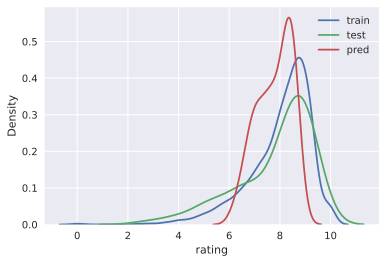

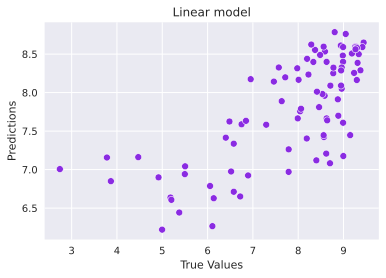

In [58]:
target_distr_linear(y_train, y_test, y_pred)   

In [59]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   1.22507502225118
RMSE:  1.106831072138463
R2:    0.4603968108612103
MAE:   0.8391511560507293
MedAE: 0.7028263196270306
------------------------------


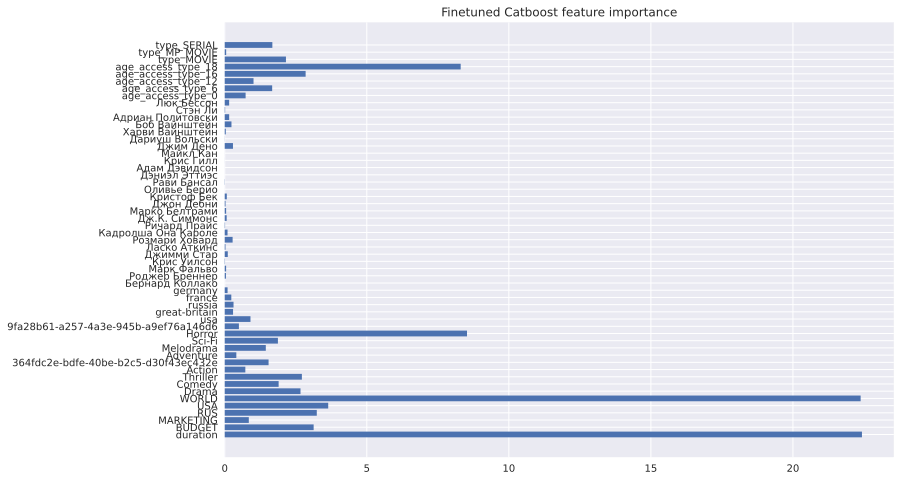

In [60]:
get_feature_imp(best_cat, train_dataset)

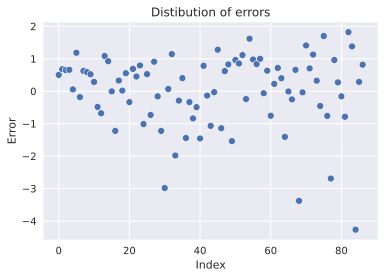

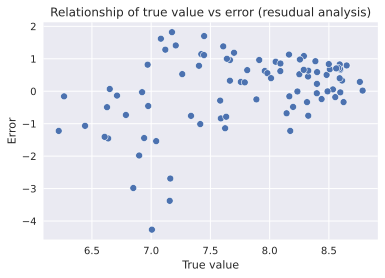

In [61]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

In [62]:
test_df['PREDS'] = y_pred.tolist()
test_df['TARGET'] = y_test.tolist()
test_df

,age_access_type,name,type,release_year,duration,element_uid,BUDGET,MARKETING,RUS,USA,...,Майкл Кан,Джим Дено,Дариуш Вольски,Харви Вайнштейн,Боб Вайнштейн,Адриан Политовски,Стэн Ли,Люк Бессон,PREDS,TARGET
10691,18,Милые обманщицы: Первородный грех,SERIAL,2022,17.184185,673a98a8-5d12-4a3d-9c50-d1d196a8fd96,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,8.480707,8.984211
10574,18,Время побеждать: Расцвет династии Лейкерс,SERIAL,2022,17.302886,ecde577f-39c1-49da-bce1-dc6eb6960130,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,8.507675,9.185185
10676,18,Хроники пышки,SERIAL,2022,16.558928,17f245d4-d2d2-46de-a974-d7cd427ad1b6,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,7.810944,8.460784
10641,18,Не оставляй меня,SERIAL,2022,17.044733,00de4f79-d52d-4d2c-871c-e6e8432cc3df,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,8.596926,9.258333
10675,18,Мы владеем этим городом,SERIAL,2022,16.831046,1bdf11b5-b9c1-4db6-bd70-c9f370fe2147,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,8.534053,8.589928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5651,16,Многоэтажка,MOVIE,2022,15.597220,19a61cc3-65ff-46ce-bf43-29c24a1cc9b6,NaN,NaN,5.793014,NaN,...,0,0,0,0,0,0,0,0,7.175774,8.996094
5612,18,Невидимый убийца,MOVIE,2022,15.684231,0d14e4b4-71ed-4409-9ebb-54a130e913c8,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,7.608499,8.990476
5518,16,Другое имя,MOVIE,2022,15.576811,69021740-65f7-430c-9c00-f2d6d9e9c702,NaN,NaN,10.364072,NaN,...,0,0,0,0,0,0,0,0,7.006304,2.739953
5269,16,RRR: Рядом ревет революция,MOVIE,2022,16.200597,1dbd646f-1c33-4584-b411-efc9da56c702,18.049617,NaN,10.485982,16.446375,...,0,0,0,0,0,0,0,0,8.761514,9.048994


# Other models

### knn imp

In [49]:
from sklearn.impute import KNNImputer

In [50]:
imputer = KNNImputer()

imputer.fit(X_train[['average_rating']])

KNNImputer()

In [51]:
train = imputer.transform(X_train[['average_rating']])
test = imputer.transform(X_test[['average_rating']])

In [52]:
X_train['average_rating'] = train

In [53]:
X_test['average_rating'] = test

# KNN Regressor

In [99]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [100]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [101]:
from sklearn.inspection import permutation_importance

def get_fi_knn(model,X_train, y_train, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    results = permutation_importance(model, X_train, y_train, scoring='neg_mean_absolute_error', n_repeats=1)

    importance = results.importances_mean
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(importance).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

In [102]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [66]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold

In [104]:
params = [
    {
        'n_neighbors': [i for i in range(2, 50, 2)],
        'weights': ['uniform', 'distance'],
        'leaf_size' : [2,5,10,30,50]
    }
]

In [117]:
knn_reg_model = KNeighborsRegressor()

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(knn_reg_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [119]:
%%time
gs.fit(X_train, y_train);

CPU times: user 214 ms, sys: 1.51 s, total: 1.72 s
Wall time: 1min


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=KNeighborsRegressor(), n_jobs=-1,
                   param_distributions=[{'leaf_size': [2, 5, 10, 30, 50],
                                         'n_neighbors': [2, 4, 6, 8, 10, 12, 14,
                                                         16, 18, 20, 22, 24, 26,
                                                         28, 30, 32, 34, 36, 38,
                                                         40, 42, 44, 46, 48],
                                         'weights': ['uniform', 'distance']}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [120]:
gs.best_params_

{'weights': 'uniform', 'n_neighbors': 48, 'leaf_size': 2}

In [121]:
knn_reg_model = KNeighborsRegressor(leaf_size=2, n_neighbors=48, weights='uniform')
knn_reg_model.fit(X_train, y_train)

KNeighborsRegressor(leaf_size=2, n_neighbors=48)

In [122]:
pred = knn_reg_model.predict(X_test)

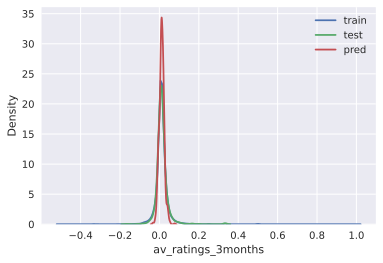

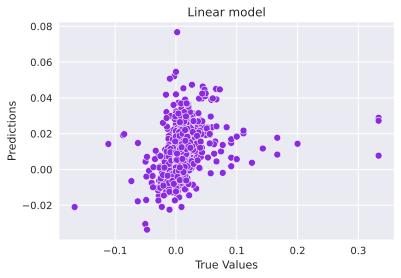

In [123]:
target_distr_linear(y_train, y_test, pred)   

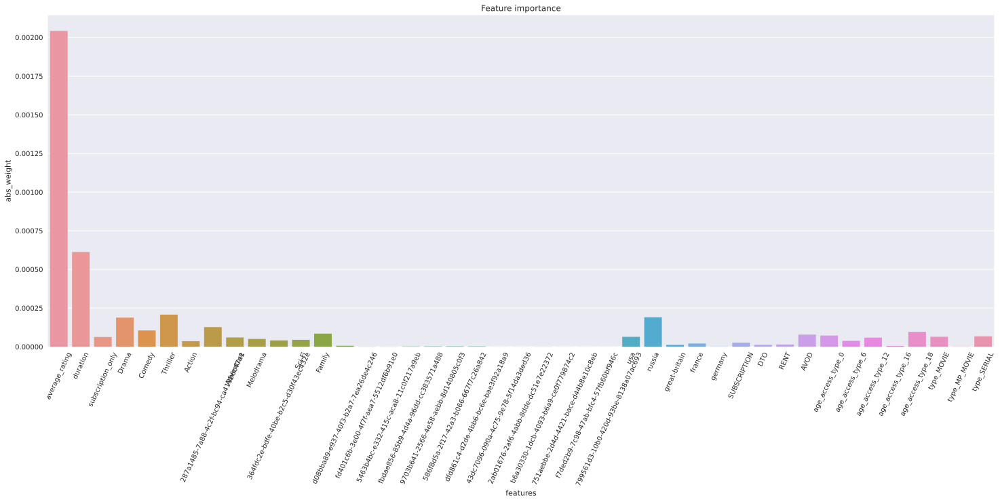

In [124]:
get_fi_knn(knn_reg_model, X_train, y_train)

**Detecting heteroscedasticity**

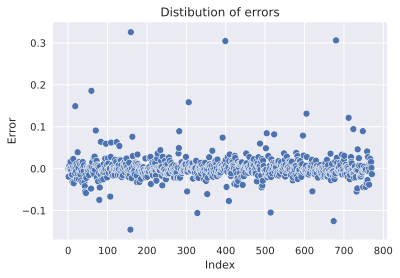

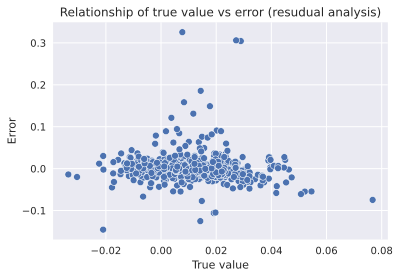

In [125]:
errors = y_test - pred
draw_res_analys(errors, pred)

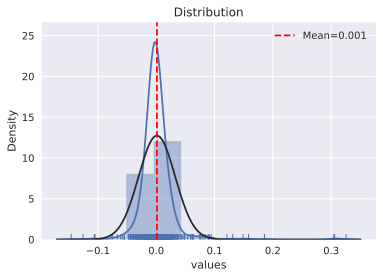

In [126]:
error = y_test - pred
draw_histogram(error)

In [127]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.0009825993417867057
RMSE:  0.03134644065578588
R2:    0.09153854082187962
MAE:   0.01600137885488513
MedAE: 0.00941467907690283
------------------------------


## Boosting Regressor - XGBRegressor

In [79]:
def get_feature_importance(model, top15=None):
    plt.figure(figsize=(12,8))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(model.feature_importances_).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=90)
    plt.show()

In [62]:
!pip install xgboost

In [63]:
import xgboost as xgb

In [64]:
params = [
              {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:squarederror'],
              'learning_rate': [.03, 0.05, .07],
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500, 1000]}
        ]

In [67]:
xgbr_model = xgb.XGBRegressor() 

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(xgbr_model, params, 
#                   n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [68]:
%%time
gs.fit(X_train, y_train)

CPU times: user 18min 2s, sys: 5.01 s, total: 18min 7s
Wall time: 4min 49s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, gamma=None,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_const...
                                          predictor=None, random_state=None,
                                          reg_alpha=None, reg_lambda=None, ...),
                   param_distributions=[{'colsample_bytree': [0.7],
                                         'learning_rate': [0.03, 0.05, 0.07],
                                         'max_depth': [5, 6, 7],
                                         'min_child_weight': [4],
                                         'n_estimators': [500, 1000],
                                         'nthread': [4],
                                         'objective': ['reg:squarederror'],
                                         'subsample': [0.7]}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [69]:
gs.best_params_

{'subsample': 0.7,
 'objective': 'reg:squarederror',
 'nthread': 4,
 'n_estimators': 500,
 'min_child_weight': 4,
 'max_depth': 6,
 'learning_rate': 0.03,
 'colsample_bytree': 0.7}

In [70]:
xgbr_model = xgb.XGBRegressor(colsample_bytree=0.7,
                              learning_rate=0.03,
                              max_depth=6,
                              min_child_weight=4,
                              n_estimators=500,
                              nthread=4,
                              objective ='reg:squarederror',
                              subsample=0.7) 
xgbr_model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.03, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=4,
             missing=nan, monotone_constraints='()', n_estimators=500, n_jobs=4,
             nthread=4, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, ...)

In [71]:
pred = xgbr_model.predict(X_test)

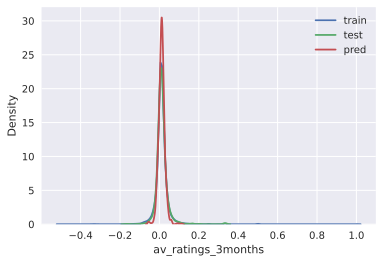

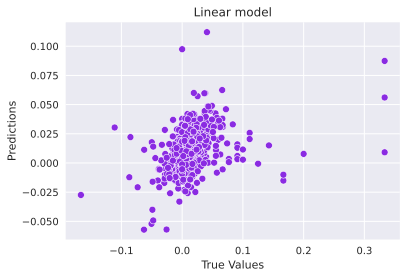

In [72]:
target_distr_linear(y_train, y_test, pred)   

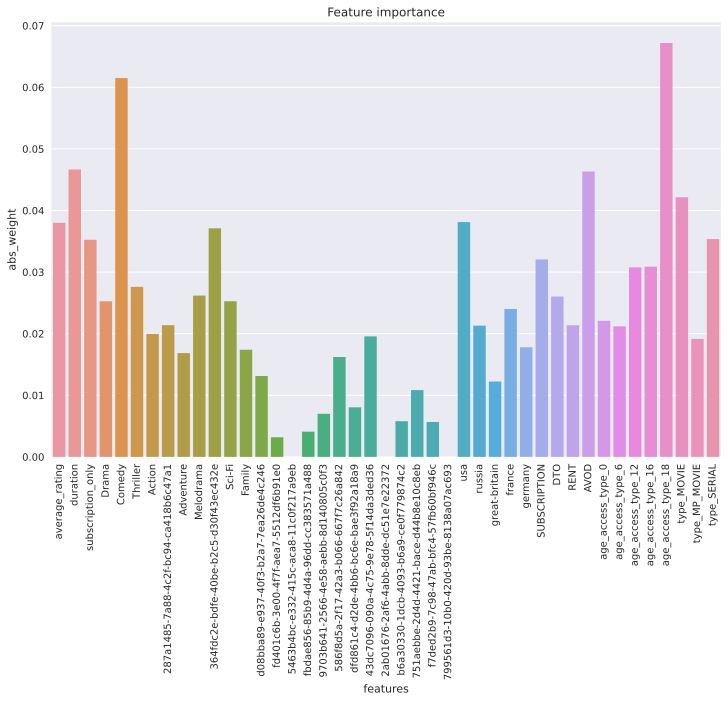

In [80]:
get_feature_importance(xgbr_model)

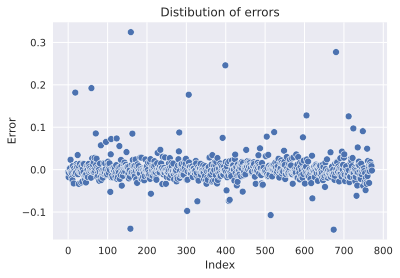

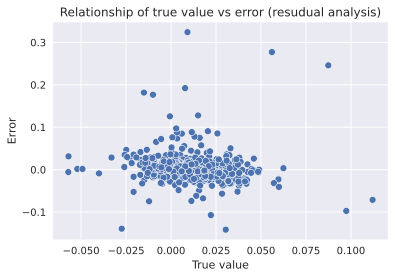

In [74]:
errors = y_test - pred
draw_res_analys(errors, pred) 

In [75]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.0009493734645506103
RMSE:  0.030811904591417427
R2:    0.12225749984488343
MAE:   0.016132311409122926
MedAE: 0.009577549323280171
------------------------------


## Random Forest

In [54]:
from sklearn.ensemble import RandomForestRegressor

In [55]:
params = [
    {
        'max_depth': range(20, 50),
        'n_estimators': range(100, 161)

    }
]

In [58]:
rf_model = RandomForestRegressor(random_state=42)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(rf_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [59]:
%%time
gs.fit(X_train, y_train);

CPU times: user 7.43 s, sys: 996 ms, total: 8.42 s
Wall time: 4min 21s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
                   param_distributions=[{'max_depth': range(20, 50),
                                         'n_estimators': range(100, 161)}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [60]:
gs.best_params_

{'n_estimators': 158, 'max_depth': 20}

In [62]:
rf_model = RandomForestRegressor(random_state=42, max_depth=20, n_estimators=158)
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=20, n_estimators=158, random_state=42)

In [63]:
pred = rf_model.predict(X_test)

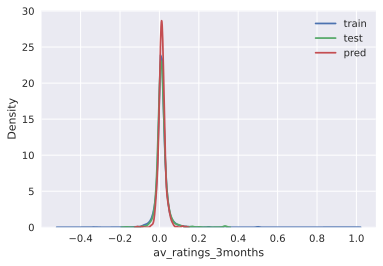

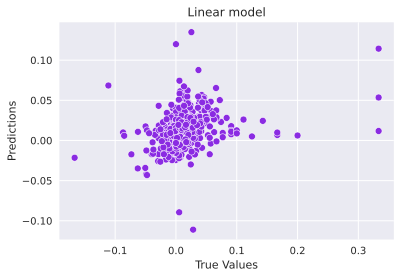

In [64]:
target_distr_linear(y_train, y_test, pred)   

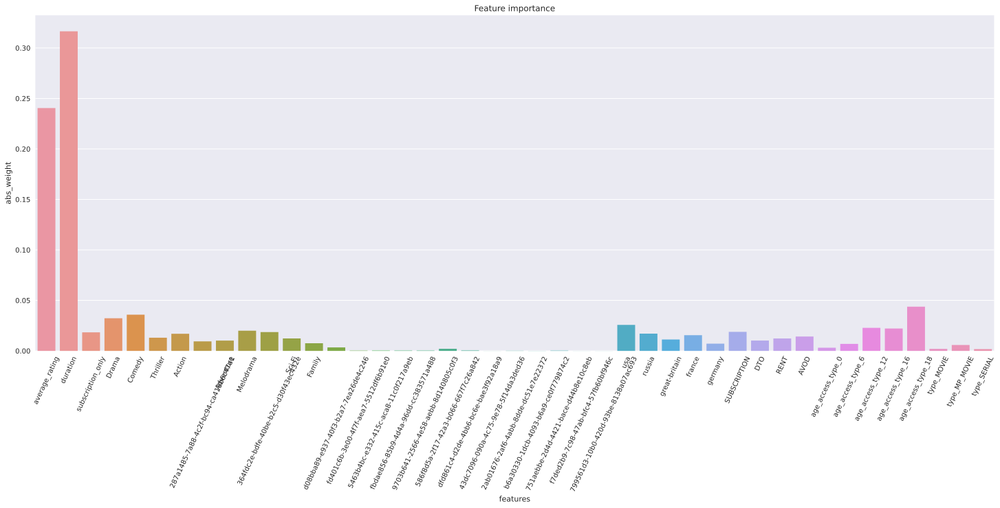

In [67]:
get_feature_importance(rf_model)

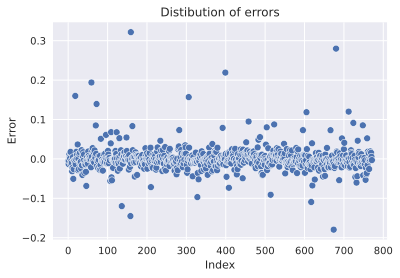

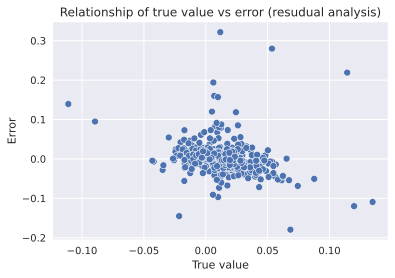

In [68]:
errors = y_test - pred

draw_res_analys(errors, pred) # 

In [69]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.0010274475649188607
RMSE:  0.032053822937660036
R2:    0.050074150916937454
MAE:   0.017227748754344685
MedAE: 0.009651932018210373
------------------------------


## SVM Regressor

In [70]:
from sklearn.svm import LinearSVR

In [71]:
params = [
    {
        'C': [0.001,0.01,0.1,1,10,100,1000],
        'tol' : [1e-4, 1e-3]
    }
]

In [72]:
svr_model = LinearSVR(random_state=42)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(svr_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [73]:
%%time
gs.fit(X_train, y_train);

CPU times: user 468 ms, sys: 1.25 s, total: 1.72 s
Wall time: 1min 5s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=LinearSVR(random_state=42), n_jobs=-1,
                   param_distributions=[{'C': [0.001, 0.01, 0.1, 1, 10, 100,
                                               1000],
                                         'tol': [0.0001, 0.001]}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [74]:
gs.best_params_

{'tol': 0.0001, 'C': 0.001}

In [75]:
svr_model =  LinearSVR(C=0.001, tol=0.0001, random_state=42)
svr_model.fit(X_train, y_train)

LinearSVR(C=0.001, random_state=42)

In [76]:
pred = svr_model.predict(X_test)

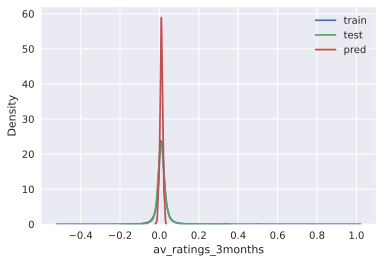

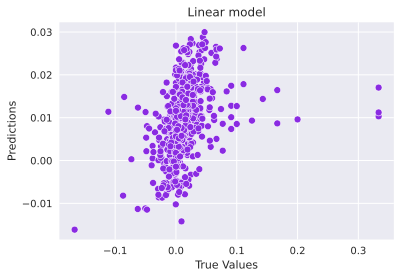

In [77]:
target_distr_linear(y_train, y_test, pred)  

In [78]:
def get_feat_imp_coef(model, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(model.coef_).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

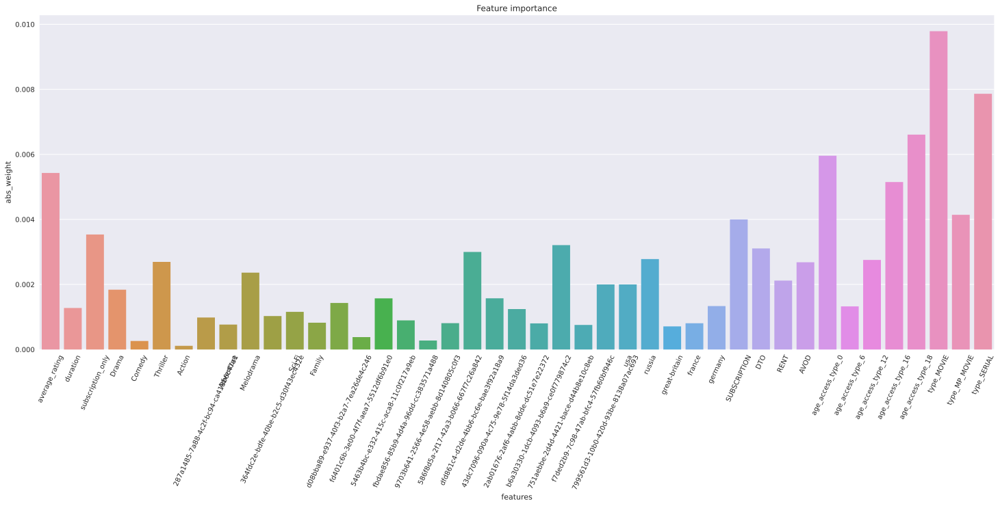

In [79]:
get_feat_imp_coef(svr_model)

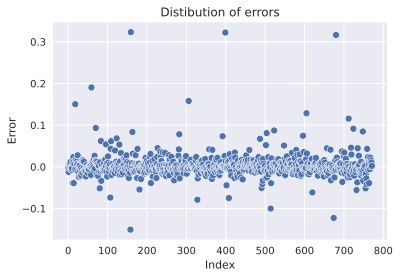

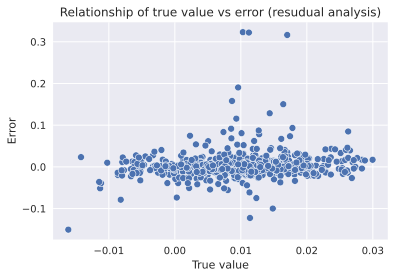

In [80]:
errors = y_test - pred
draw_res_analys(errors, pred)

In [81]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.0009712271432144664
RMSE:  0.031164517374964534
R2:    0.10205269818963658
MAE:   0.015242461147090687
MedAE: 0.00811683502320917
------------------------------
